# NGC 3201 Analysis

In [3]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
%matplotlib inline 

In [4]:
target = 'NGC3201'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '10:17:36.82'
cluster_dec = '-46:24:44.9'

## Cluster Snapshot

In [3]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

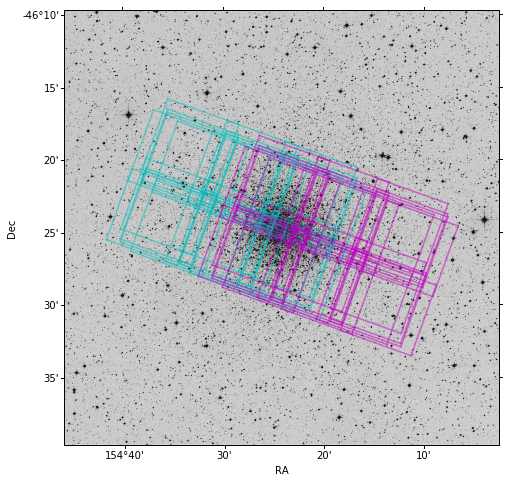

In [4]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
mp.show()

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC3201...
Finished reading optical catalog.


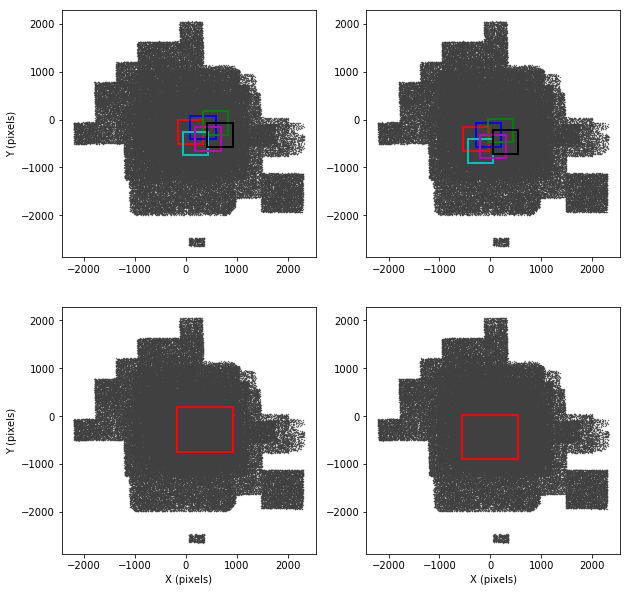

In [5]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax3.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax4.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'I1-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'I2-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r', 'b', 'g', 'c', 'm', 'k']
for ind in range(len(I1cuts['xmin'])):
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymax'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmin'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmax'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
ax1.set_ylabel('Y (pixels)')
for ind in range(len(I1cuts['xmin'])):
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymax'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmin'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmax'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)

## Mosaics
I2mcuts = np.loadtxt(folder+'I2-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I1mcuts = np.loadtxt(folder+'I1-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r']
ind=0
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymax'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmin']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmax'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.set_xlabel('X (pixels)')
ax3.set_ylabel('Y (pixels)')
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymax'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmin']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmax'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.set_xlabel('X (pixels)')
mp.show()

#### Check transformed catalogs

Reading optical catalog for NGC3201...
Finished reading optical catalog.


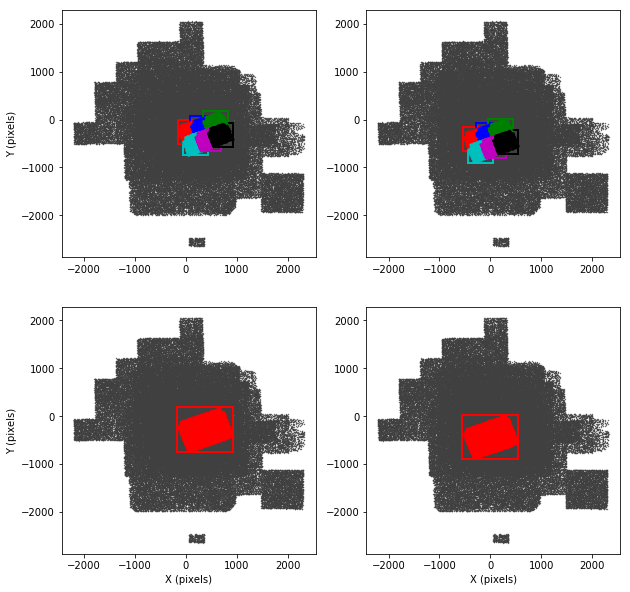

In [6]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax3.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax4.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'I1-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'I2-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r', 'b', 'g', 'c', 'm', 'k']
for ind in range(len(I1cuts['xmin'])):
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmax'][ind]], [I1cuts['ymax'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmin'][ind], I1cuts['xmin'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax1.plot([I1cuts['xmax'][ind], I1cuts['xmax'][ind]], [I1cuts['ymin'][ind], I1cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
ax1.set_ylabel('Y (pixels)')
for ind in range(len(I1cuts['xmin'])):
    IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I1_field'+str(ind+1)+'.mag')
    files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I1-f'+str(ind+1)+'.mch')
    x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
    y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
    ax1.plot(x, y, '.', markersize=1.8, color=colors[ind])
for ind in range(len(I1cuts['xmin'])):
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymin'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmax'][ind]], [I2cuts['ymax'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmin'][ind], I2cuts['xmin'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
    ax2.plot([I2cuts['xmax'][ind], I2cuts['xmax'][ind]], [I2cuts['ymin'][ind], I2cuts['ymax'][ind]],
        '-', color=colors[ind], linewidth=2)
for ind in range(len(I2cuts['xmin'])):
    IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I2_field'+str(ind+1)+'.mag')
    files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I2-f'+str(ind+1)+'.mch')
    x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
    y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
    ax2.plot(x, y, '.', markersize=1.8, color=colors[ind])
    
## Mosaics
I2mcuts = np.loadtxt(folder+'I2-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I1mcuts = np.loadtxt(folder+'I1-mosaic-catalog-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

colors=['r']
ind=0
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmax']], [I1mcuts['ymax'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmin'], I1mcuts['xmin']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.plot([I1mcuts['xmax'], I1mcuts['xmax']], [I1mcuts['ymin'], I1mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax3.set_xlabel('X (pixels)')
ax3.set_ylabel('Y (pixels)')
IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I1_mosaic.mag')
files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I1-mosaics.mch')
x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
ax3.plot(x, y, '.', markersize=1.8, color=colors[ind])
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymin']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmax']], [I2mcuts['ymax'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmin'], I2mcuts['xmin']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.plot([I2mcuts['xmax'], I2mcuts['xmax']], [I2mcuts['ymin'], I2mcuts['ymax']],
    '-', color=colors[ind], linewidth=2)
ax4.set_xlabel('X (pixels)')
IRids, IRx, IRy, IRmag, IRerr = read_dao.read_mag(folder+'I2_mosaic.mag')
files, x_off, y_off, transform, dof = read_dao.read_mch(folder+'op-I2-mosaics.mch')
x = float(x_off[1])+float(transform[1][0])*IRx+float(transform[1][1])*IRy
y = float(y_off[1])+float(transform[1][2])*IRx+float(transform[1][3])*IRy
mp.plot(x, y, '.', markersize=1.8, color=colors[ind])
mp.show()

# Calibration

In [8]:
calibration.find_stars_in_cat(optical_dir, target, 'I1', data_dir=folder)
calibration.find_stars_in_cat(optical_dir, target, 'I2', data_dir=folder)

Reading optical catalog for NGC3201...
Finished reading optical catalog.
Writing files...
Reading optical catalog for NGC3201...
Finished reading optical catalog.
Writing files...


### Go to IDL and run aperture photometry script before the following steps

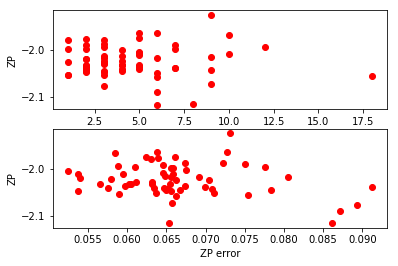

Maximum number of neighbors?: 5
Maximum standard deviation?:0.065
18 final calibration stars.
Mean, median zero point and standard deviation:
-2.02102971144 -2.02879613095 0.0243649129442


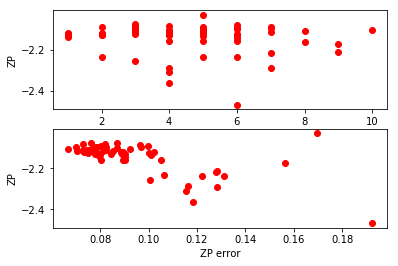

Maximum number of neighbors?: 5
Maximum standard deviation?:0.1
17 final calibration stars.
Mean, median zero point and standard deviation:
-2.12187331396 -2.12256521739 0.00737345375311


In [5]:
calibration.find_zp('I1', verbose=0, data_dir=folder)
calibration.find_zp('I2', verbose=0, data_dir=folder)

In [6]:
calibration.apply_calibration('I1', -2.02, data_dir=folder)
calibration.apply_calibration('I2', -2.11, data_dir=folder)

## MIR catalog

In [7]:
analysis_routines.make_mir_catalog(['I1', 'I2'], target, ids, data_dir=folder)

In [3]:
analysis_routines.merge_catalogs(target, optical_dir, folder)

Reading optical catalog for NGC3201...
Finished reading optical catalog.
Reading MIR catalog for NGC3201...


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in less
/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less


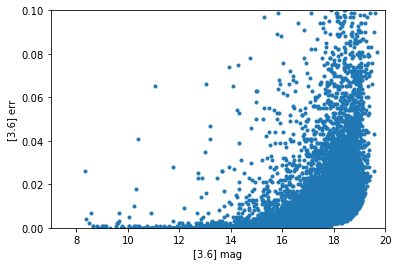

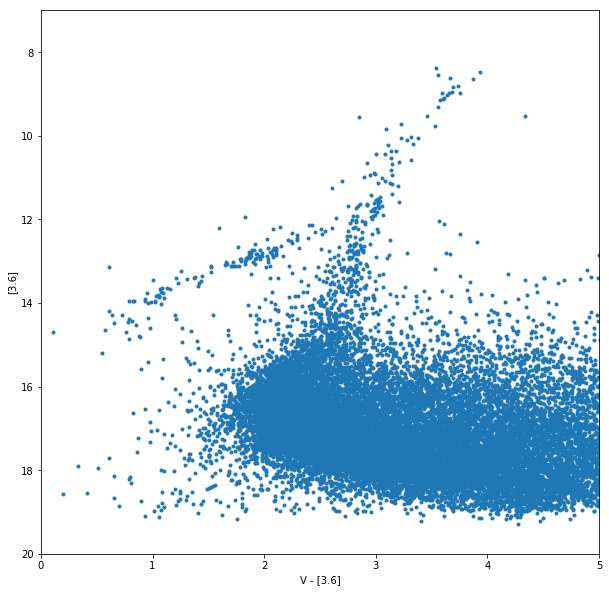

In [5]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data, dist = analysis_routines.read_merged_catalog(folder, center_ra, center_dec)

thres = 500
color = catalog_data['V'][dist < thres] - catalog_data['3.6'][dist < thres]
mag = catalog_data['3.6'][dist < thres]
err = catalog_data['3.6er'][dist < thres]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.plot(mag, err, '.')
ax1.set_ylim((0,0.1))
ax1.set_xlim((7,20))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 0.02]
good_color = color[err < 0.02]

scale = dist[dist < thres]
fig2 = mp.figure(figsize=(10,10))
ax2 = fig2.add_subplot(111)
ax2.scatter(good_color, good_mag, marker='.')
ax2.set_ylim((20,7))
ax2.set_xlim((0,5))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

# Variable stars

In [ ]:
# Find all stars identified as possible variables in optical catalog and list them in PeterIDs.txt

center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
optical.find_variables_fnl(optical_dir, target, center_ra, center_dec, data_dir=folder)

##  Generate MIR light curves matching optical ID numbers  

In [46]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder)

#### Phase MIR light curves

In [49]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'lcvs/mir/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=1)
    except:
        print lcv +' not found.'

V27 not found.
V30 not found.
V46 not found.
V52 not found.
V53 not found.
V54 not found.
V55 not found.
V60 not found.
V61 not found.
V62 not found.
V63 not found.
V64 not found.
V66 not found.
V69 not found.
V72 not found.
V80 not found.
V84 not found.


#### Create figure with all bands phased together

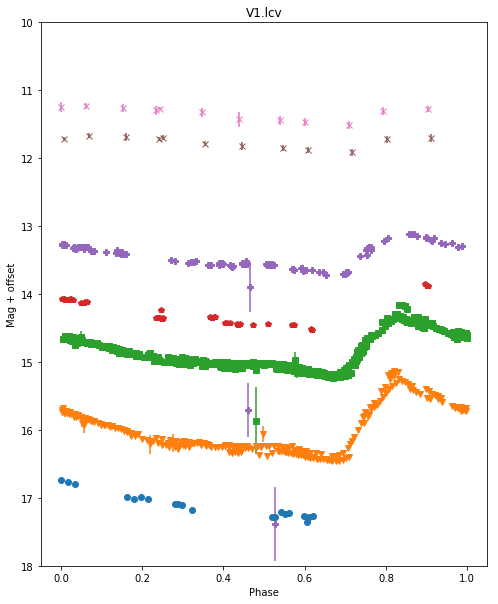

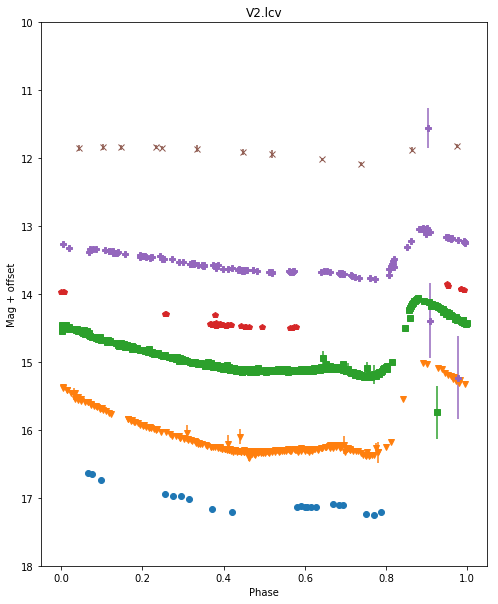

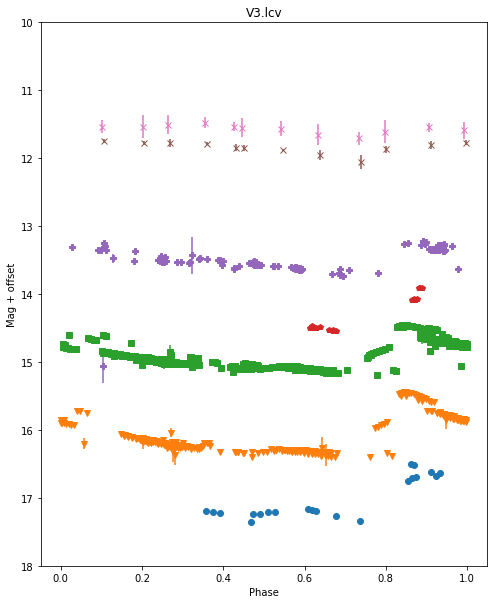

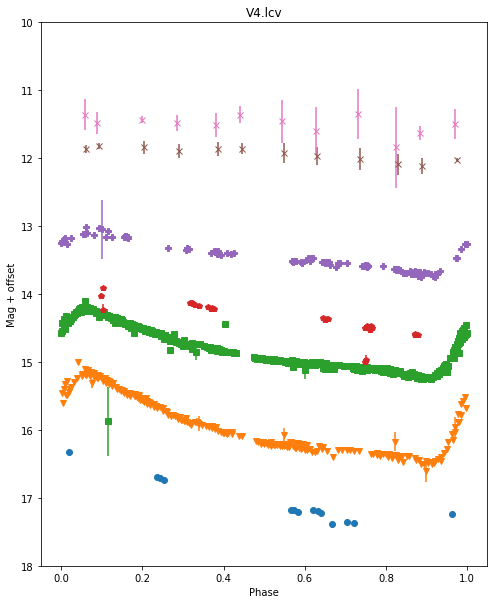

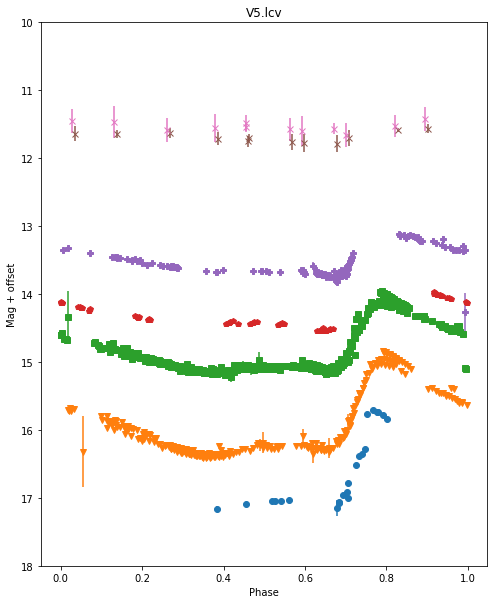

...

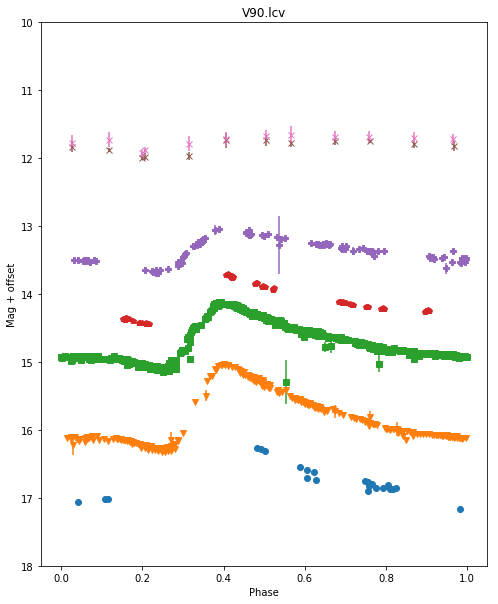

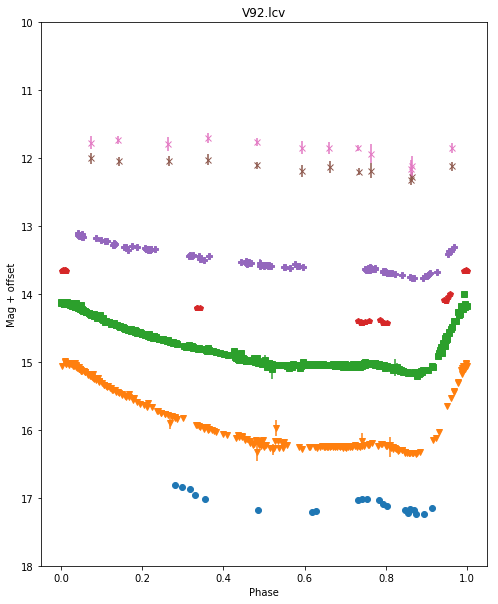

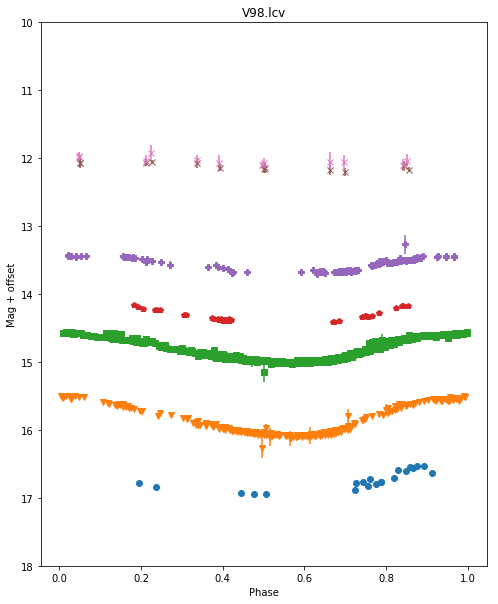

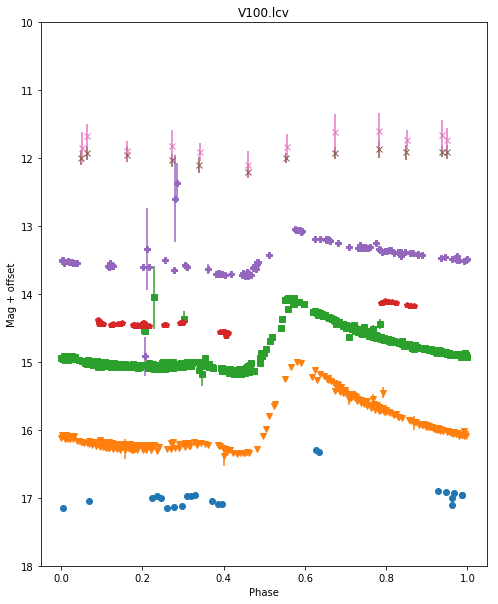

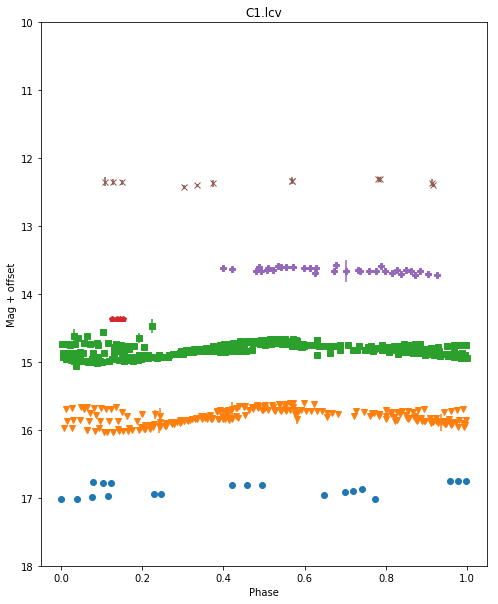

In [51]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]):
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
        else:
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder)
    except:
        print star, ' not found.'
        continue

## Fit light curves

V1
/Volumes/Annie/CRRP/NGC3201/lcvs/V1.phased


lightcurves.py:1024: RuntimeWarning: overflow encountered in exp
  weight = err_copy * np.exp(dist**2/sigma**2)


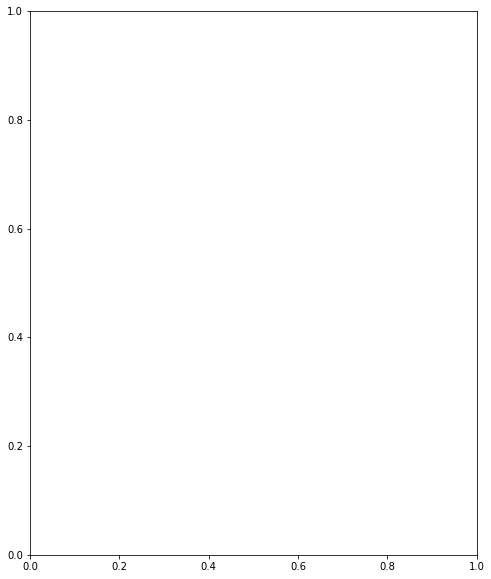

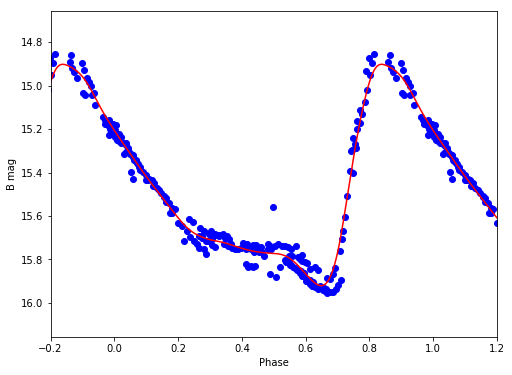

B 15.4539486875 1.01888226242


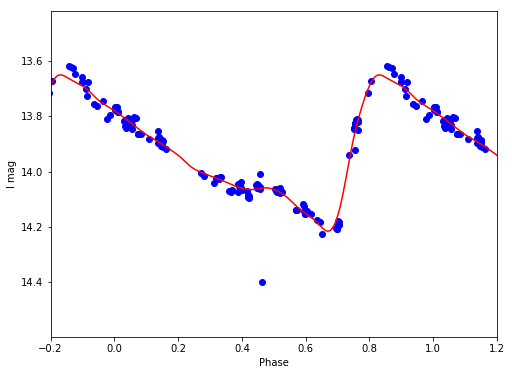

I 13.9279632303 0.566023856865


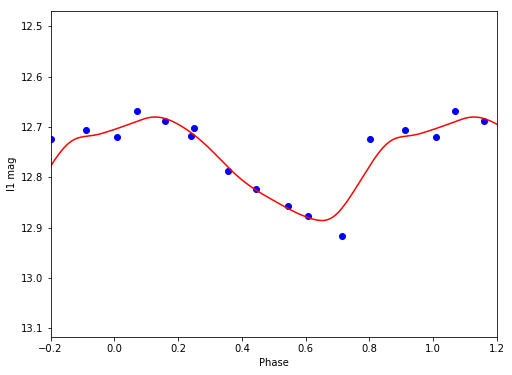

I1 12.7702487368 0.205686719755


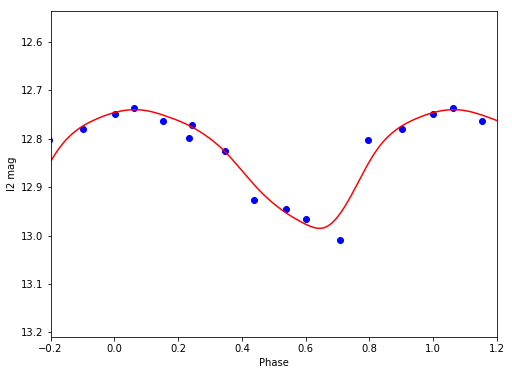

I2 12.8379563187 0.244892206406


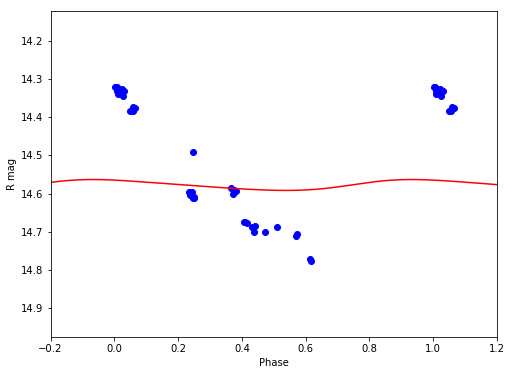

R 14.5780669745 0.0286197395169


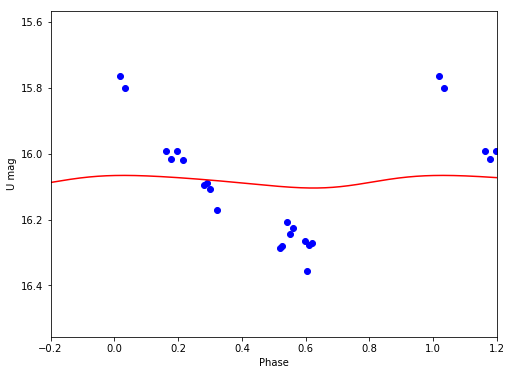

U 16.0834747497 0.0383085616632


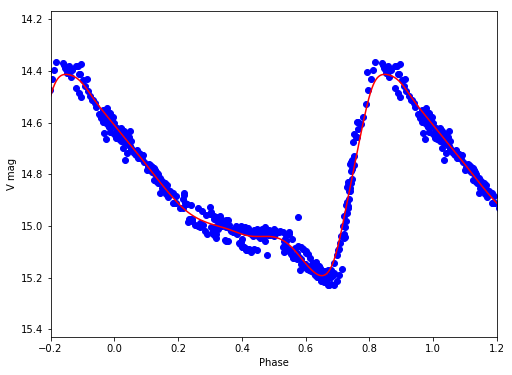

V 14.8260031102 0.778813461246
V2
/Volumes/Annie/CRRP/NGC3201/lcvs/V2.phased


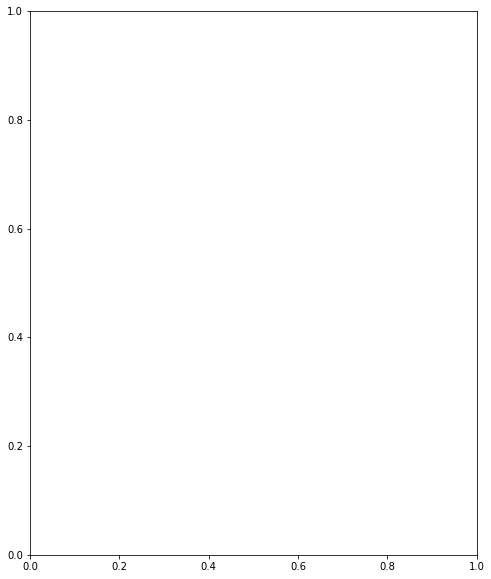

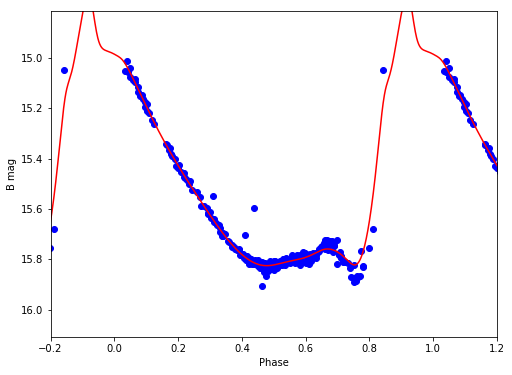

B 15.4307974132 1.07631031308


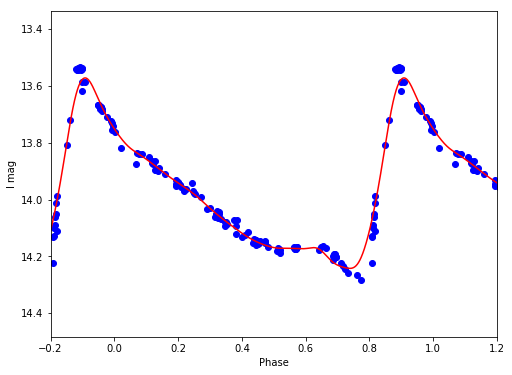

I 13.9779519959 0.67095979125


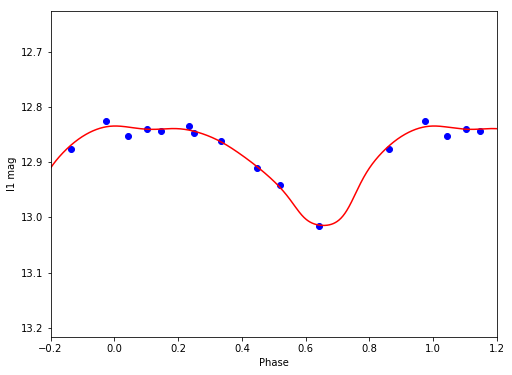

I1 12.8945653295 0.179857606883


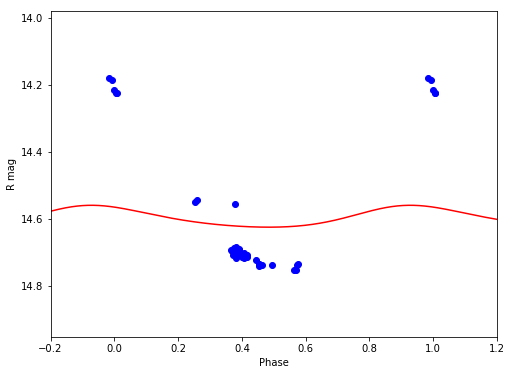

R 14.5956593337 0.06516255359


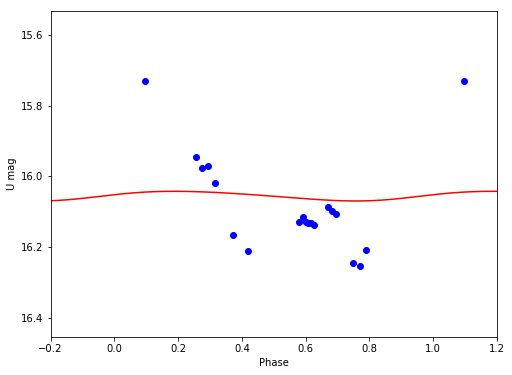

U 16.0551939617 0.0274009288019


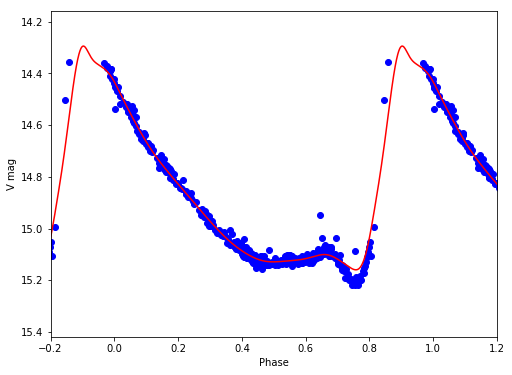

V 14.8345489699 0.865672237322
V3
/Volumes/Annie/CRRP/NGC3201/lcvs/V3.phased


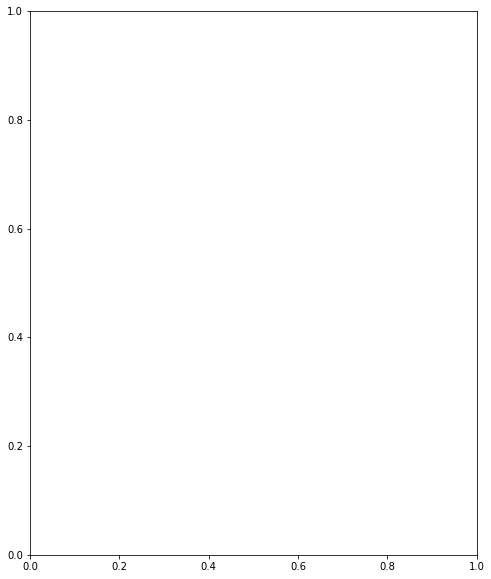

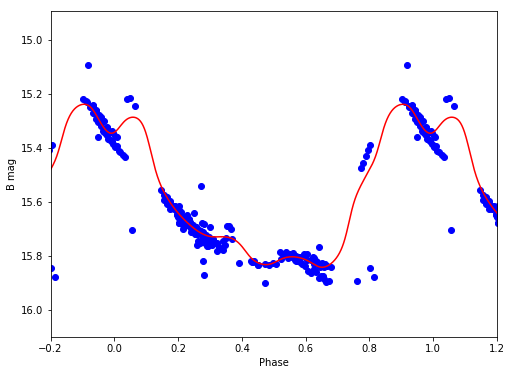

B 15.5760784282 0.603796567865


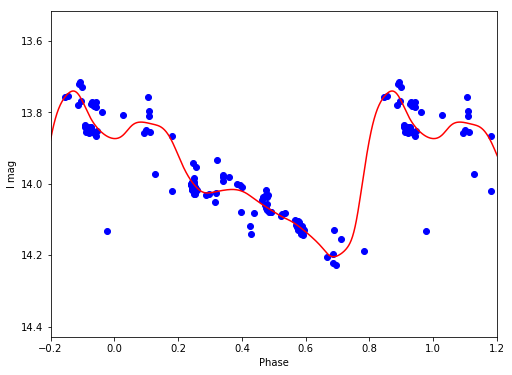

I 13.9660576802 0.46404101299


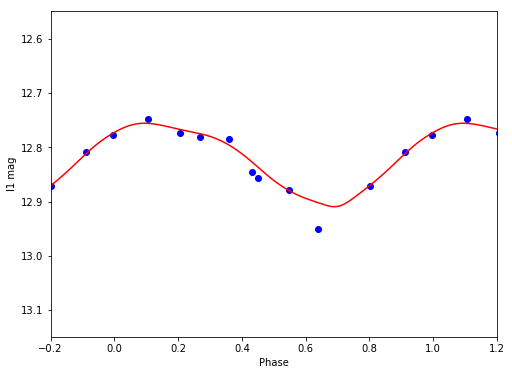

I1 12.8222501149 0.154298008542


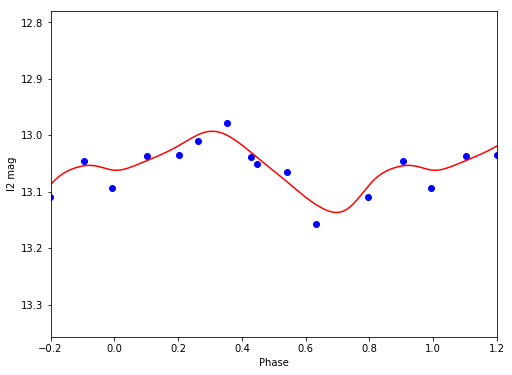

I2 13.057907592 0.143893668202


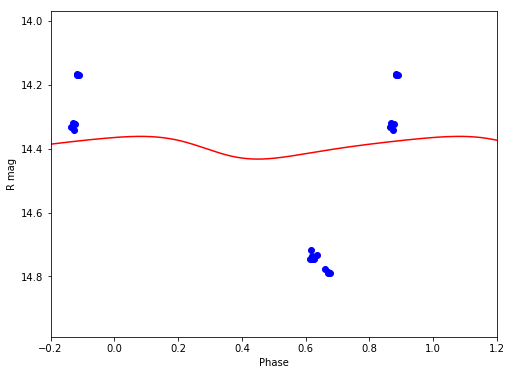

R 14.3931939971 0.0711551332355


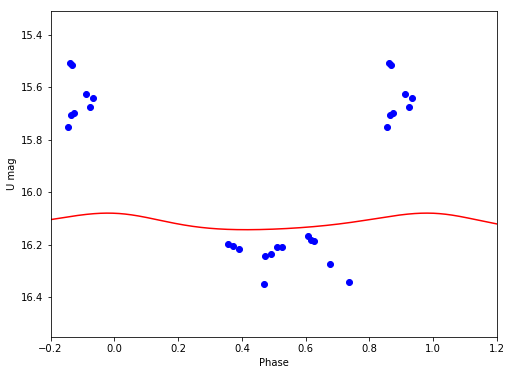

U 16.1165279599 0.0631407903026


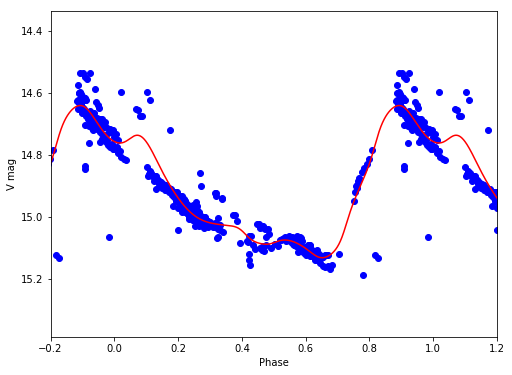

V 14.9134761818 0.490495949448
V4
/Volumes/Annie/CRRP/NGC3201/lcvs/V4.phased


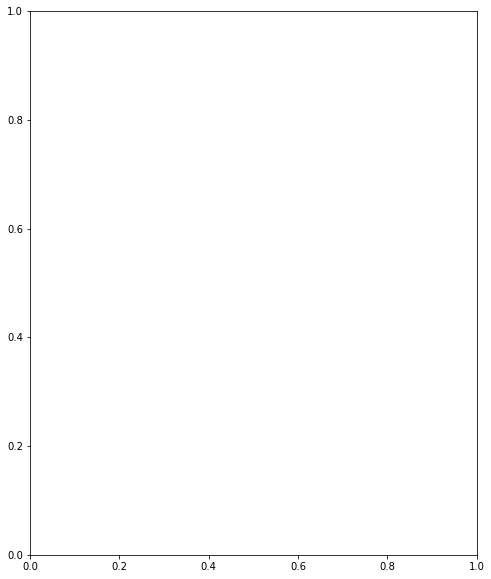

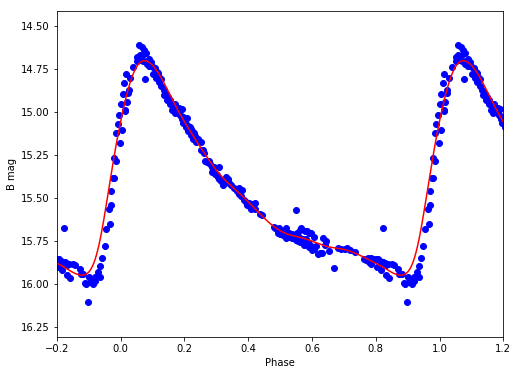

B 15.3997163182 1.24593527117


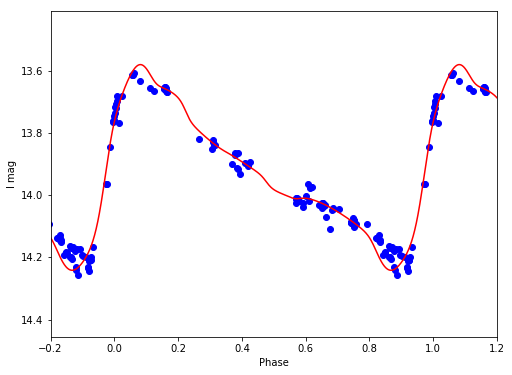

I 13.904582868 0.660920421306


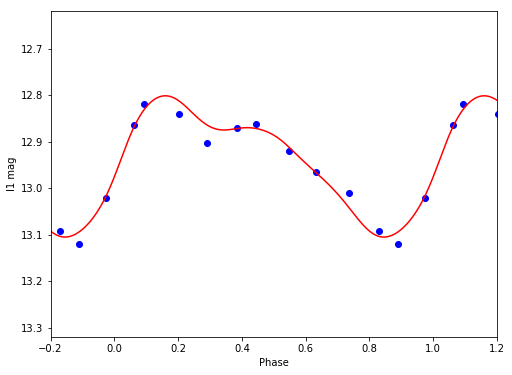

I1 12.9332114731 0.304094697706


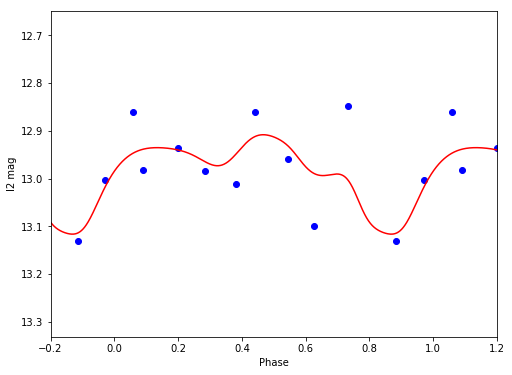

I2 12.9815551862 0.208184143051


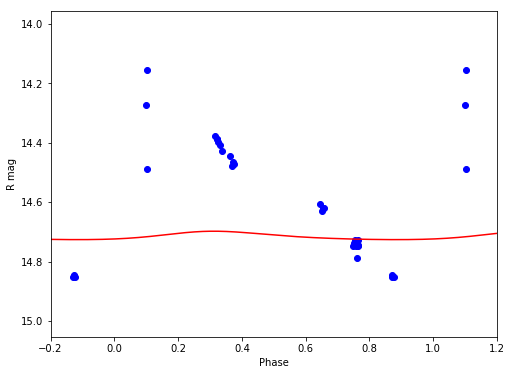

R 14.7137830258 0.0283084099551


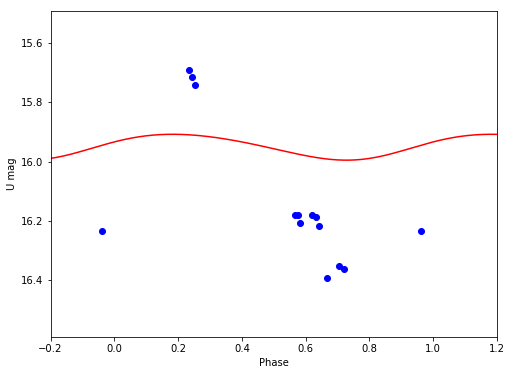

U 15.9484261929 0.0874497061198


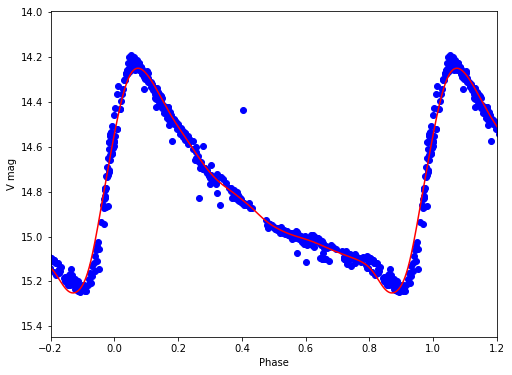

V 14.7848471307 1.00243216001
V5
/Volumes/Annie/CRRP/NGC3201/lcvs/V5.phased


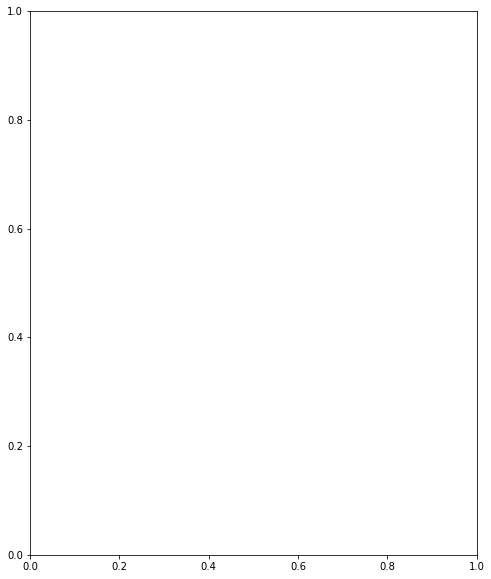

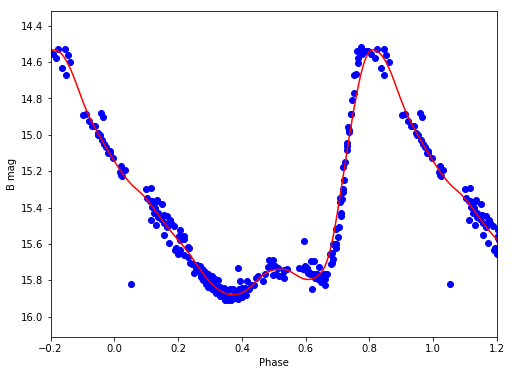

B 15.315756162 1.34814454466


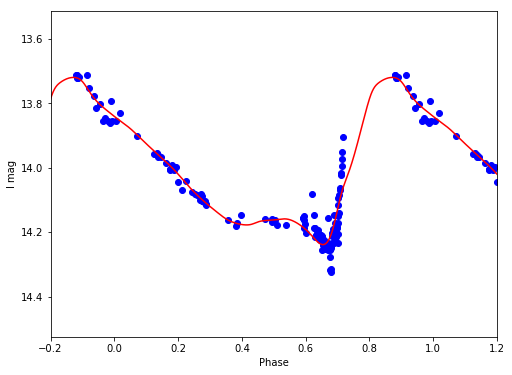

I 13.9982269427 0.518743558971


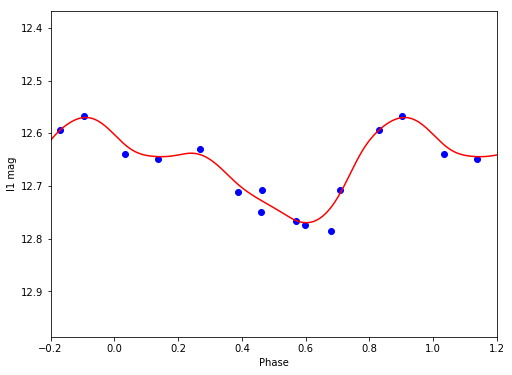

I1 12.6635220923 0.19968475496


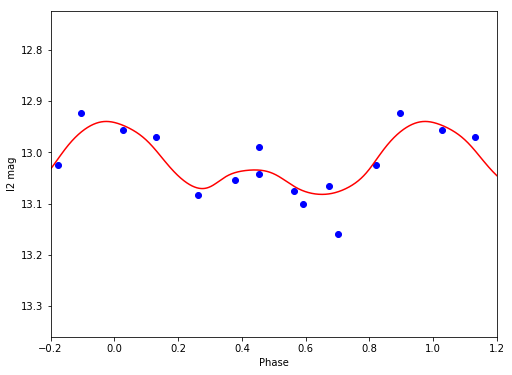

I2 13.0240351282 0.142429528944


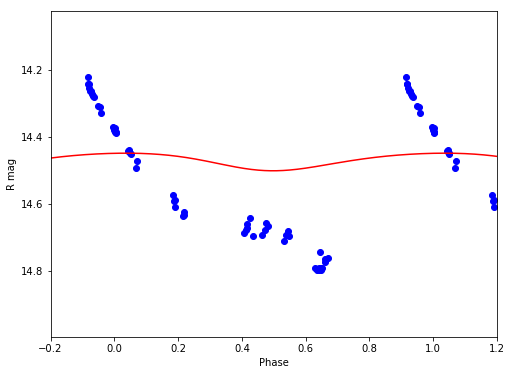

R 14.4711525725 0.0526807572631


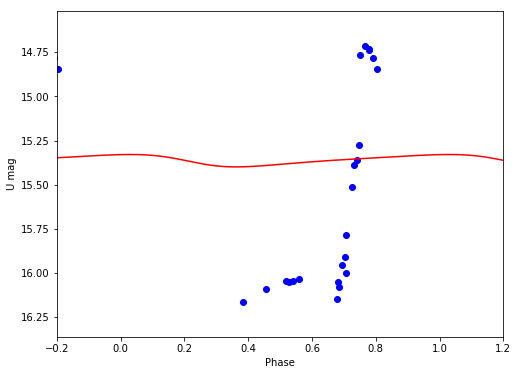

U 15.3612528884 0.0704365260561


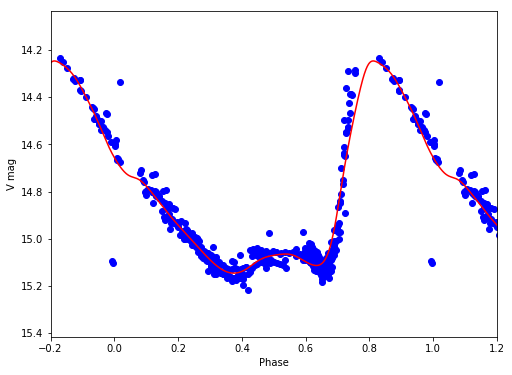

V 14.785694241 0.900427912024
V6
/Volumes/Annie/CRRP/NGC3201/lcvs/V6.phased


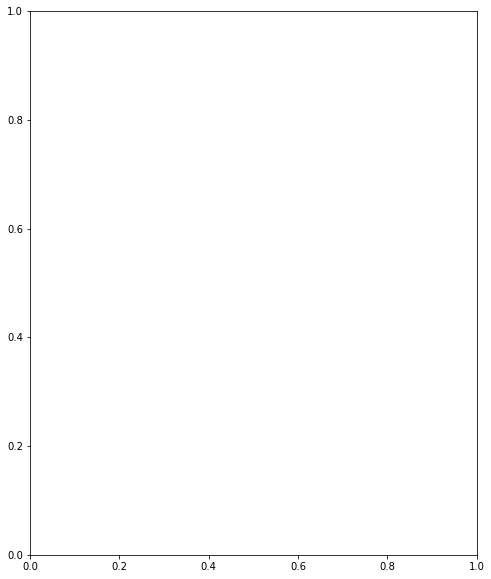

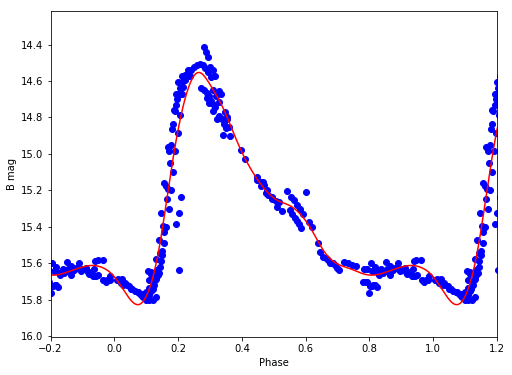

B 15.2709108522 1.27409491525


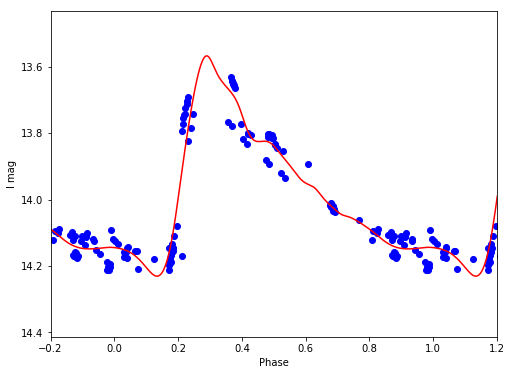

I 13.9566215893 0.663966206508


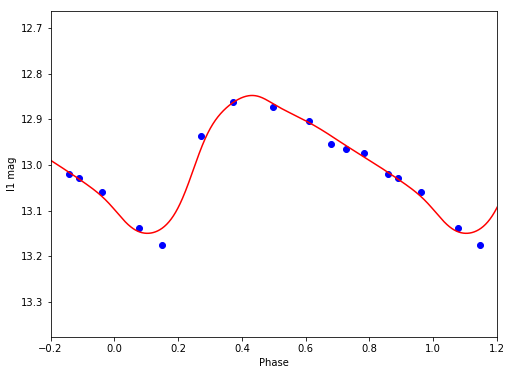

I1 12.9809166382 0.301775316121


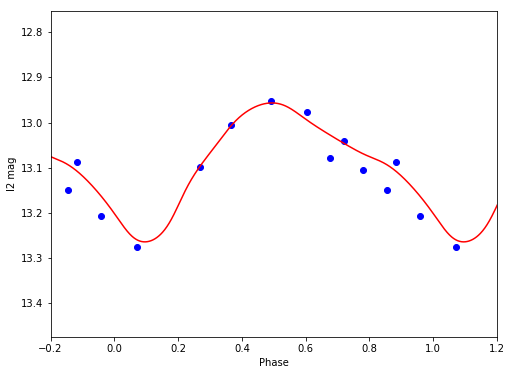

I2 13.0839489362 0.308010801288


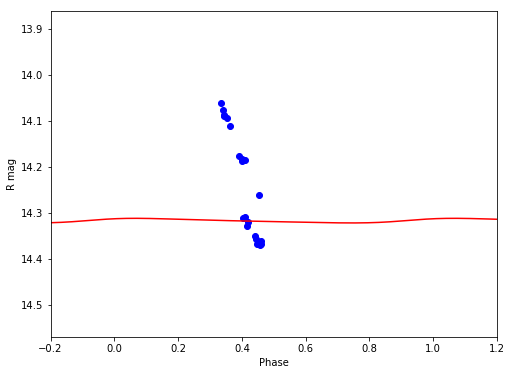

R 14.3178366079 0.0100434686188


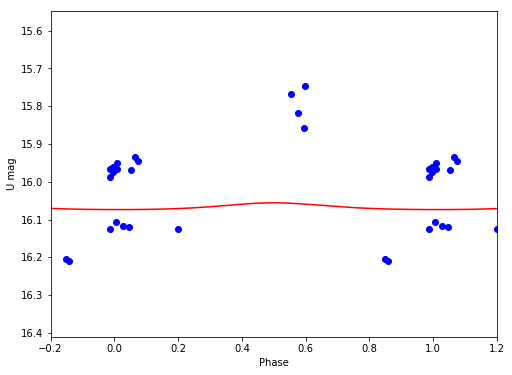

U 16.0664935587 0.0179351048338


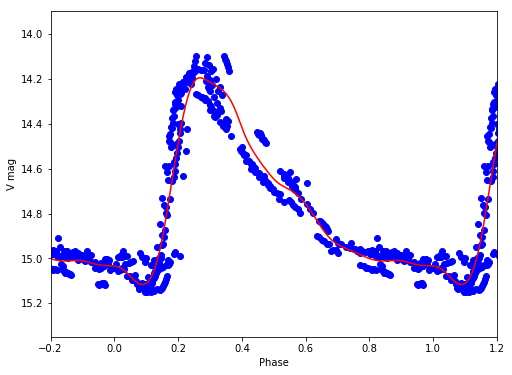

V 14.7174141388 0.921231299394
V7
/Volumes/Annie/CRRP/NGC3201/lcvs/V7.phased


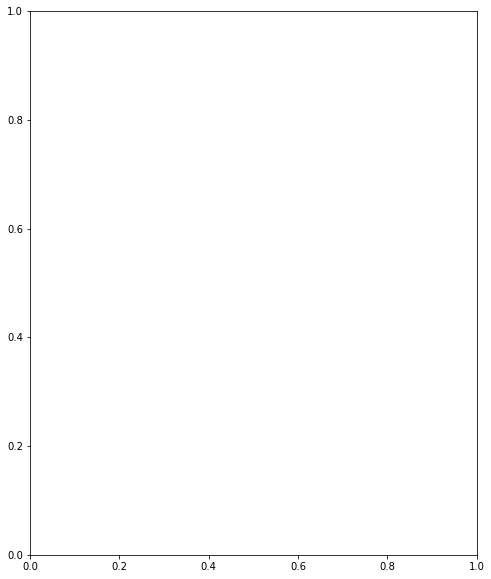

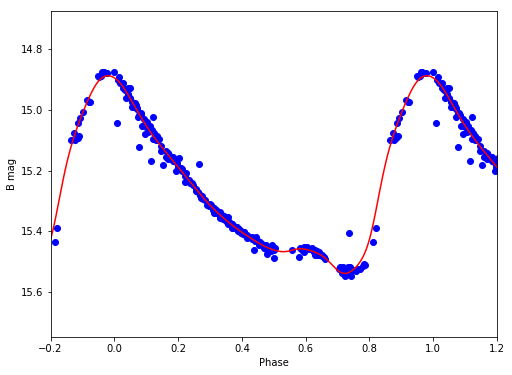

B 15.2509057403 0.649116169281


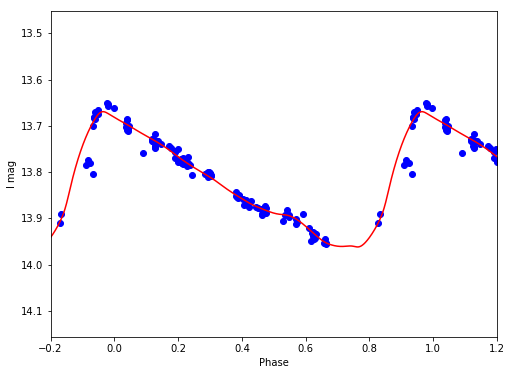

I 13.8248085324 0.292461710513


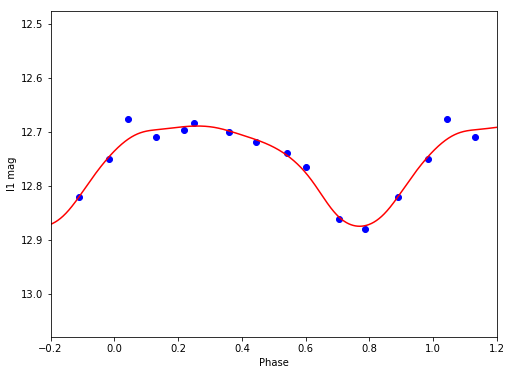

I1 12.7545383696 0.18530577445


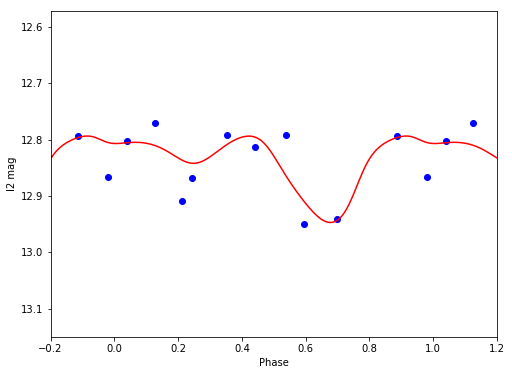

I2 12.8376482983 0.153457172248


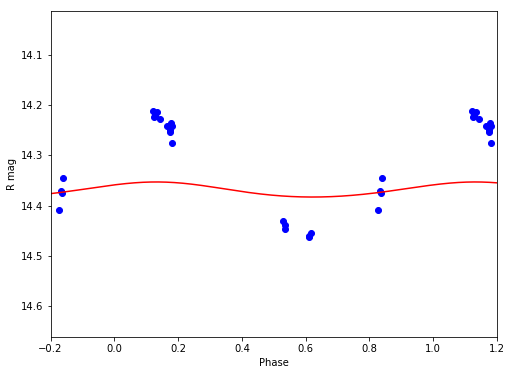

R 14.3688843321 0.0300787034856


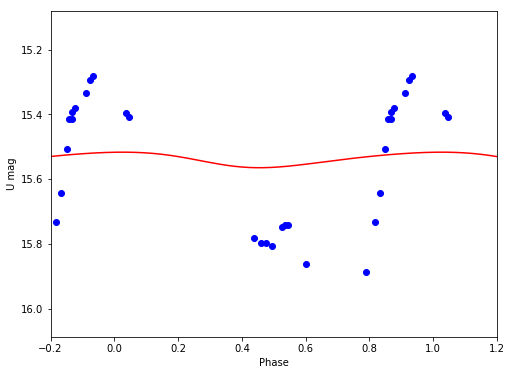

U 15.5379812982 0.0479391705336


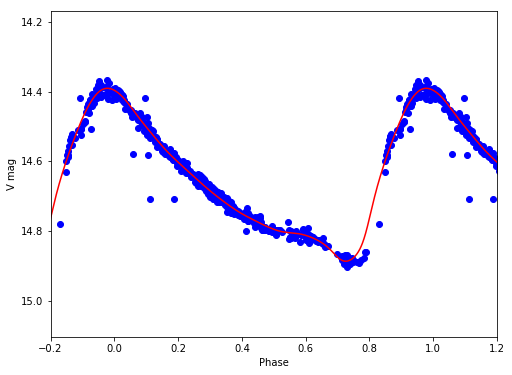

V 14.6540325109 0.495755833405
V8
/Volumes/Annie/CRRP/NGC3201/lcvs/V8.phased


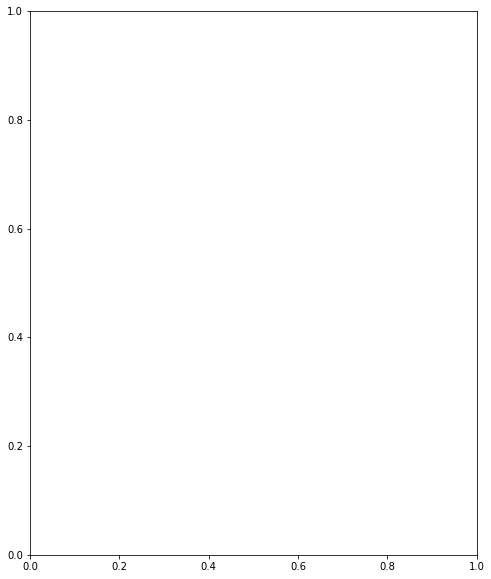

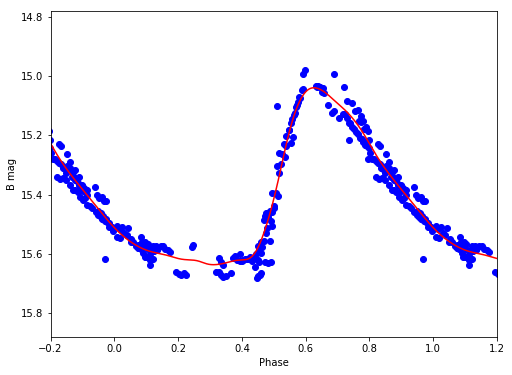

B 15.3924859928 0.597278040247


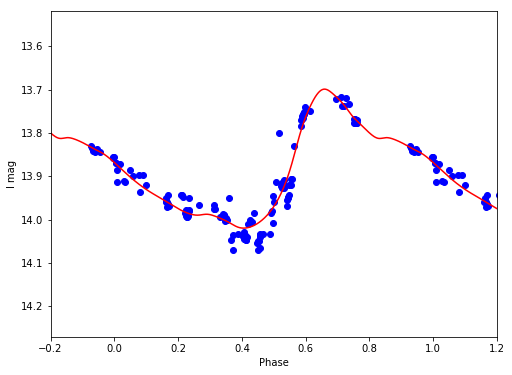

I 13.8810359857 0.320467220494


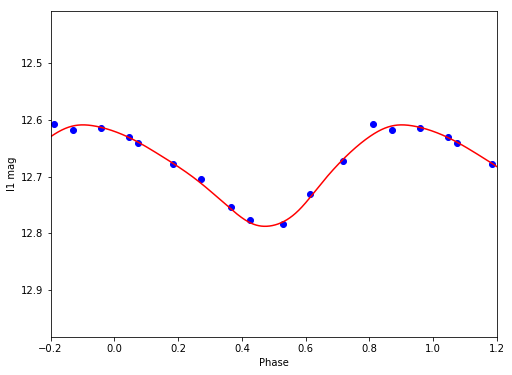

I1 12.6880980113 0.179135331082


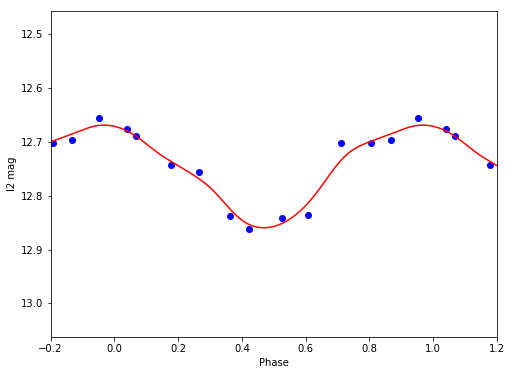

I2 12.7523171707 0.190649298711


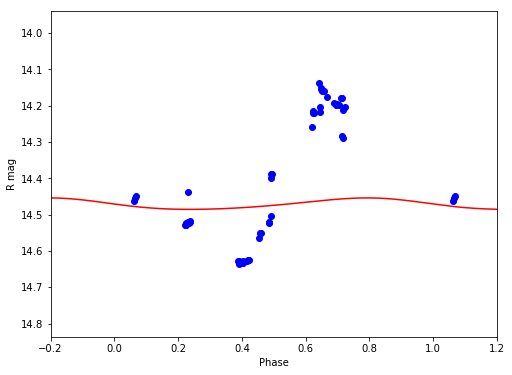

R 14.4709416748 0.0315614129801


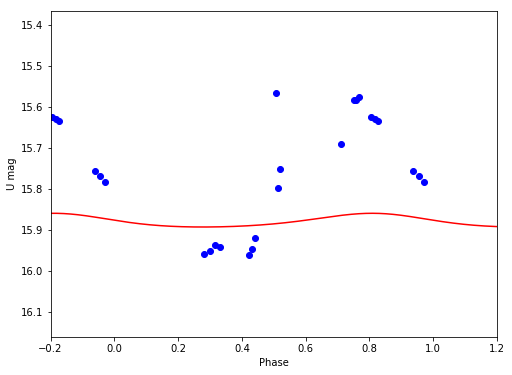

U 15.8793660898 0.0334380300968


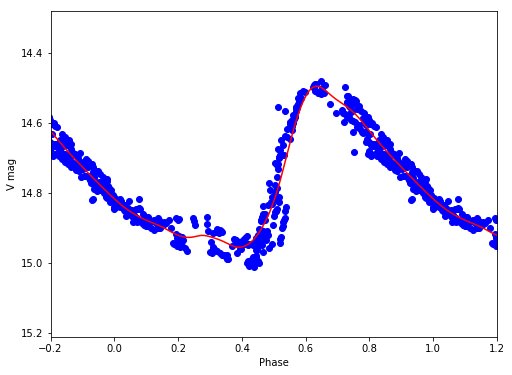

V 14.7604288942 0.459597010754
V9
/Volumes/Annie/CRRP/NGC3201/lcvs/V9.phased


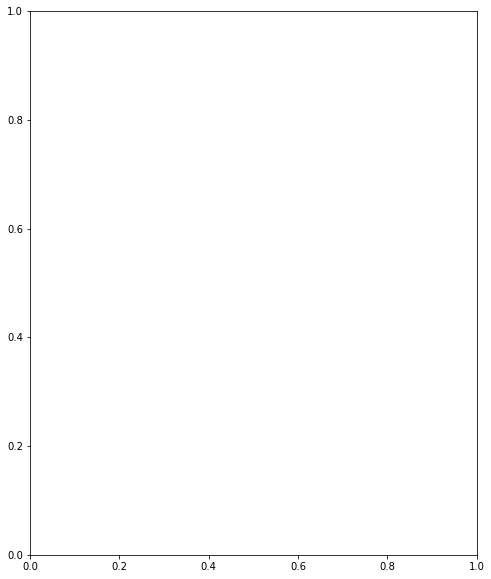

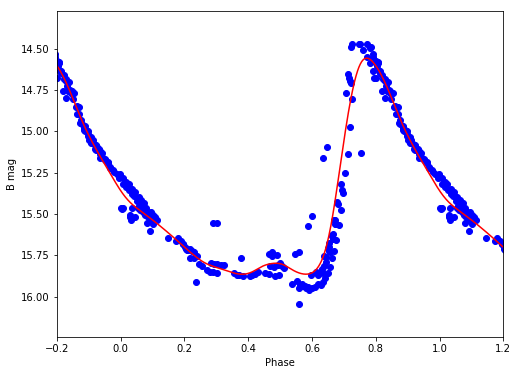

B 15.3727939769 1.3063061199


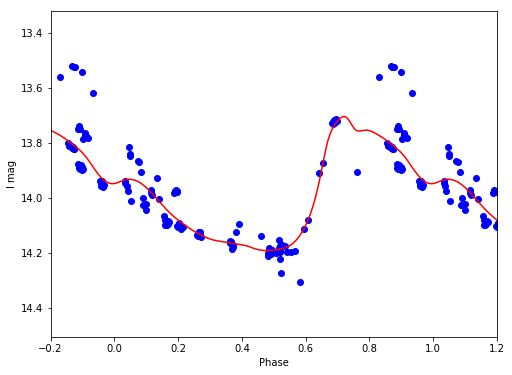

I 13.9798017394 0.487034798351


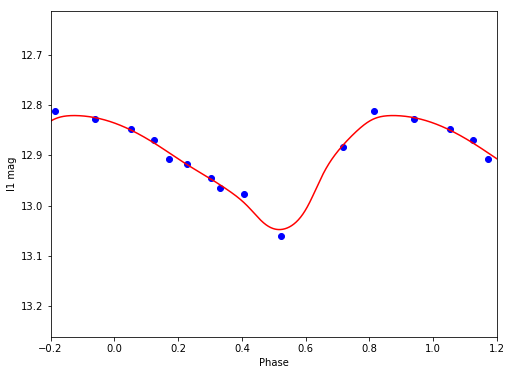

I1 12.9117200745 0.226873157249


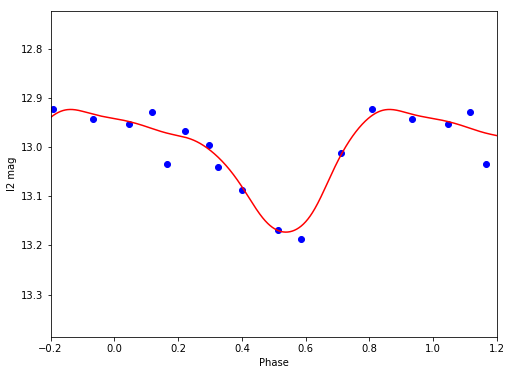

I2 13.0144057209 0.249709606963


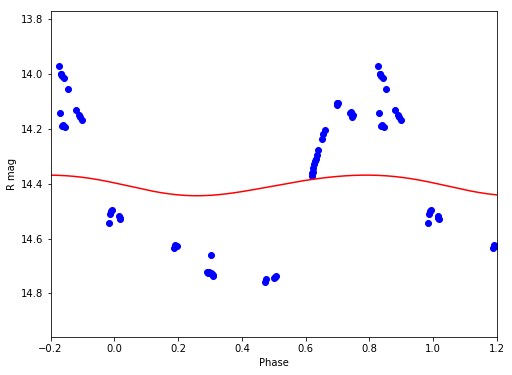

R 14.4046482737 0.0750971698321


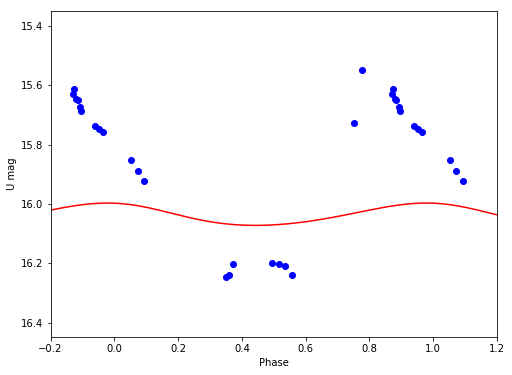

U 16.0366188281 0.0752569423593


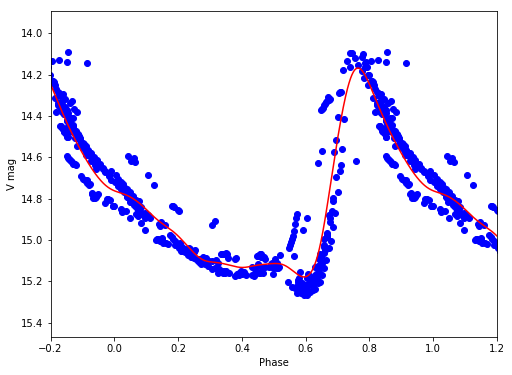

V 14.8001755077 1.01085101274
V10
/Volumes/Annie/CRRP/NGC3201/lcvs/V10.phased


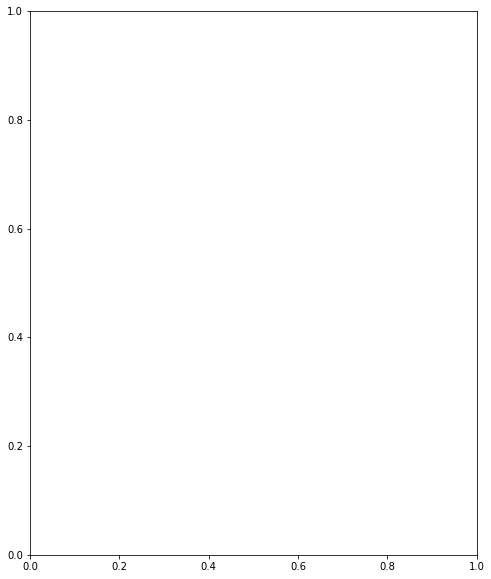

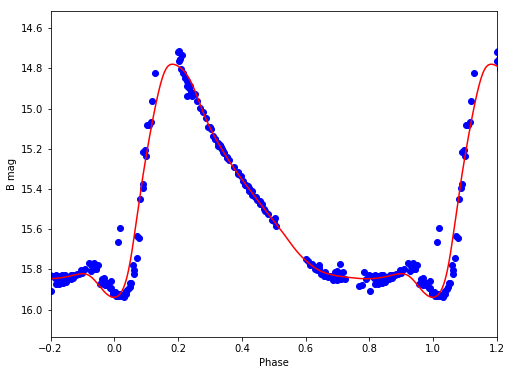

B 15.4545057697 1.15917052605


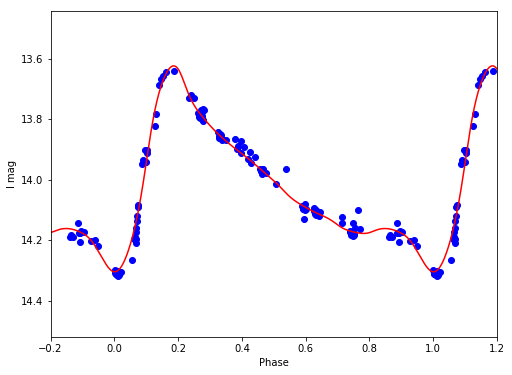

I 14.0046426095 0.679329755245


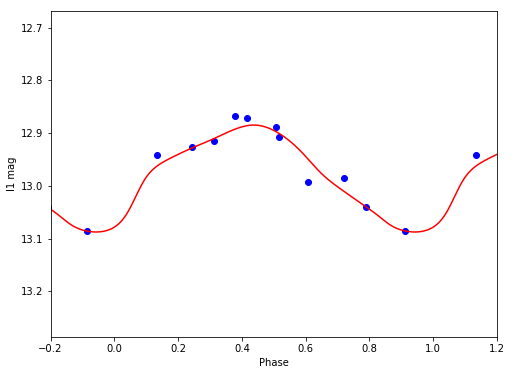

I1 12.9753945885 0.202649967201


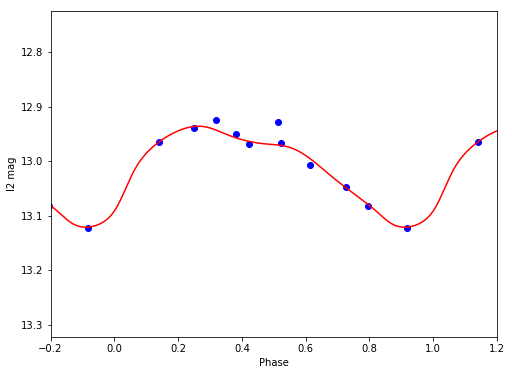

I2 13.0098955171 0.185092440405


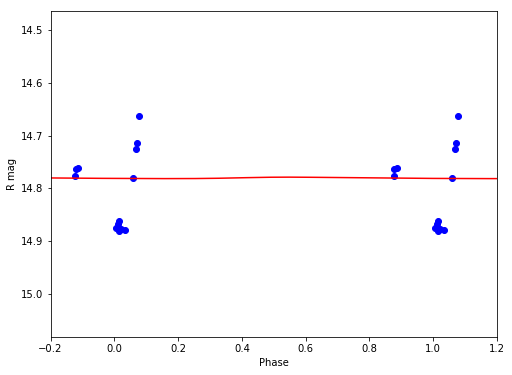

R 14.7806132842 0.0027756836077


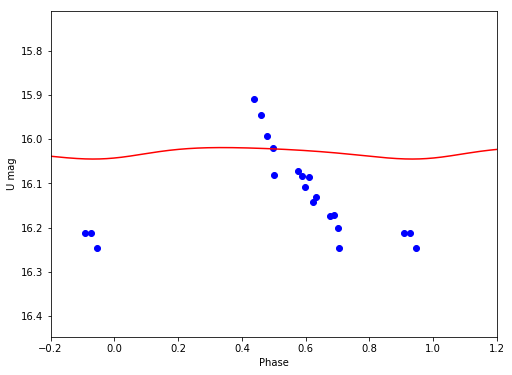

U 16.0297364079 0.0259202574348


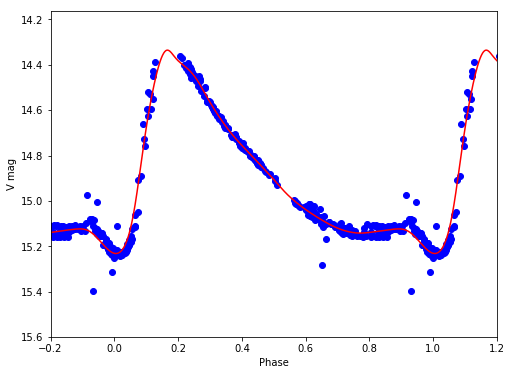

V 14.8556102376 0.895952769822
V11
/Volumes/Annie/CRRP/NGC3201/lcvs/V11.phased


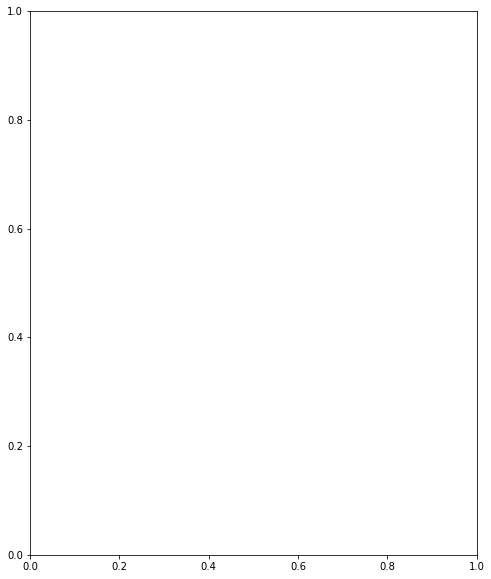

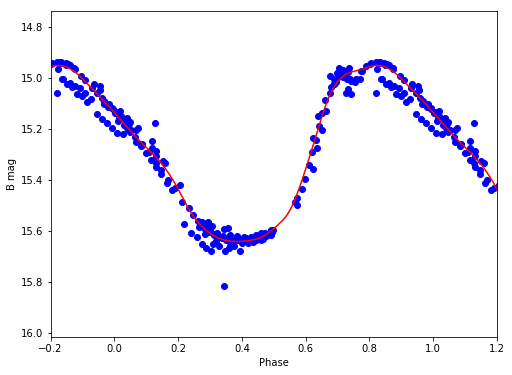

B 15.2738491493 0.689950636303


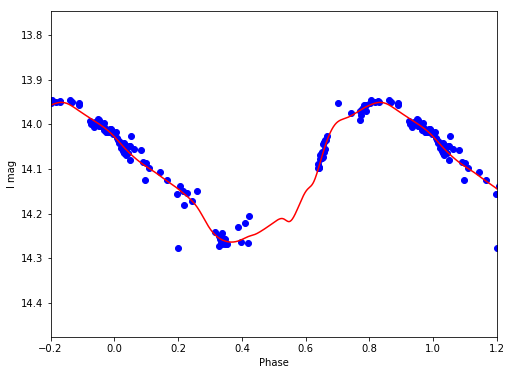

I 14.1017938972 0.313132349328


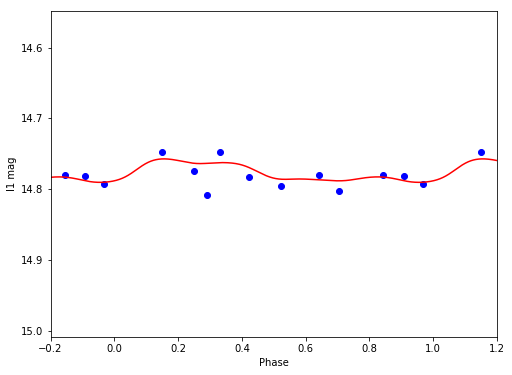

I1 14.7767313391 0.0330965319343


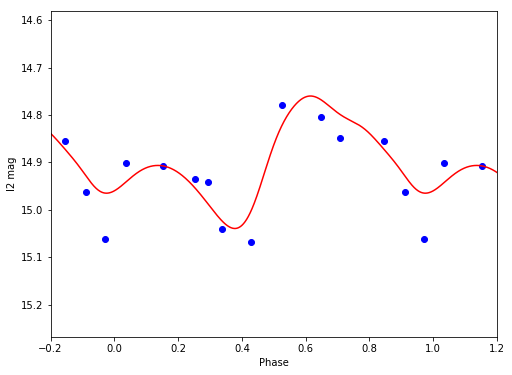

I2 14.8968496019 0.279465690223


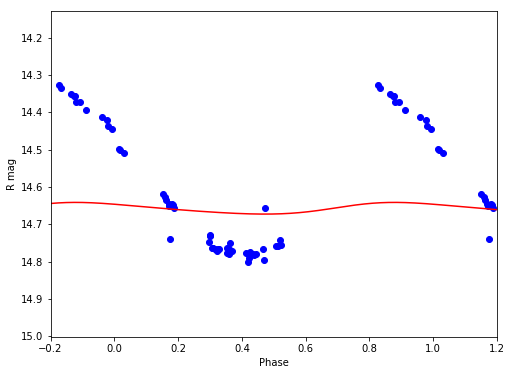

R 14.657810166 0.0312759061446


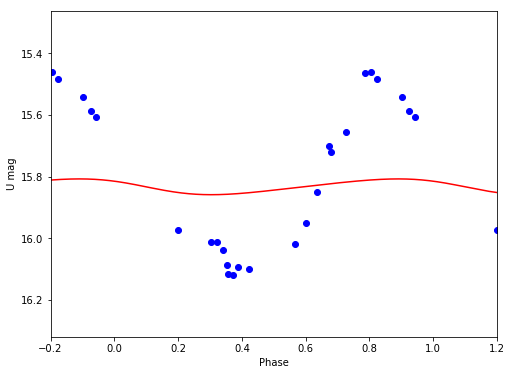

U 15.8320202077 0.0511931419941


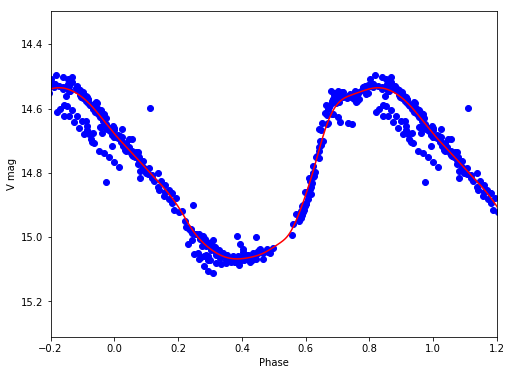

V 14.7892470136 0.532760260874
V12
/Volumes/Annie/CRRP/NGC3201/lcvs/V12.phased


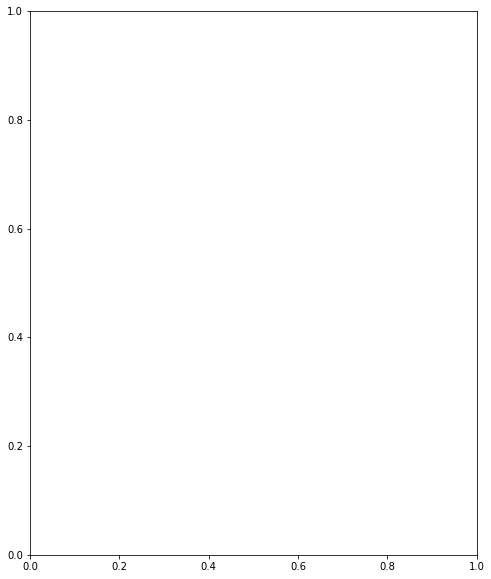

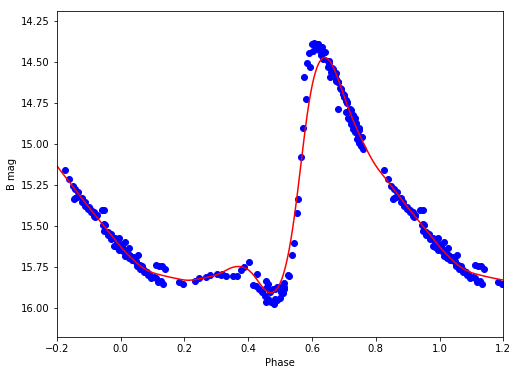

B 15.3553509526 1.43686378221


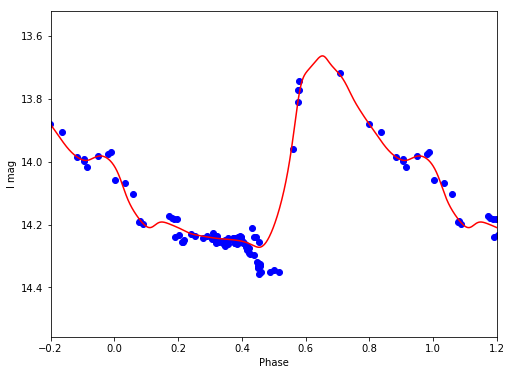

I 14.0265610035 0.609166523514


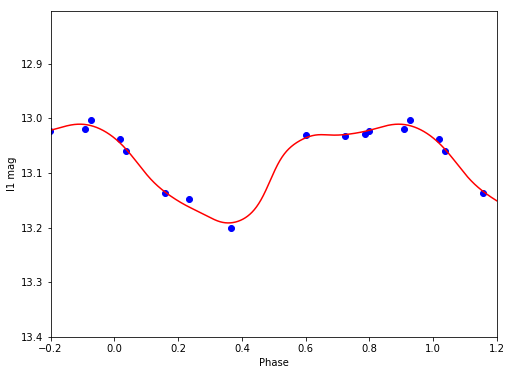

I1 13.0837367379 0.18076800407


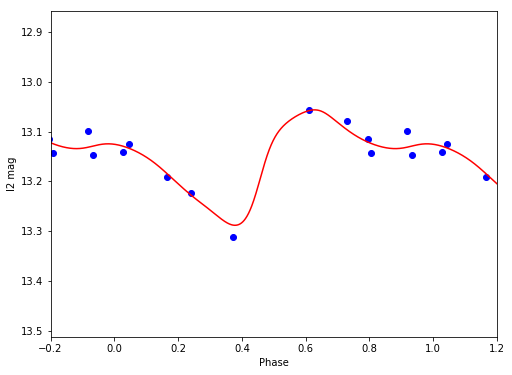

I2 13.1513637836 0.231808566579


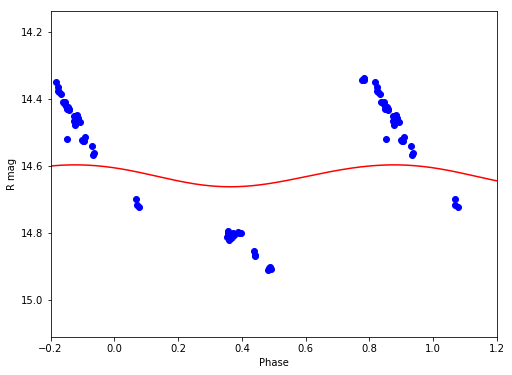

R 14.6277642247 0.0653970012086


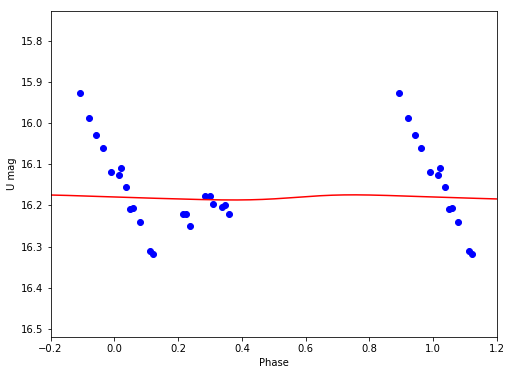

U 16.1807595867 0.0124318311885


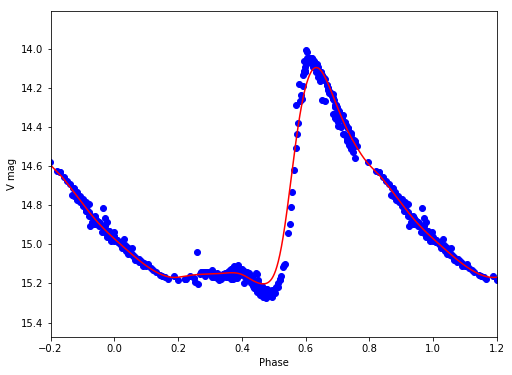

V 14.7990052974 1.10550235196
V13
/Volumes/Annie/CRRP/NGC3201/lcvs/V13.phased


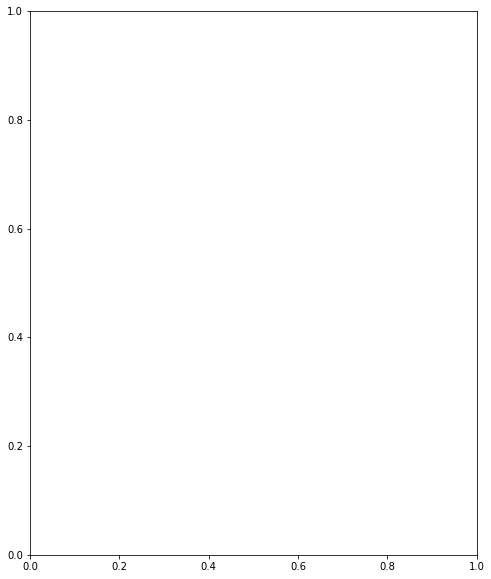

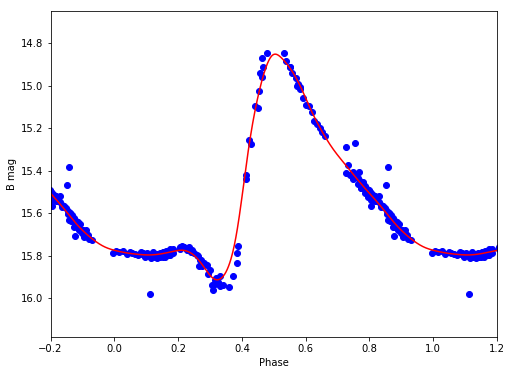

B 15.4658346658 1.06121519539


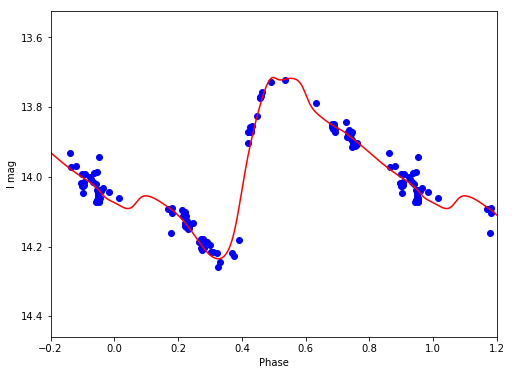

I 13.9684497716 0.520359770012


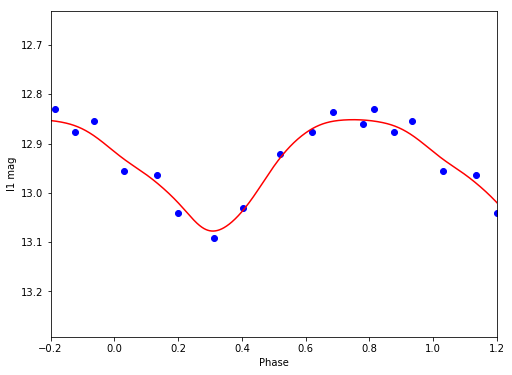

I1 12.9387442583 0.226037365137


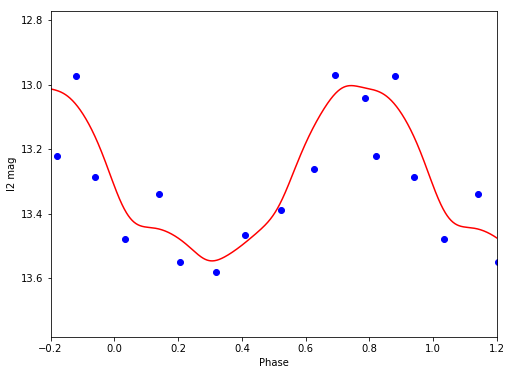

I2 13.2806656736 0.543374546673


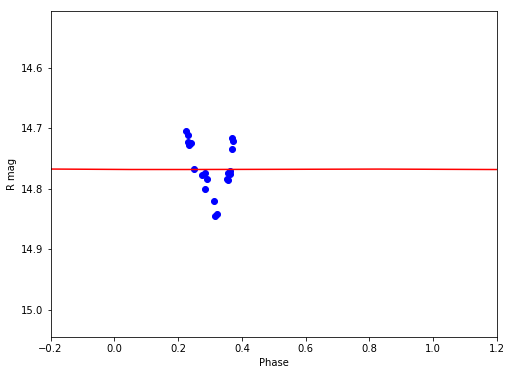

R 14.7677321281 0.000804462236186


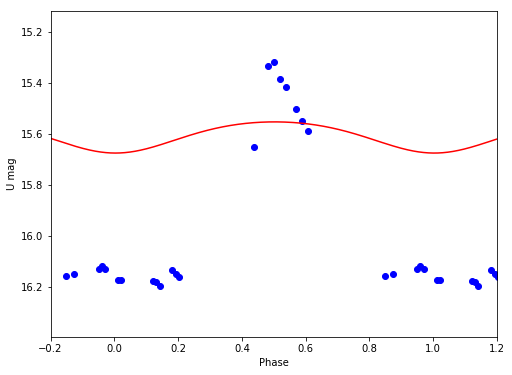

U 15.6053126101 0.122054153117


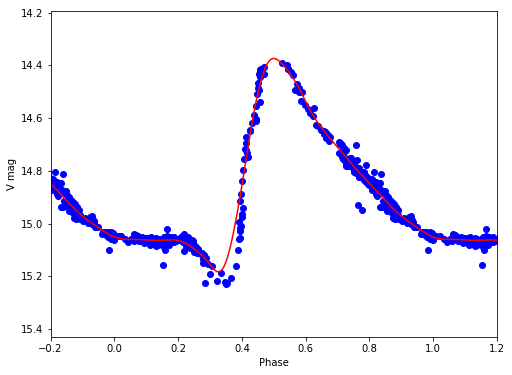

V 14.8350726837 0.809916297352
V14
/Volumes/Annie/CRRP/NGC3201/lcvs/V14.phased


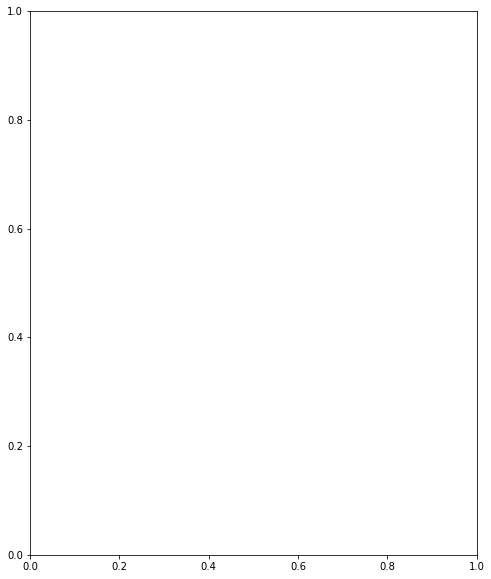

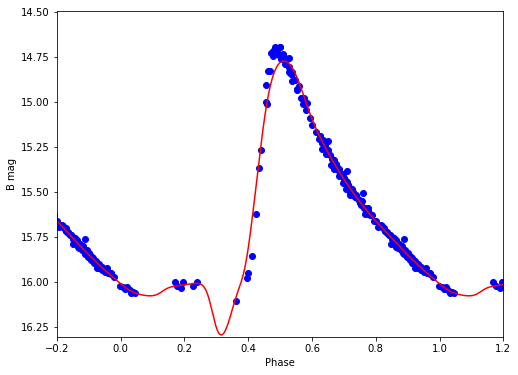

B 15.5920275725 1.52195245623


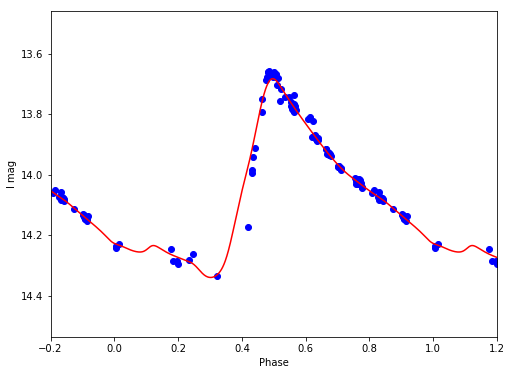

I 14.0641142878 0.656301721911


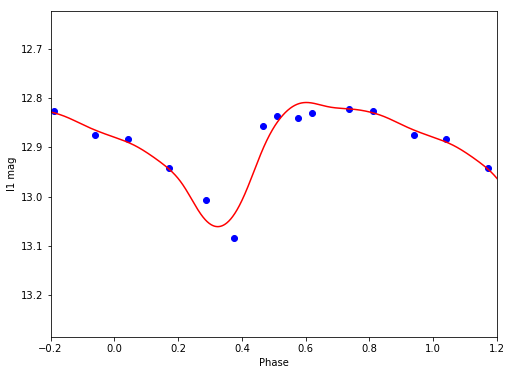

I1 12.8956567934 0.252355623459


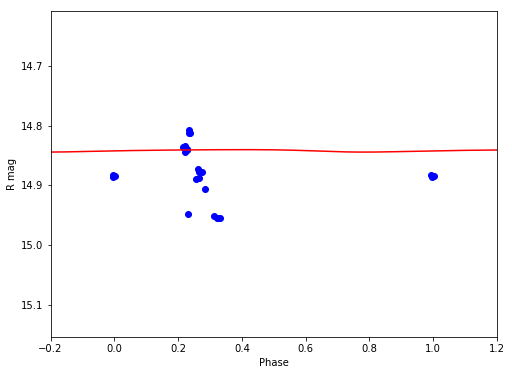

R 14.8417840132 0.00410963385185


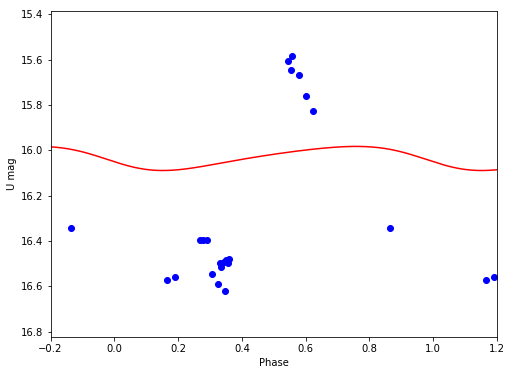

U 16.0314760664 0.106346270632


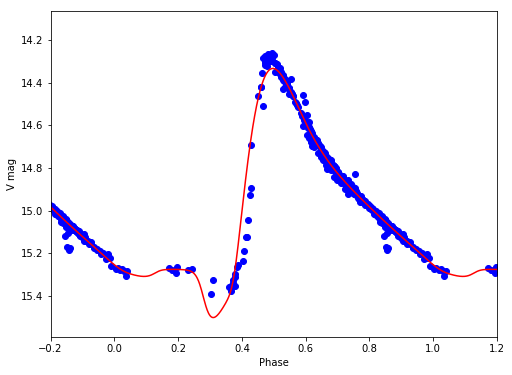

V 14.9583104161 1.1685598347
V15
/Volumes/Annie/CRRP/NGC3201/lcvs/V15.phased


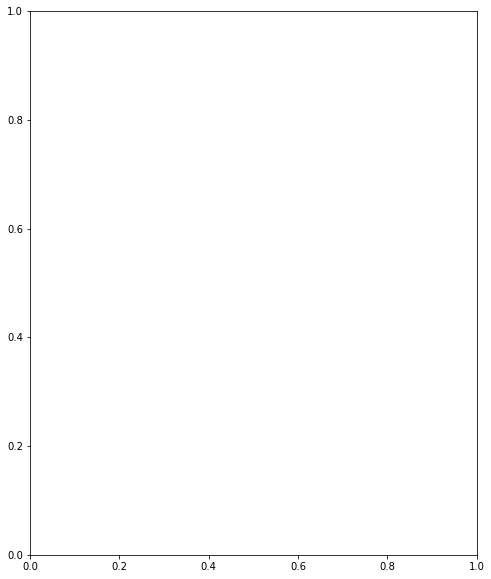

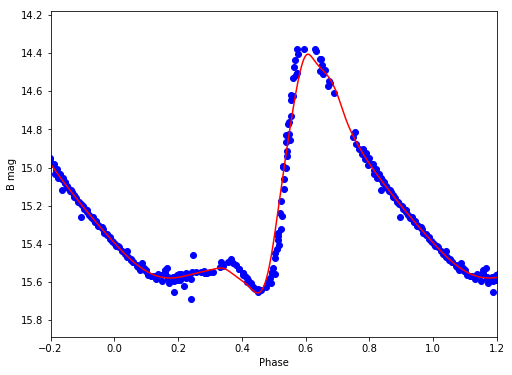

B 15.1521685314 1.25359661533


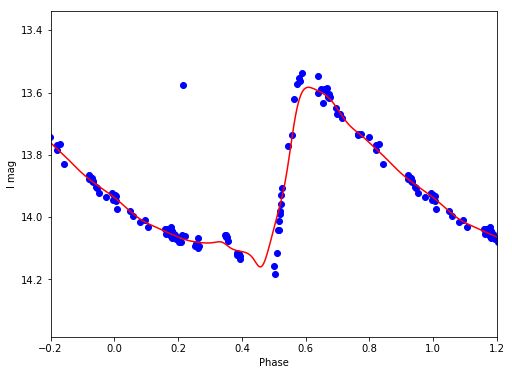

I 13.8988675688 0.576633566875


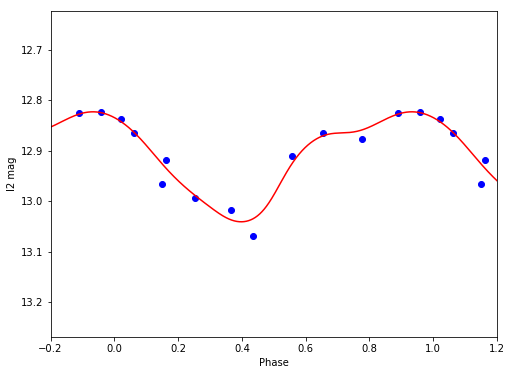

I2 12.9134426845 0.217500788357


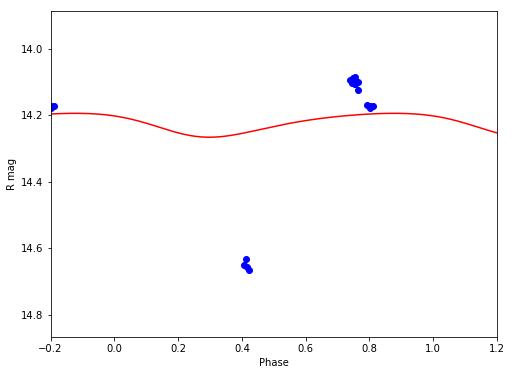

R 14.2240994591 0.0719955144983


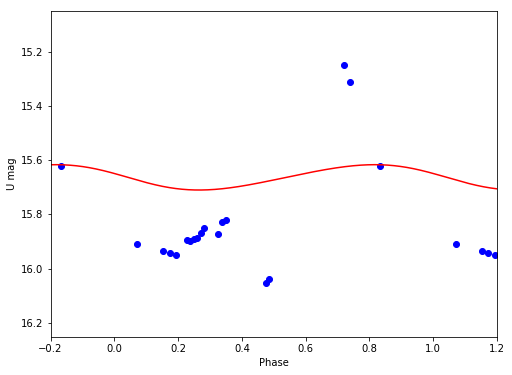

U 15.6626849331 0.0935325672595


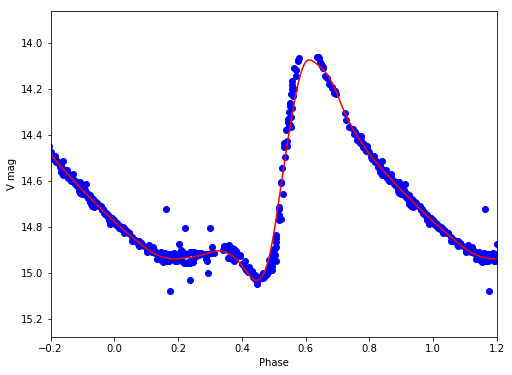

V 14.6343216015 0.957056825657
V16
/Volumes/Annie/CRRP/NGC3201/lcvs/V16.phased


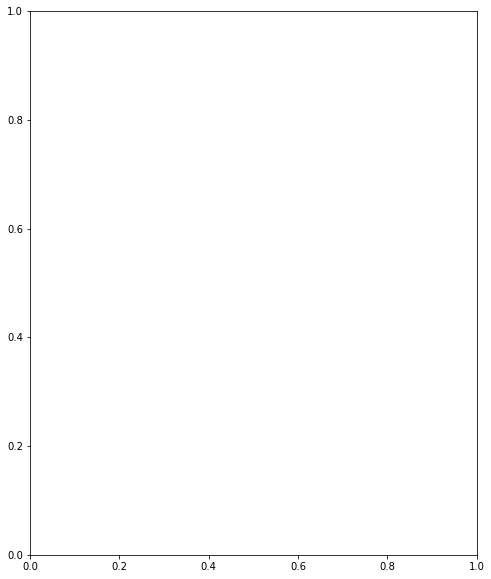

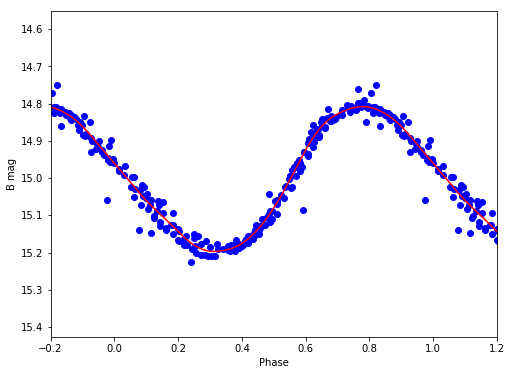

B 14.9947286597 0.389011748893


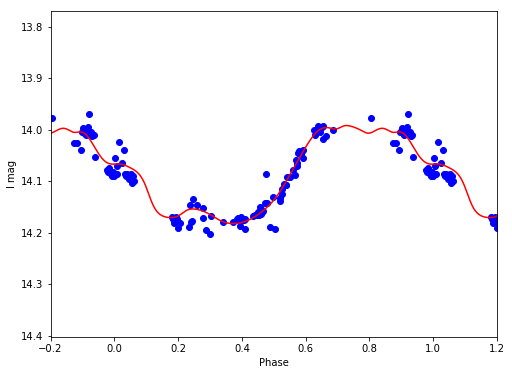

I 14.0845352622 0.190224632988


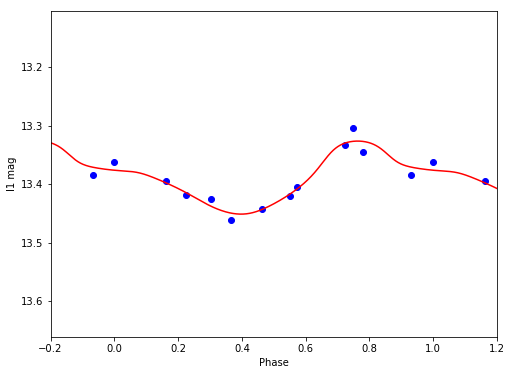

I1 13.3907897268 0.124959056183


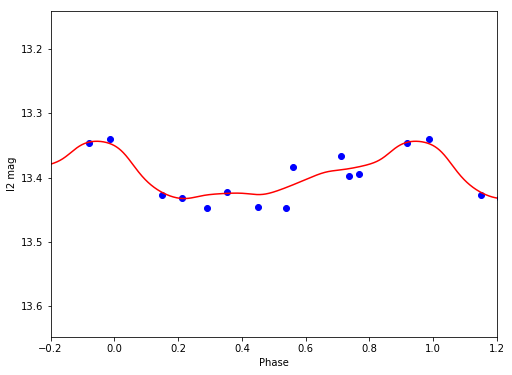

I2 13.397629507 0.0892195033262


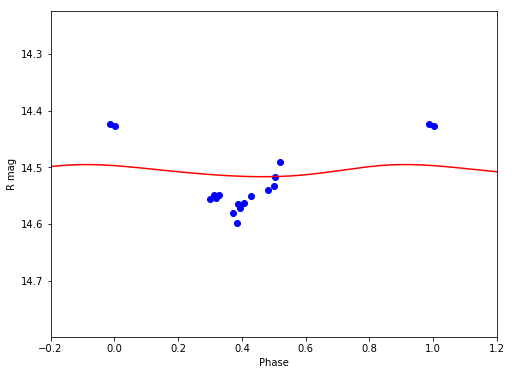

R 14.5062000451 0.0213855223014


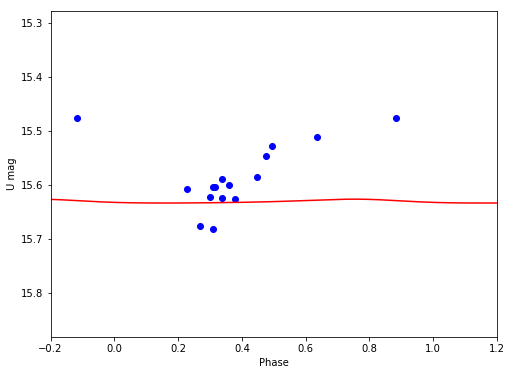

U 15.6310736878 0.00719431017274


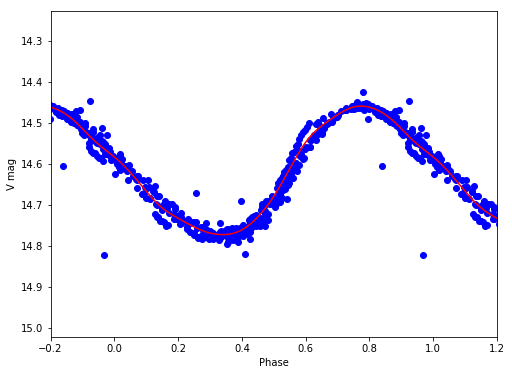

V 14.6133392817 0.313972033105
V17
/Volumes/Annie/CRRP/NGC3201/lcvs/V17.phased


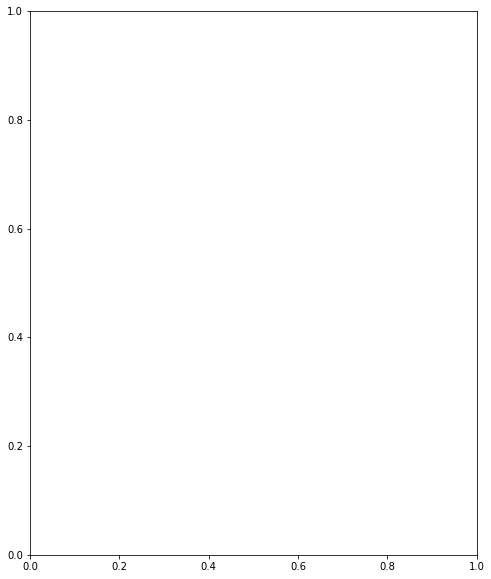

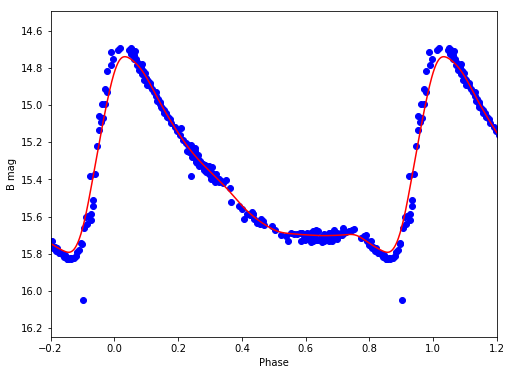

B 15.3640842017 1.05061969819


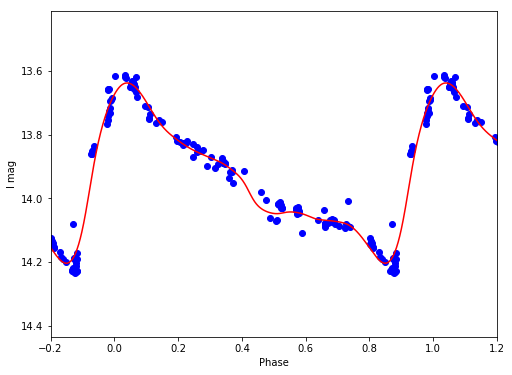

I 13.9295077616 0.564340692995


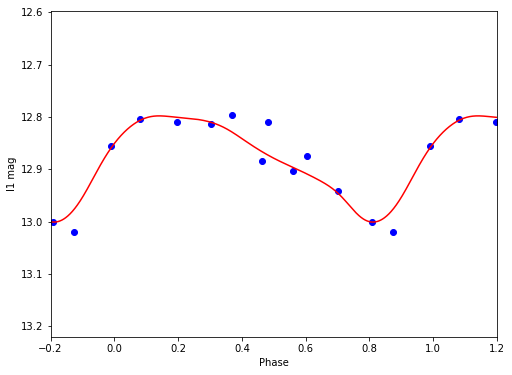

I1 12.8769286393 0.202865709377


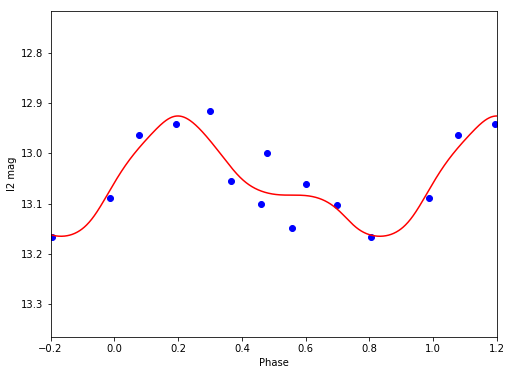

I2 13.0546641896 0.240078405985


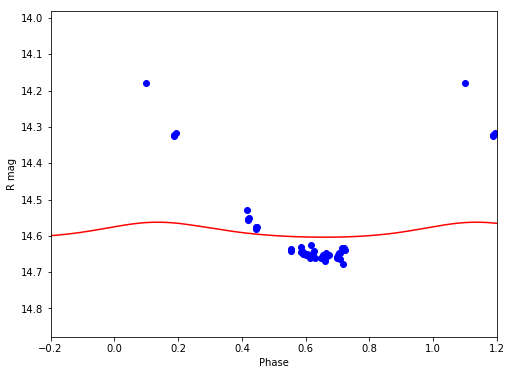

R 14.586776249 0.0413142401416


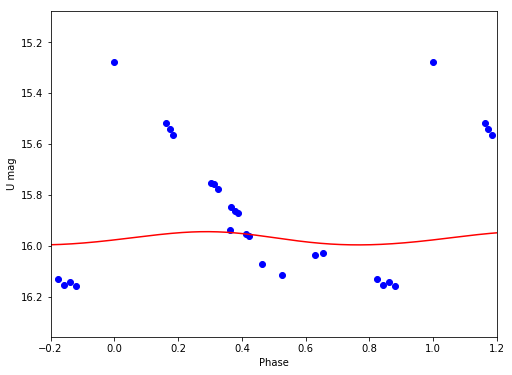

U 15.9700307575 0.0519825918736


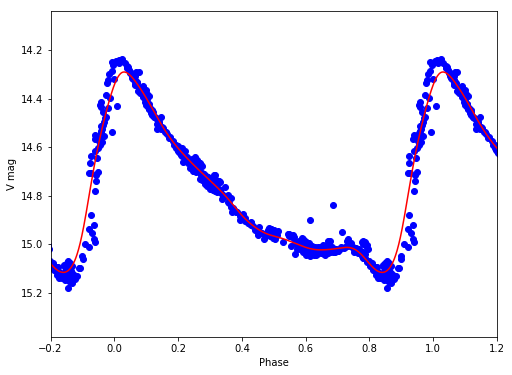

V 14.7666377806 0.825813222612
V18
/Volumes/Annie/CRRP/NGC3201/lcvs/V18.phased


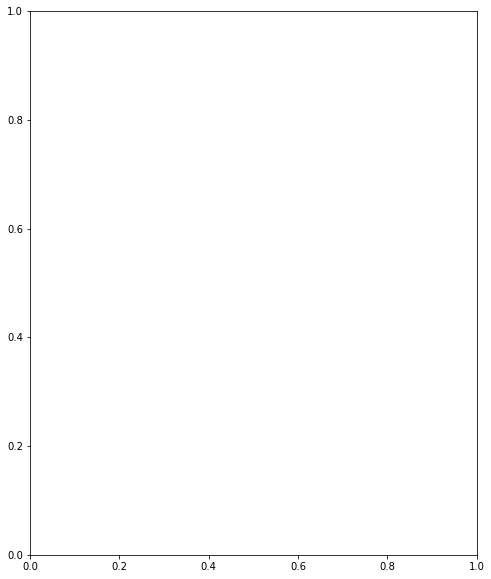

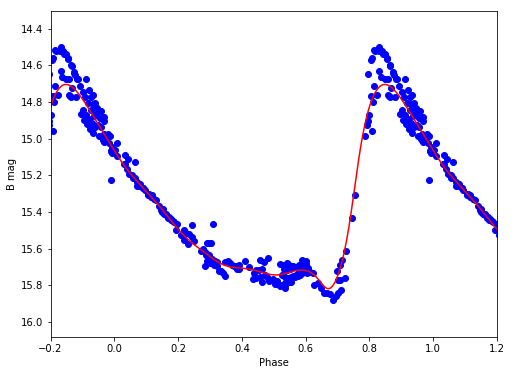

B 15.3394454997 1.11514624139


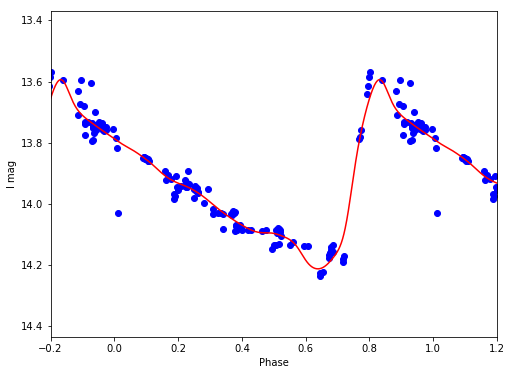

I 13.9284281935 0.618900620478


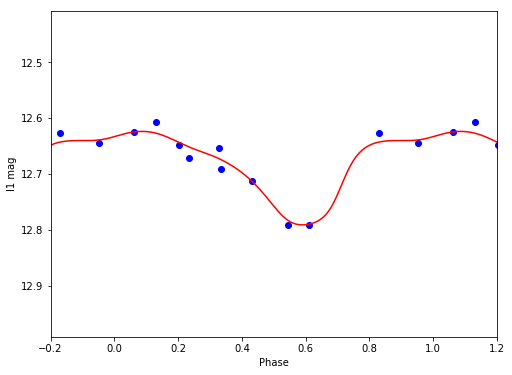

I1 12.6820806576 0.167657216584


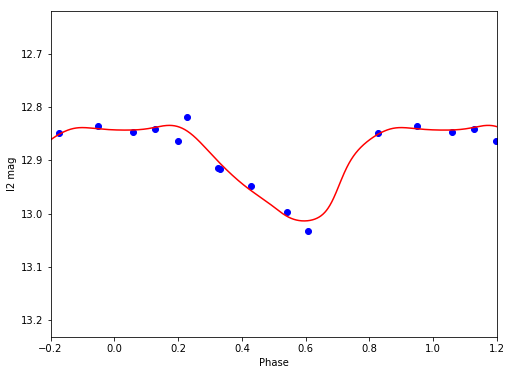

I2 12.8983332774 0.179853764563


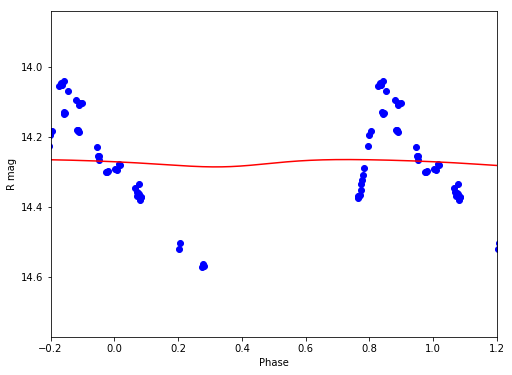

R 14.2739297979 0.0210136283162


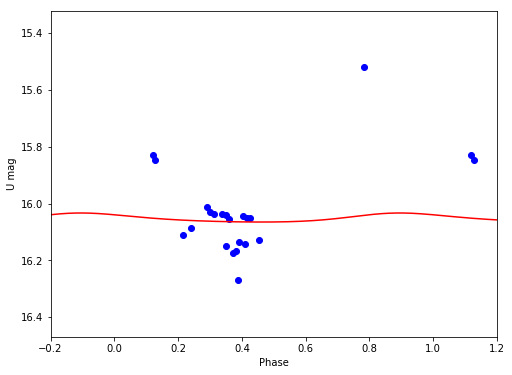

U 16.052072965 0.0318572469522


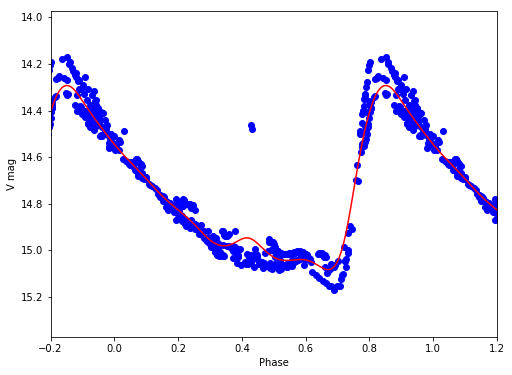

V 14.7544990448 0.790456316576
V19
/Volumes/Annie/CRRP/NGC3201/lcvs/V19.phased


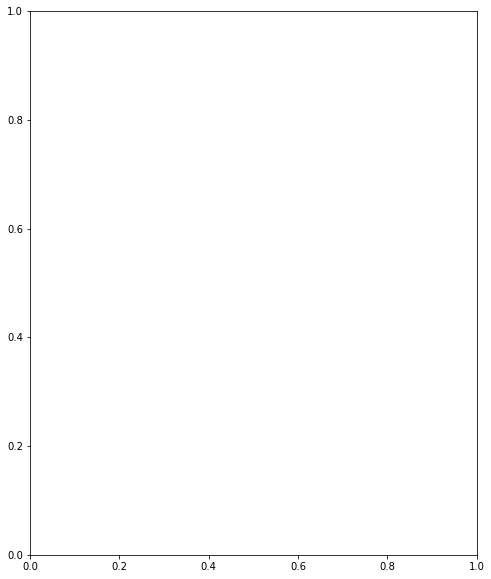

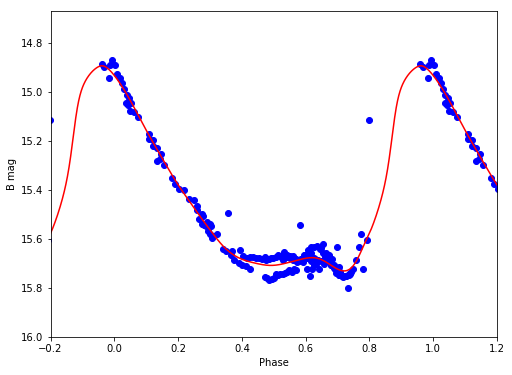

B 15.4013227958 0.83640957218


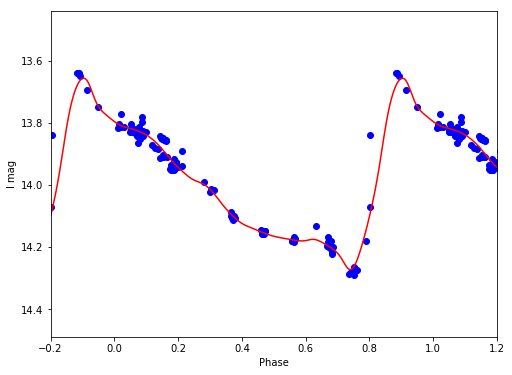

I 13.9913074062 0.616119305979


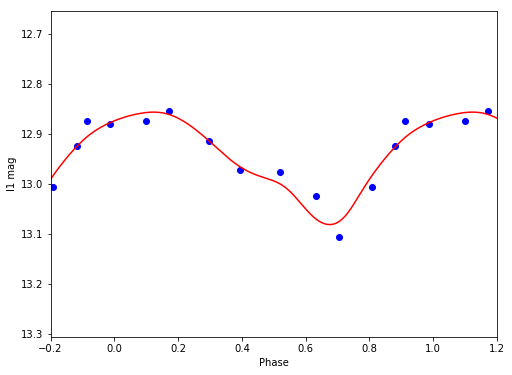

I1 12.94828877 0.225138275743


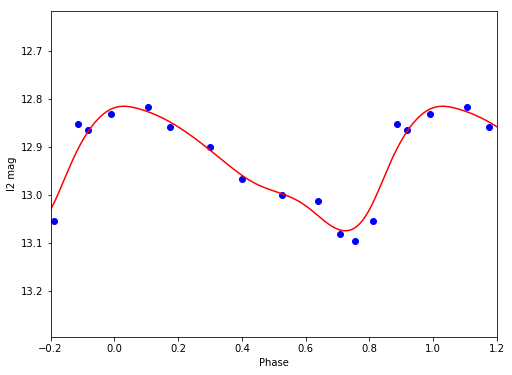

I2 12.9343861722 0.259176975261


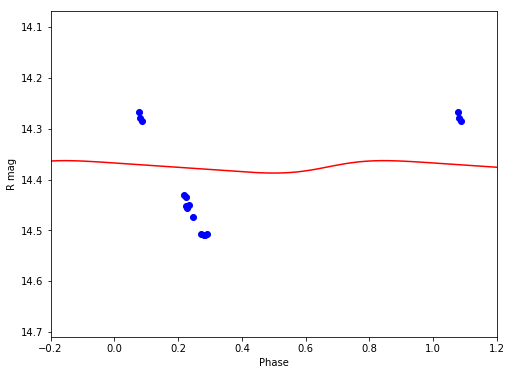

R 14.374798797 0.0244238800542


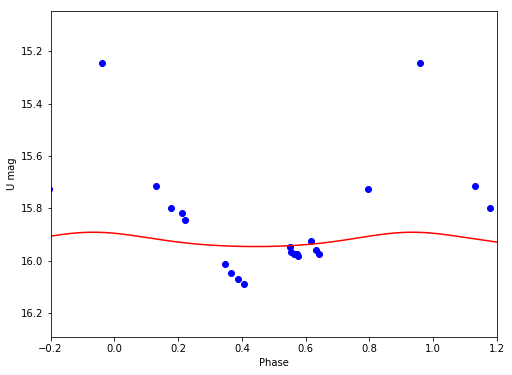

U 15.9229328071 0.0547816325906


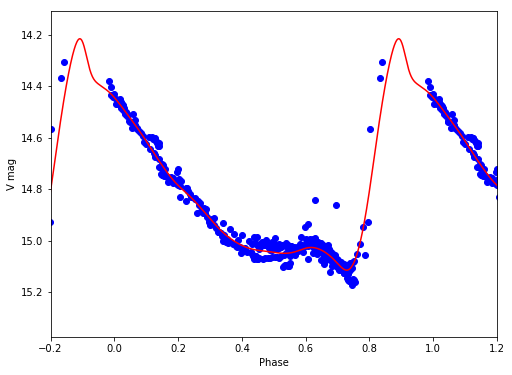

V 14.7673764993 0.89901368039
V20
/Volumes/Annie/CRRP/NGC3201/lcvs/V20.phased


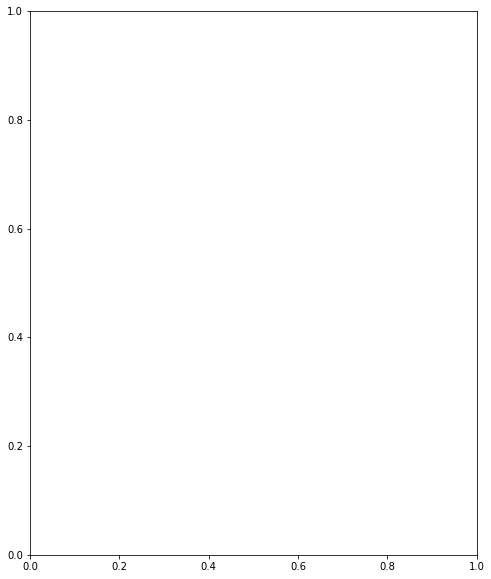

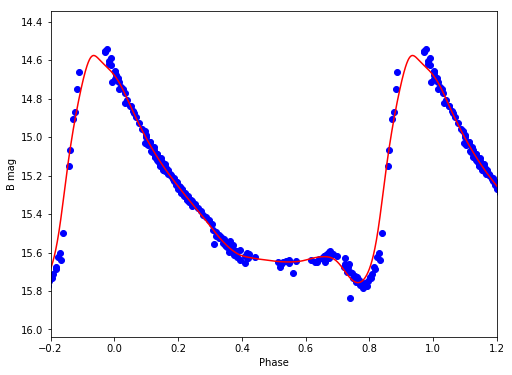

B 15.2655886249 1.18051490327


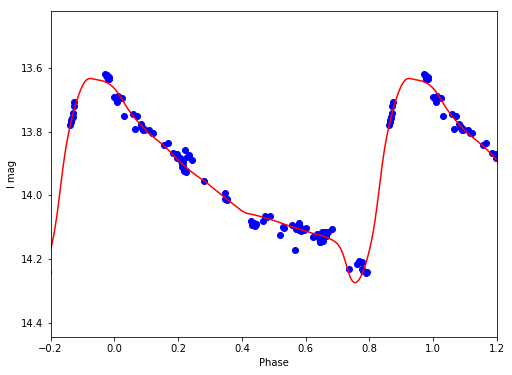

I 13.9391228333 0.641011835549


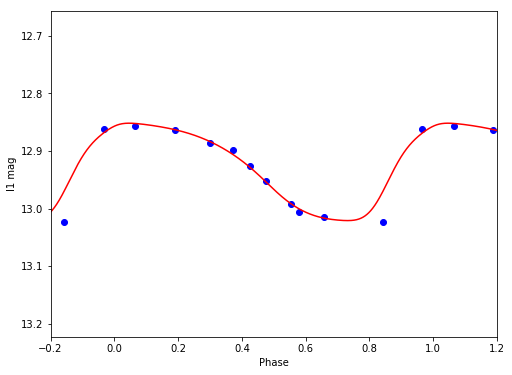

I1 12.9267255278 0.169313883435


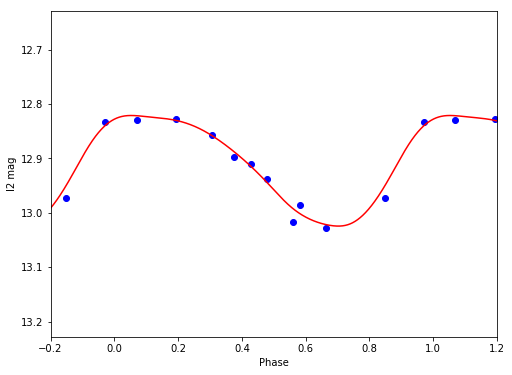

I2 12.9089237693 0.203445442549


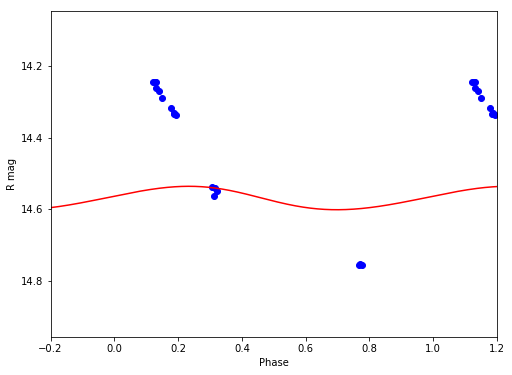

R 14.5686154157 0.0654552593114


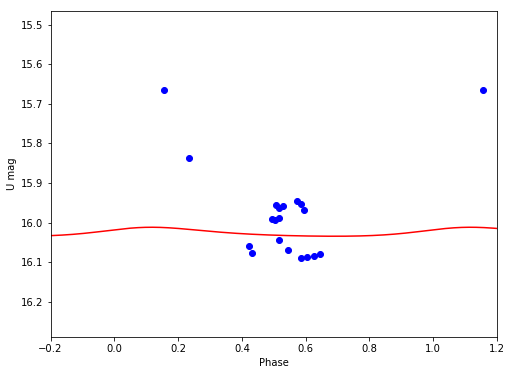

U 16.0253191678 0.0226694155516


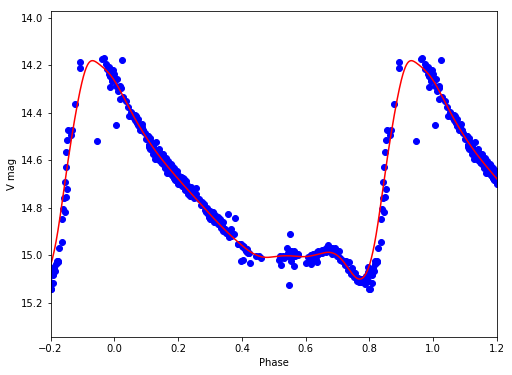

V 14.7153305453 0.918841651159
V21
/Volumes/Annie/CRRP/NGC3201/lcvs/V21.phased


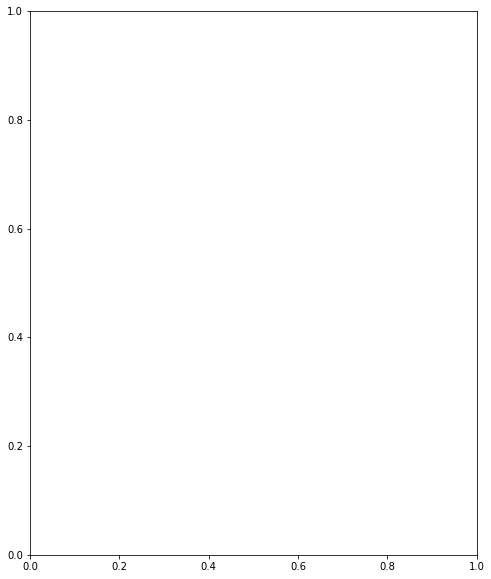

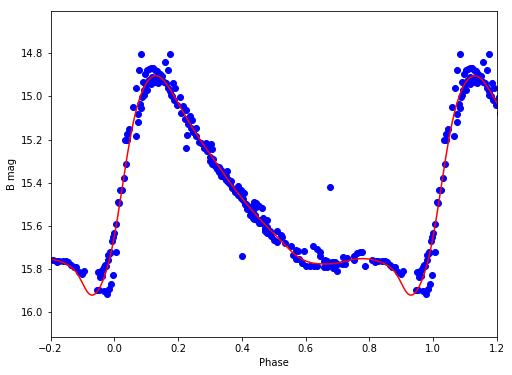

B 15.4659042291 1.01611239701


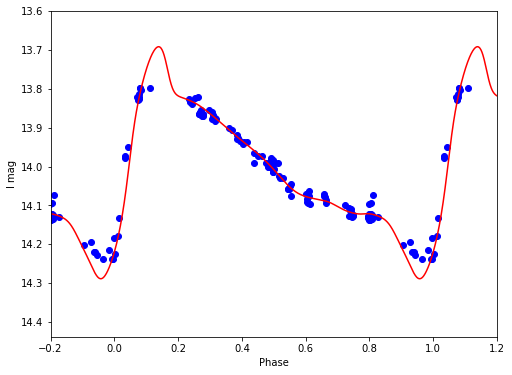

I 13.9968702326 0.596856537028


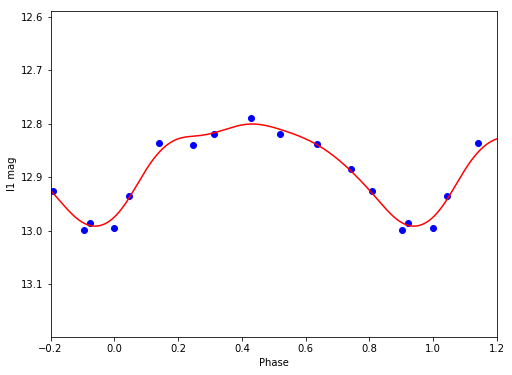

I1 12.8701565009 0.190691045371


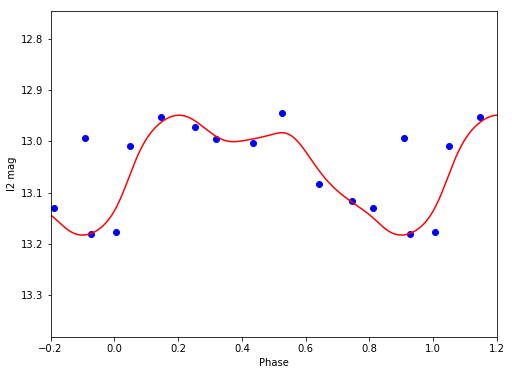

I2 13.0460790955 0.233723287699


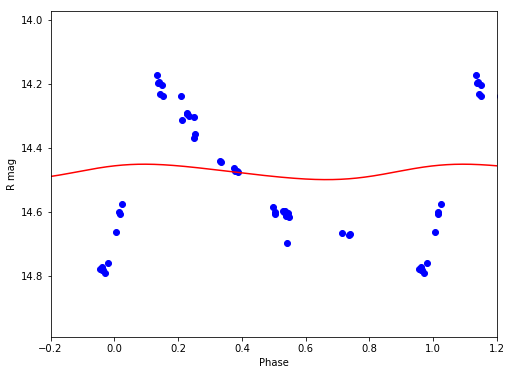

R 14.4760530903 0.0481863547132


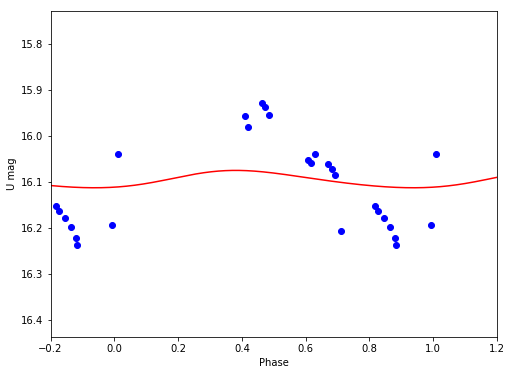

U 16.094209294 0.0377458355688


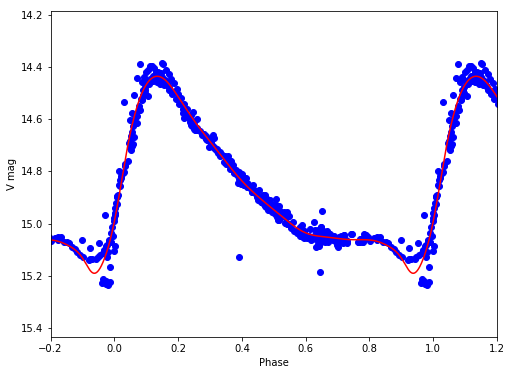

V 14.8477716334 0.753818955009
V22
/Volumes/Annie/CRRP/NGC3201/lcvs/V22.phased


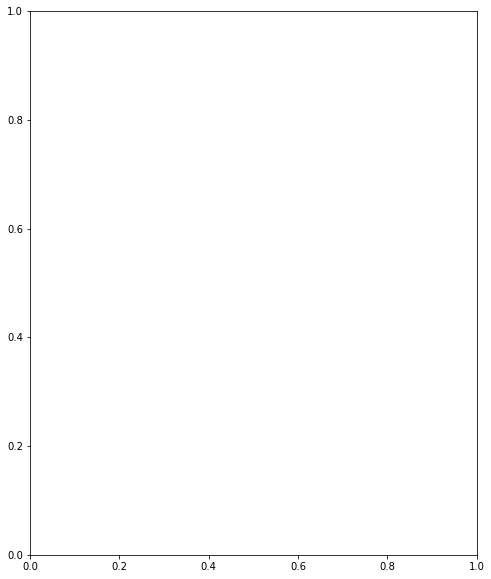

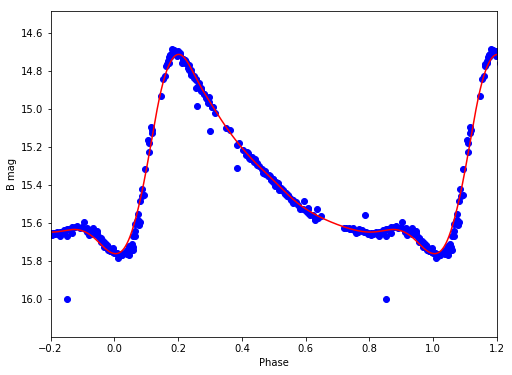

B 15.3263592107 1.04649267409


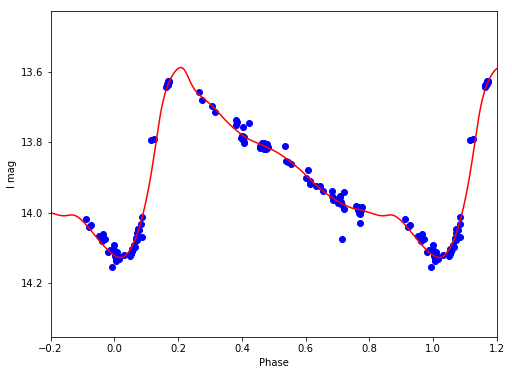

I 13.873720961 0.540574238517


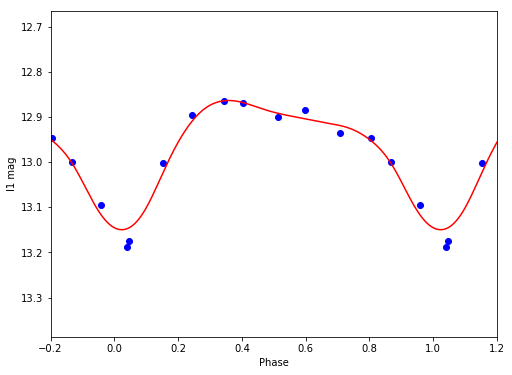

I1 12.9606747685 0.286376781981


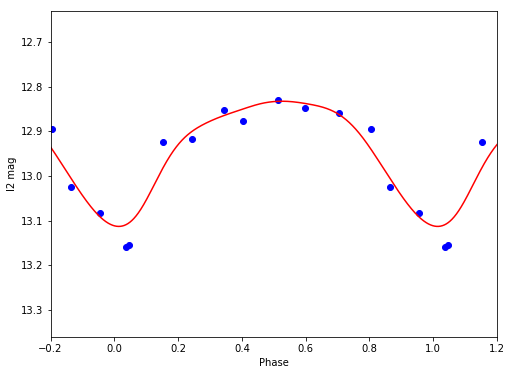

I2 12.9292525706 0.28018500283


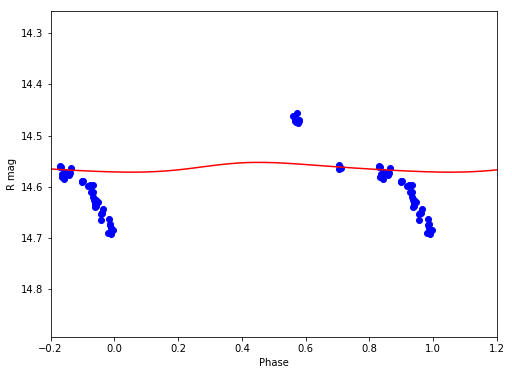

R 14.5625837884 0.0191196110032


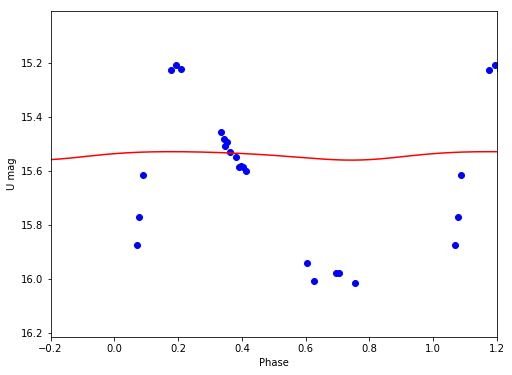

U 15.5410225508 0.0312786852826


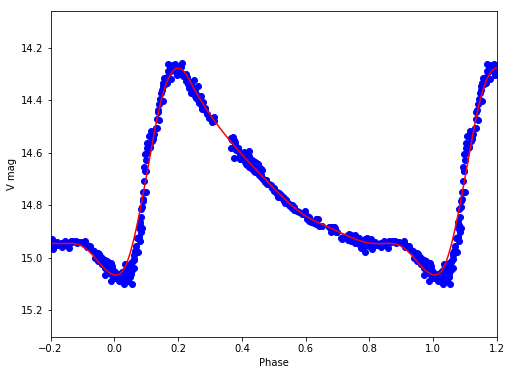

V 14.7221708502 0.78877813323
V23
/Volumes/Annie/CRRP/NGC3201/lcvs/V23.phased


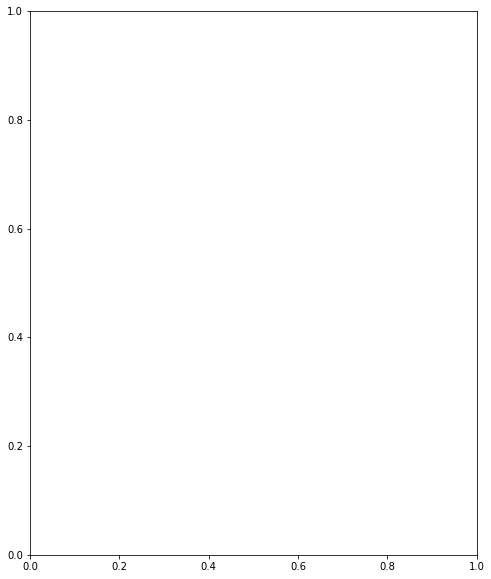

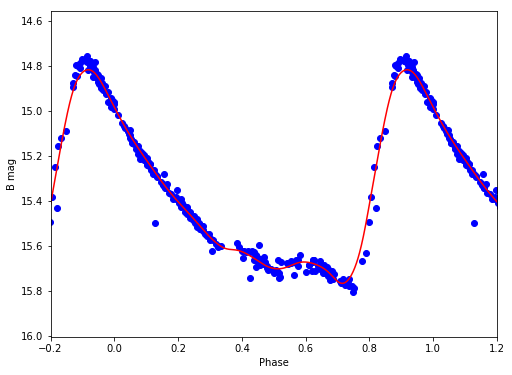

B 15.3728554008 0.949726367192


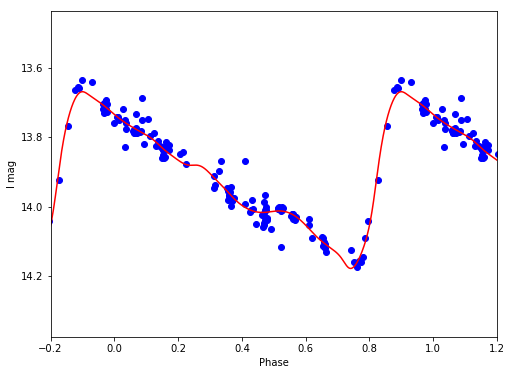

I 13.9107894855 0.509400394533


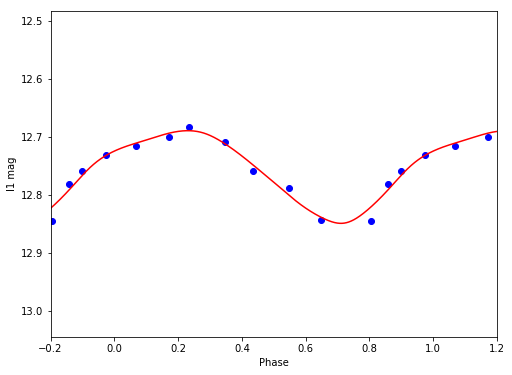

I1 12.7580965613 0.159661283495


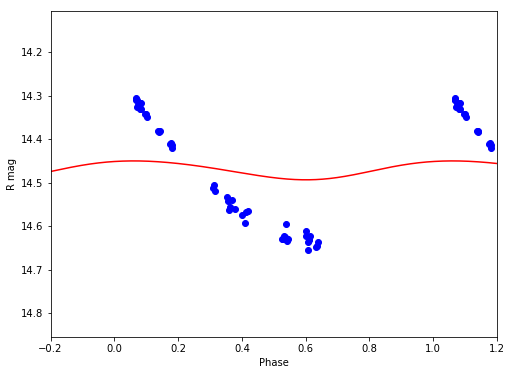

R 14.4700018538 0.0434607581036


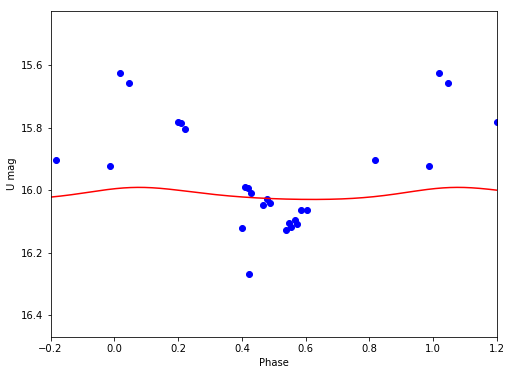

U 16.0138217691 0.038572369661


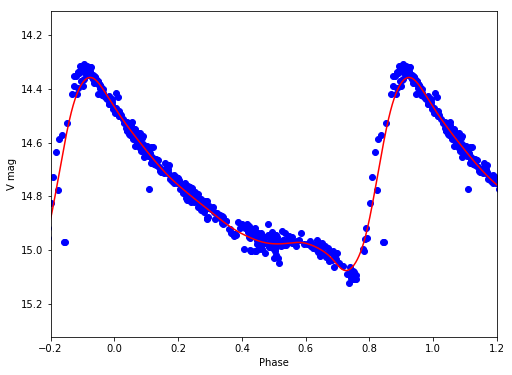

V 14.7683759727 0.717617501092
V24
/Volumes/Annie/CRRP/NGC3201/lcvs/V24.phased


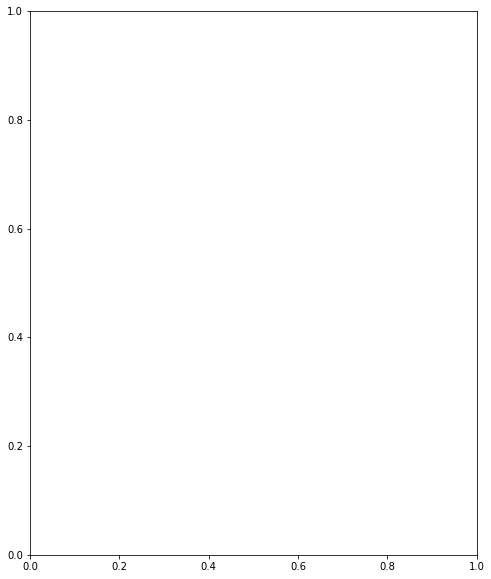

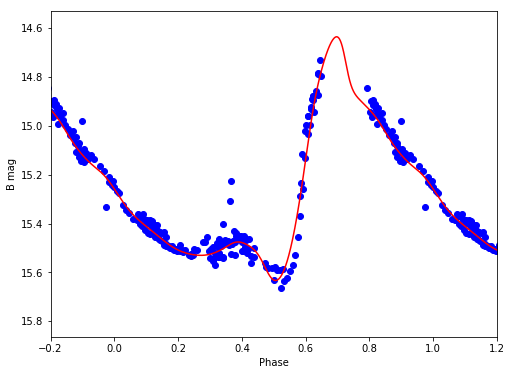

B 15.2282392368 0.996013315009


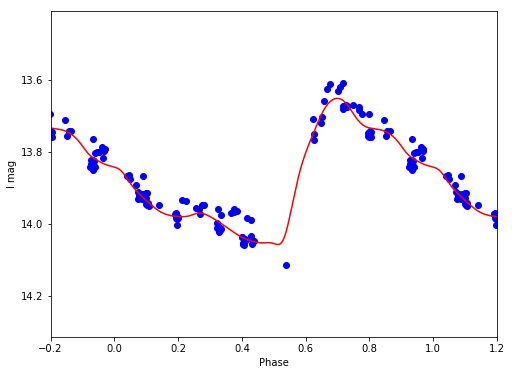

I 13.8731137332 0.406136001687


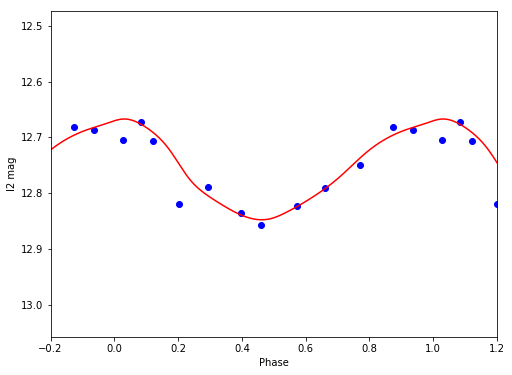

I2 12.7569991819 0.180462509551


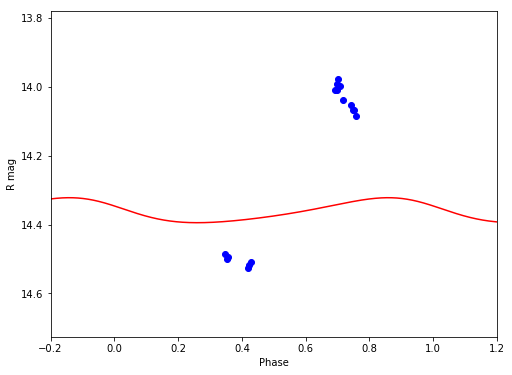

R 14.3615297054 0.0726594905212


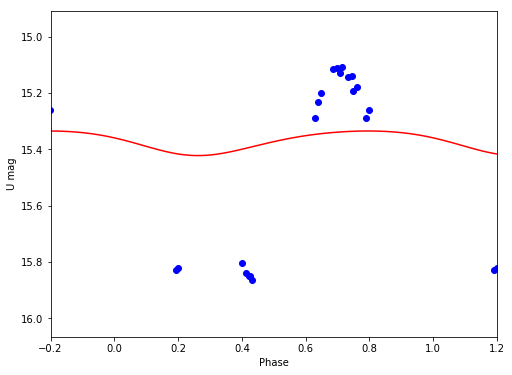

U 15.3713435347 0.0873494483991


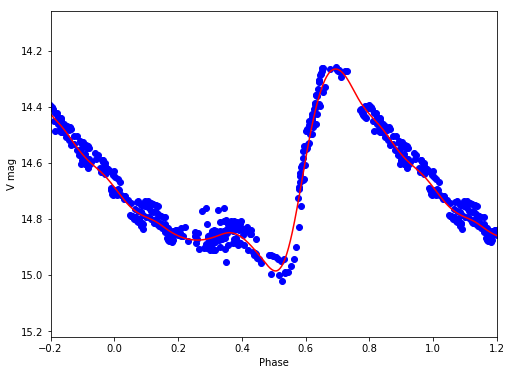

V 14.6668429894 0.720594645375
V25
/Volumes/Annie/CRRP/NGC3201/lcvs/V25.phased


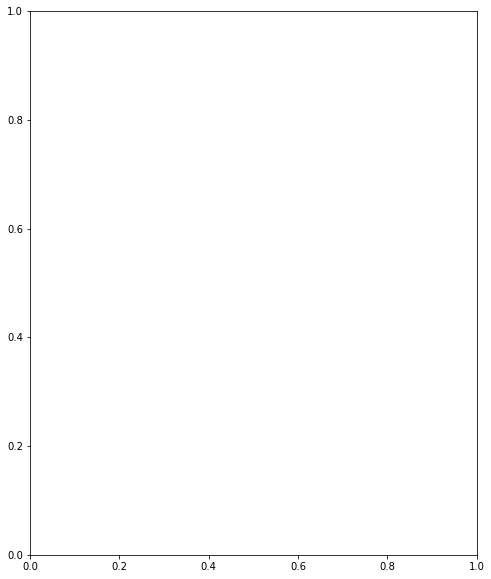

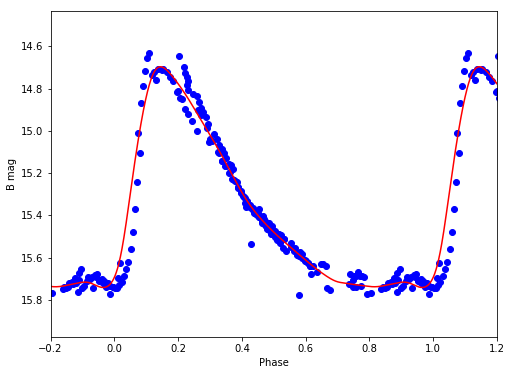

B 15.3245660466 1.04480027549


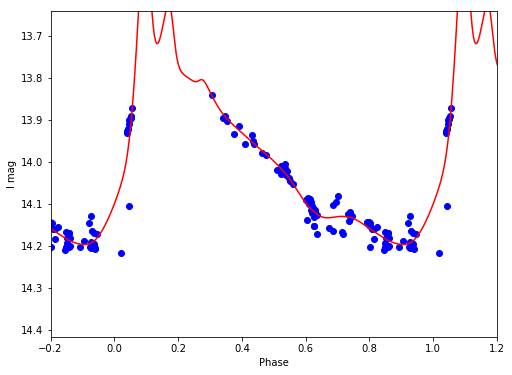

I 13.9641448162 0.751885567722


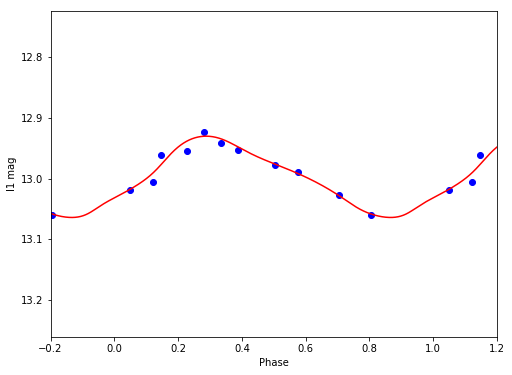

I1 12.9970811393 0.133584852796


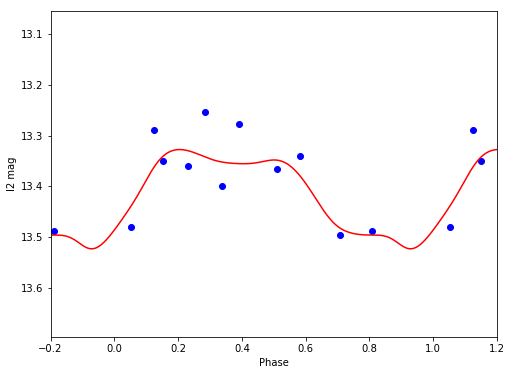

I2 13.411155872 0.195357292185


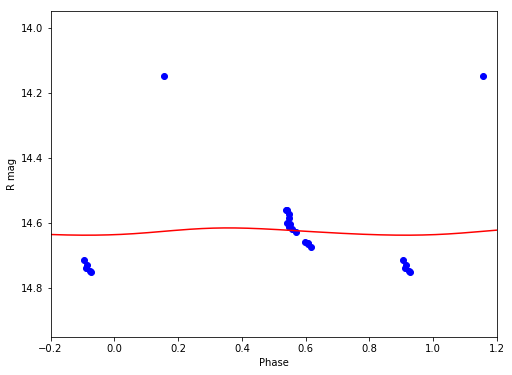

R 14.6271954931 0.022316610651


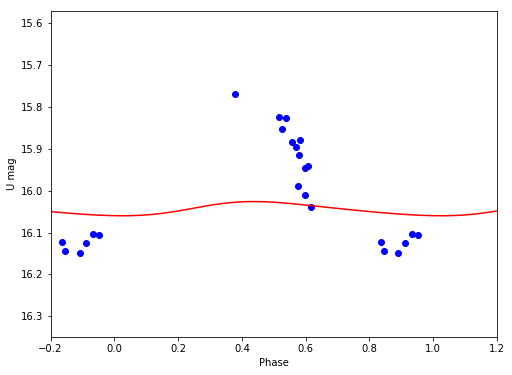

U 16.0437340182 0.0339681534824


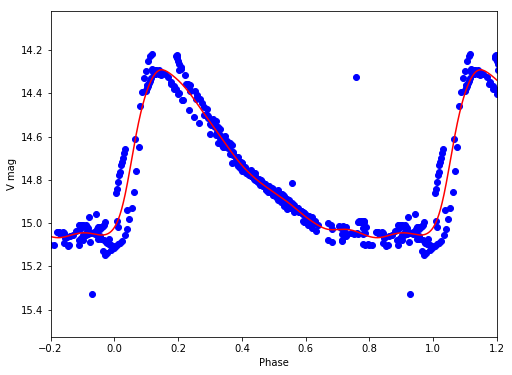

V 14.7646512391 0.776672790565
V26
/Volumes/Annie/CRRP/NGC3201/lcvs/V26.phased


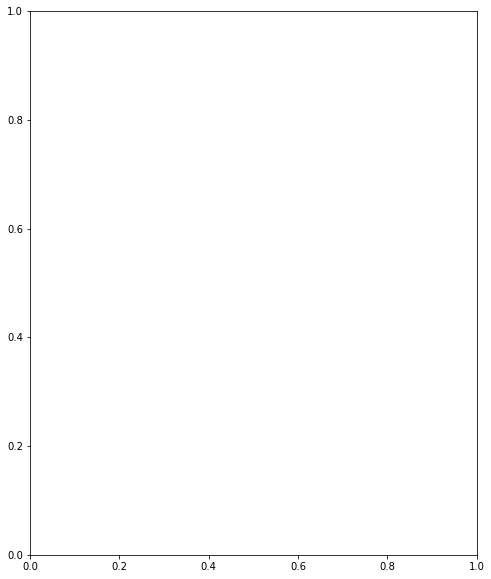

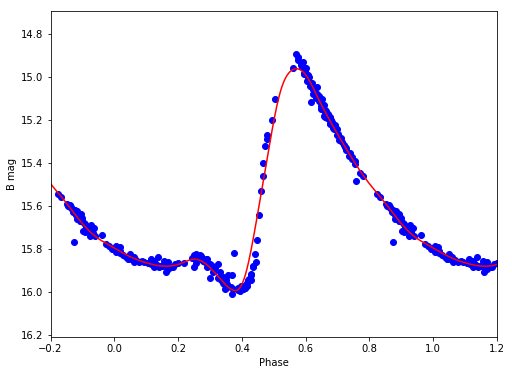

B 15.5521088879 1.03192889682


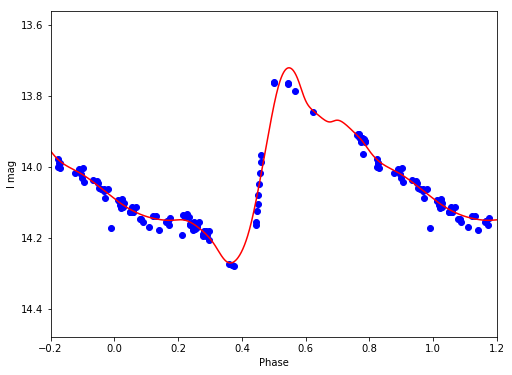

I 14.0186228654 0.549944228683


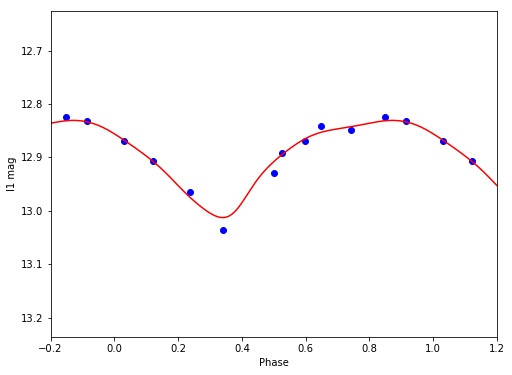

I1 12.8964761484 0.182023971692


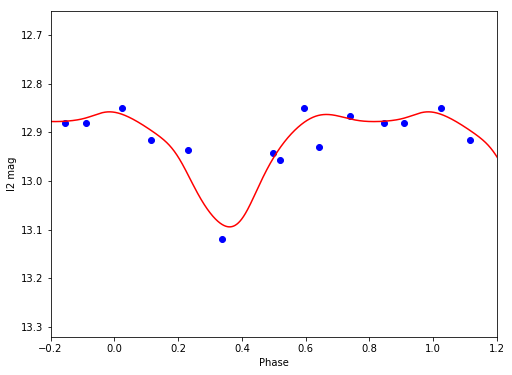

I2 12.9258643398 0.236313901053


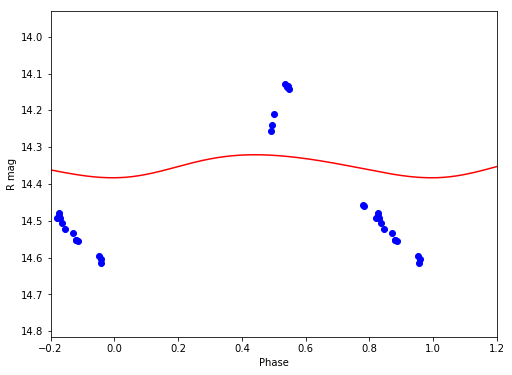

R 14.3496850809 0.0626362114604


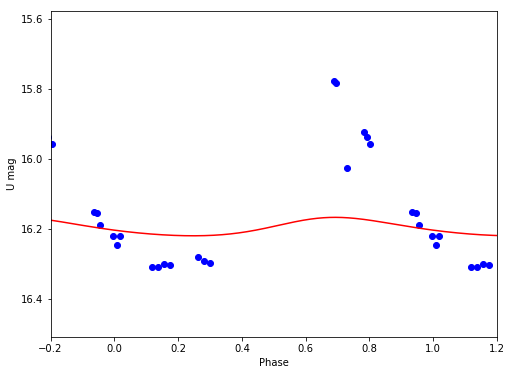

U 16.1955746904 0.0525631787837


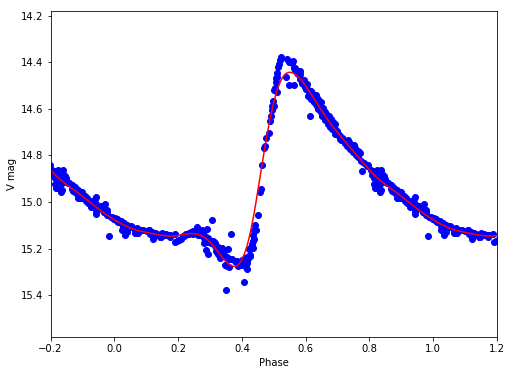

V 14.9086776344 0.832635221229
V27
/Volumes/Annie/CRRP/NGC3201/lcvs/V27.phased


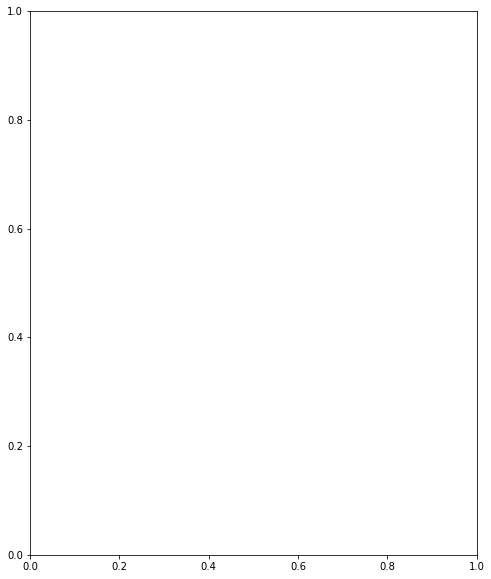

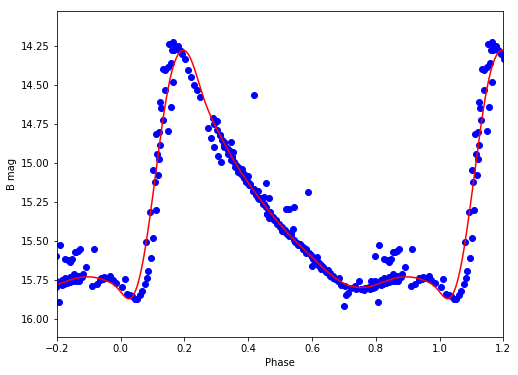

B 15.2314612885 1.59060731022


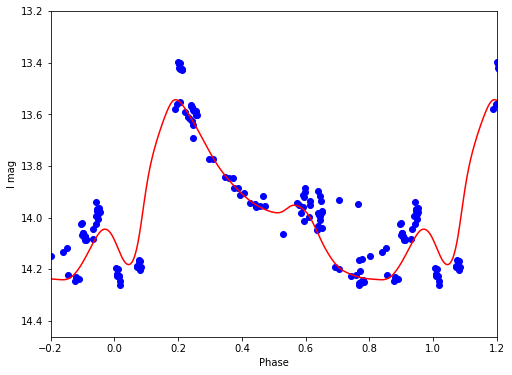

I 13.9579571045 0.698994169052


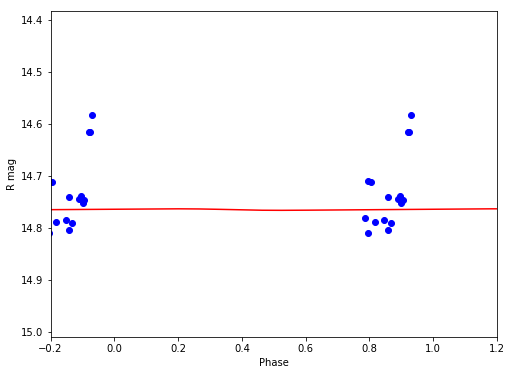

R 14.7649998131 0.00288406832658


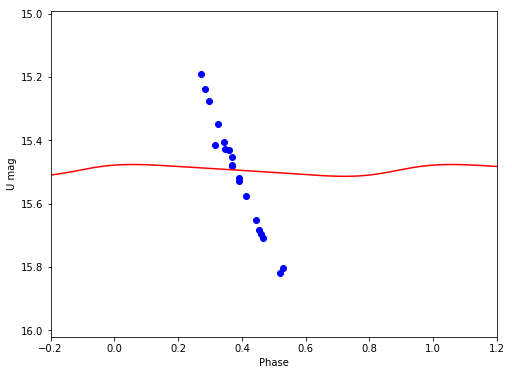

U 15.4941928654 0.0373772501001


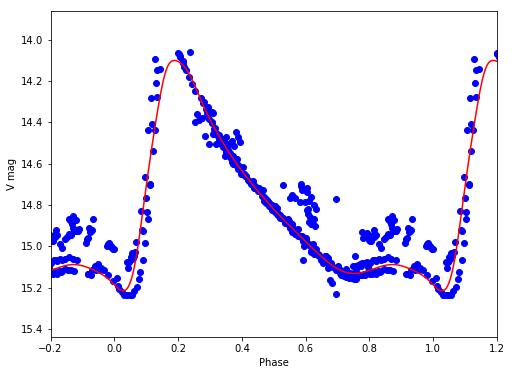

V 14.755885534 1.11520167673
V28
/Volumes/Annie/CRRP/NGC3201/lcvs/V28.phased


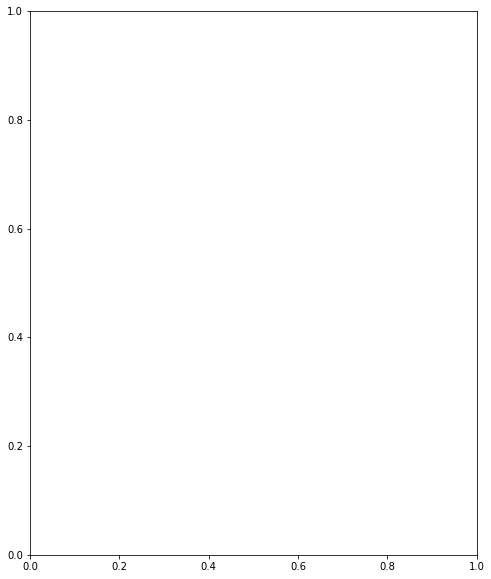

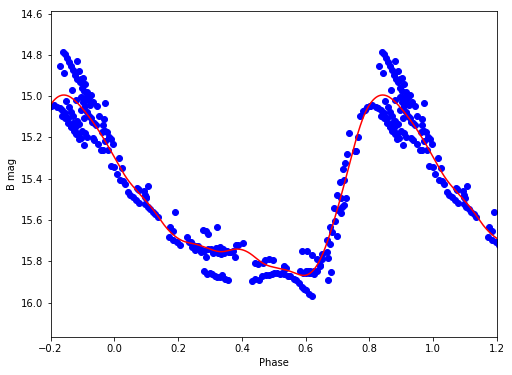

B 15.4928345814 0.874004242748


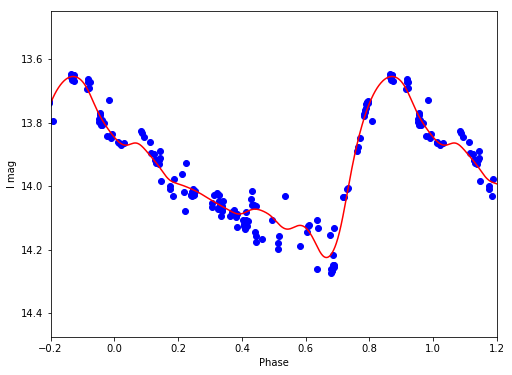

I 13.9544166578 0.569945159307


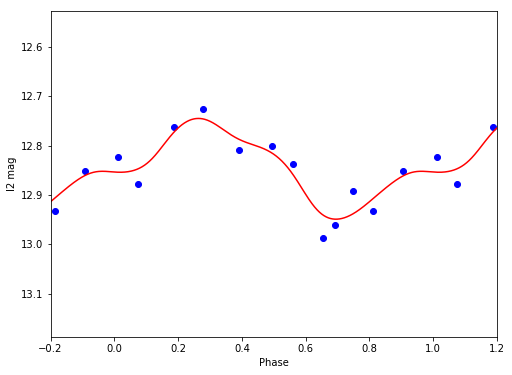

I2 12.8420770398 0.203867236705


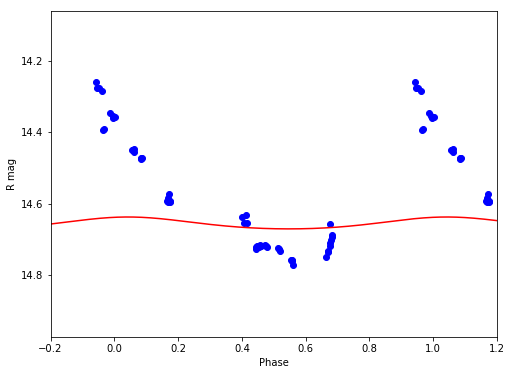

R 14.6553646026 0.0332355947396


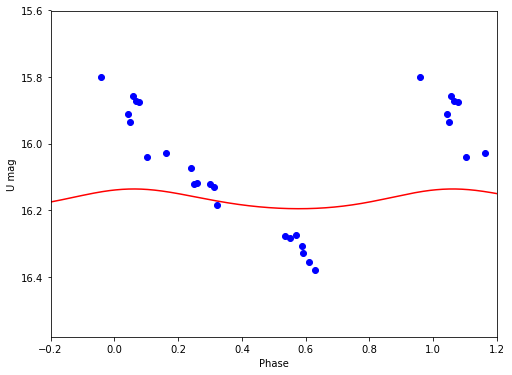

U 16.1686919149 0.0592475775175


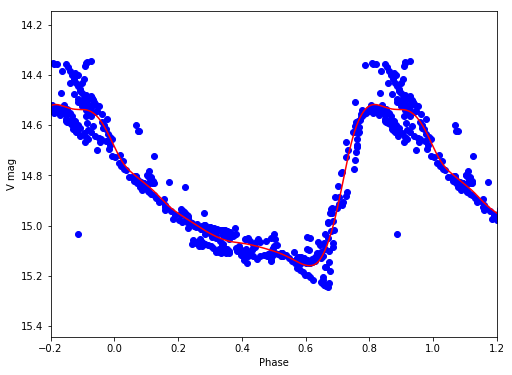

V 14.8582640146 0.643329695062
V29
/Volumes/Annie/CRRP/NGC3201/lcvs/V29.phased


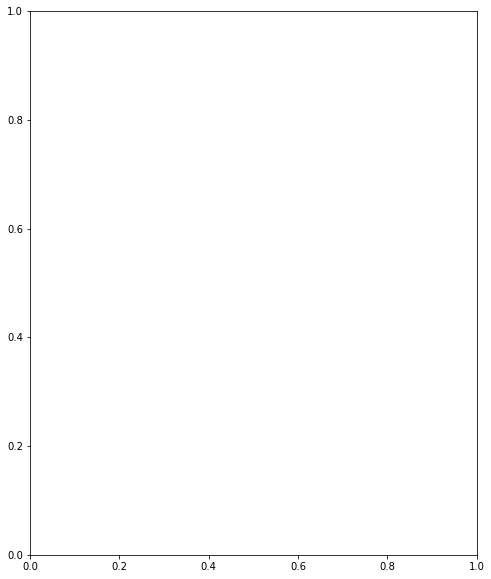

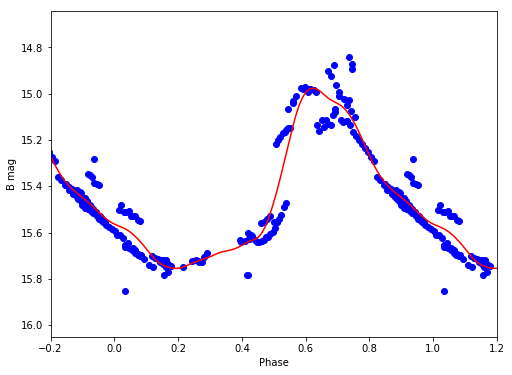

B 15.4251031376 0.777969207894


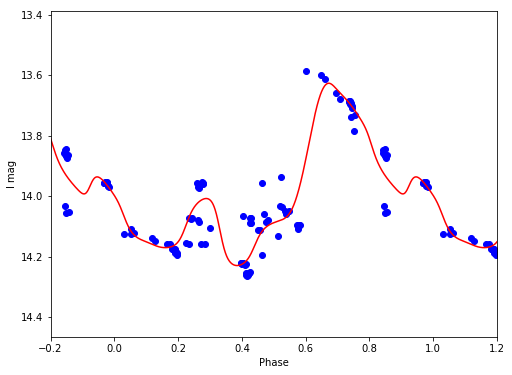

I 13.9802948244 0.603110165093


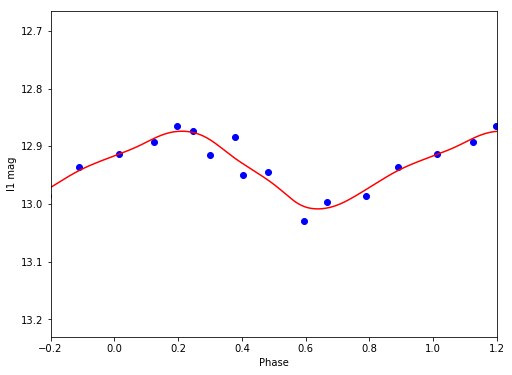

I1 12.9375622623 0.134559297188


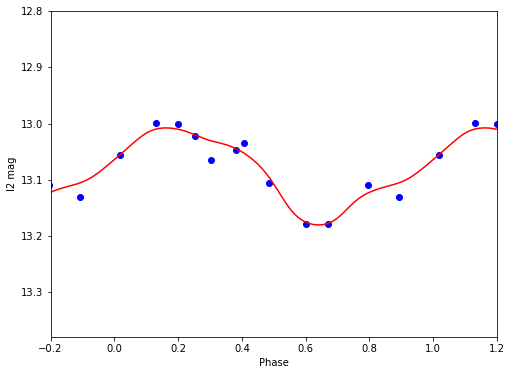

I2 13.0831724925 0.172532770703


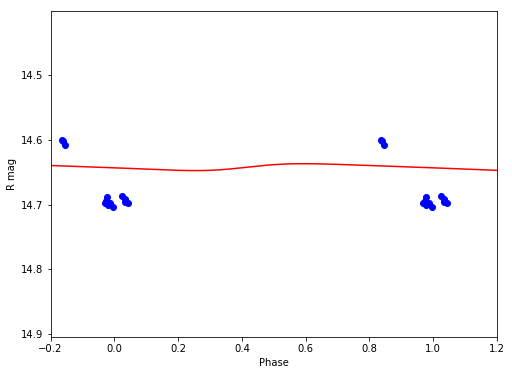

R 14.6421603929 0.0106276555663


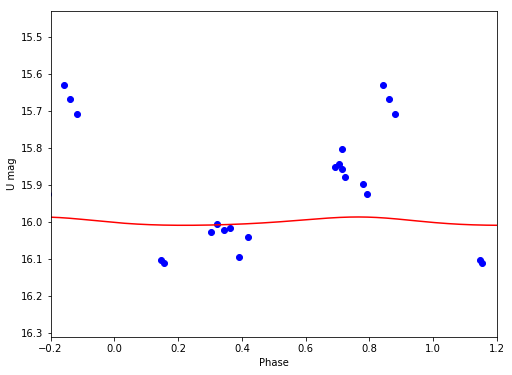

U 15.9998265285 0.0225089074262


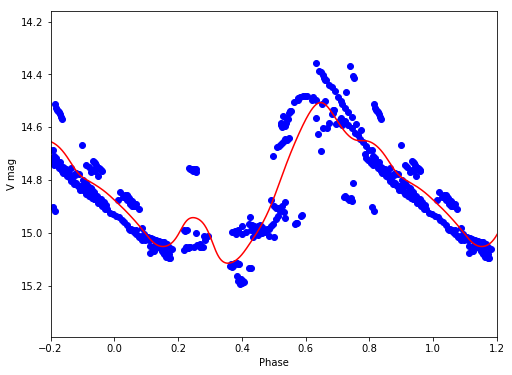

V 14.8280504843 0.608694158769
V30
/Volumes/Annie/CRRP/NGC3201/lcvs/V30.phased


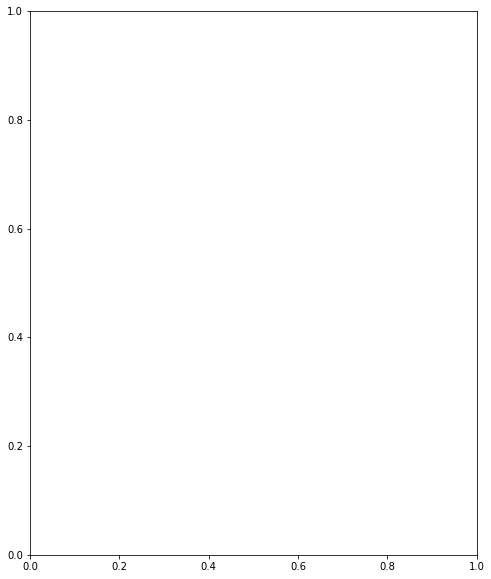

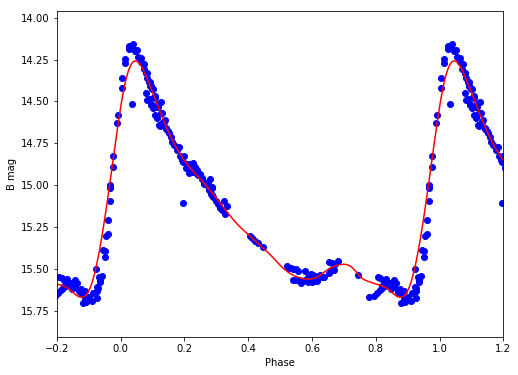

B 15.1032267824 1.4112258703


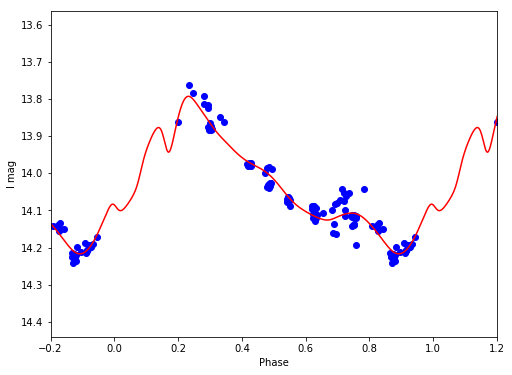

I 14.0244864373 0.424099506299


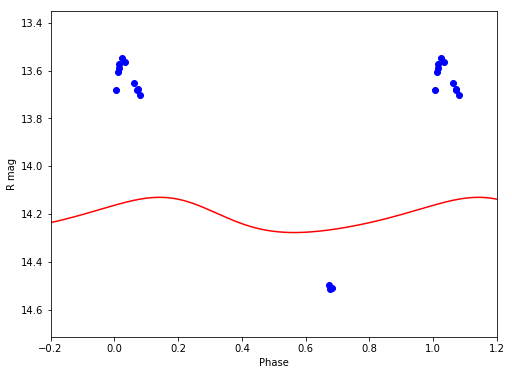

R 14.2091862409 0.147244606604


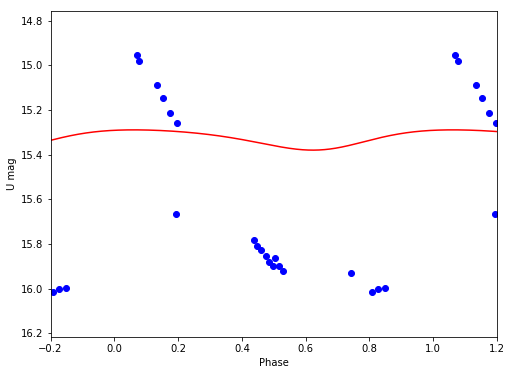

U 15.3265551667 0.0907795629237


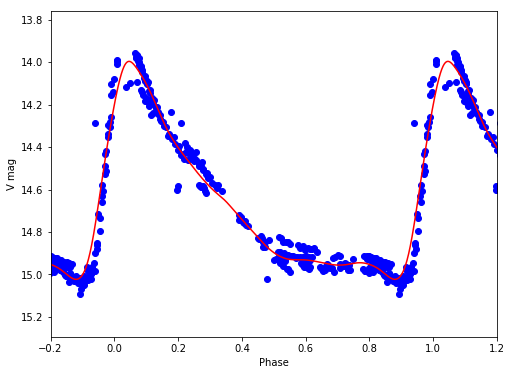

V 14.6254293102 1.02784315097
V31
/Volumes/Annie/CRRP/NGC3201/lcvs/V31.phased


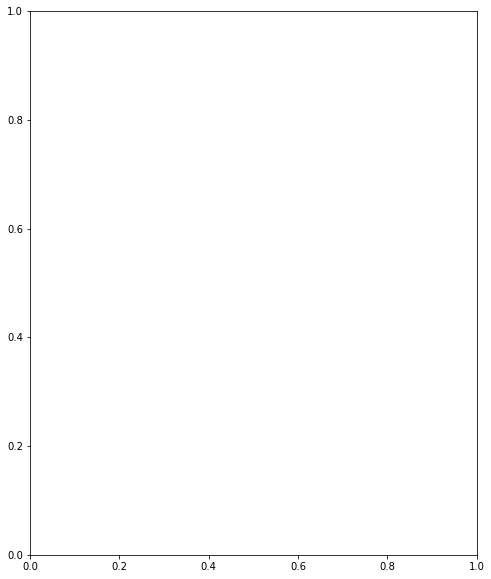

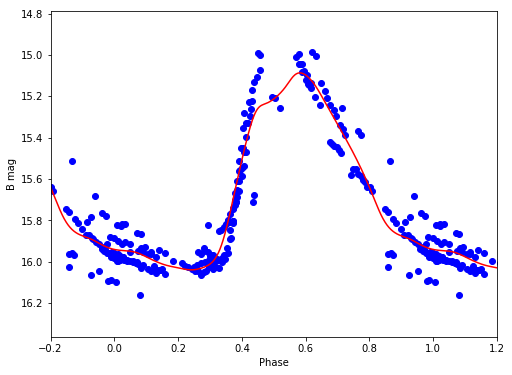

B 15.6076208612 0.951748362243


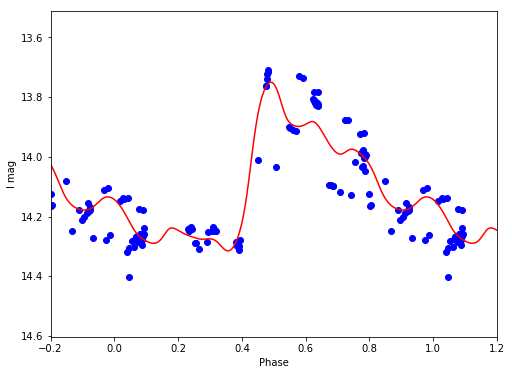

I 14.0870986163 0.564934683365


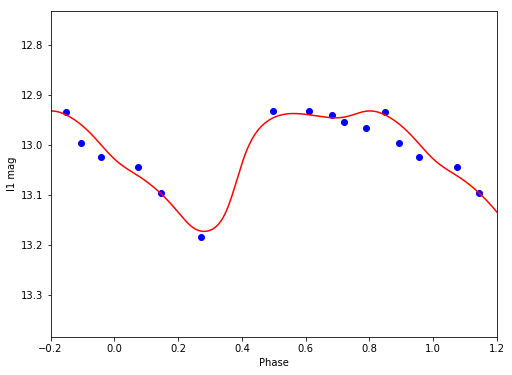

I1 13.0145315336 0.240817222734


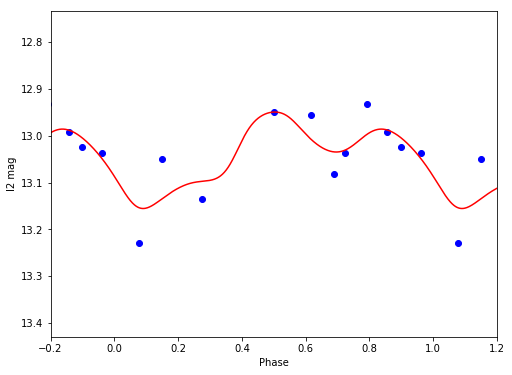

I2 13.0421904307 0.205884857086


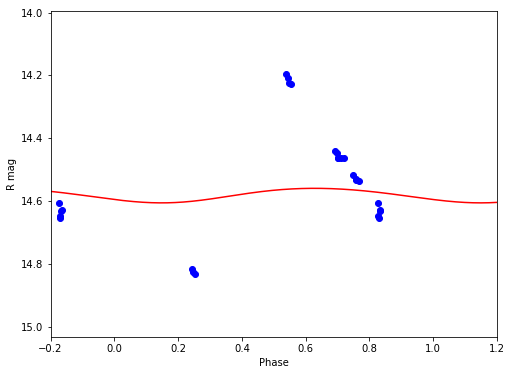

R 14.580633212 0.0462309958366


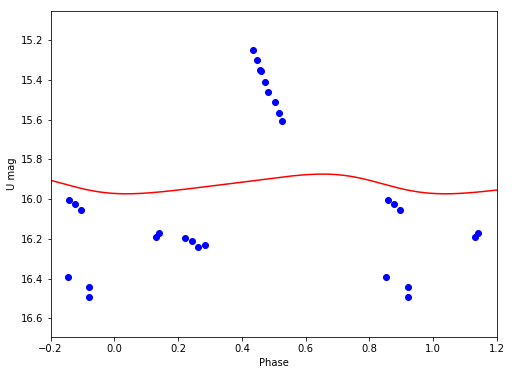

U 15.923898412 0.0991286483986


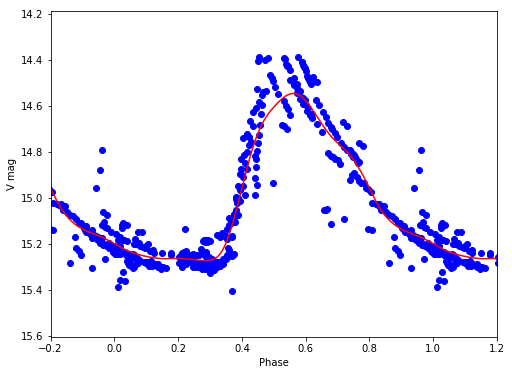

V 14.9672880209 0.727059008992
V32
/Volumes/Annie/CRRP/NGC3201/lcvs/V32.phased


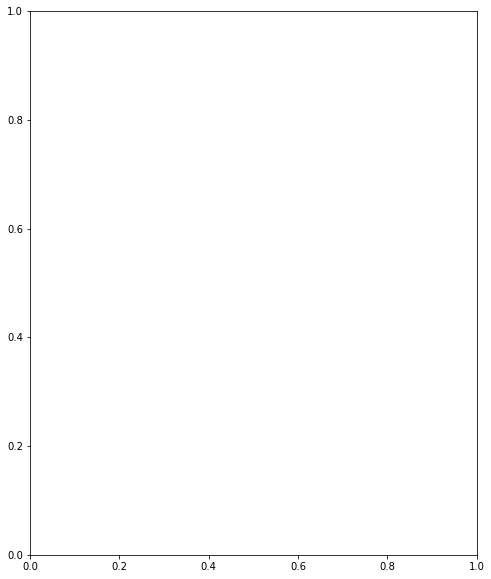

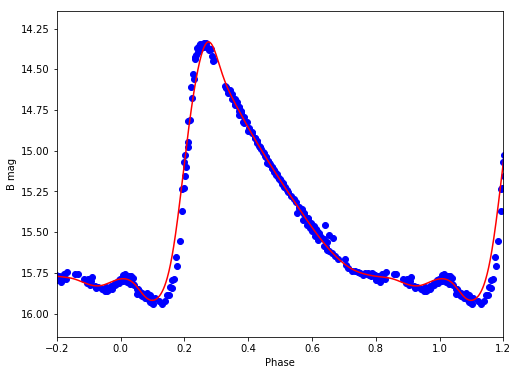

B 15.280862865 1.58636663287


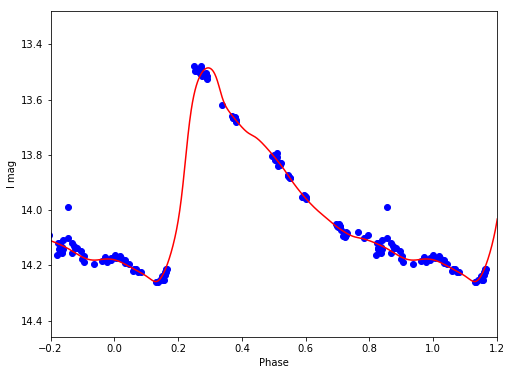

I 13.9469850853 0.773875665514
V34
/Volumes/Annie/CRRP/NGC3201/lcvs/V34.phased


lightcurves.py:1028: RuntimeWarning: divide by zero encountered in divide
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/lib/polynomial.py:584: RuntimeWarning: invalid value encountered in true_divide
  lhs /= scale


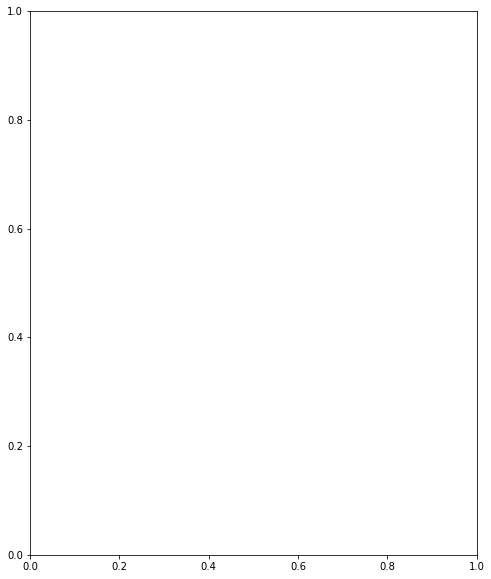

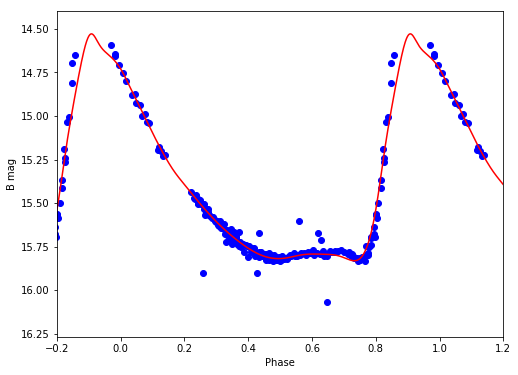

B 15.3196808435 1.30220892245


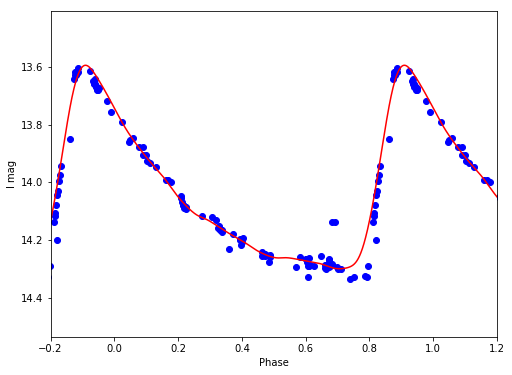

I 14.0370809335 0.703736288237


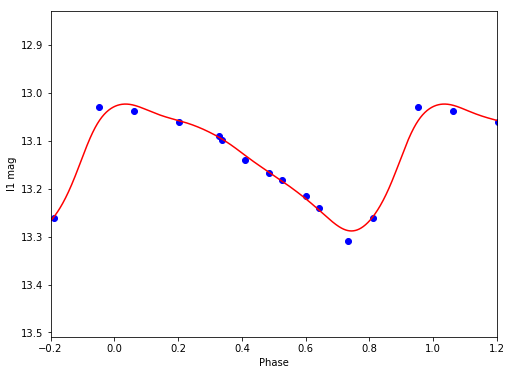

I1 13.1368182949 0.264537152055


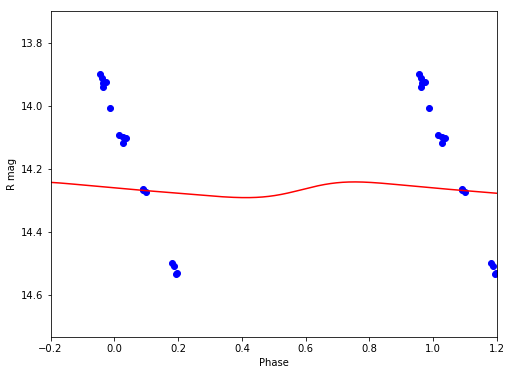

R 14.2665145348 0.0498968830872


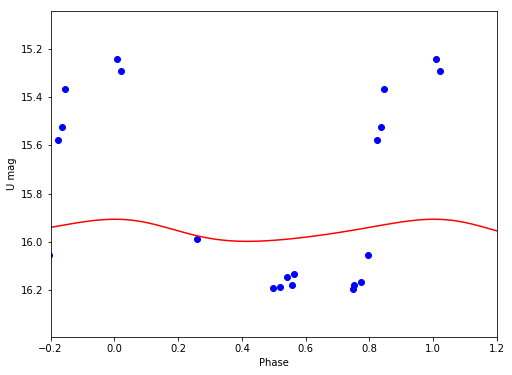

U 15.9550621313 0.0916670293479


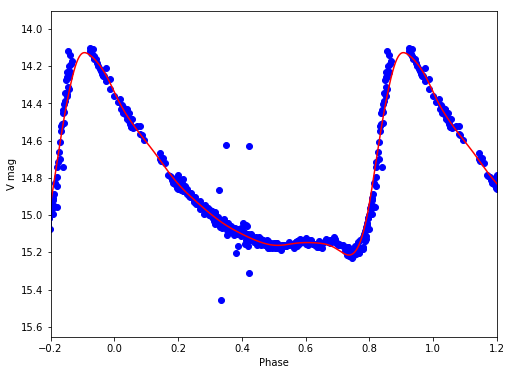

V 14.7823992739 1.08799880636
V35
/Volumes/Annie/CRRP/NGC3201/lcvs/V35.phased


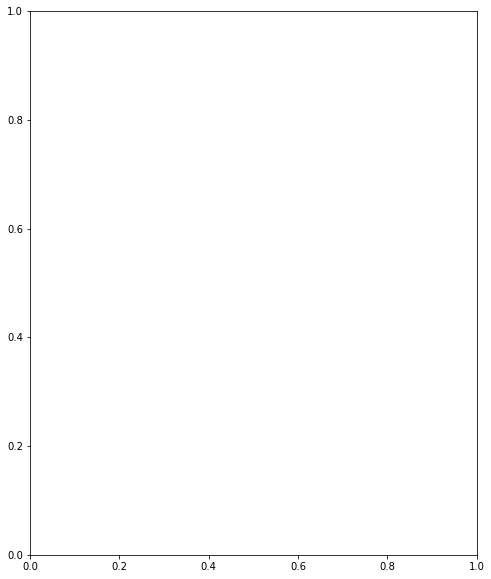

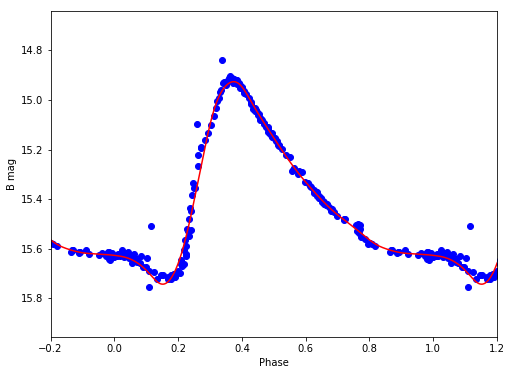

B 15.3855481792 0.816539887317


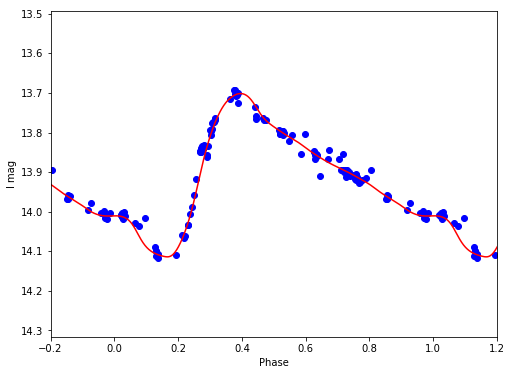

I 13.9059432105 0.412565139112


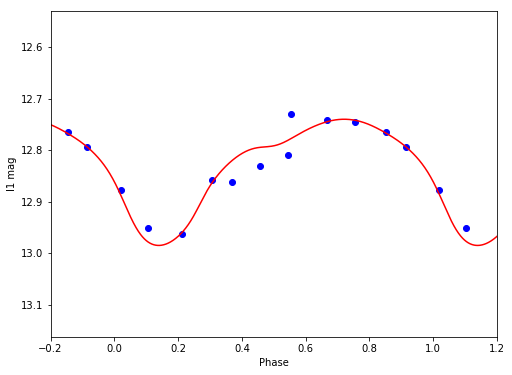

I1 12.8280986889 0.244919276023


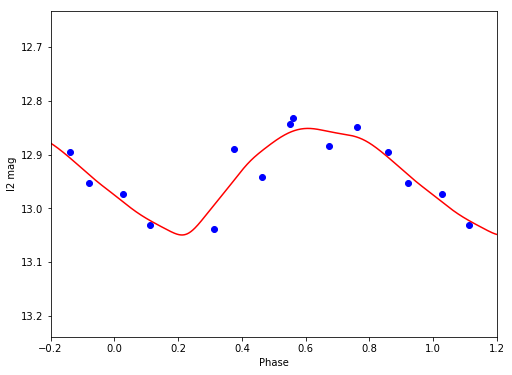

I2 12.934679515 0.197679206305


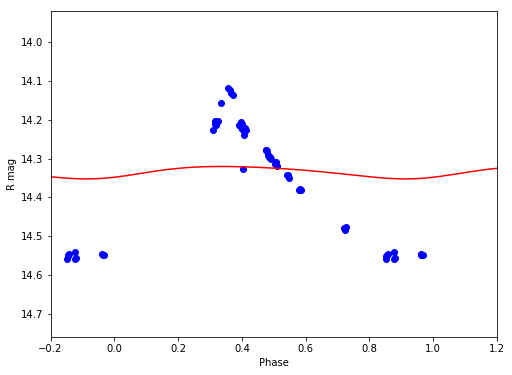

R 14.3342275914 0.0320551366212


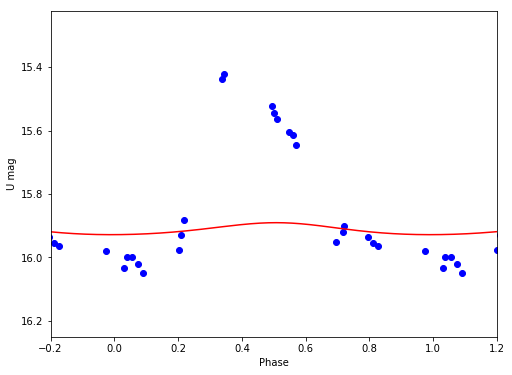

U 15.911331573 0.0377795509738


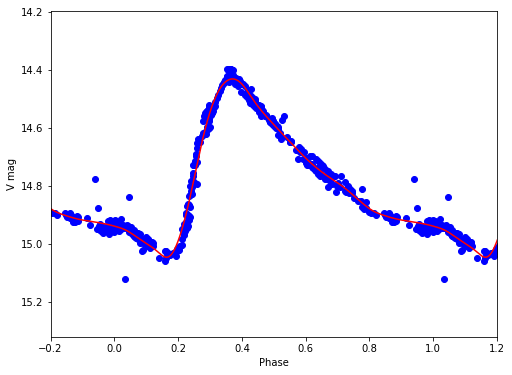

V 14.7642791683 0.613954509062
V36
/Volumes/Annie/CRRP/NGC3201/lcvs/V36.phased


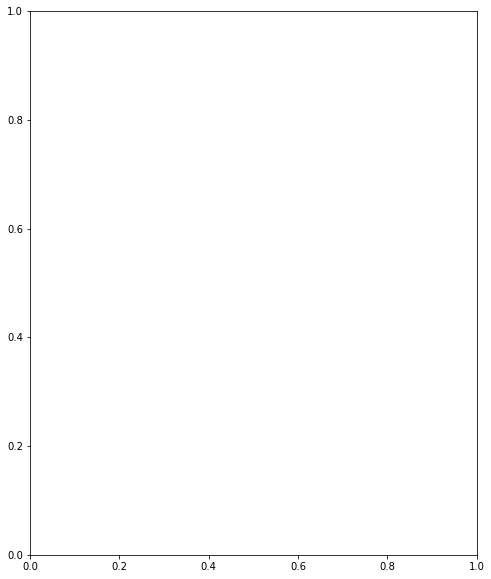

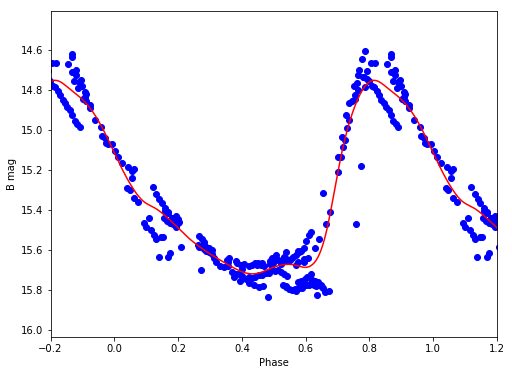

B 15.2980909825 0.968824757899


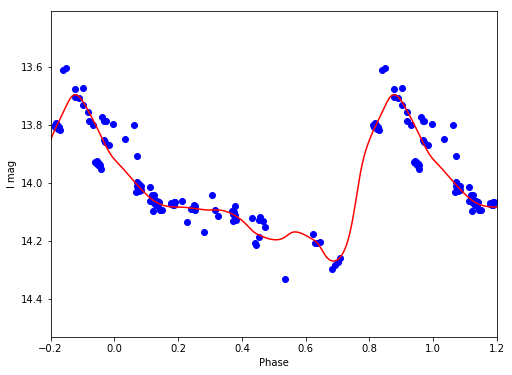

I 14.0357604012 0.575716518645


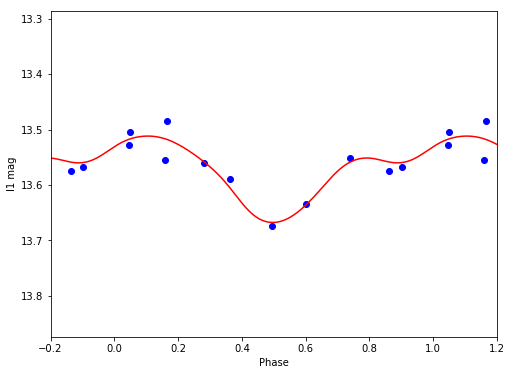

I1 13.5746728489 0.156015343245


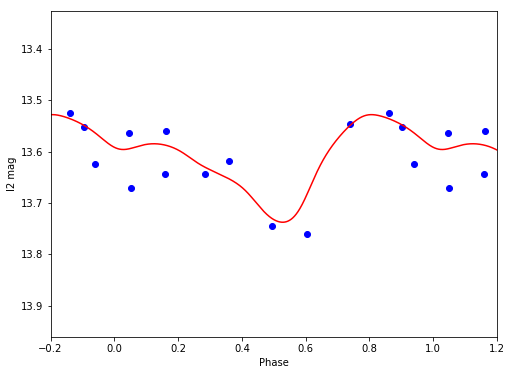

I2 13.613281114 0.209825023755


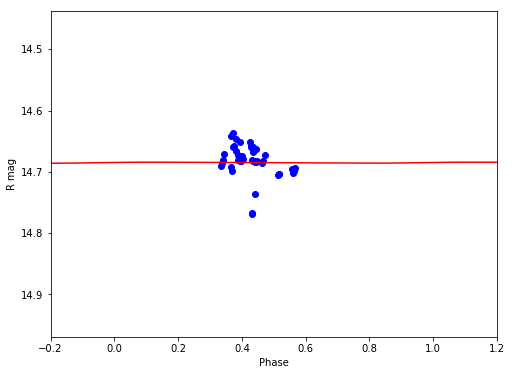

R 14.6849976809 0.00170612912335


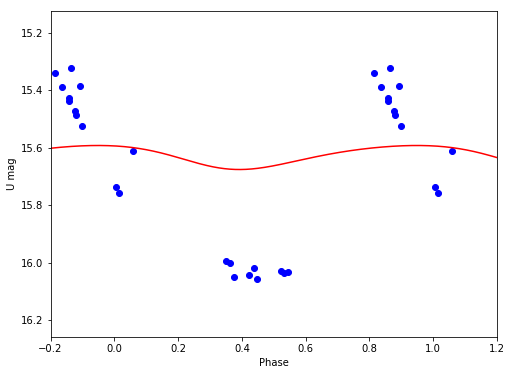

U 15.6286727846 0.0834455629932


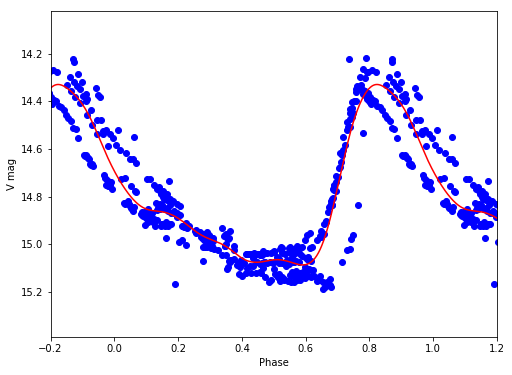

V 14.7833334861 0.757509314562
V37
/Volumes/Annie/CRRP/NGC3201/lcvs/V37.phased


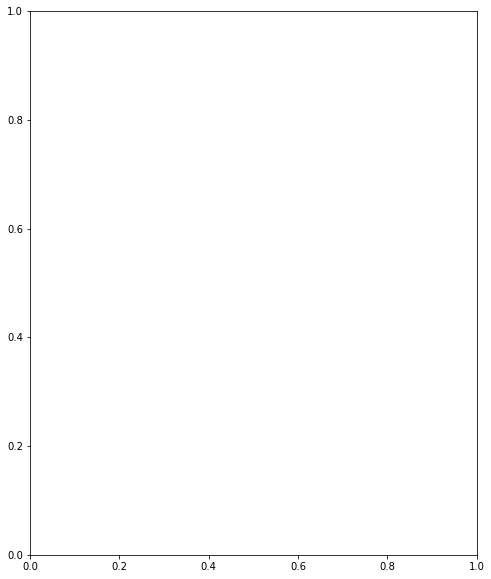

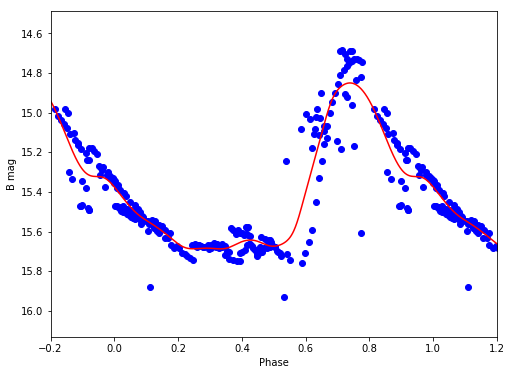

B 15.3721184936 0.836860275286


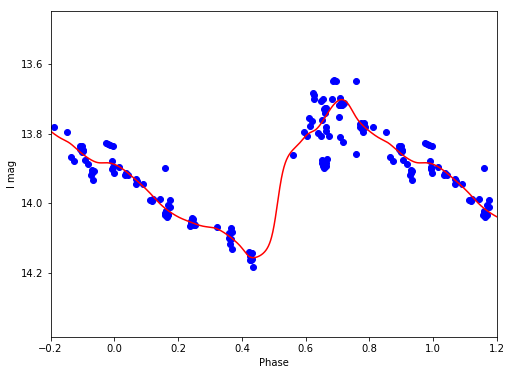

I 13.9224430328 0.454050910968


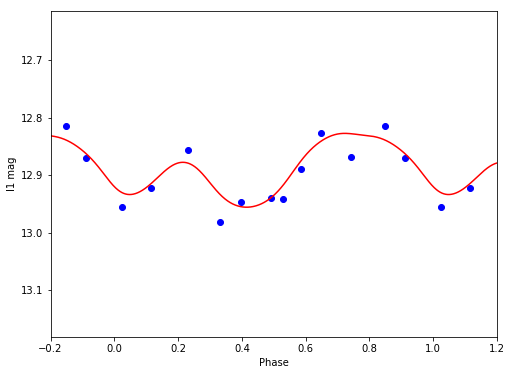

I1 12.8897805591 0.128347522258


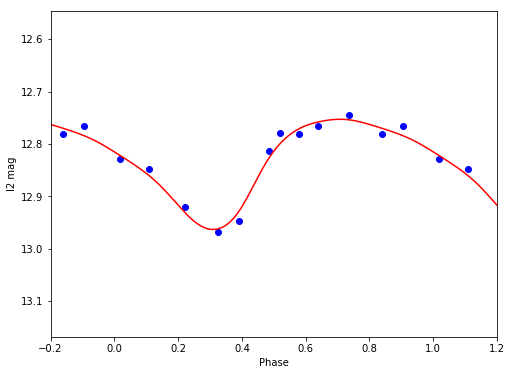

I2 12.8321365809 0.210391343831


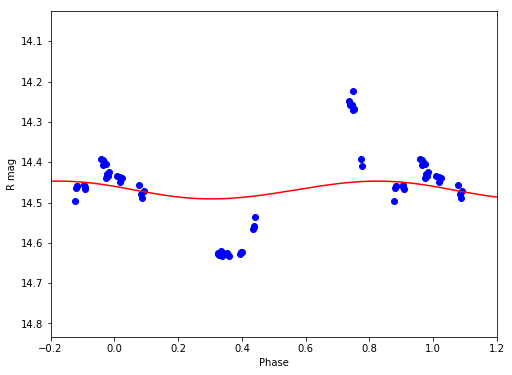

R 14.4689084817 0.0441095083953


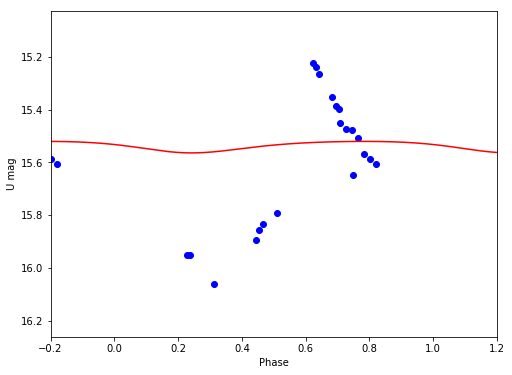

U 15.5372571364 0.0436026963252


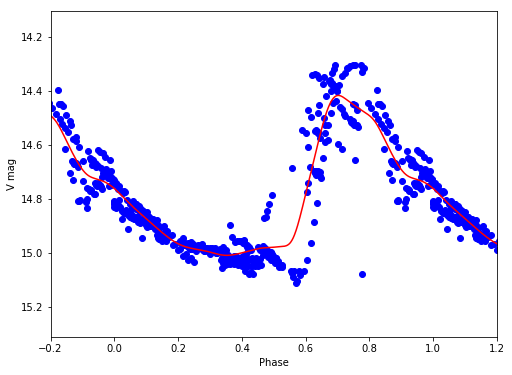

V 14.7774680376 0.591834286247
V38
/Volumes/Annie/CRRP/NGC3201/lcvs/V38.phased


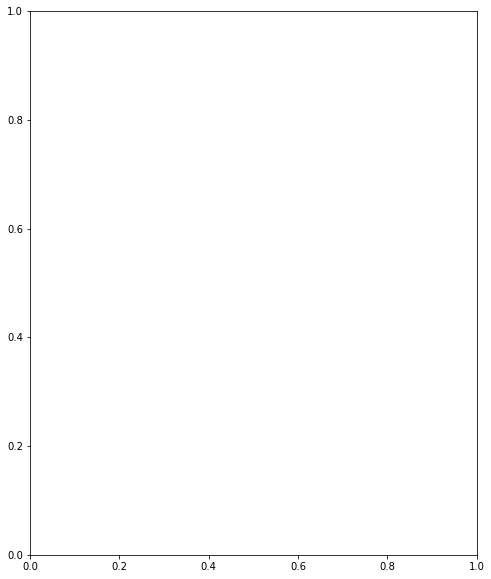

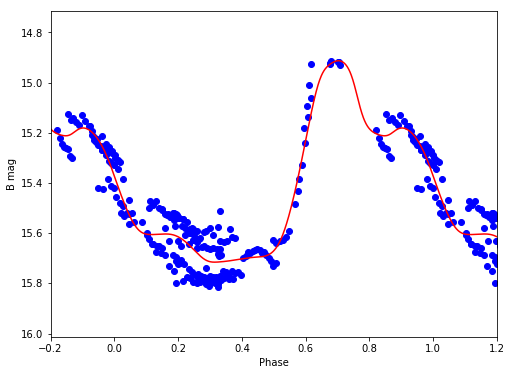

B 15.3821536826 0.802892608787


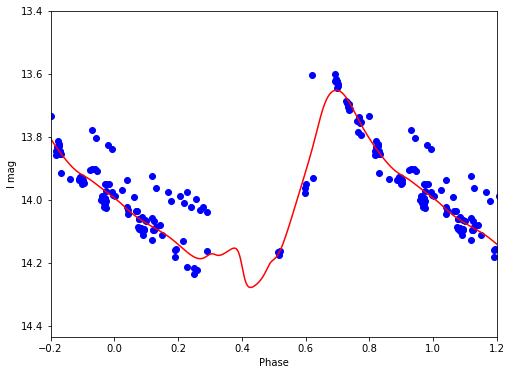

I 13.9944233104 0.626101490146


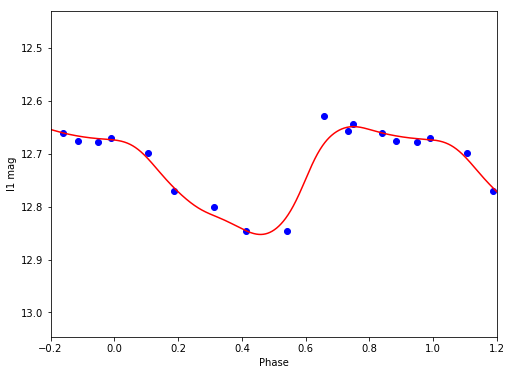

I1 12.7352365135 0.203981719379


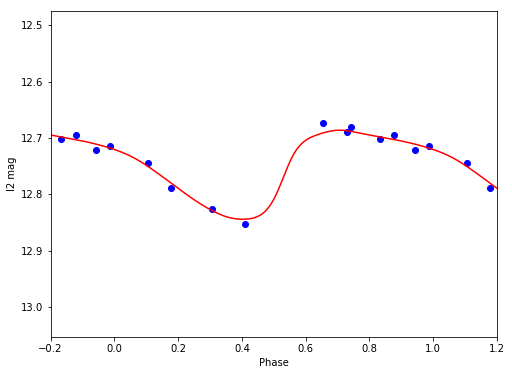

I2 12.7512530906 0.158146834242


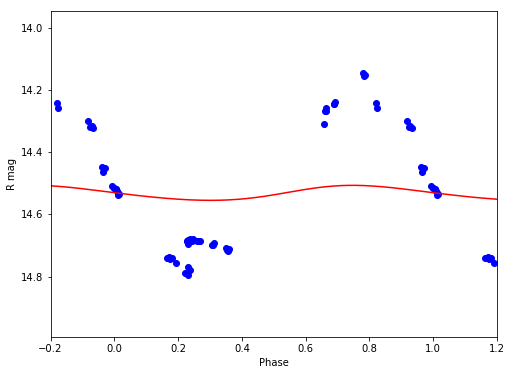

R 14.5316415833 0.048273350461


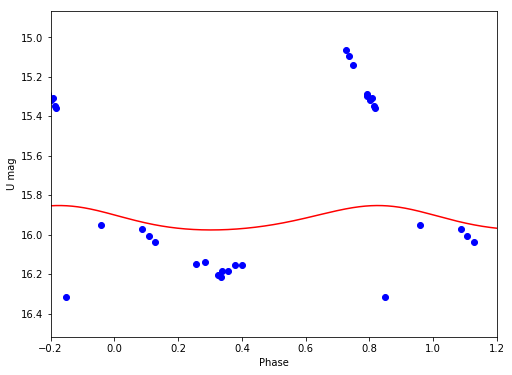

U 15.9203819534 0.123779128013


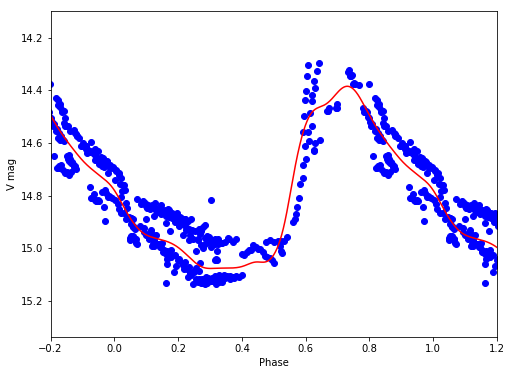

V 14.772180789 0.692050538168
V39
/Volumes/Annie/CRRP/NGC3201/lcvs/V39.phased


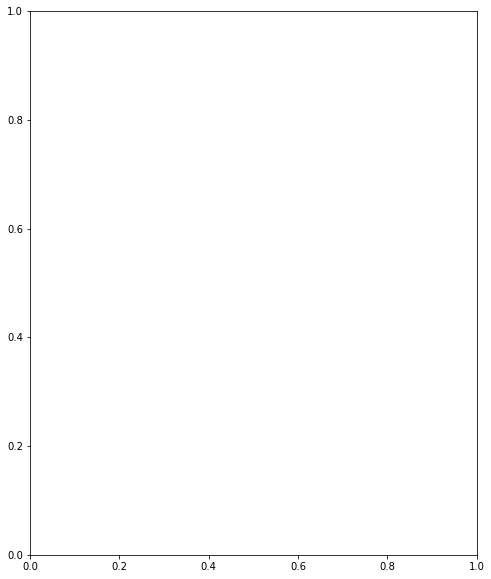

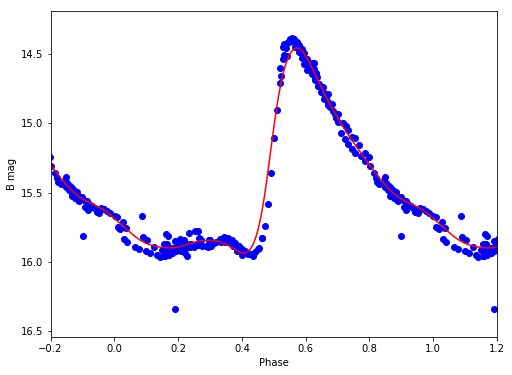

B 15.3472285067 1.47927457619


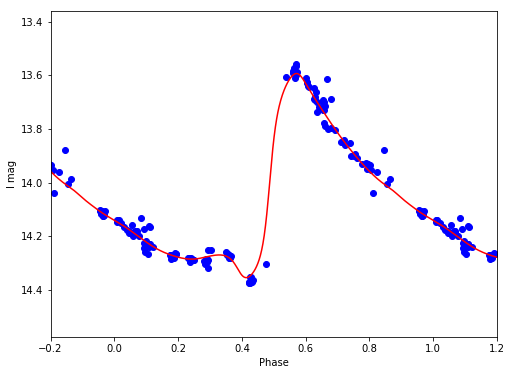

I 14.0347381231 0.760413320301


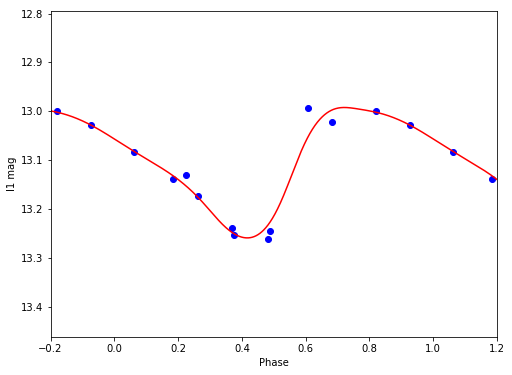

I1 13.100868526 0.267089369455


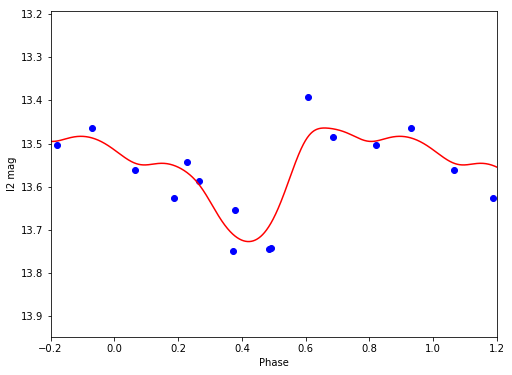

I2 13.5557218454 0.263252066522


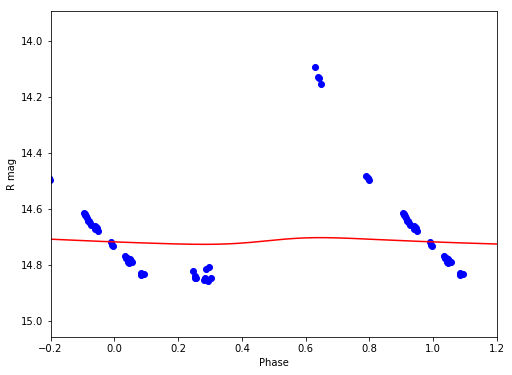

R 14.7148033073 0.0239200410904


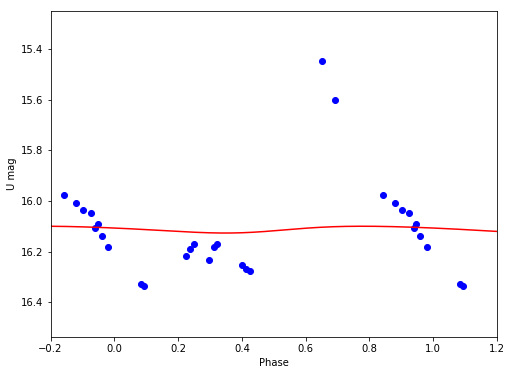

U 16.1119144796 0.0268041408381


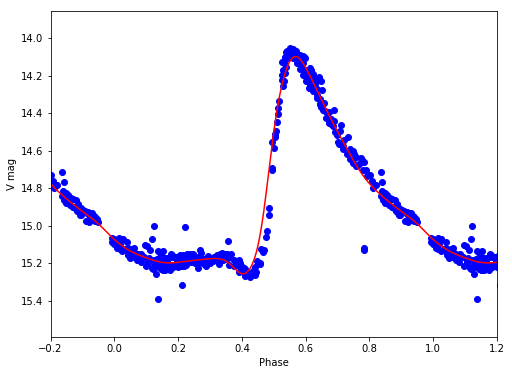

V 14.8089214847 1.15812769556
V40
/Volumes/Annie/CRRP/NGC3201/lcvs/V40.phased


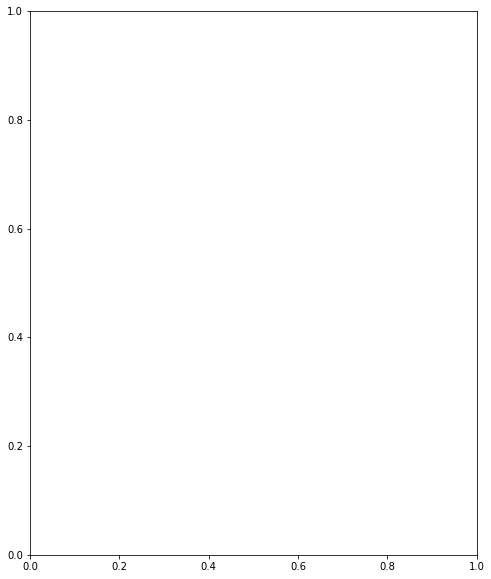

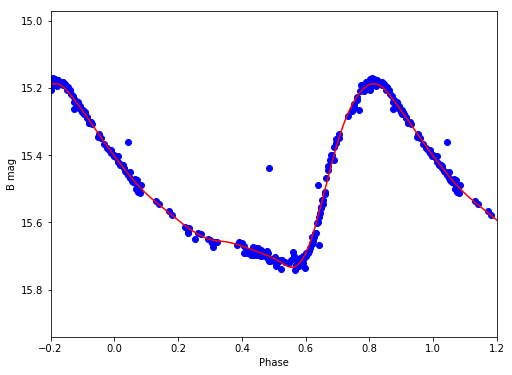

B 15.4894923005 0.547651472936


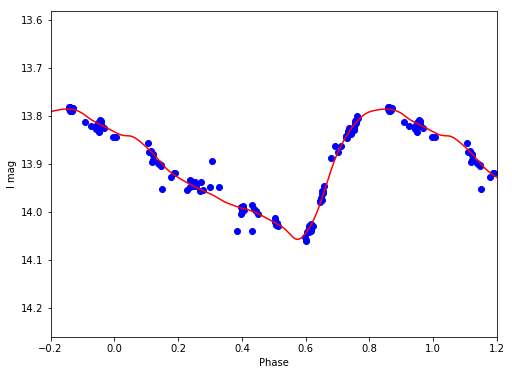

I 13.9083763382 0.271519073548


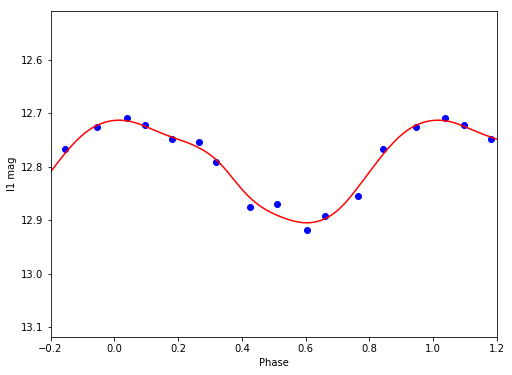

I1 12.8009442777 0.191908106625


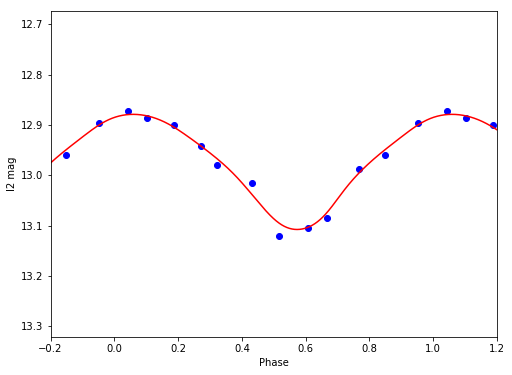

I2 12.9758497219 0.228733523911


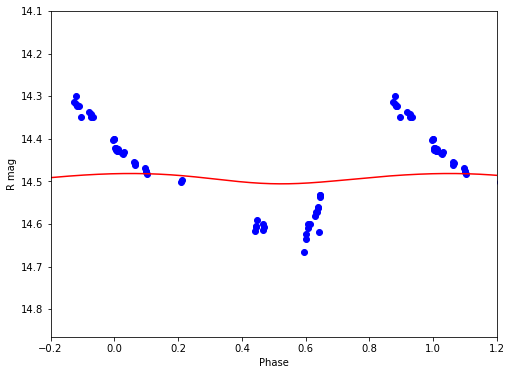

R 14.4928225874 0.0242437362957


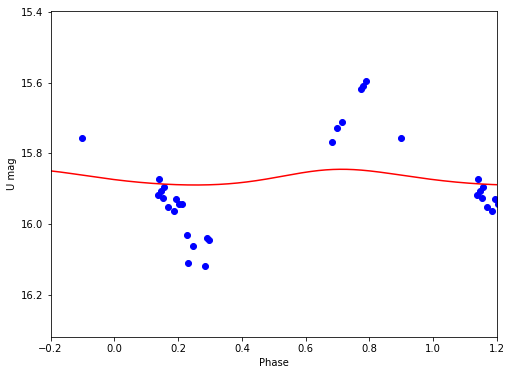

U 15.8694622917 0.0444775826146


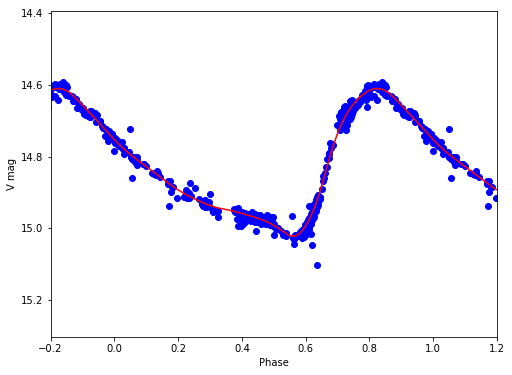

V 14.8284301295 0.412098354856
V41
/Volumes/Annie/CRRP/NGC3201/lcvs/V41.phased


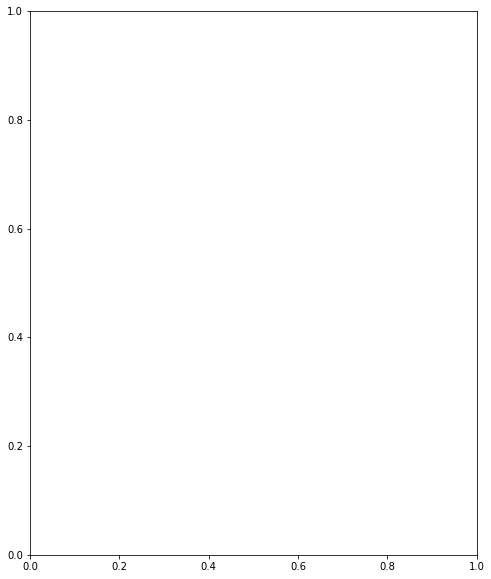

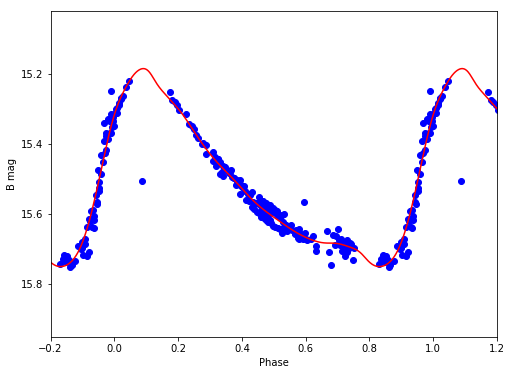

B 15.4994020446 0.564562534326


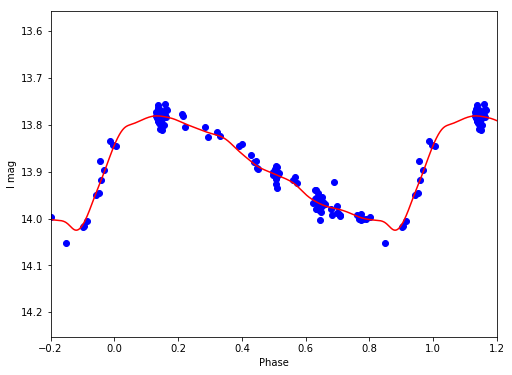

I 13.8911084767 0.243611092066


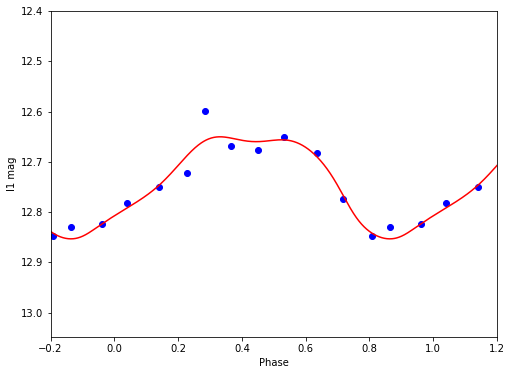

I1 12.7328227565 0.203053720765


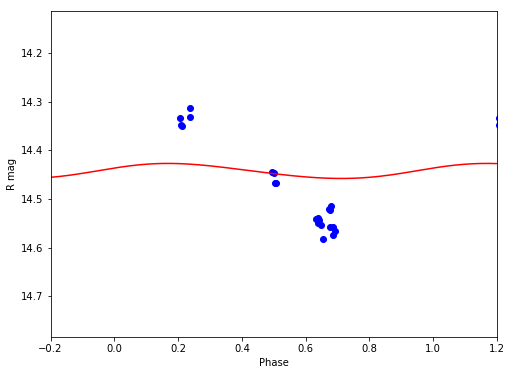

R 14.4425692159 0.0308889556419


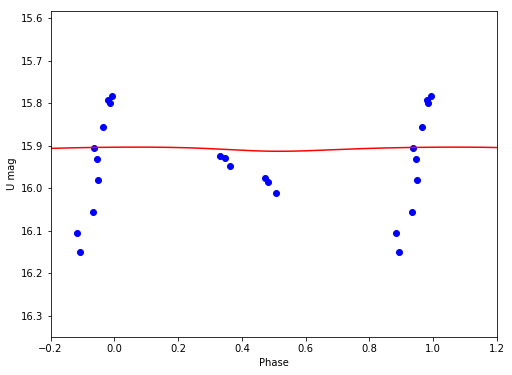

U 15.9069802132 0.0097967032349


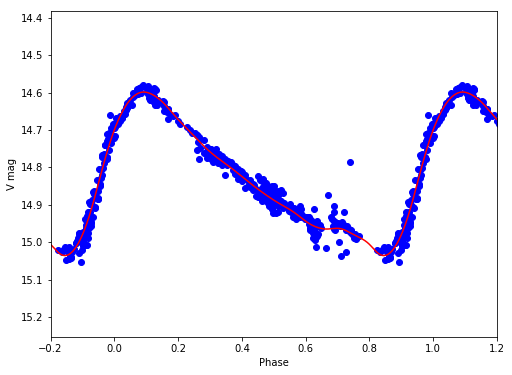

V 14.8250818327 0.437093457741
V42
/Volumes/Annie/CRRP/NGC3201/lcvs/V42.phased


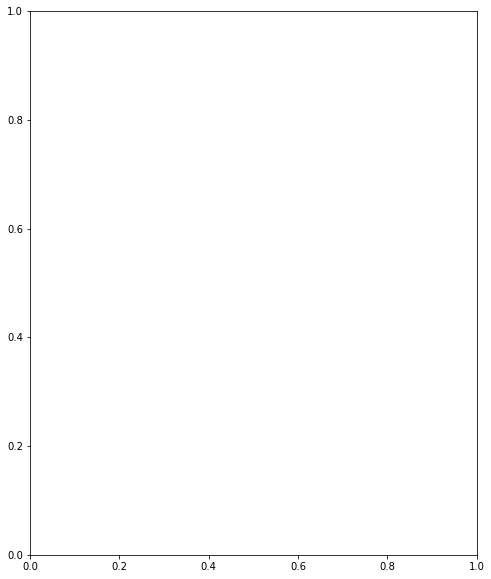

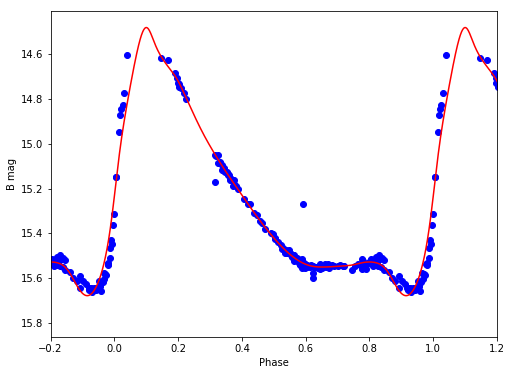

B 15.1762418272 1.19692606926


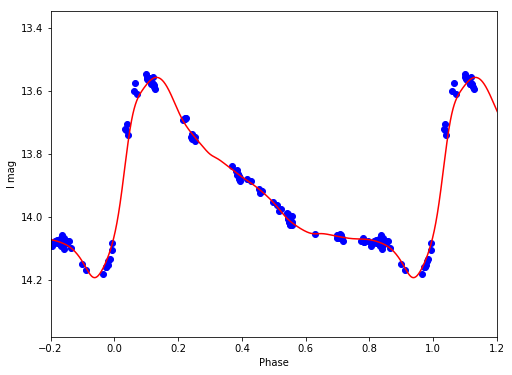

I 13.9063576281 0.63547236999


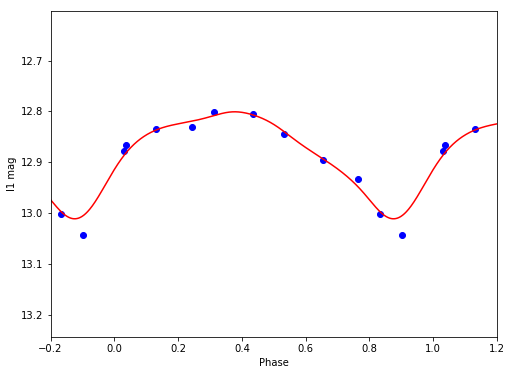

I1 12.8766498381 0.210265196223


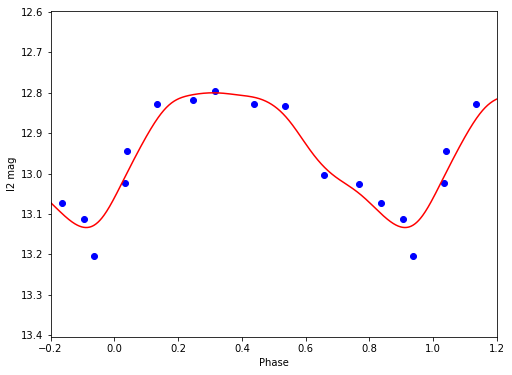

I2 12.9303416617 0.33333607432


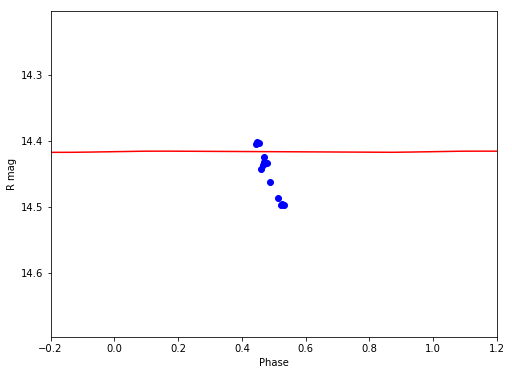

R 14.4161053164 0.00182975856373


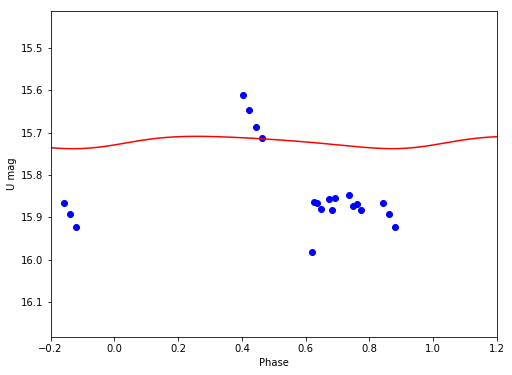

U 15.7216044002 0.0291263928907


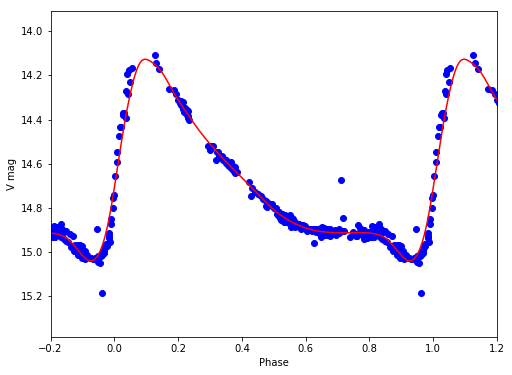

V 14.6479421836 0.912776149012
V43
/Volumes/Annie/CRRP/NGC3201/lcvs/V43.phased


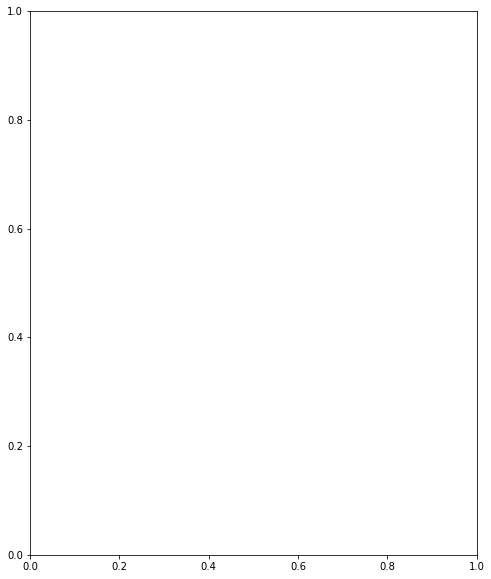

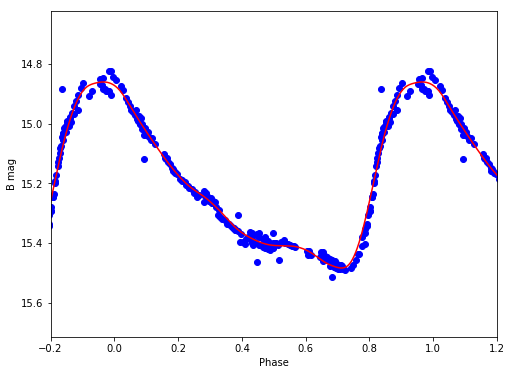

B 15.1961396122 0.621182789721


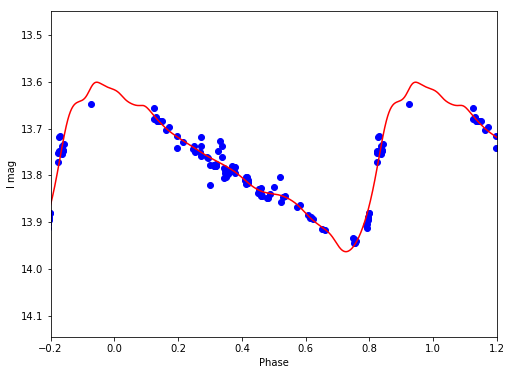

I 13.7658631351 0.362170604883


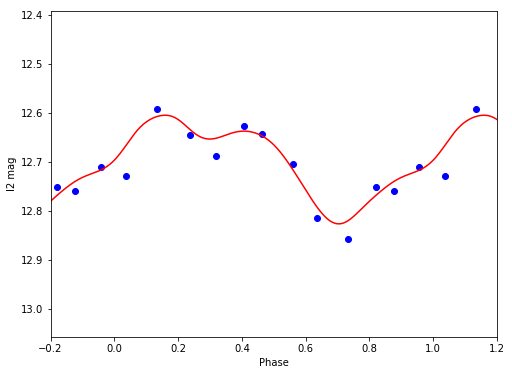

I2 12.6962508563 0.221455956823


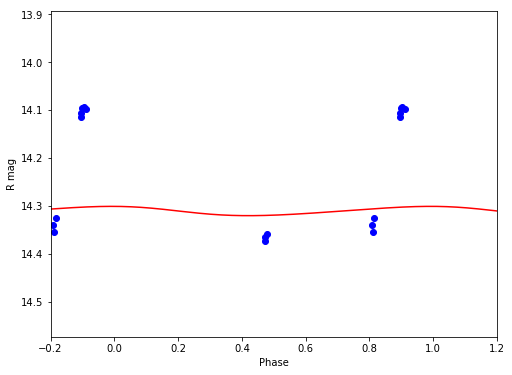

R 14.3099363944 0.0193756689855


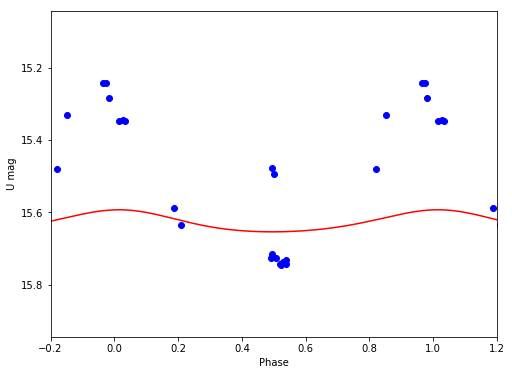

U 15.6274833299 0.061188428999


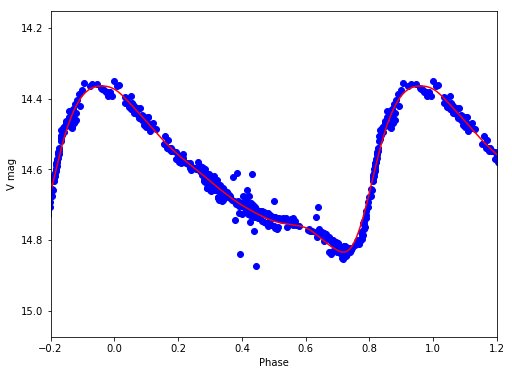

V 14.6020955925 0.469703758464
V44
/Volumes/Annie/CRRP/NGC3201/lcvs/V44.phased


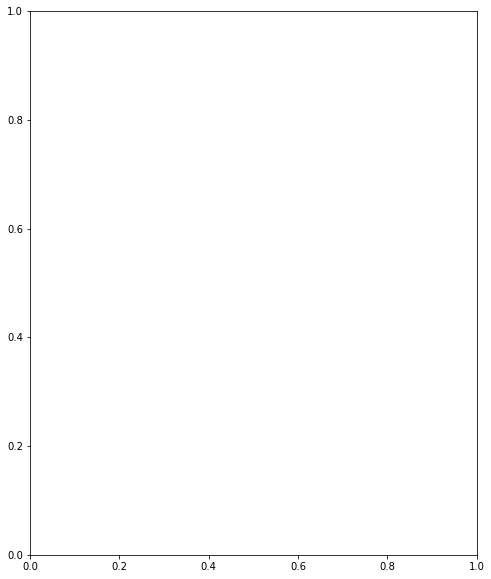

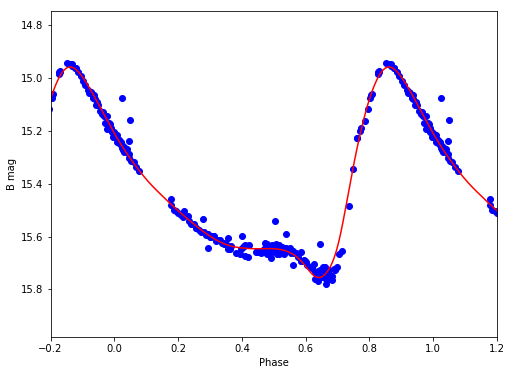

B 15.4102343257 0.798000020228


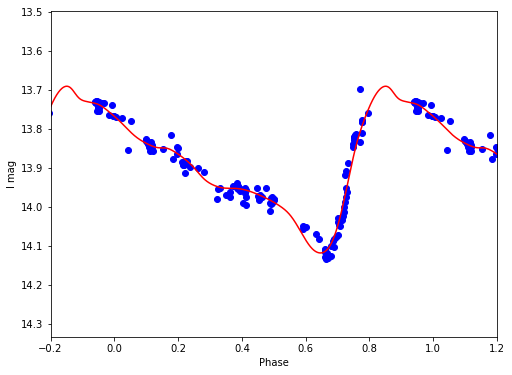

I 13.887221579 0.427854993773


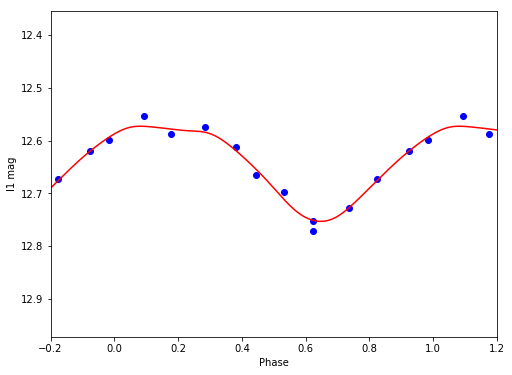

I1 12.6436080876 0.180527745087


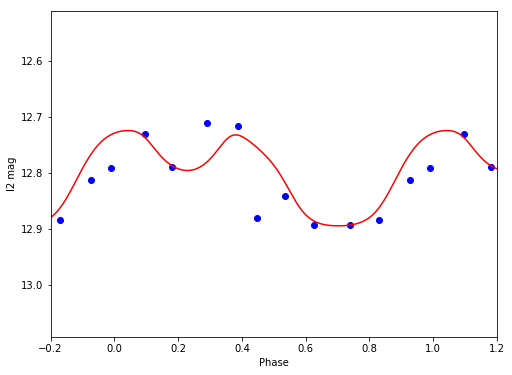

I2 12.7978176815 0.170081393406


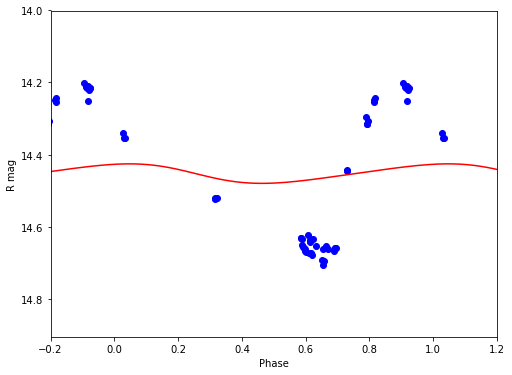

R 14.4525137246 0.0541025600884


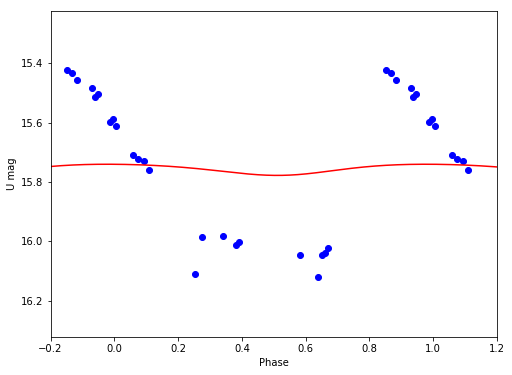

U 15.7565340773 0.0376100002195


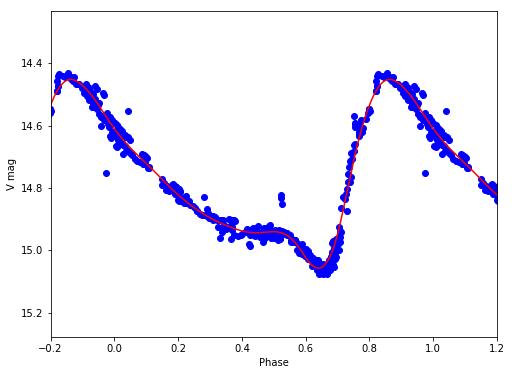

V 14.7735942536 0.60587042388
V45
/Volumes/Annie/CRRP/NGC3201/lcvs/V45.phased


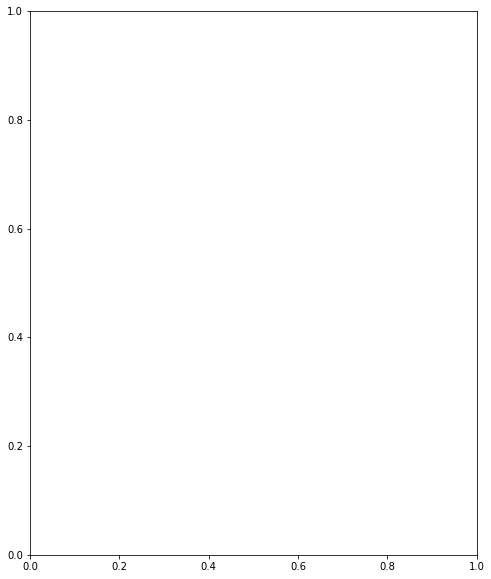

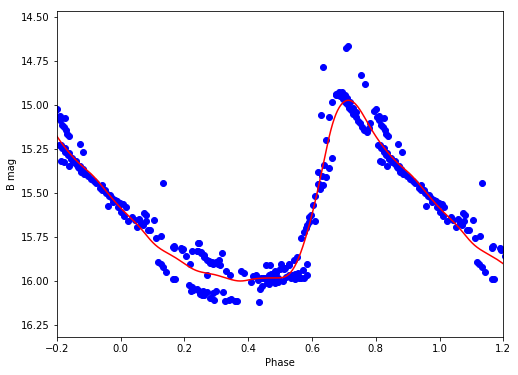

B 15.5812012413 1.0273459021


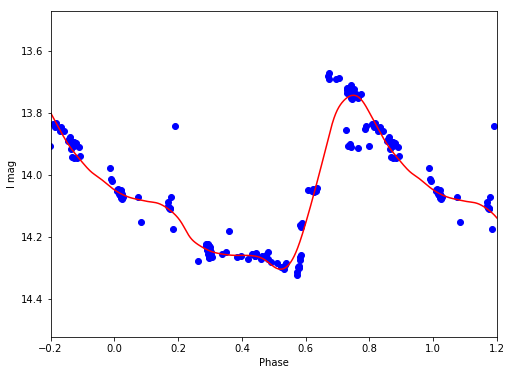

I 14.0648985763 0.559851803313


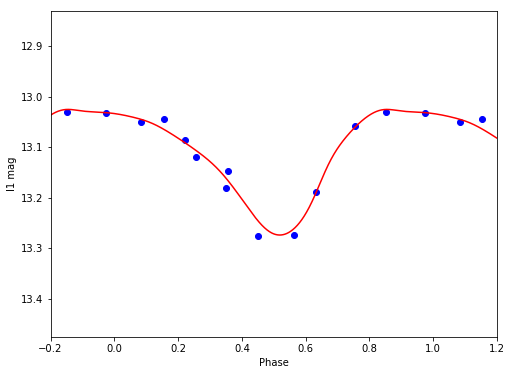

I1 13.1132537166 0.248422641255


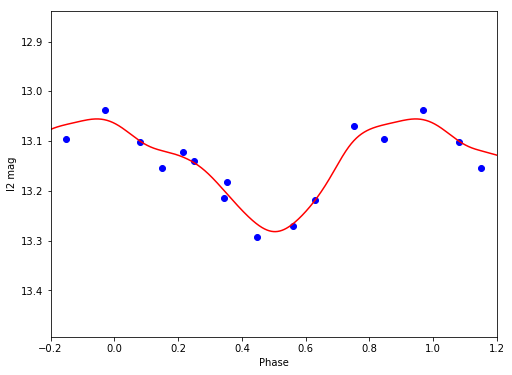

I2 13.1487430908 0.226333770699


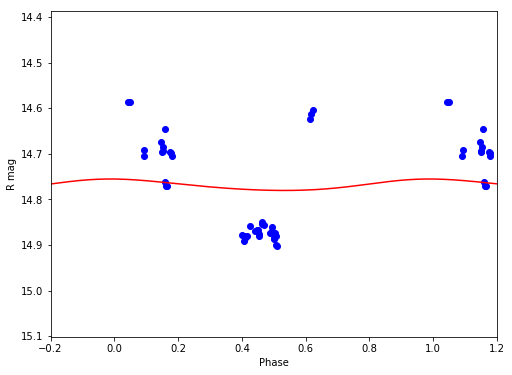

R 14.7686778713 0.0251446159429


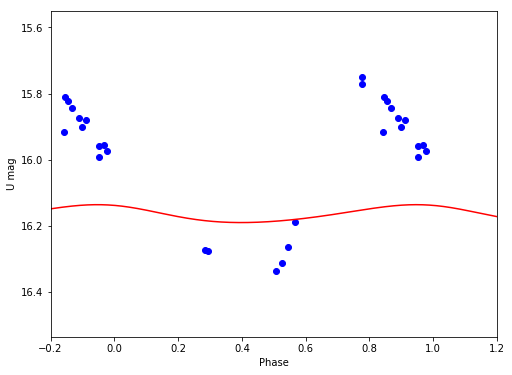

U 16.1658515902 0.0541738181341


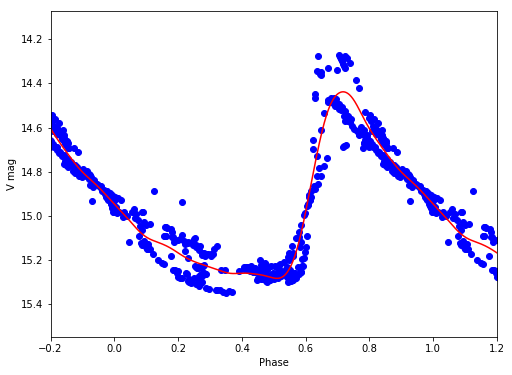

V 14.9443939347 0.844324564028
V46
/Volumes/Annie/CRRP/NGC3201/lcvs/V46.phased


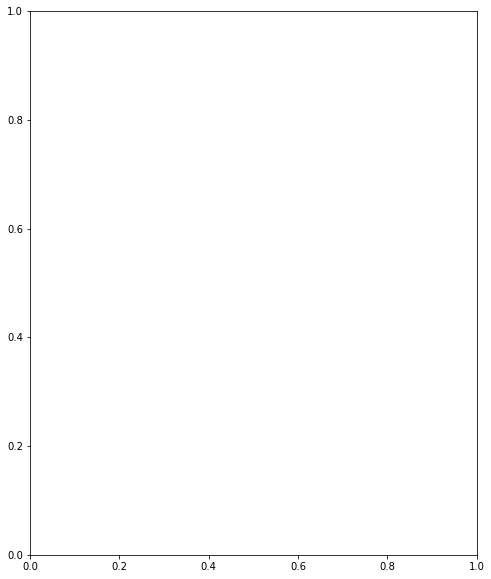

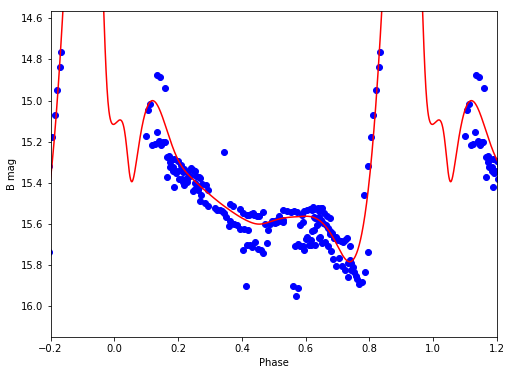

B 15.0632333123 2.27347094357


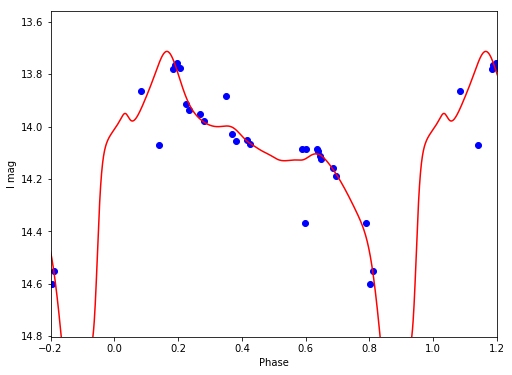

I 14.1210436238 1.54062607559


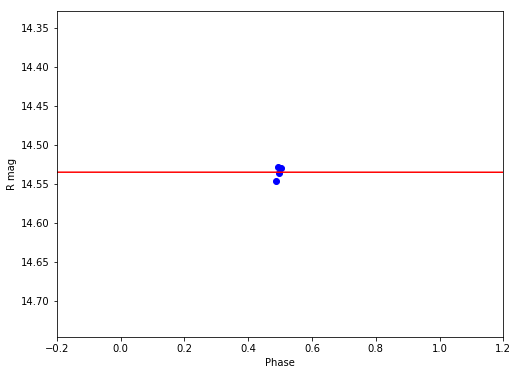

R 14.5350831141 8.72882167897e-05


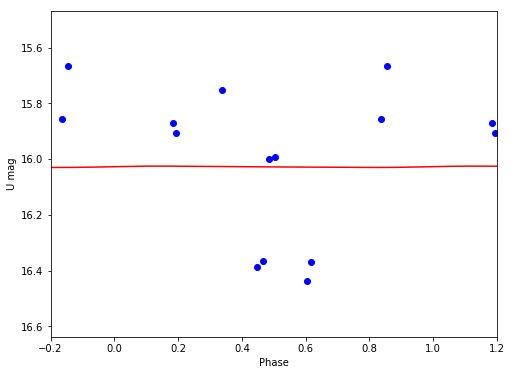

U 16.0272805855 0.00485060369126


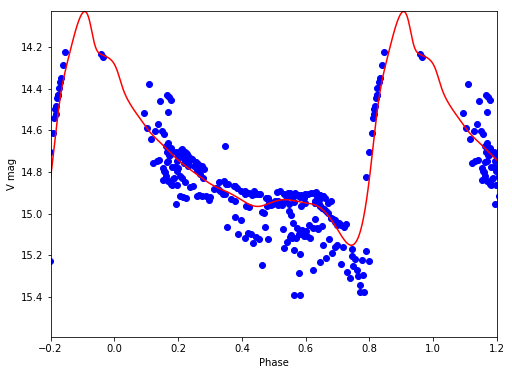

V 14.6848209062 1.1222844345
V47
/Volumes/Annie/CRRP/NGC3201/lcvs/V47.phased


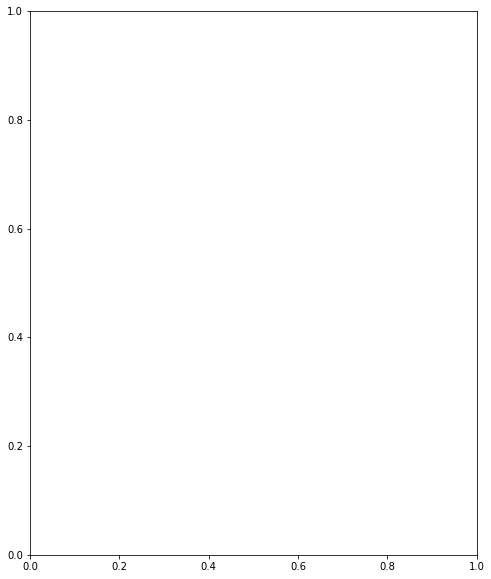

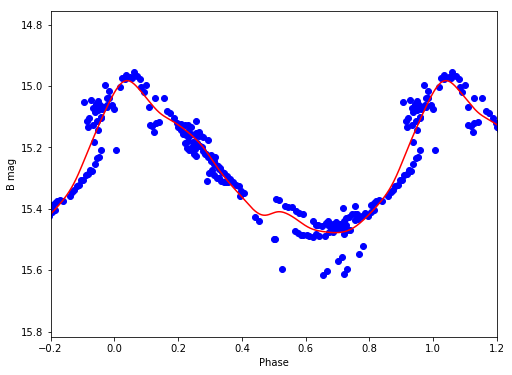

B 15.2672977199 0.495478240521


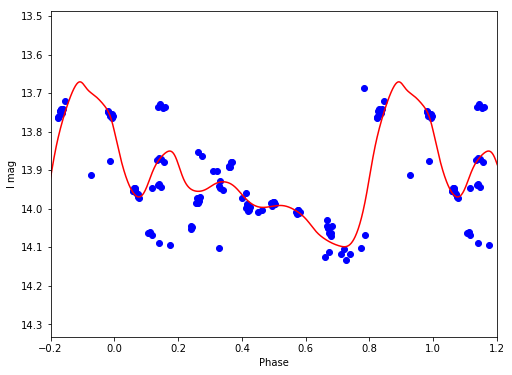

I 13.9202269565 0.427737705059


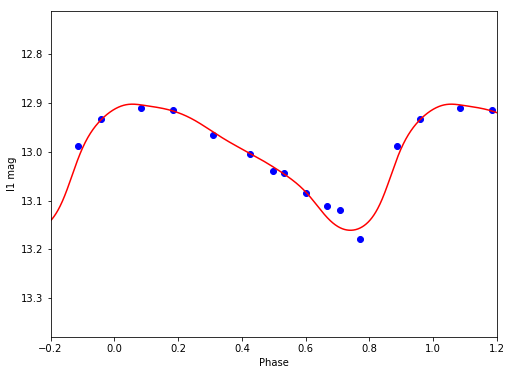

I1 13.0057100217 0.258281122896


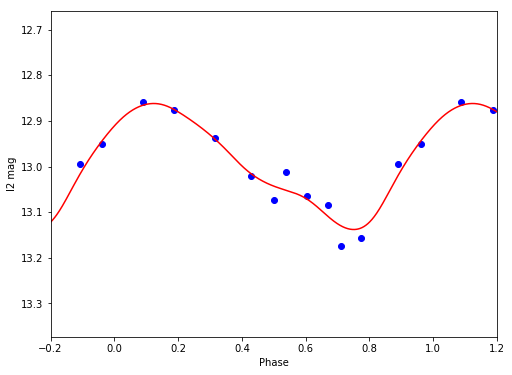

I2 12.9910030073 0.276245424073


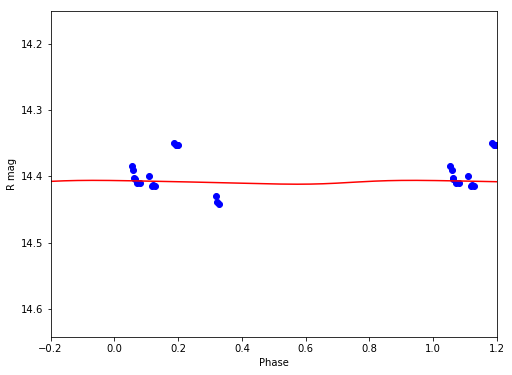

R 14.4087837684 0.00577273763536


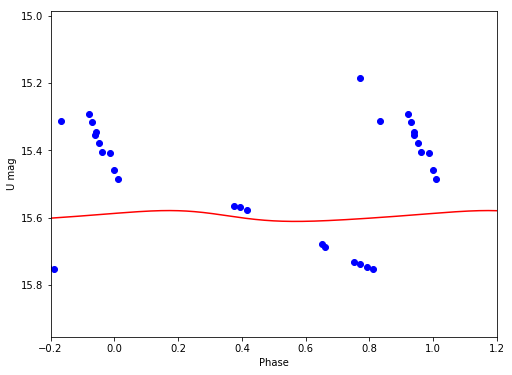

U 15.5952445822 0.0321911569006


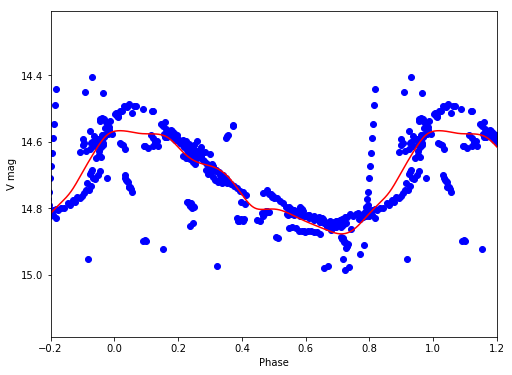

V 14.7161633557 0.310330691135
V48
/Volumes/Annie/CRRP/NGC3201/lcvs/V48.phased


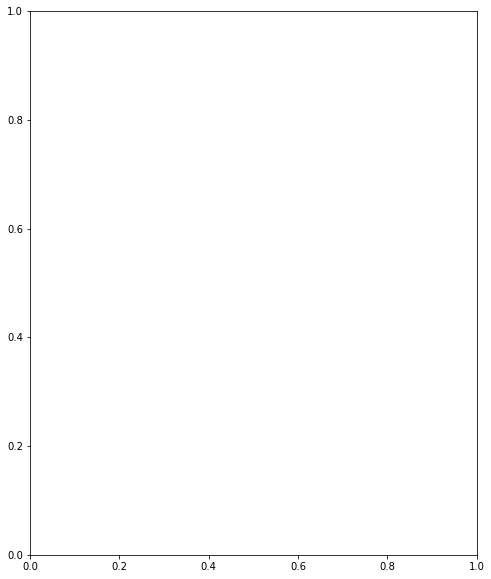

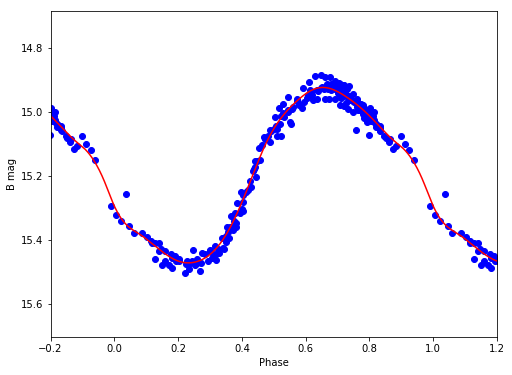

B 15.1763686451 0.546949391427


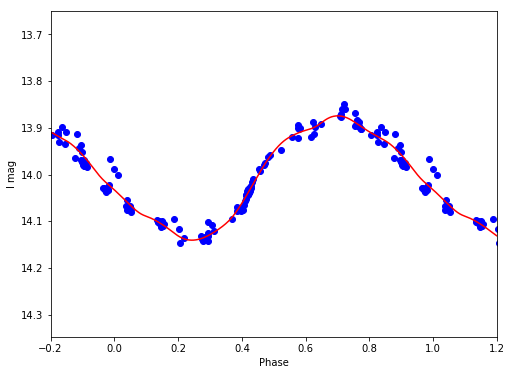

I 14.0000660753 0.266039888201


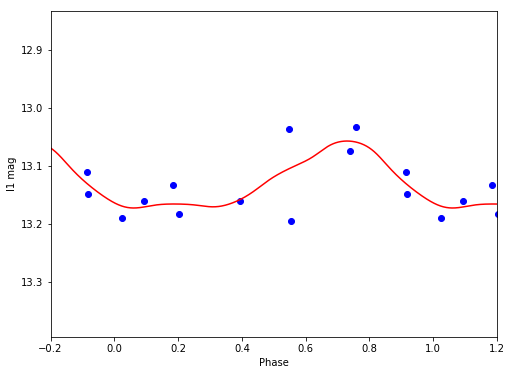

I1 13.1281159254 0.115187627076


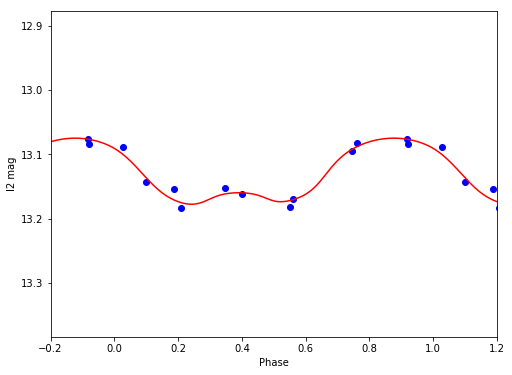

I2 13.1321869799 0.102913537979


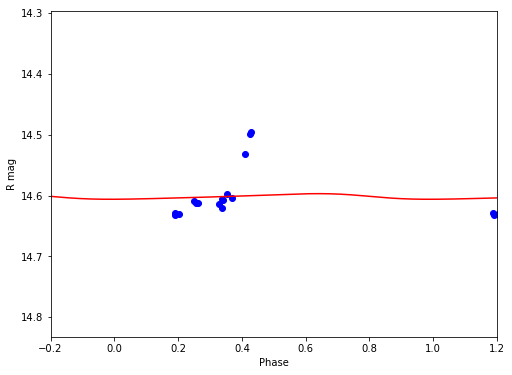

R 14.6016900287 0.00923444670931


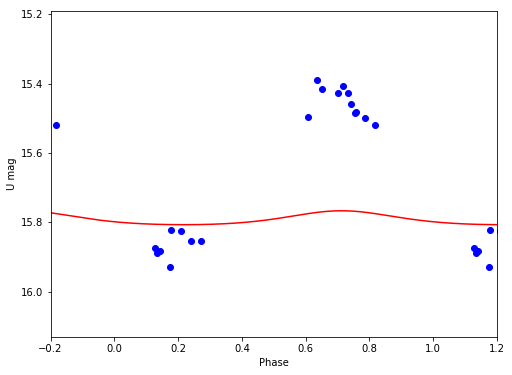

U 15.790881782 0.0401653082532


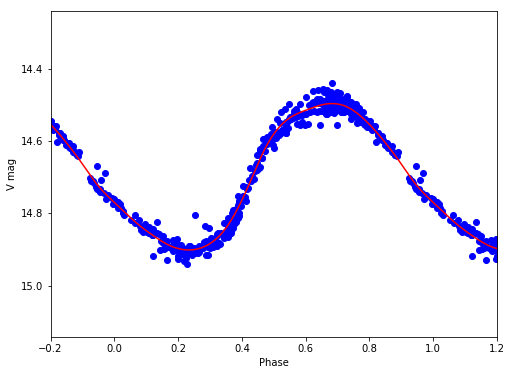

V 14.6875861407 0.404378936504
V49
/Volumes/Annie/CRRP/NGC3201/lcvs/V49.phased


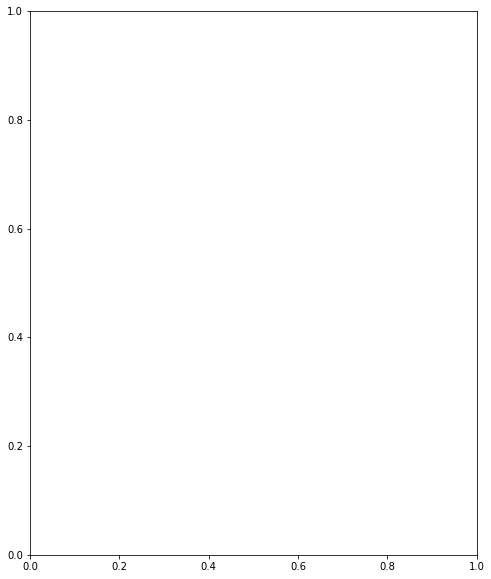

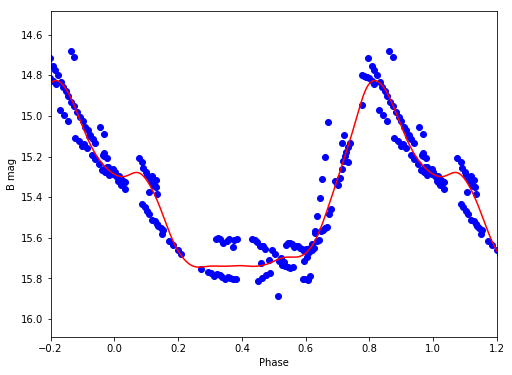

B 15.391033062 0.91812451579


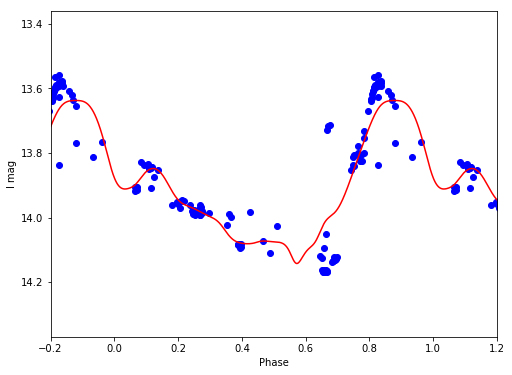

I 13.9139252353 0.50478381826


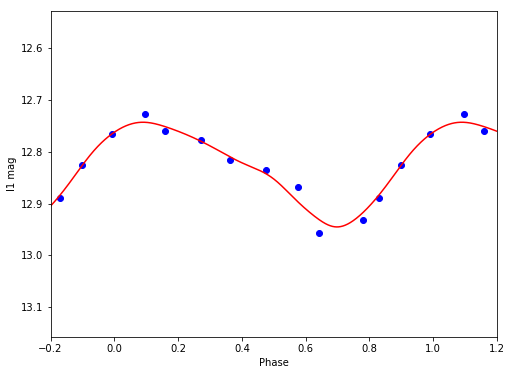

I1 12.8295232918 0.201905430614


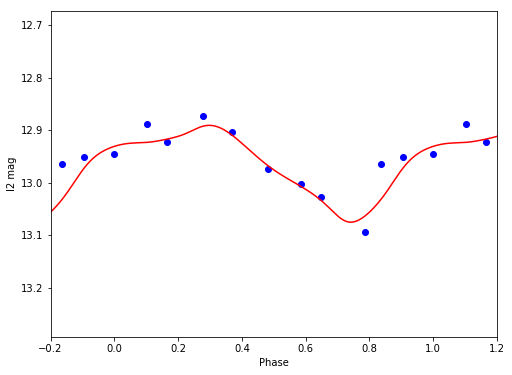

I2 12.9651253874 0.184638301798


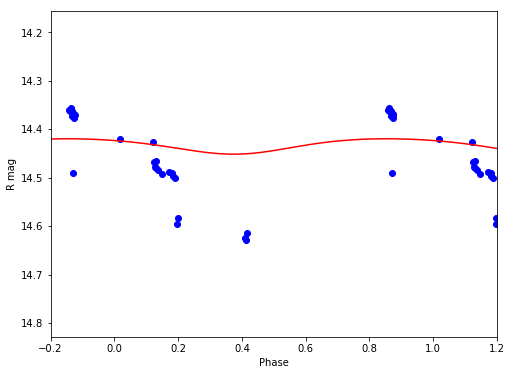

R 14.4330519008 0.031798166695


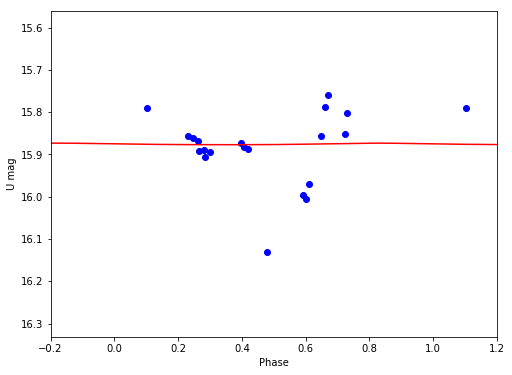

U 15.8754694483 0.00371238074463


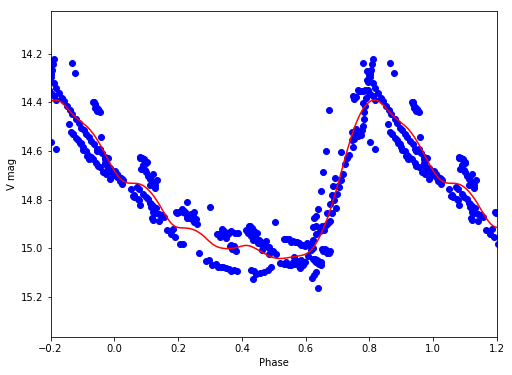

V 14.776522529 0.650622252079
V50
/Volumes/Annie/CRRP/NGC3201/lcvs/V50.phased


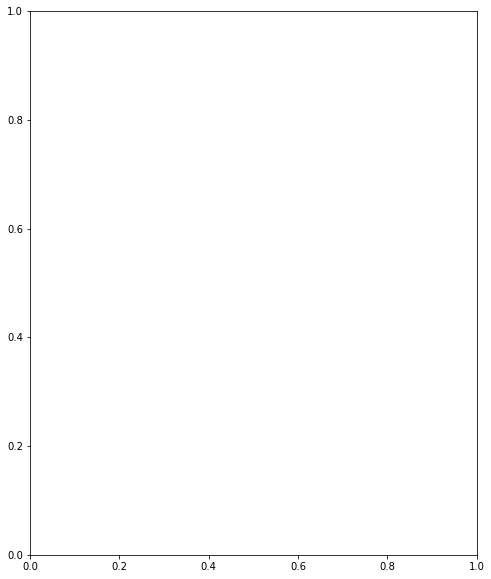

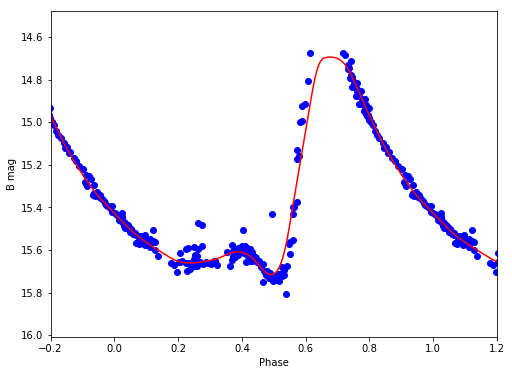

B 15.2986778114 1.02107495757


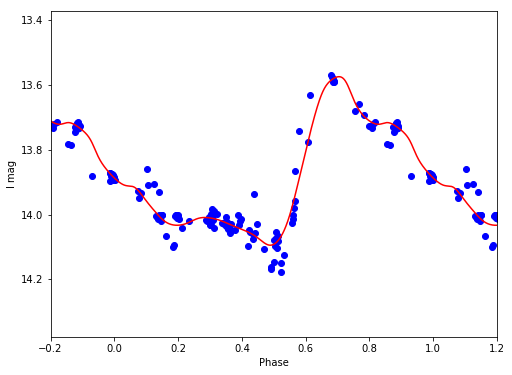

I 13.8730026904 0.519779063436


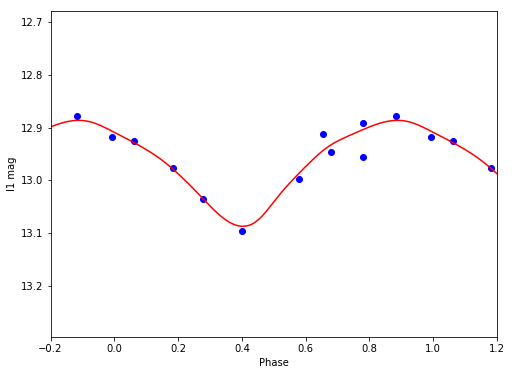

I1 12.9680054232 0.20106478263


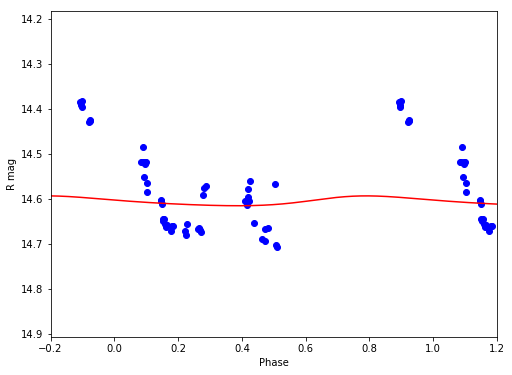

R 14.6050394383 0.0219011902989


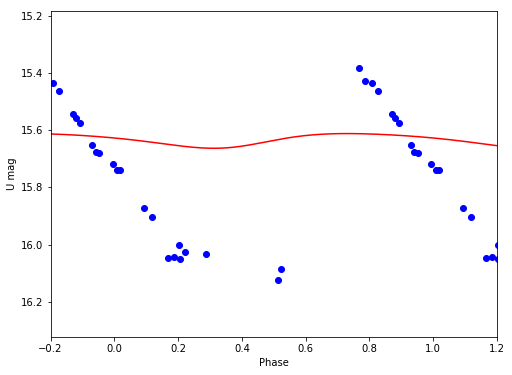

U 15.6332778109 0.0514837097504


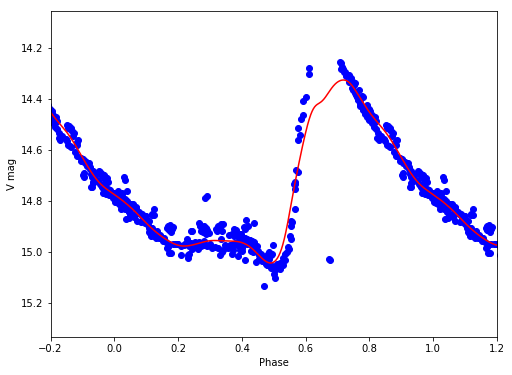

V 14.7281080424 0.71747850768
V51
/Volumes/Annie/CRRP/NGC3201/lcvs/V51.phased


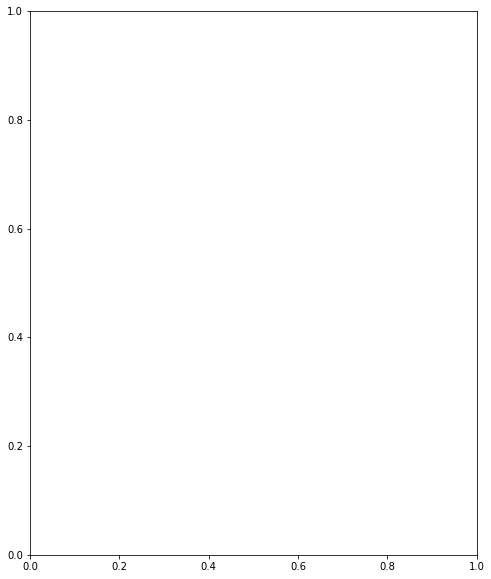

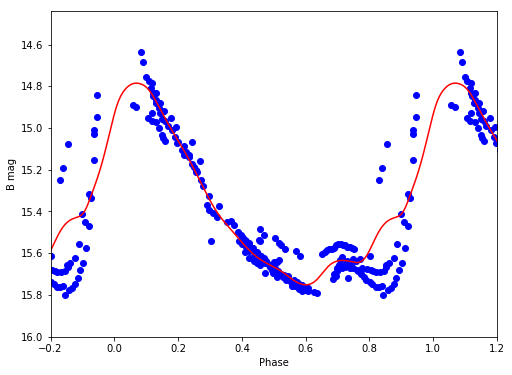

B 15.3268714908 0.966821028102


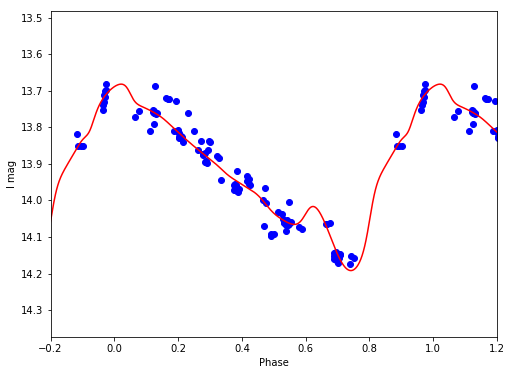

I 13.910452715 0.509940689287


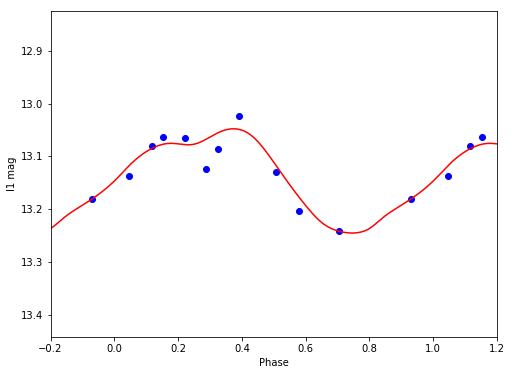

I1 13.1381356718 0.197494989113


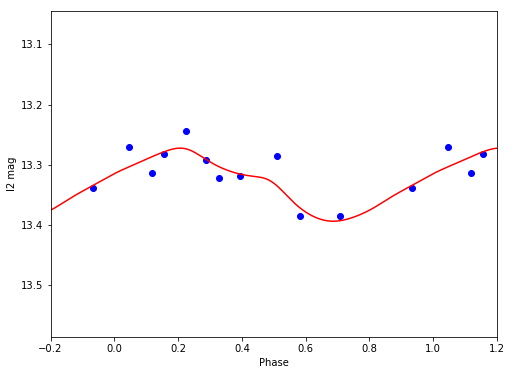

I2 13.3306398445 0.121472269312


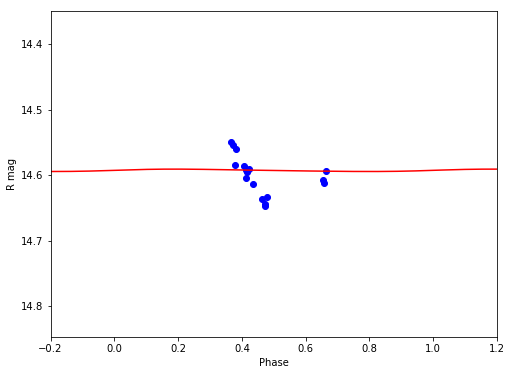

R 14.5929000983 0.00364998210068


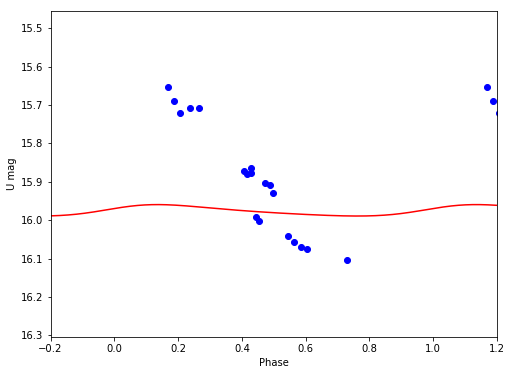

U 15.9759690069 0.0297861751978


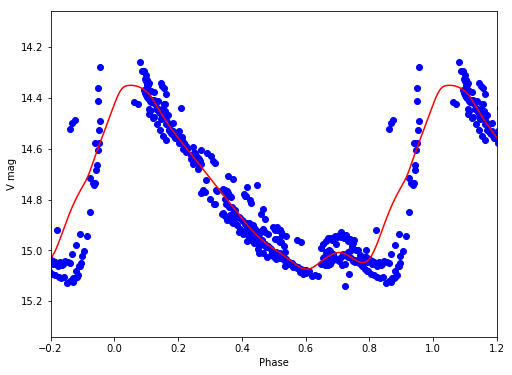

V 14.7516832759 0.722056773733
V52
/Volumes/Annie/CRRP/NGC3201/lcvs/V52.phased


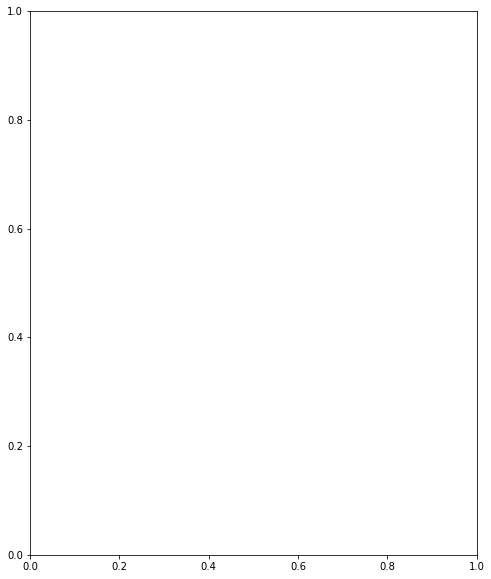

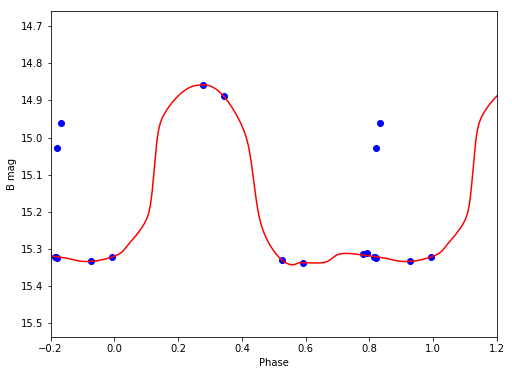

B 15.1674467448 0.485040147196


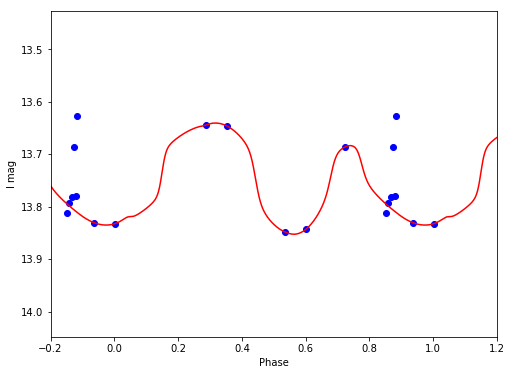

I 13.7548982957 0.212018606872


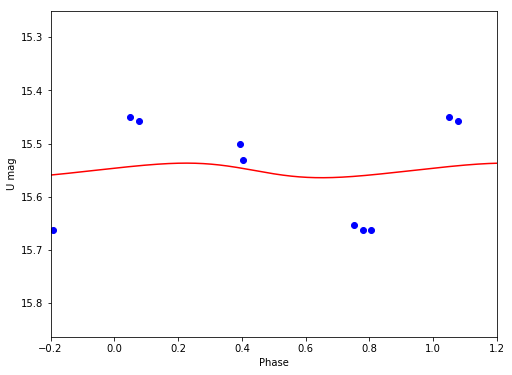

U 15.5502366482 0.0274262928265


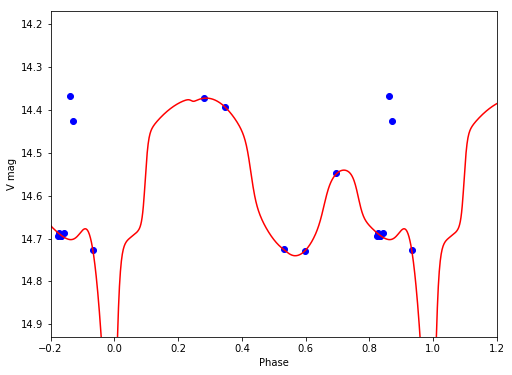

V 14.5951107634 0.953008002152
V53
/Volumes/Annie/CRRP/NGC3201/lcvs/V53.phased


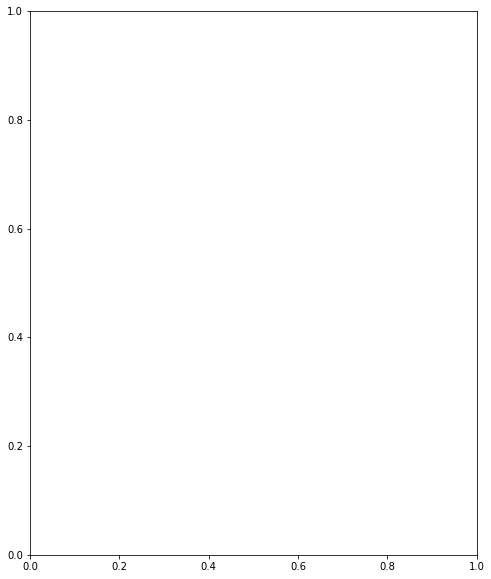

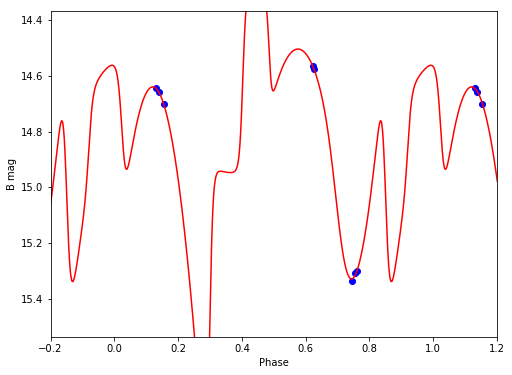

B 14.8076852864 1.67212003097


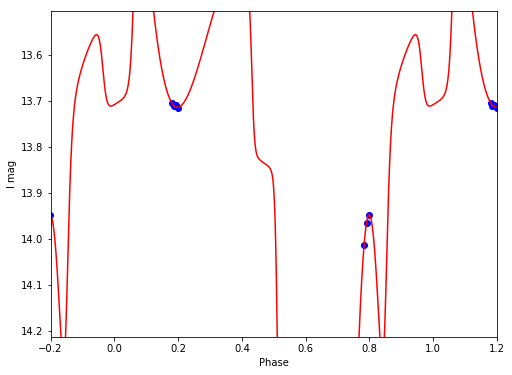

I 13.8921322631 10.5128578266


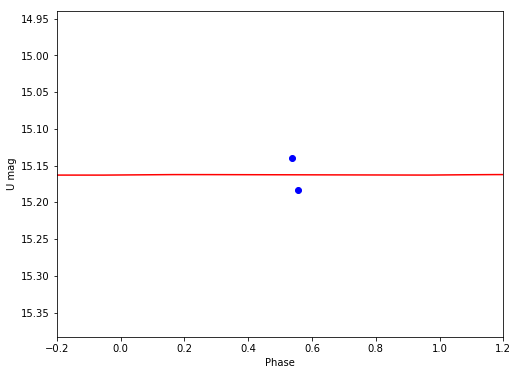

U 15.1625574366 0.000757198256032


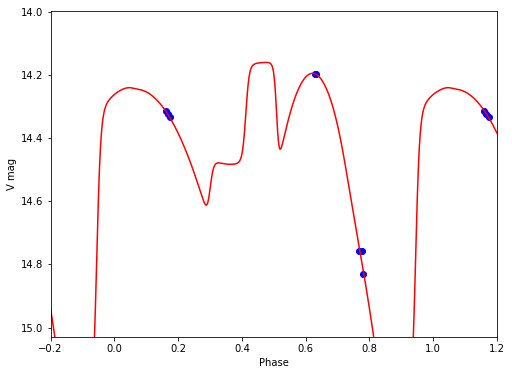

V 14.4393942606 1.17559427158
V54
/Volumes/Annie/CRRP/NGC3201/lcvs/V54.phased


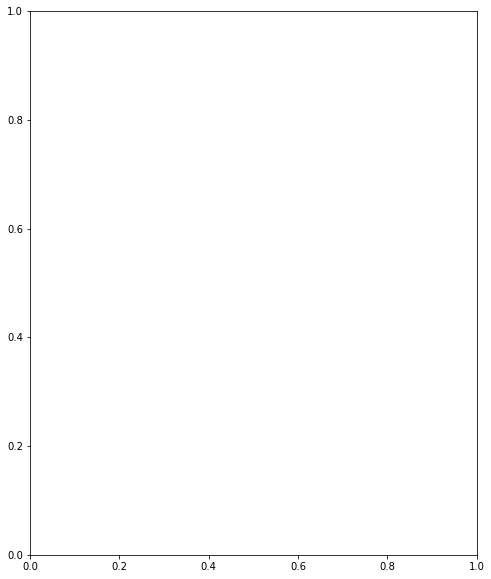

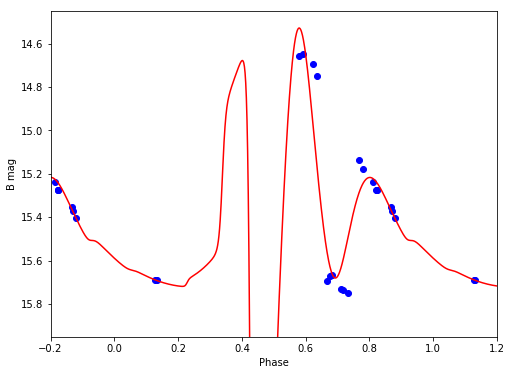

B 15.4106847245 3.96089877419


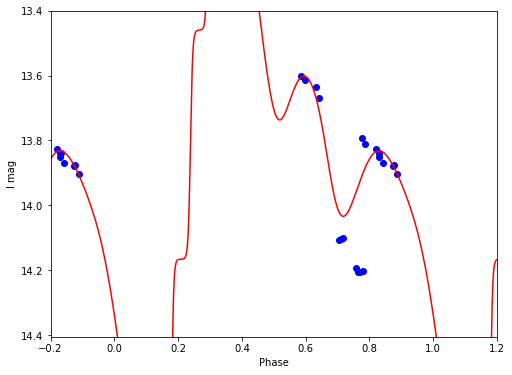

I 13.6487417217 4.01994939232


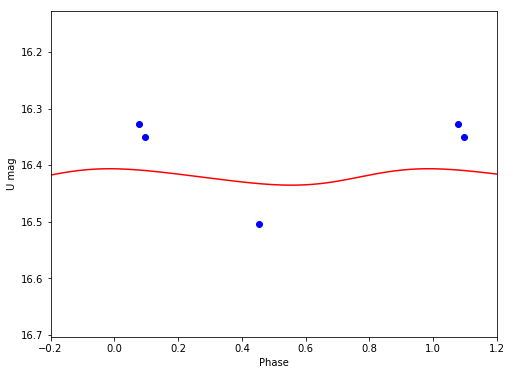

U 16.4206373092 0.0290454288344


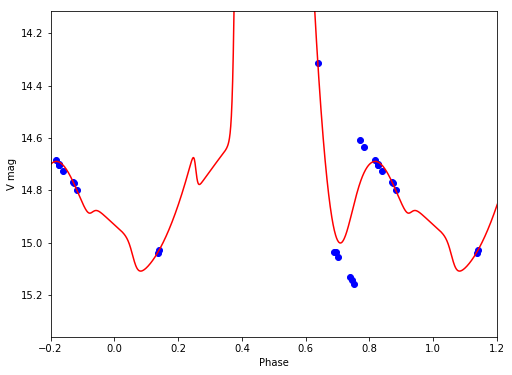

V 11.4141973665 7.54692052318
V55
/Volumes/Annie/CRRP/NGC3201/lcvs/V55.phased


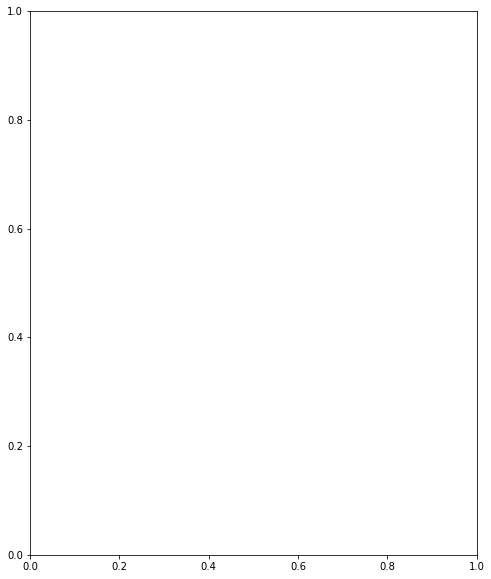

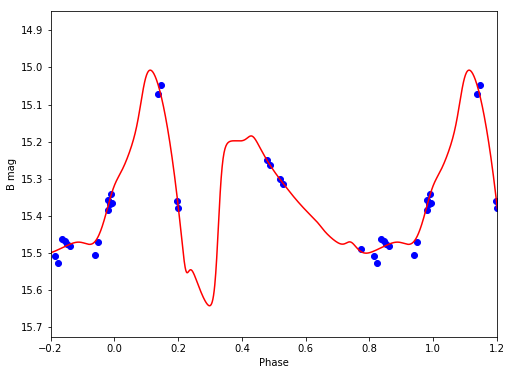

B 15.346898611 0.63496562374


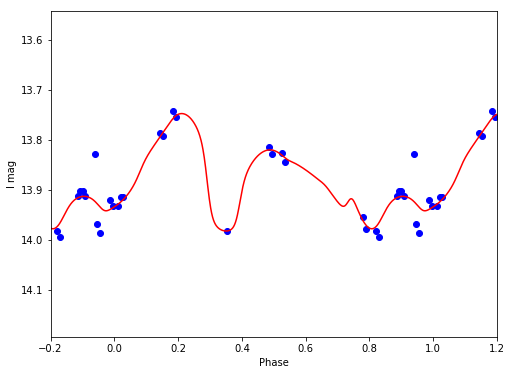

I 13.8801173476 0.234793336791


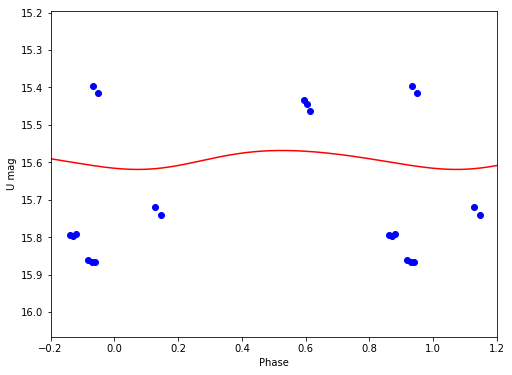

U 15.5915751114 0.0505385465509


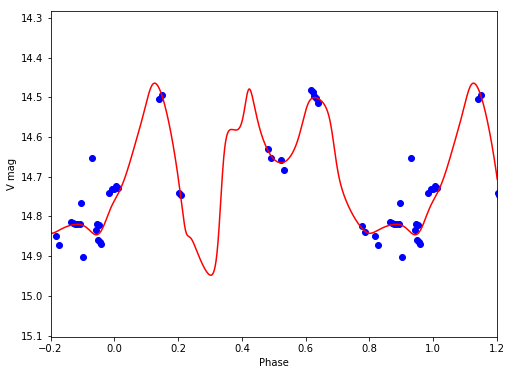

V 14.6842193648 0.48347943618
V56
/Volumes/Annie/CRRP/NGC3201/lcvs/V56.phased


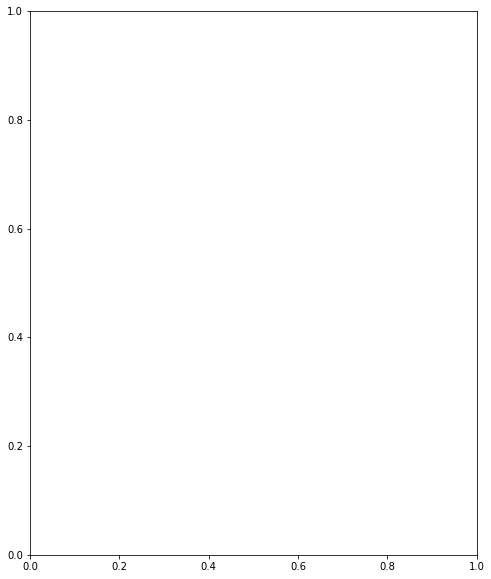

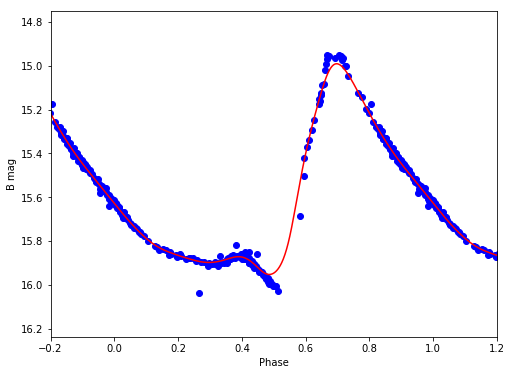

B 15.5605088374 0.958643245686


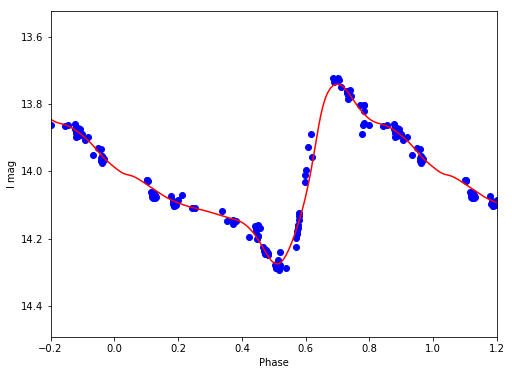

I 14.0090577978 0.534584285112


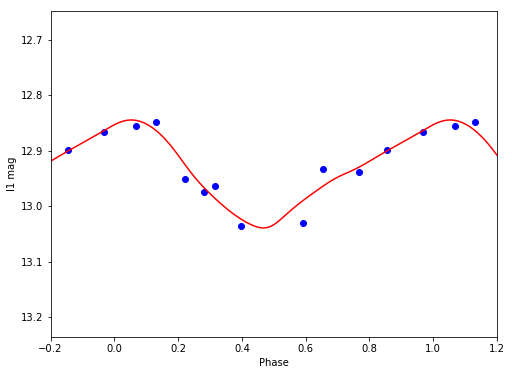

I1 12.9369259139 0.194277394273


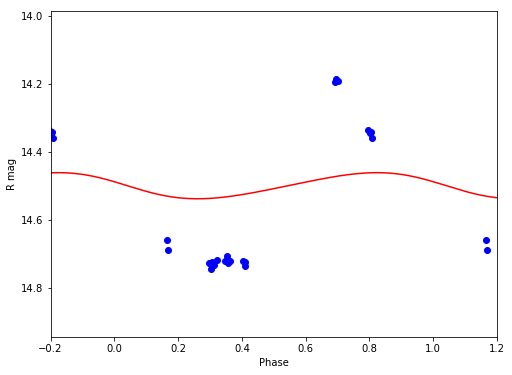

R 14.4985863219 0.0766181428567


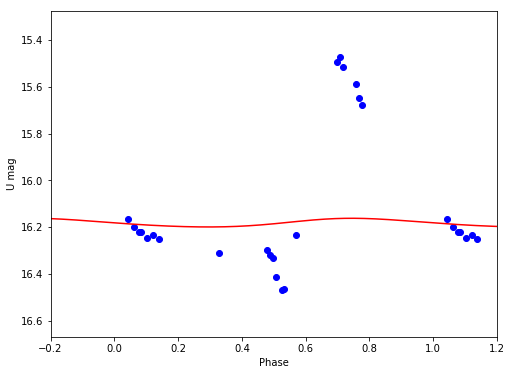

U 16.1815801882 0.0371284370374


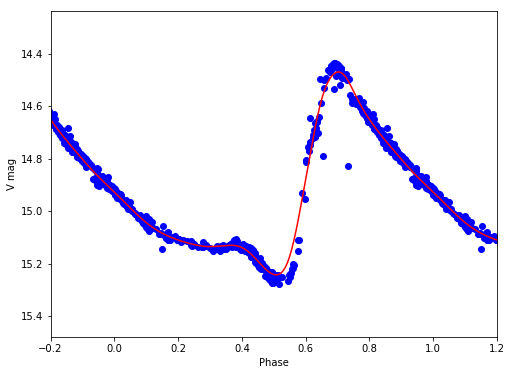

V 14.9138764895 0.772441243187
V57
/Volumes/Annie/CRRP/NGC3201/lcvs/V57.phased


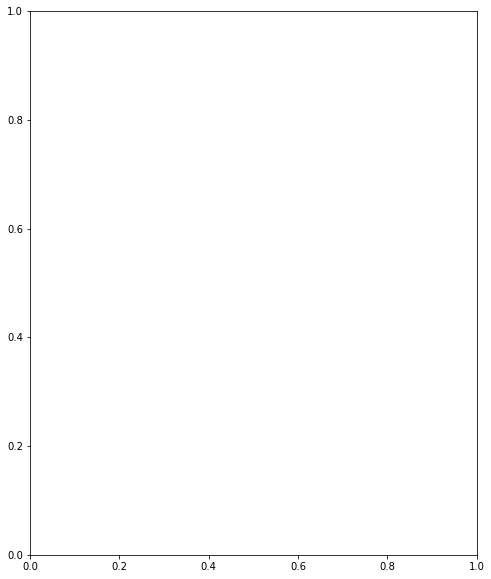

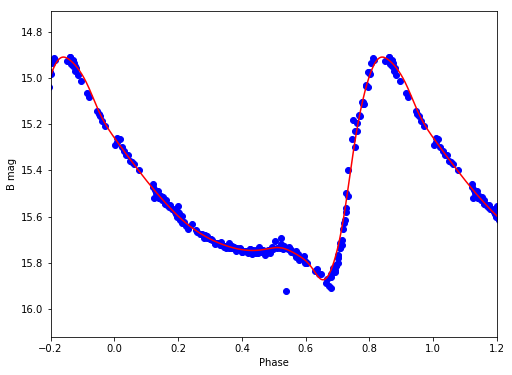

B 15.4561798874 0.964914470996


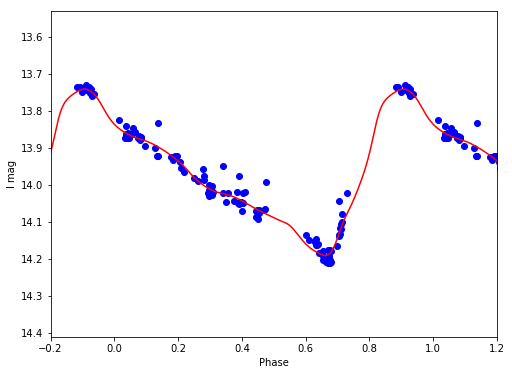

I 13.9653816898 0.450655675895


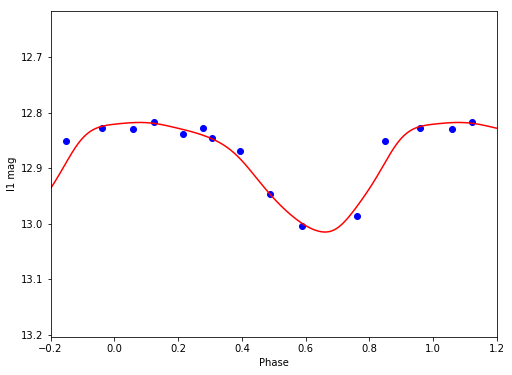

I1 12.8923925701 0.197542187378


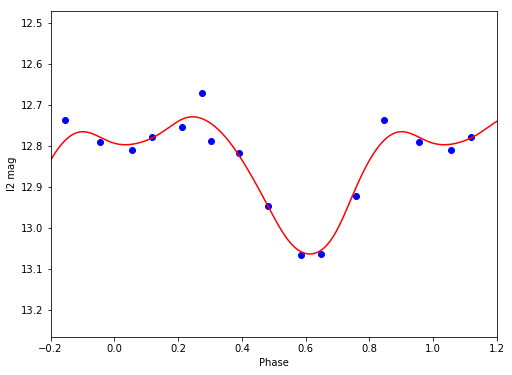

I2 12.8479135118 0.334384144491


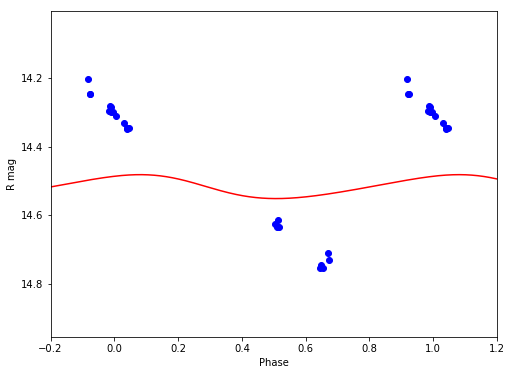

R 14.5167413539 0.0697451525753


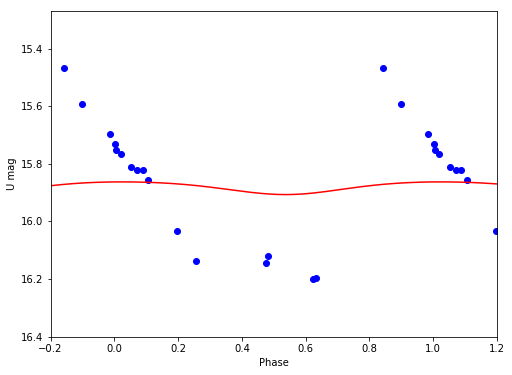

U 15.8816218687 0.0440799958083


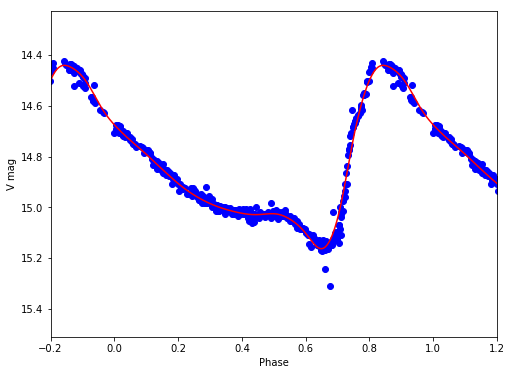

V 14.8306706183 0.722883744193
V58
/Volumes/Annie/CRRP/NGC3201/lcvs/V58.phased


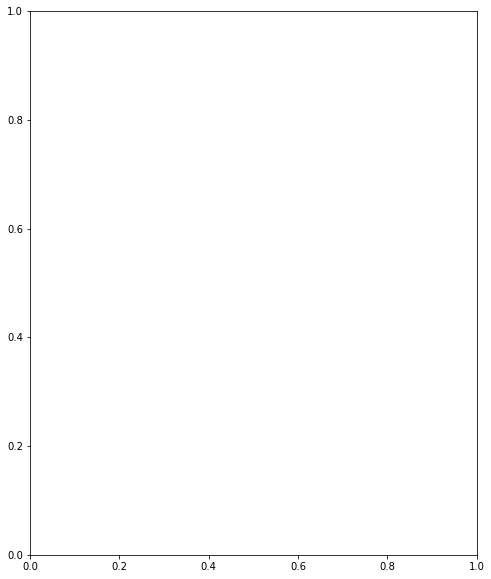

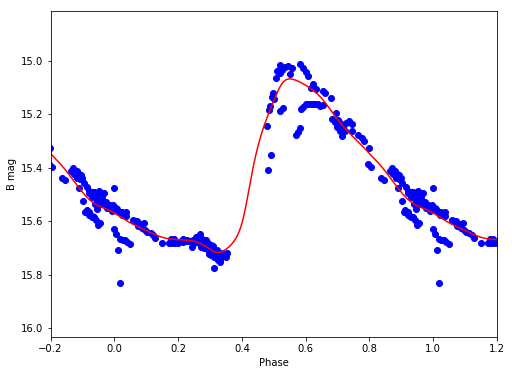

B 15.4226605863 0.649135672461


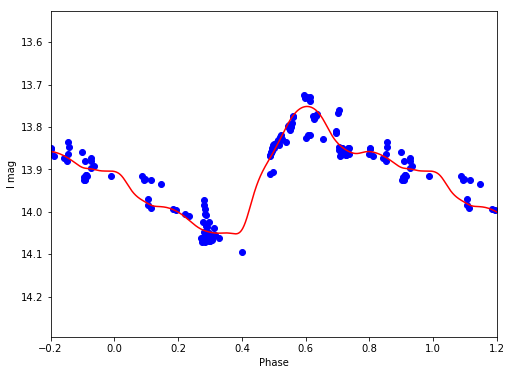

I 13.911717005 0.300811403072


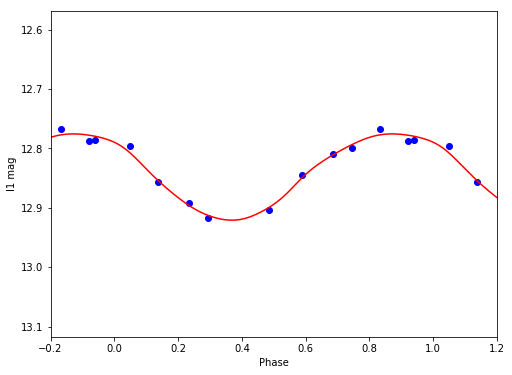

I1 12.8428404778 0.145196003757


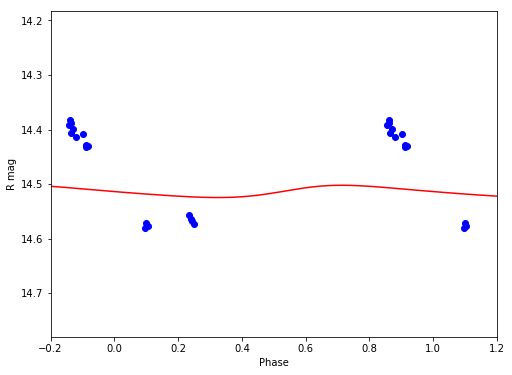

R 14.5139733024 0.0225449089455


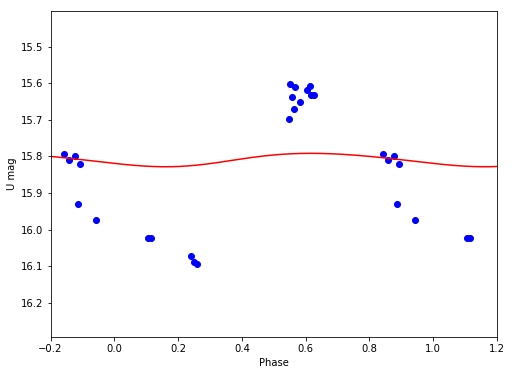

U 15.8091333866 0.0366776131579


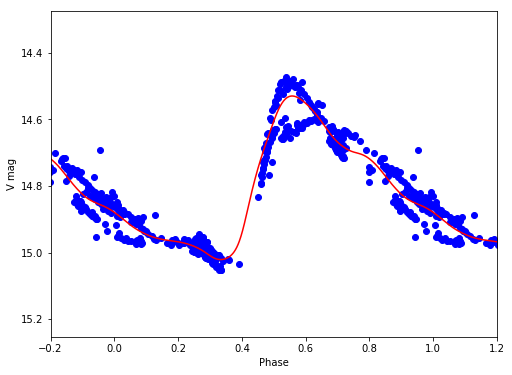

V 14.7981592571 0.491472130748
V59
/Volumes/Annie/CRRP/NGC3201/lcvs/V59.phased


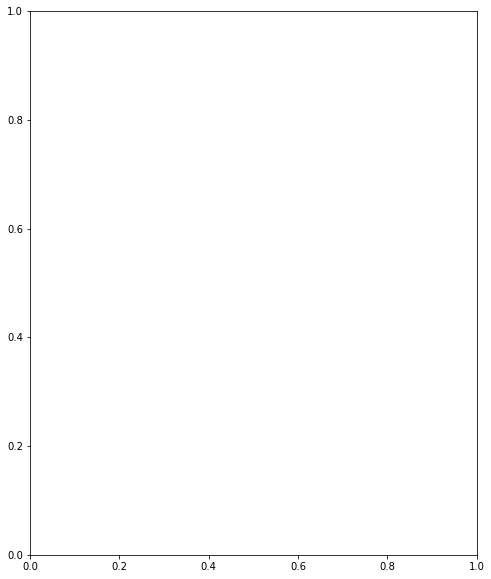

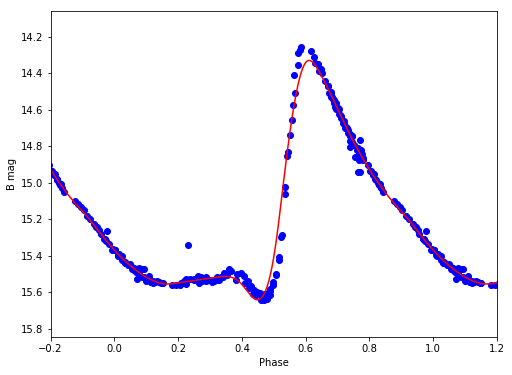

B 15.1094998712 1.31093519572


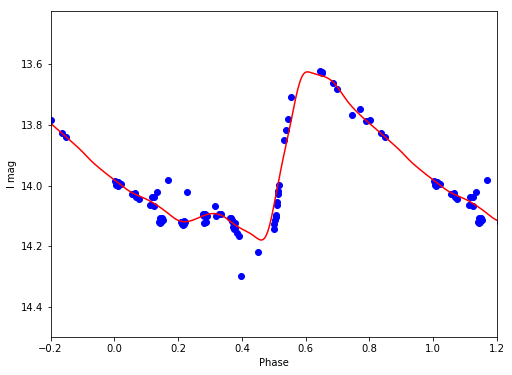

I 13.9303375493 0.554753099788


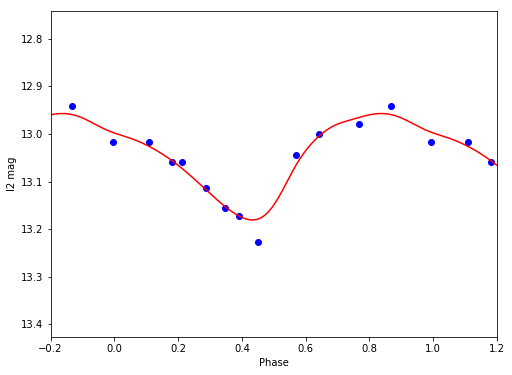

I2 13.04515094 0.223403777262


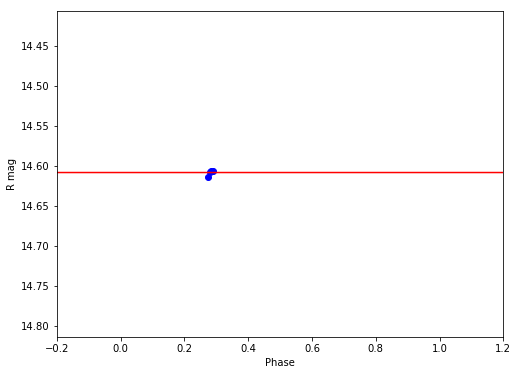

R 14.6085001673 6.24291031688e-05


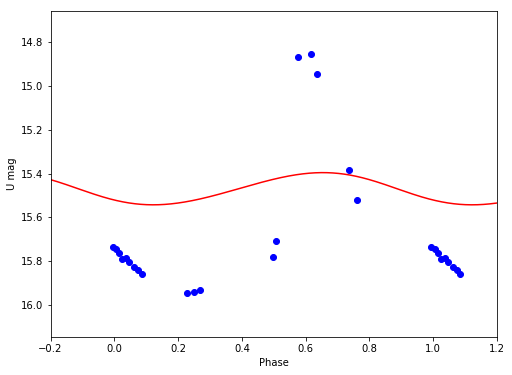

U 15.4686631417 0.147073114634


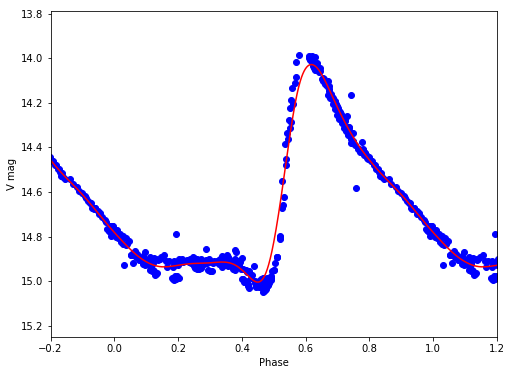

V 14.6192894029 0.976454122002
V60
/Volumes/Annie/CRRP/NGC3201/lcvs/V60.phased


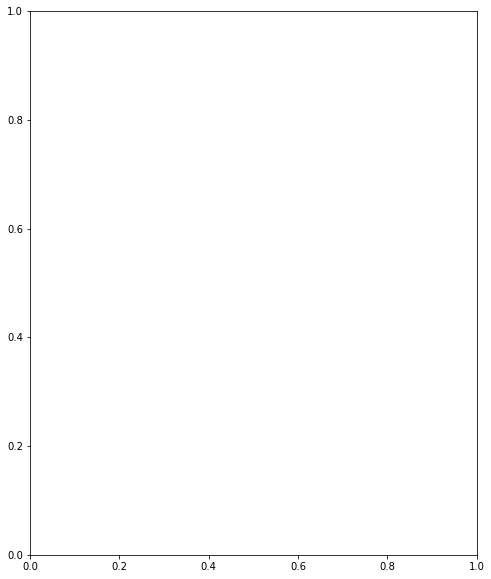

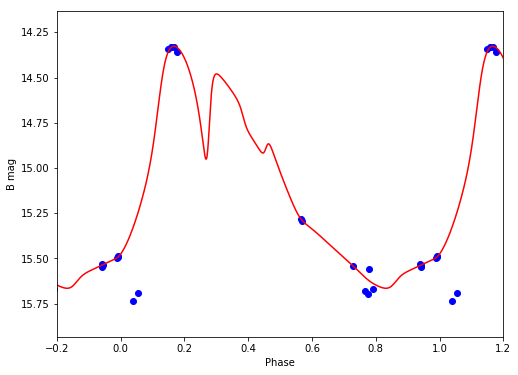

B 15.0328360481 1.33816603623


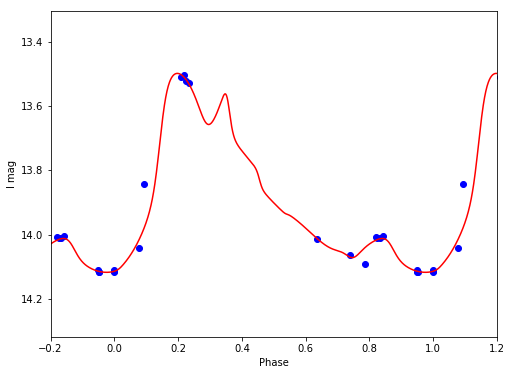

I 13.8749302361 0.617829342689


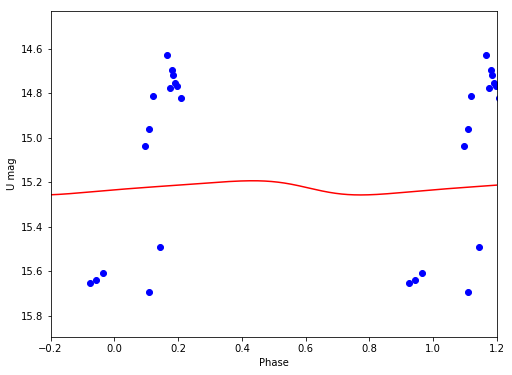

U 15.2240937356 0.0636794283379


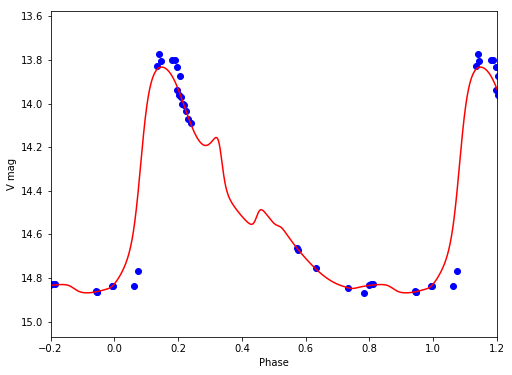

V 14.4811015217 1.03550234895
V61
/Volumes/Annie/CRRP/NGC3201/lcvs/V61.phased
V62
/Volumes/Annie/CRRP/NGC3201/lcvs/V62.phased


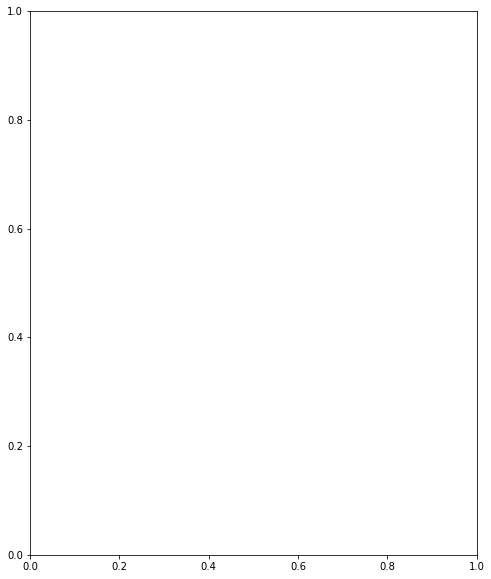

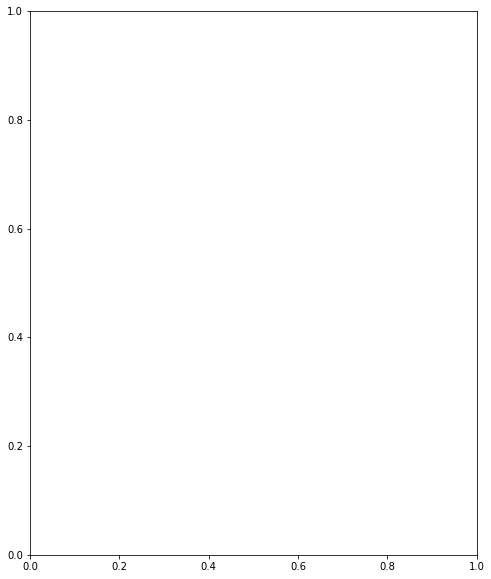

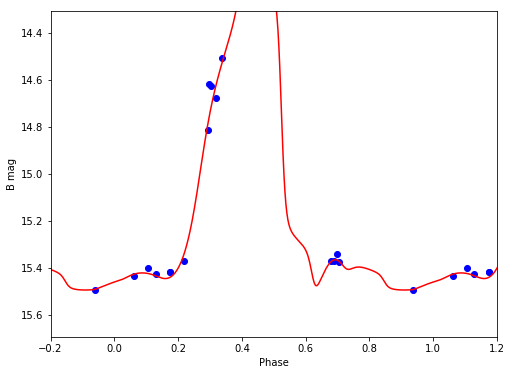

B 15.0023699468 1.69380715922


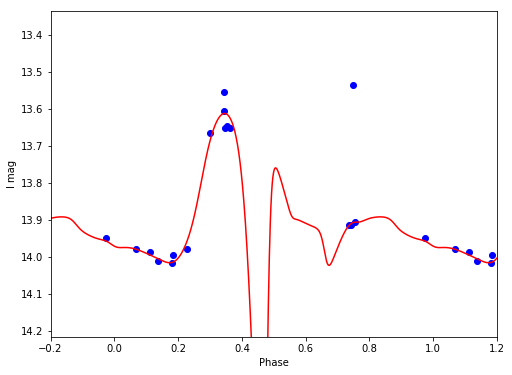

I 13.9215942915 1.26519262845


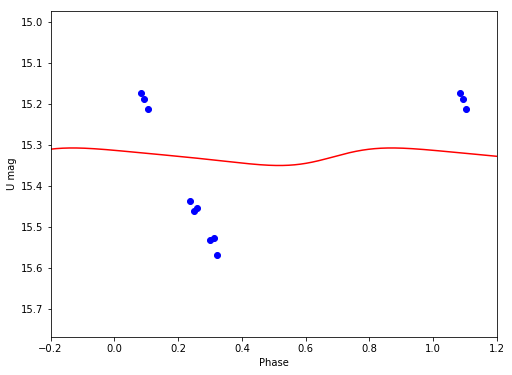

U 15.3272783052 0.0427381009896


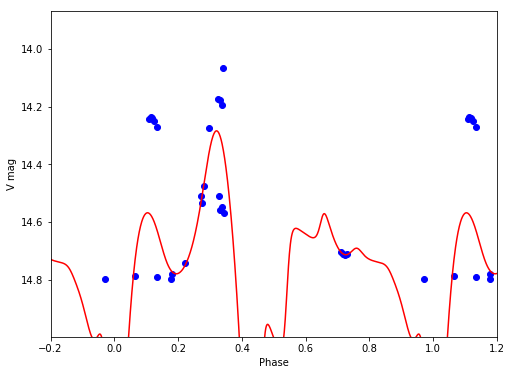

V 14.7813696332 2.00187289796
V63
/Volumes/Annie/CRRP/NGC3201/lcvs/V63.phased


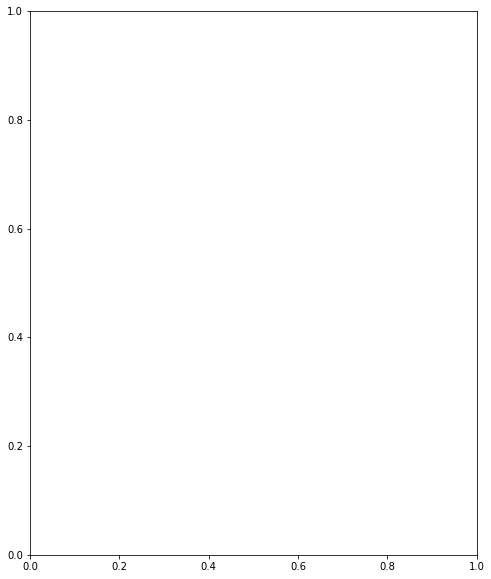

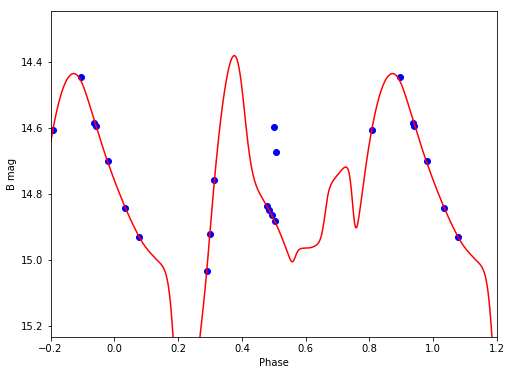

B 14.7966758722 1.1375306073


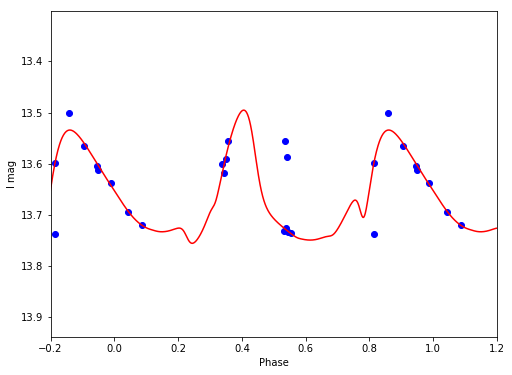

I 13.6657892859 0.260105253769


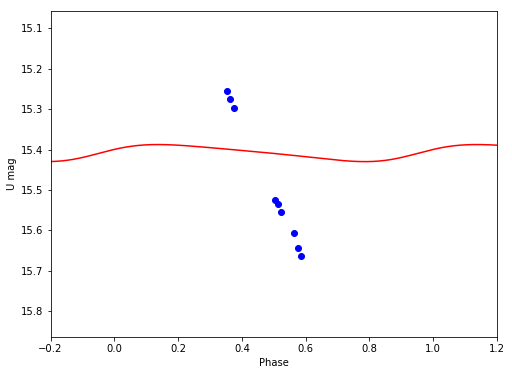

U 15.4078119842 0.0423043348208


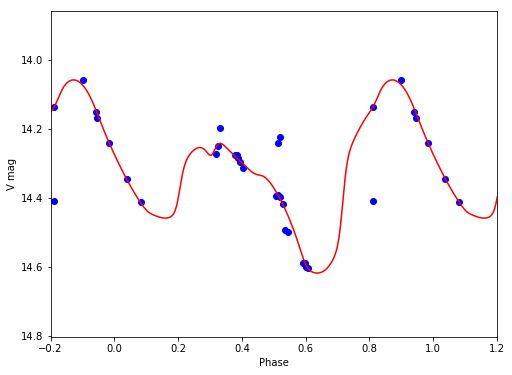

V 14.3179538298 0.560960333533
V64
/Volumes/Annie/CRRP/NGC3201/lcvs/V64.phased


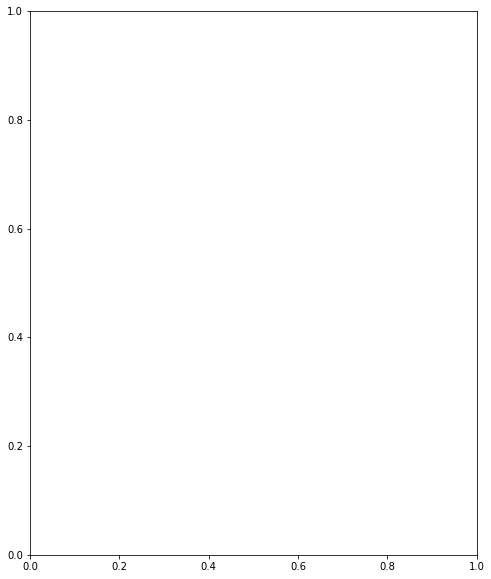

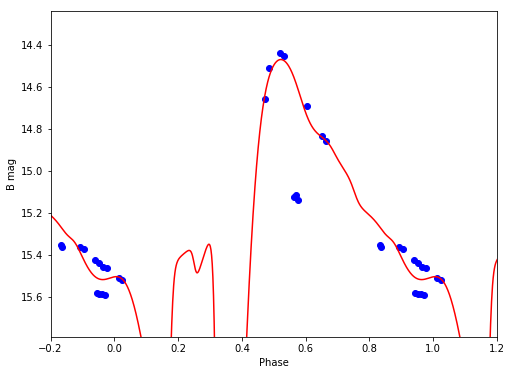

B 15.2594355003 4.97141440566


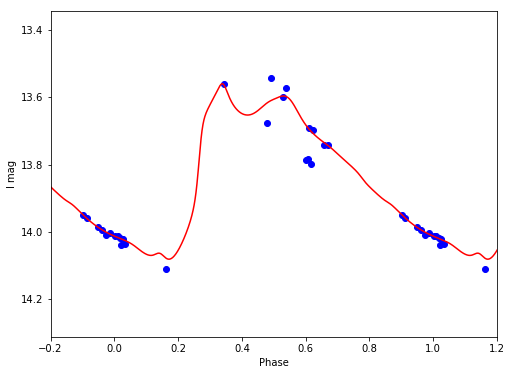

I 13.8124290638 0.520648764178


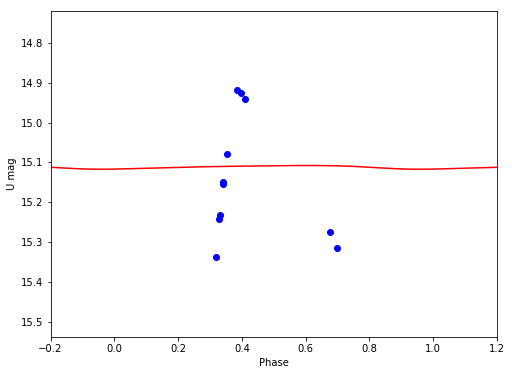

U 15.1117965661 0.00933321889201


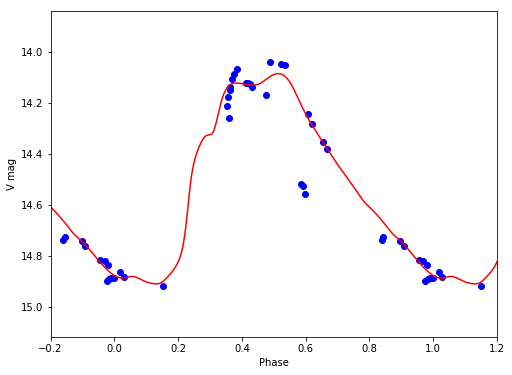

V 14.468250152 0.821772869209
V66
/Volumes/Annie/CRRP/NGC3201/lcvs/V66.phased


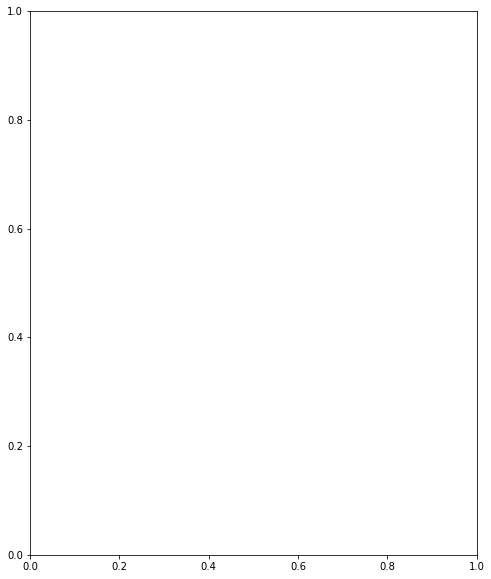

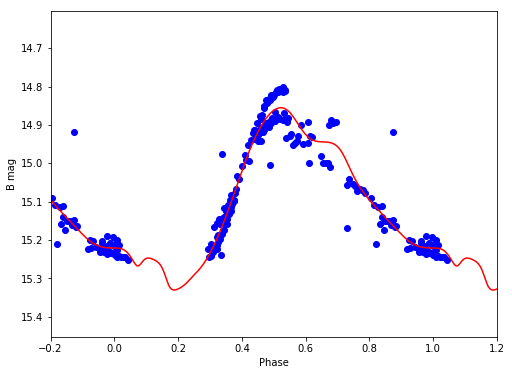

B 15.0969979763 0.474964420561


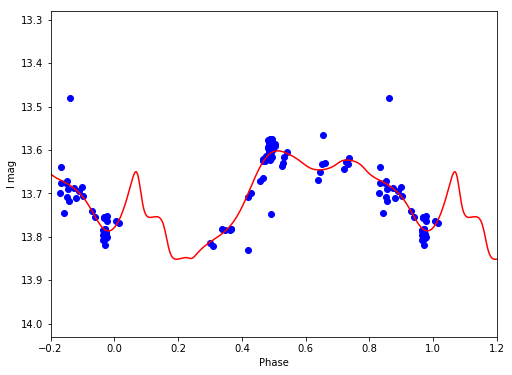

I 13.7070662437 0.24967162958


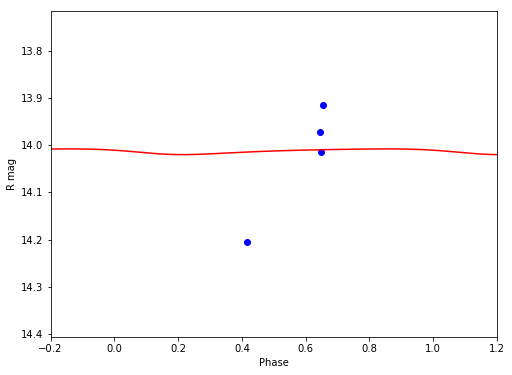

R 14.0128330131 0.0121603325588


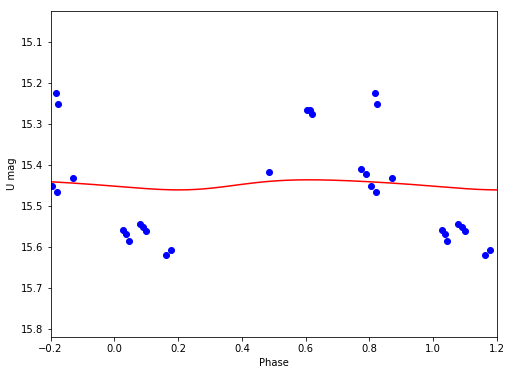

U 15.44801668 0.0246138632633


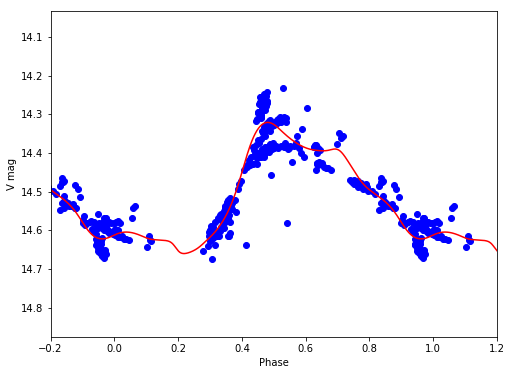

V 14.5069594371 0.339034484046
V67
/Volumes/Annie/CRRP/NGC3201/lcvs/V67.phased


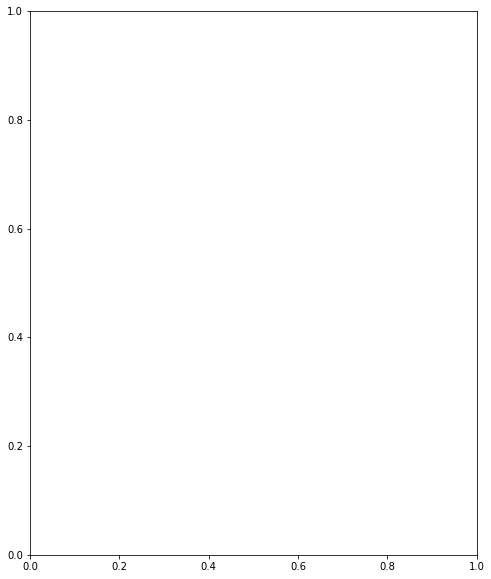

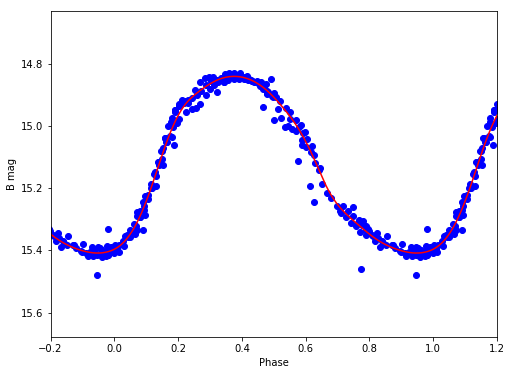

B 15.1062749795 0.568212181342


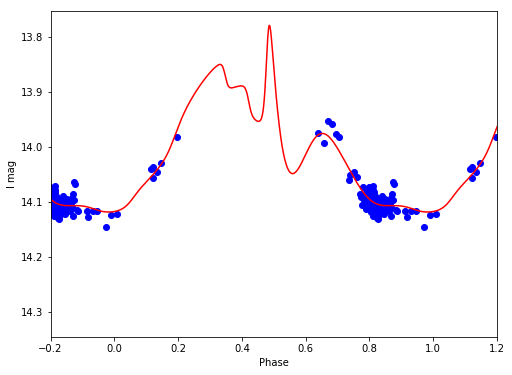

I 14.0026390736 0.339302228686


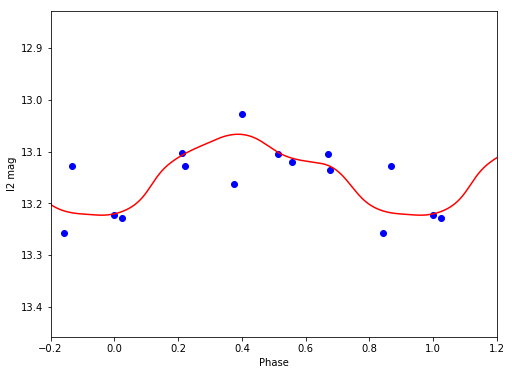

I2 13.1416364313 0.156543802592


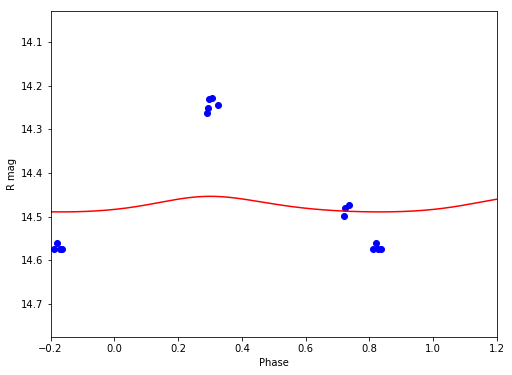

R 14.4742402524 0.0356785928854


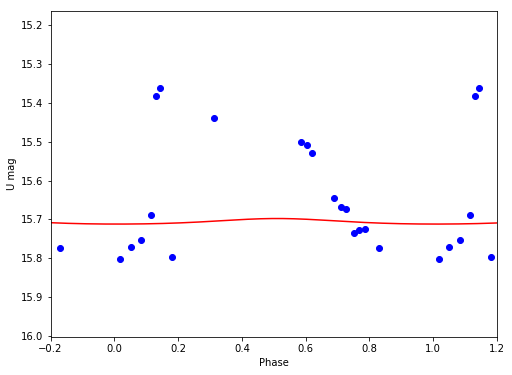

U 15.7061995737 0.0143094232337


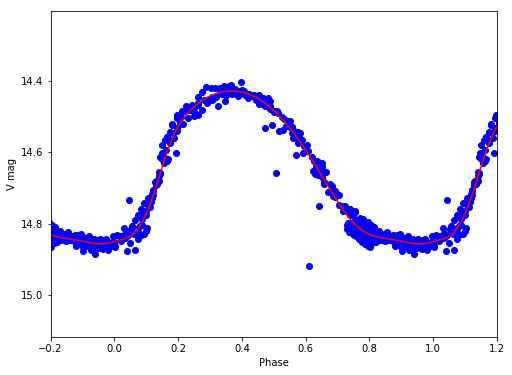

V 14.6392903676 0.428609812361
V69
/Volumes/Annie/CRRP/NGC3201/lcvs/V69.phased


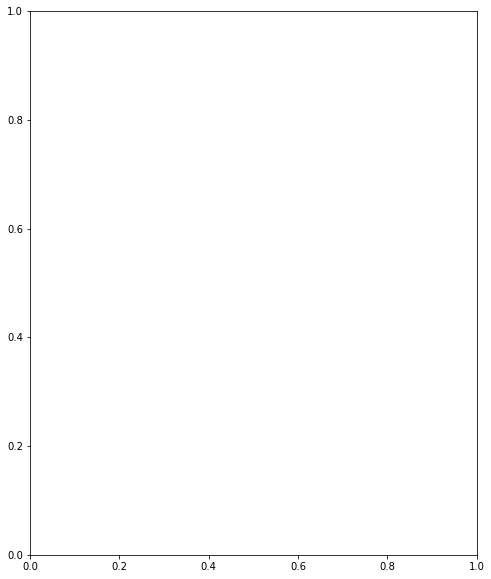

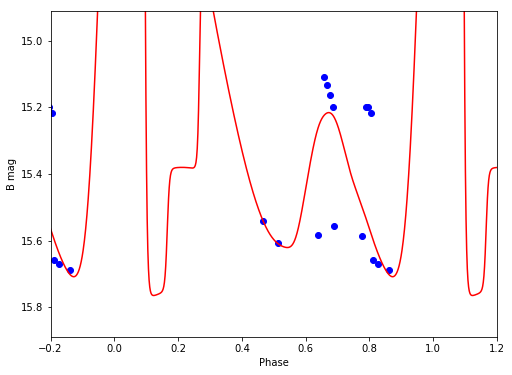

B 14.3404637359 4.10891365693


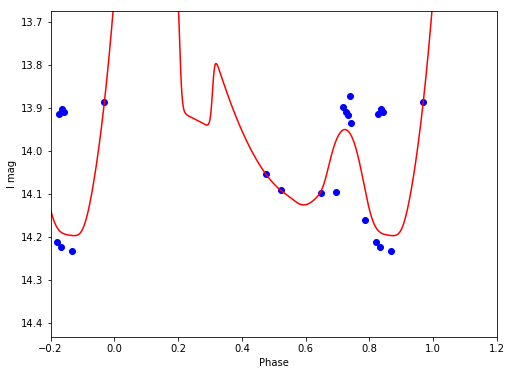

I 13.6934128018 2.20169932163


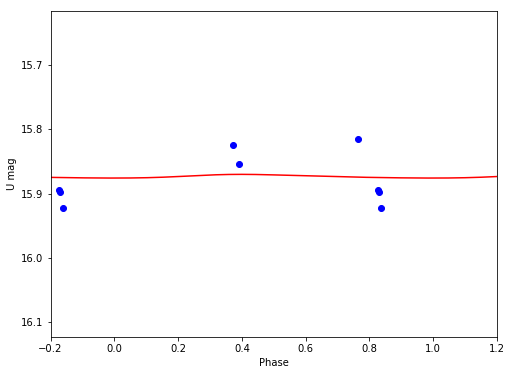

U 15.8732333858 0.00574951031793


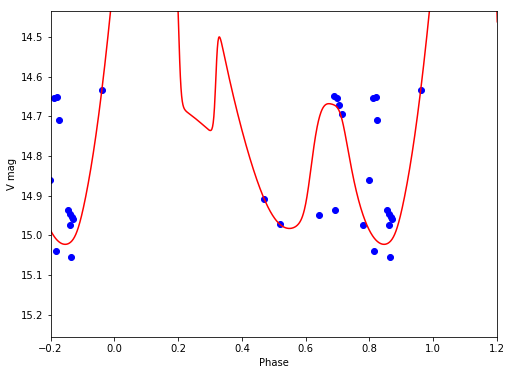

V 14.601092661 1.27755352202
V71
/Volumes/Annie/CRRP/NGC3201/lcvs/V71.phased


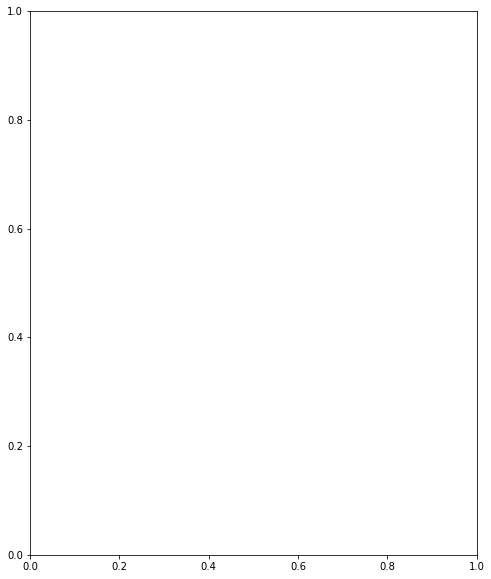

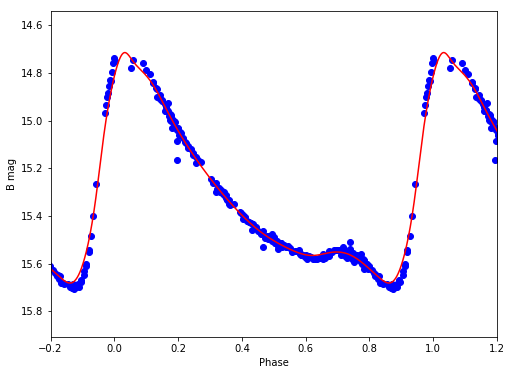

B 15.2722651026 0.967306442577


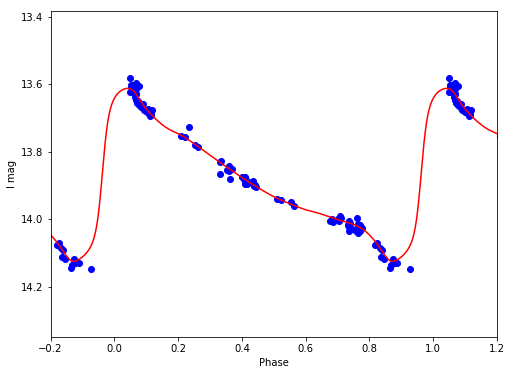

I 13.8745711382 0.512272421292


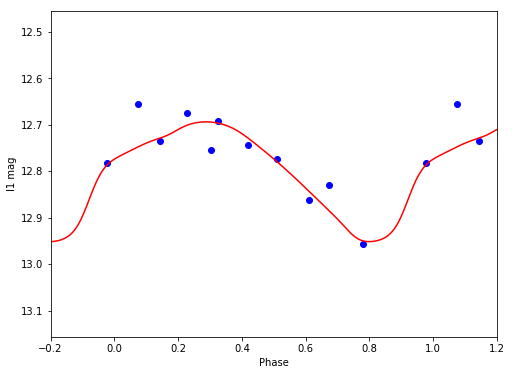

I1 12.7958136199 0.257751321024


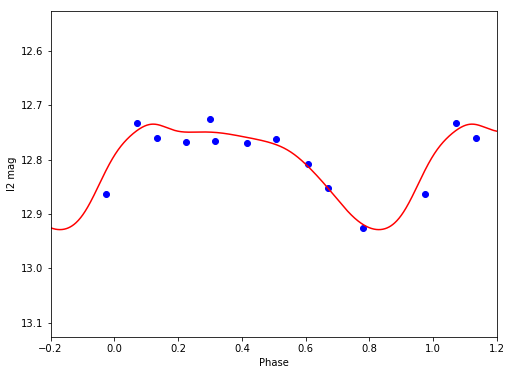

I2 12.8045557068 0.194042792817


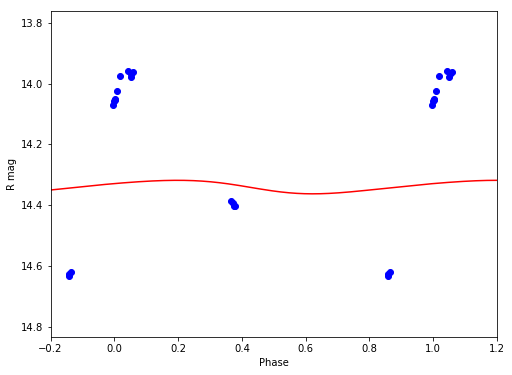

R 14.3391627419 0.0444353175209


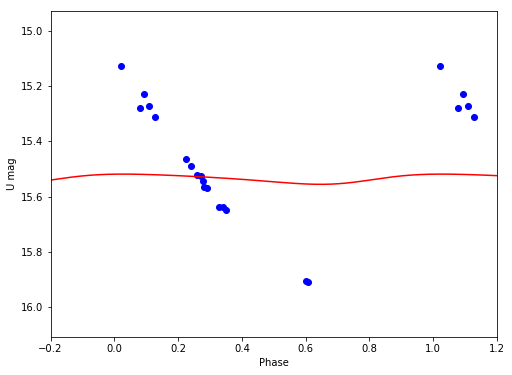

U 15.534793326 0.0370577156005


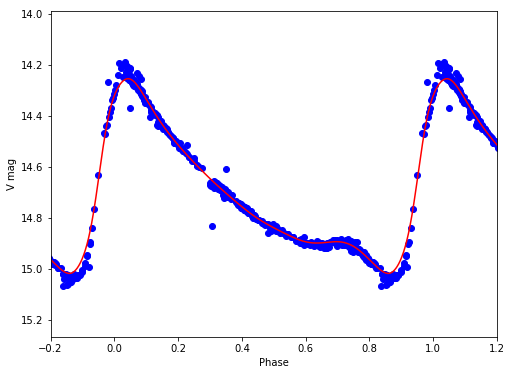

V 14.6855912639 0.763571083373
V72
/Volumes/Annie/CRRP/NGC3201/lcvs/V72.phased


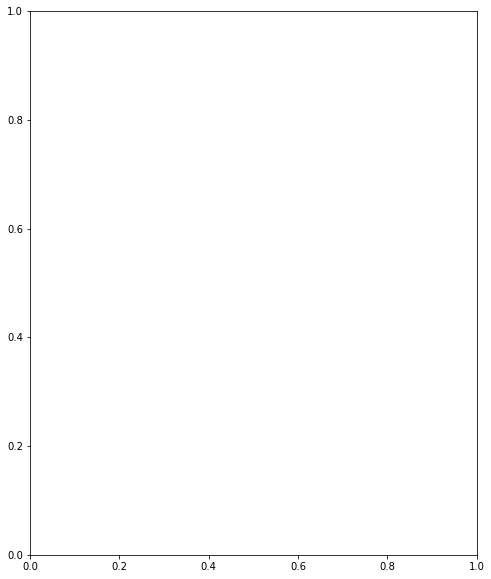

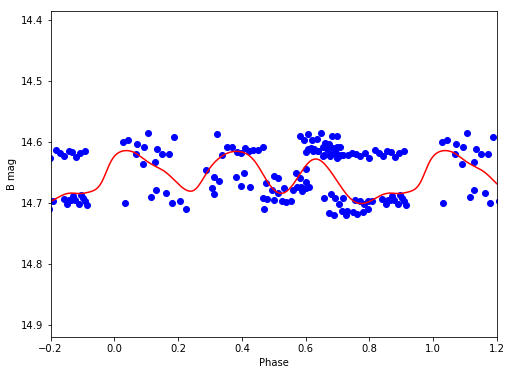

B 14.655466824 0.0868773804639


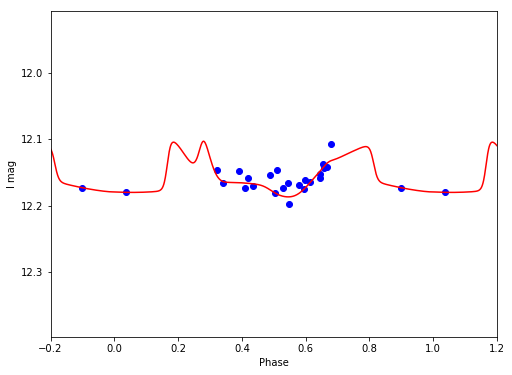

I 12.1565717173 0.0835829766383


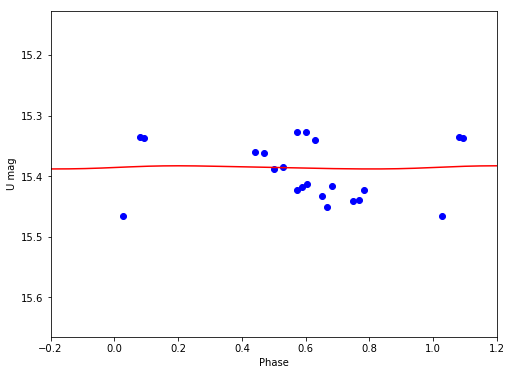

U 15.3851478383 0.00521404365518


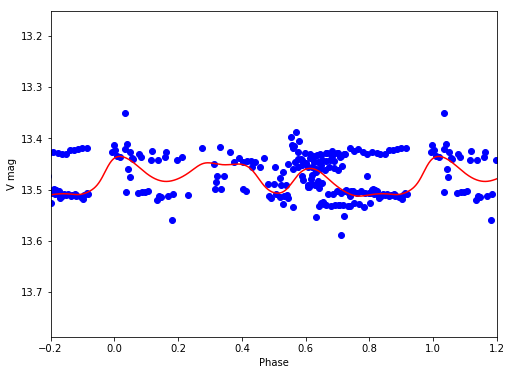

V 13.4769375421 0.0777286742279
V73
/Volumes/Annie/CRRP/NGC3201/lcvs/V73.phased


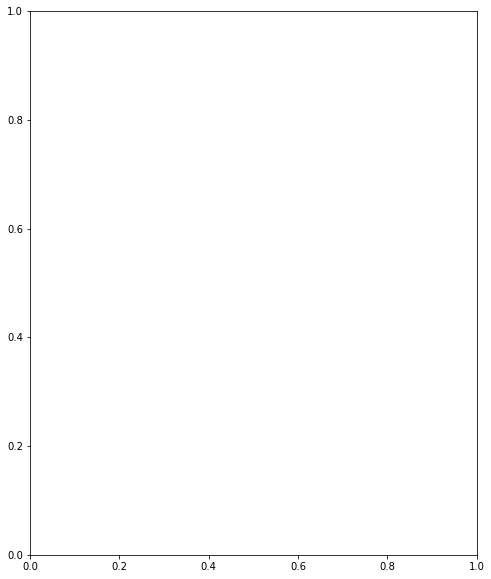

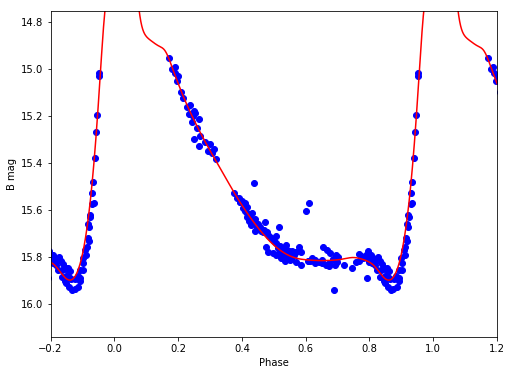

B 15.3384352502 1.48560117598


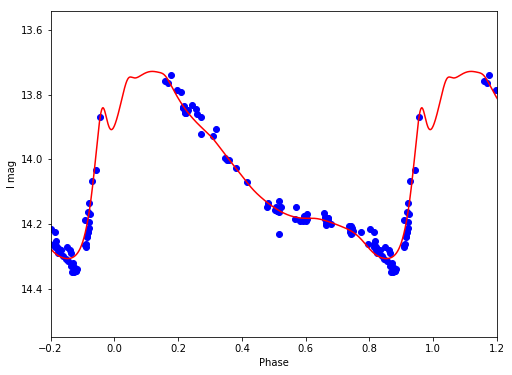

I 14.0210723968 0.579086777392


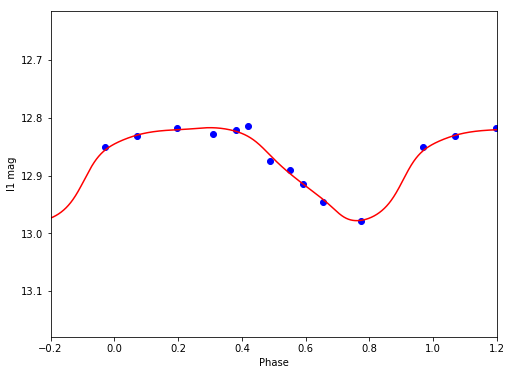

I1 12.8756687989 0.161038152008


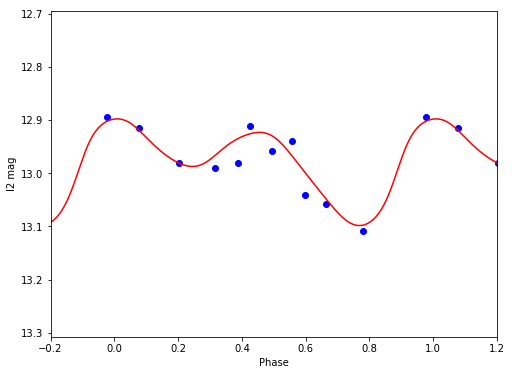

I2 12.9768249921 0.201108533412


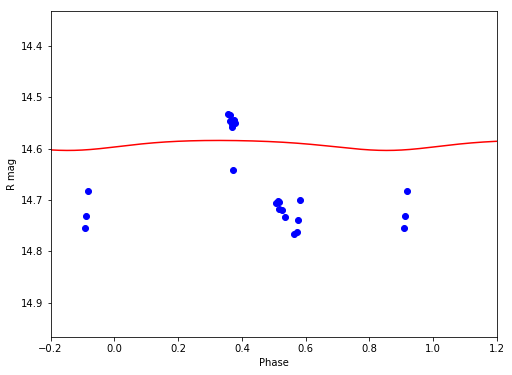

R 14.5922824905 0.0194147065547


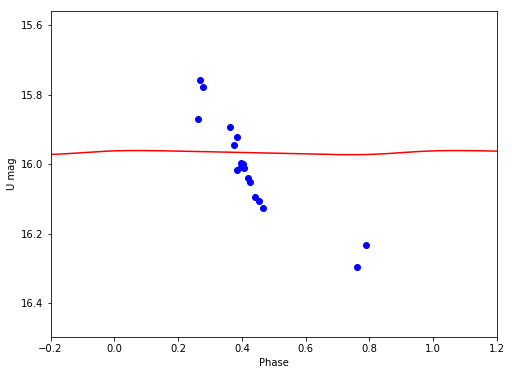

U 15.966067238 0.0119289496276


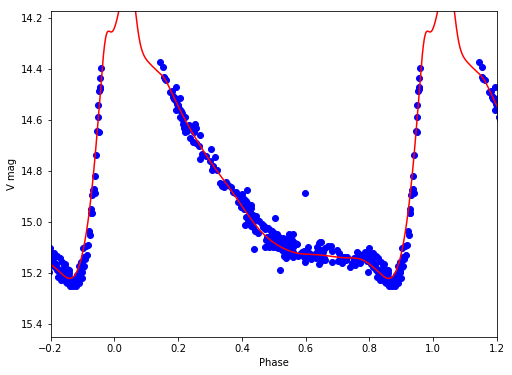

V 14.7735418952 1.1847742159
V76
/Volumes/Annie/CRRP/NGC3201/lcvs/V76.phased


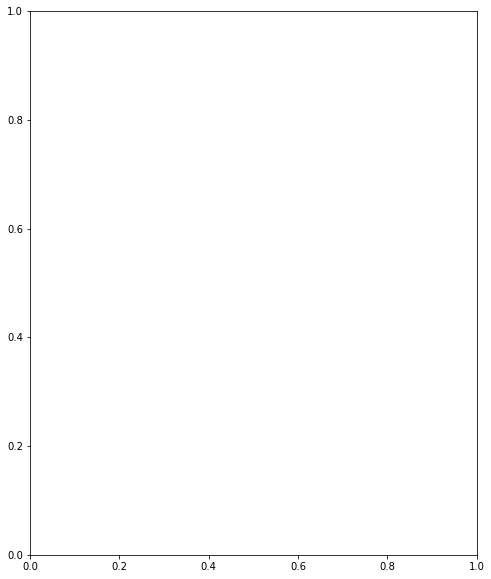

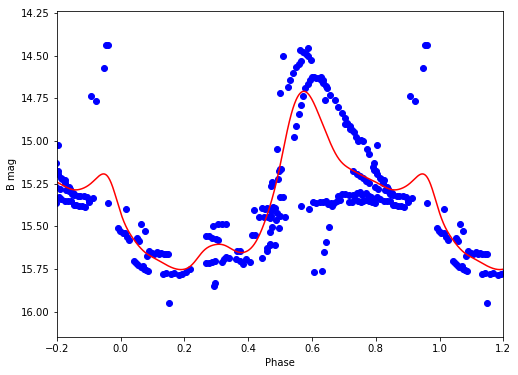

B 15.314027979 1.04435154322


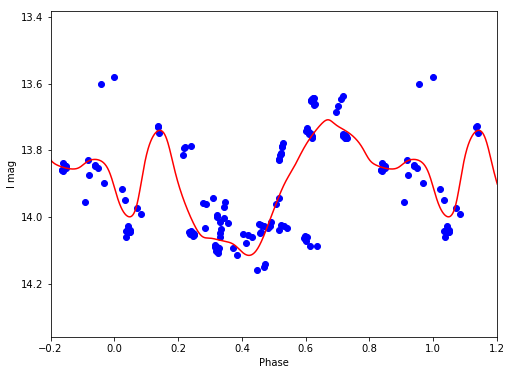

I 13.888895717 0.406597156881


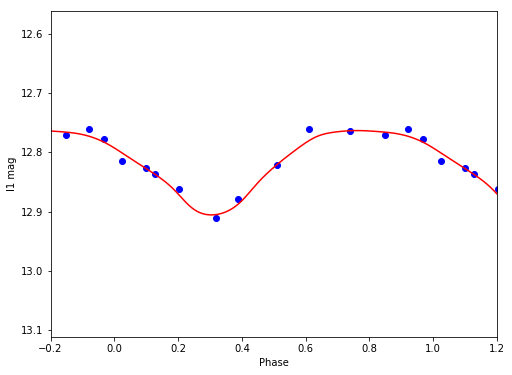

I1 12.8173737975 0.142223158692


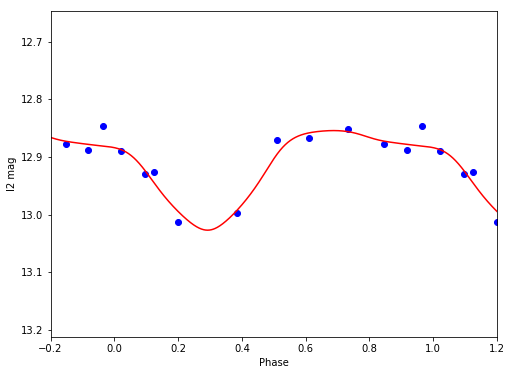

I2 12.9157723832 0.172832076883


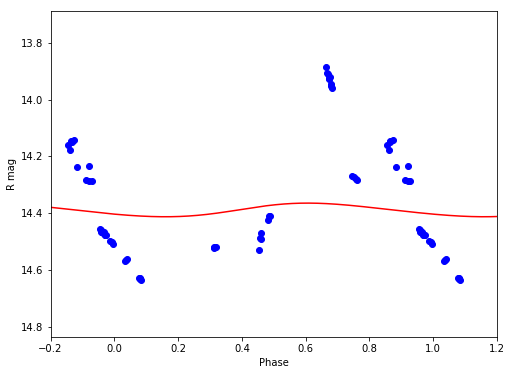

R 14.3888913727 0.0480265096472


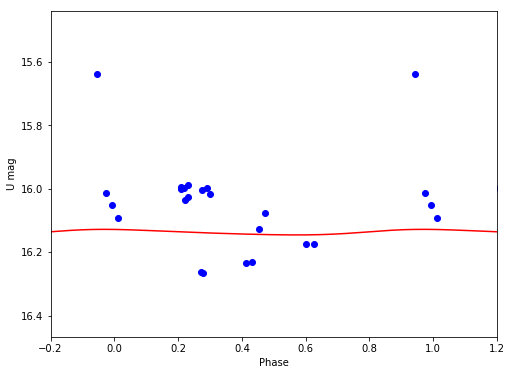

U 16.1368583369 0.0175676752792


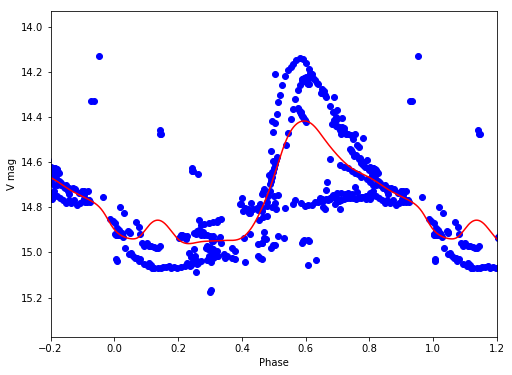

V 14.7522501249 0.54354242051
V77
/Volumes/Annie/CRRP/NGC3201/lcvs/V77.phased


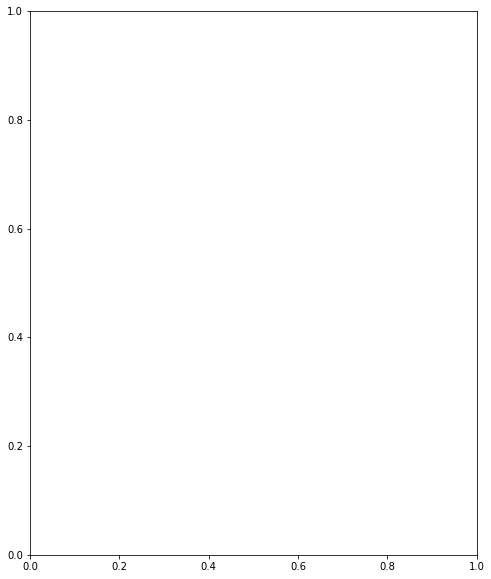

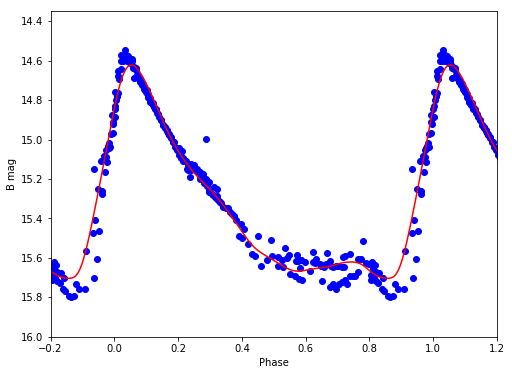

B 15.2917206628 1.08230209676


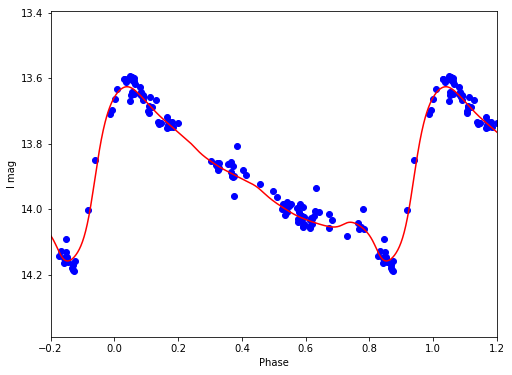

I 13.896703217 0.532635040669


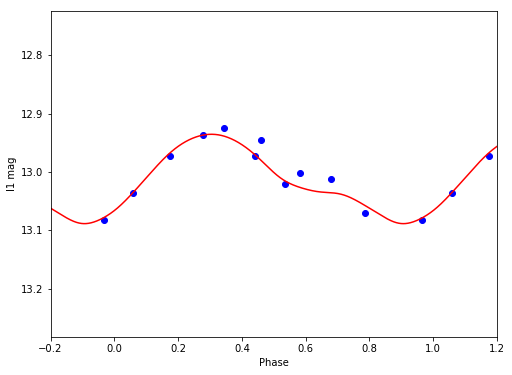

I1 13.0126899801 0.152885061012


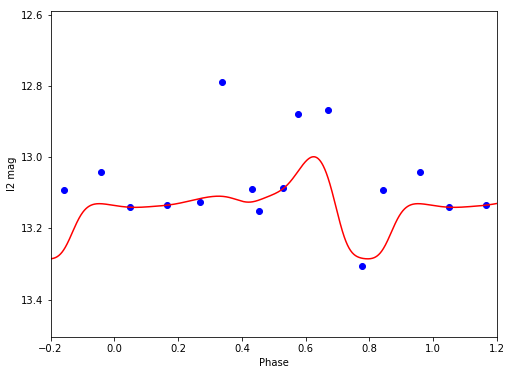

I2 13.1338941523 0.286444891999


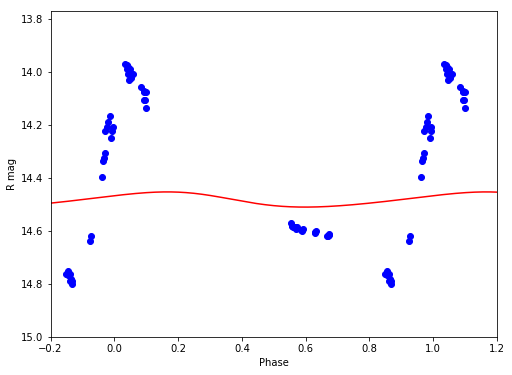

R 14.4834879314 0.0573435299009


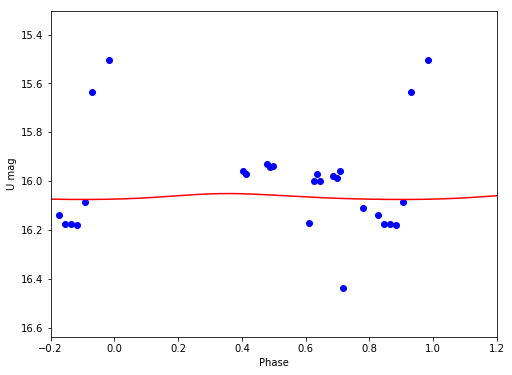

U 16.0644609786 0.0242145185059


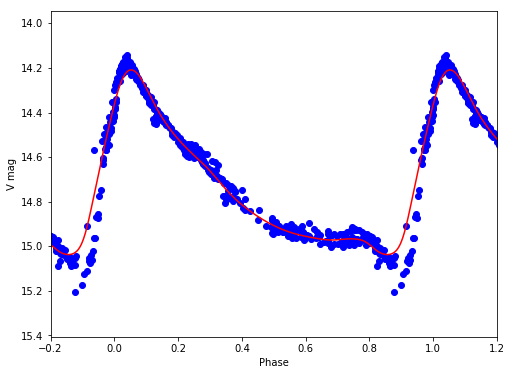

V 14.7118739787 0.828175030813
V78
/Volumes/Annie/CRRP/NGC3201/lcvs/V78.phased


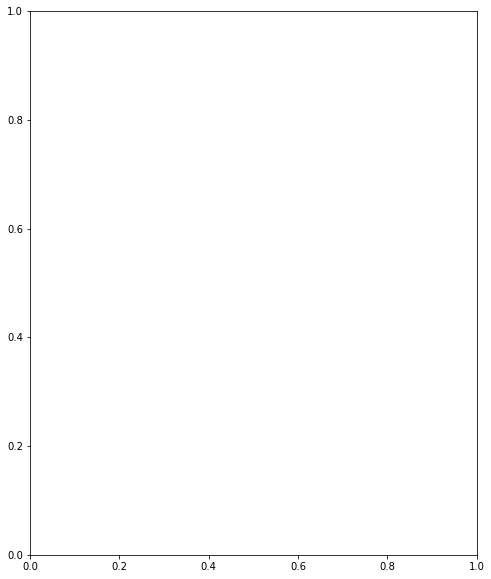

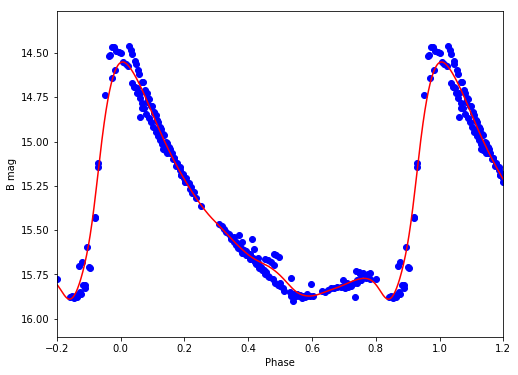

B 15.3597947319 1.33947520741


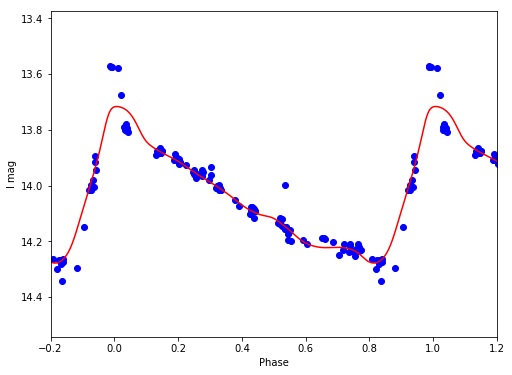

I 14.0311554852 0.561519405875


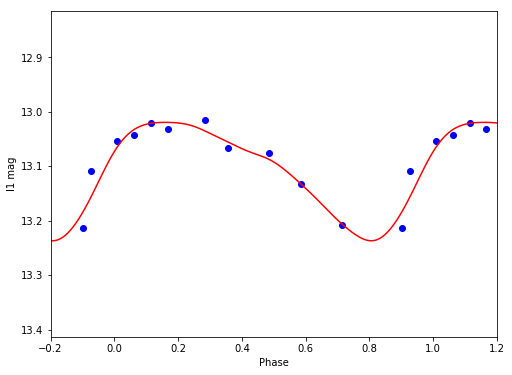

I1 13.1050014075 0.217479027481


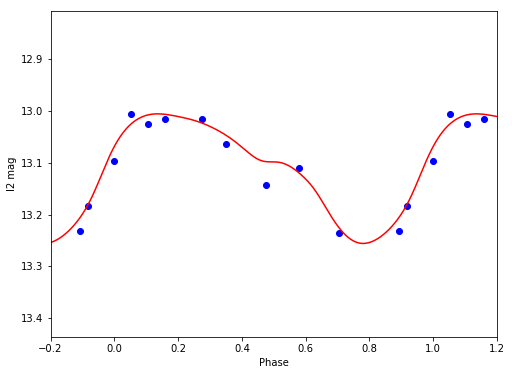

I2 13.1058592171 0.250296763553


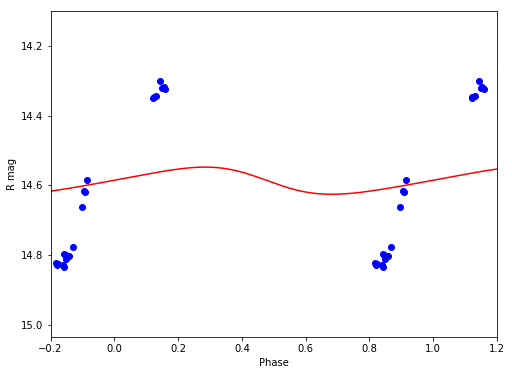

R 14.586843483 0.0777272285679


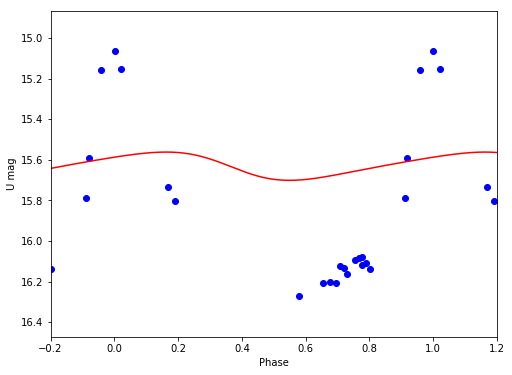

U 15.6273481975 0.139375809843


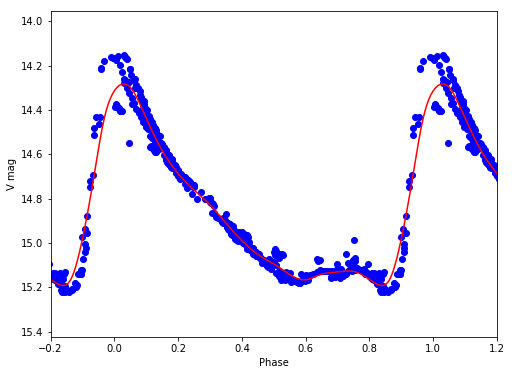

V 14.8368877879 0.909174209793
V80
/Volumes/Annie/CRRP/NGC3201/lcvs/V80.phased


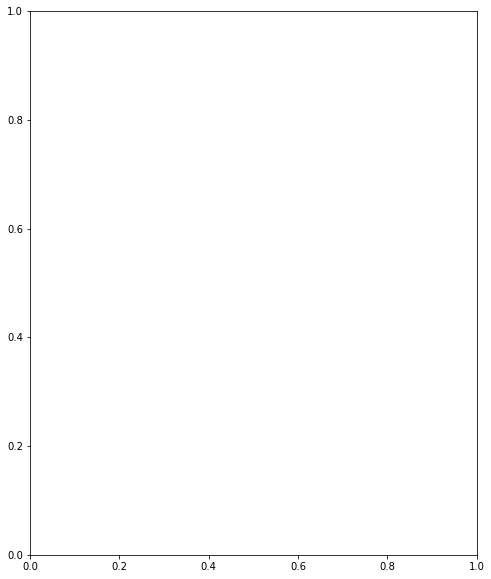

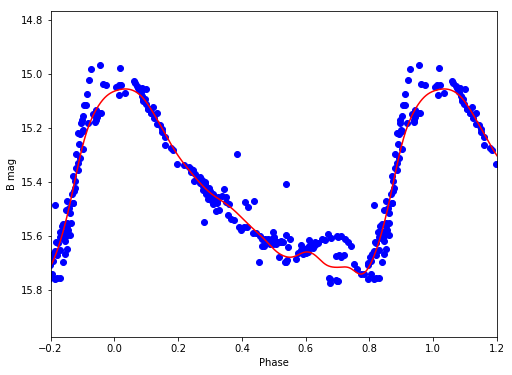

B 15.4195041346 0.683926210295


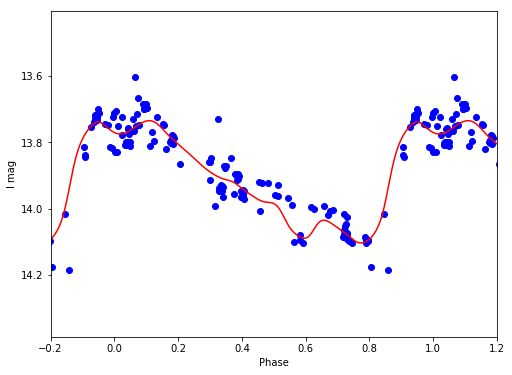

I 13.907230879 0.368035842326


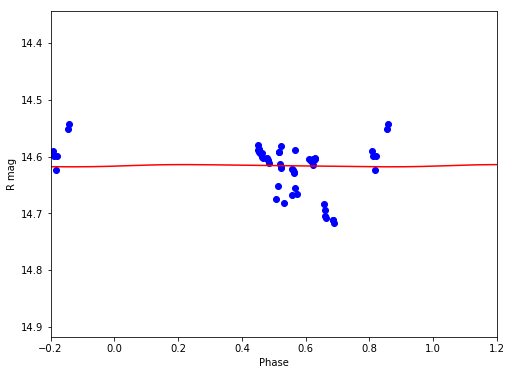

R 14.6159174376 0.00386457430962


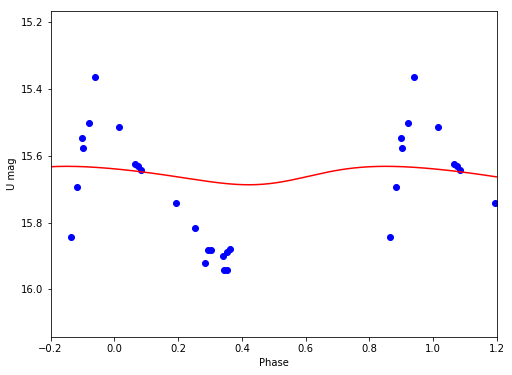

U 15.6566208215 0.0552020084339


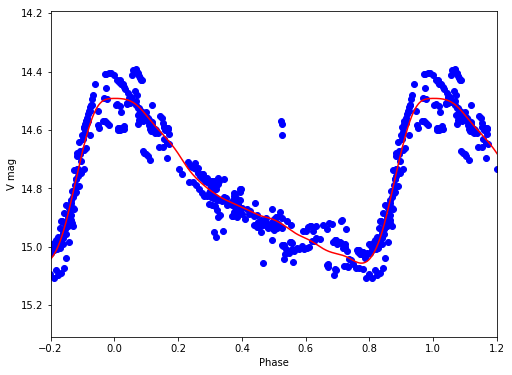

V 14.7847892975 0.564232210449
V81
/Volumes/Annie/CRRP/NGC3201/lcvs/V81.phased


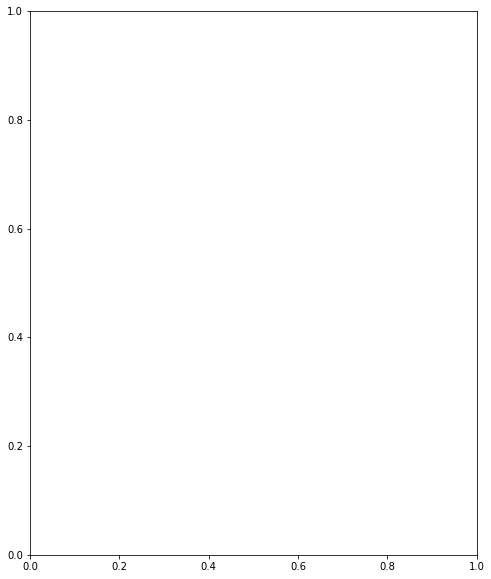

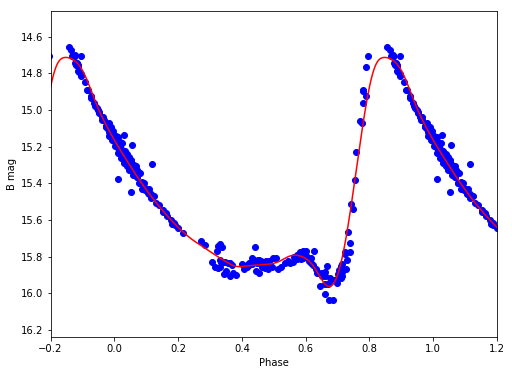

B 15.4321014464 1.24890717535


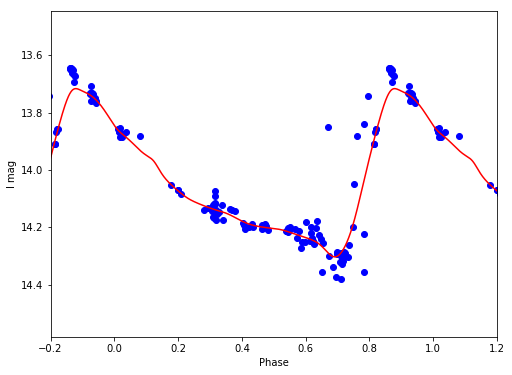

I 14.0430012395 0.585893166473


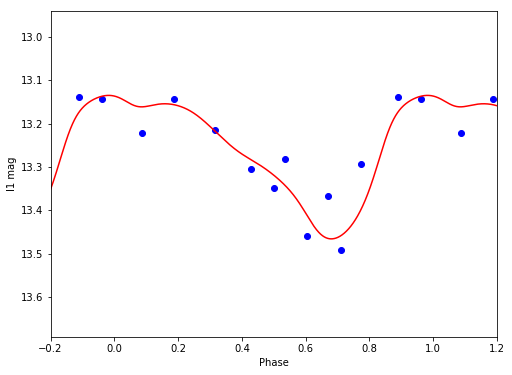

I1 13.2578465286 0.331247802468


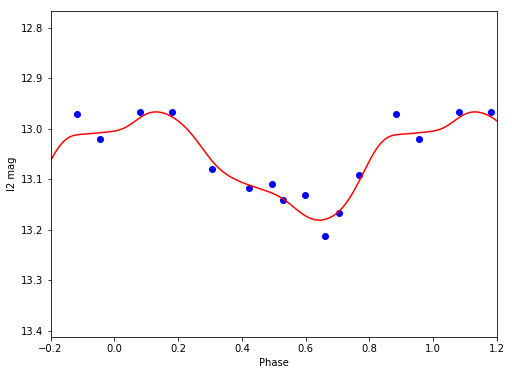

I2 13.064298937 0.21433300681


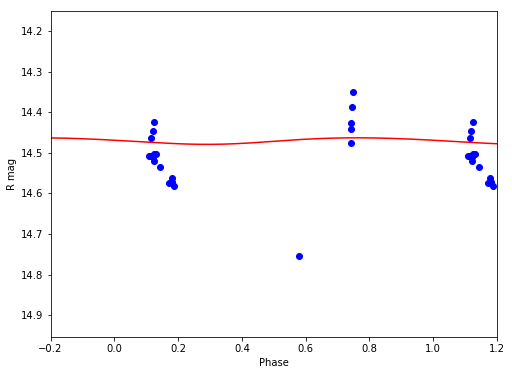

R 14.4706773492 0.0161026203044


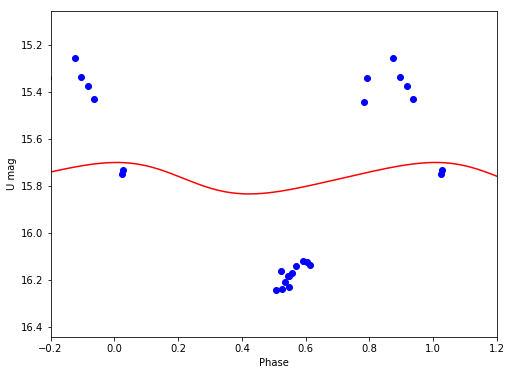

U 15.7664583765 0.133701433595


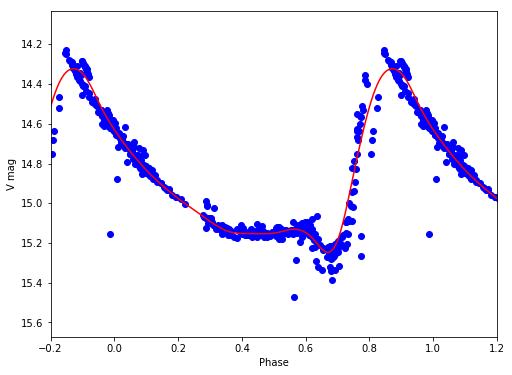

V 14.8615379413 0.924161687247
V83
/Volumes/Annie/CRRP/NGC3201/lcvs/V83.phased


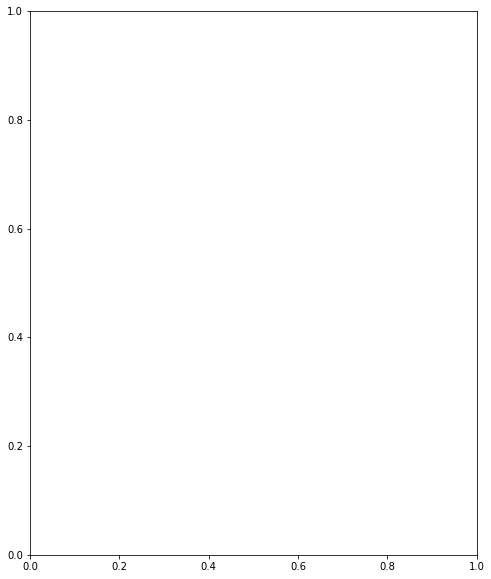

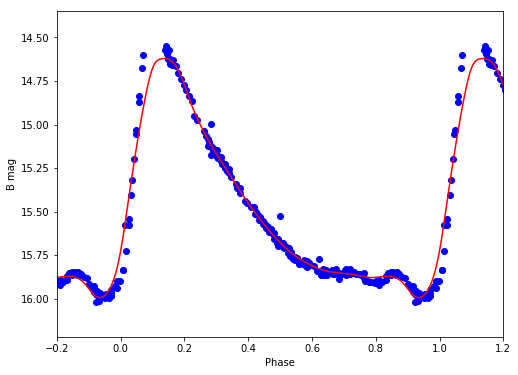

B 15.3992387837 1.37143401615


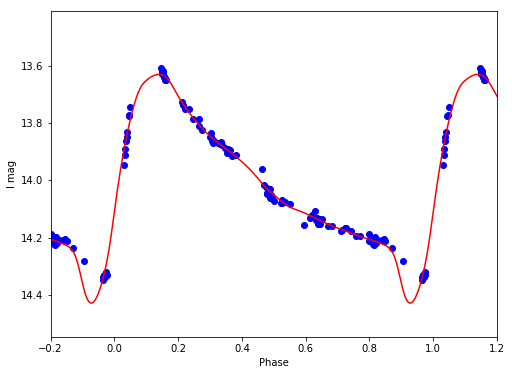

I 13.9912581898 0.799264851324


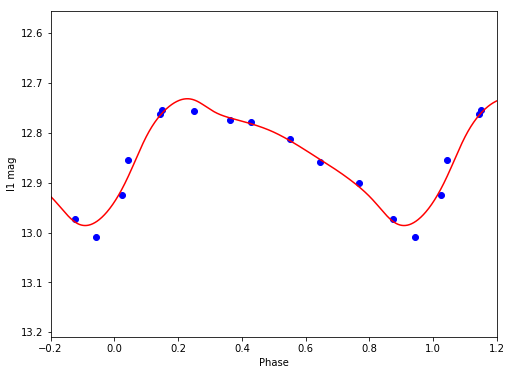

I1 12.840519467 0.254247551685


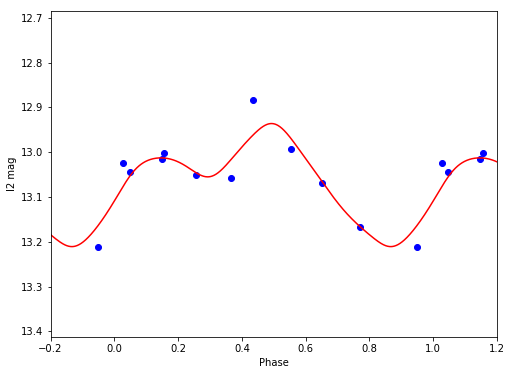

I2 13.0612049788 0.274701068763


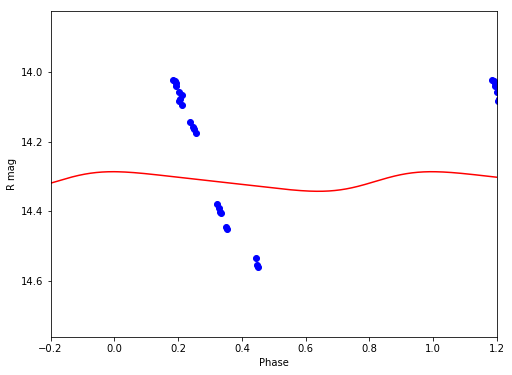

R 14.3146764793 0.056407165698


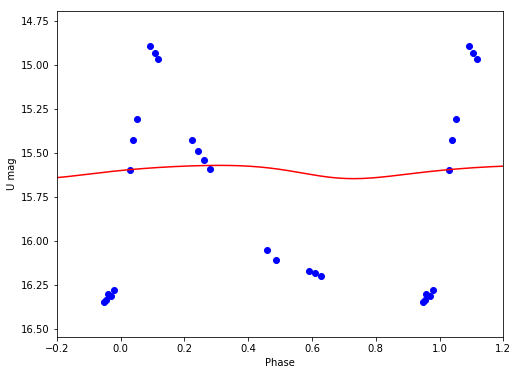

U 15.604362669 0.0754137402573


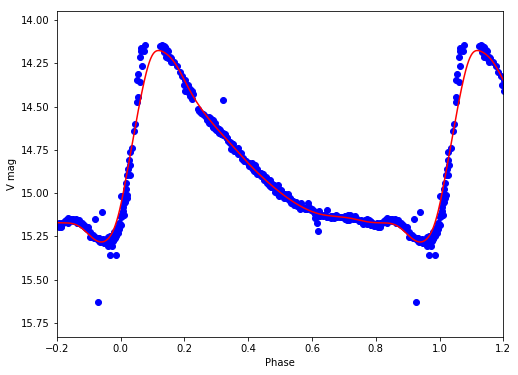

V 14.8155486874 1.10597744475
V84
/Volumes/Annie/CRRP/NGC3201/lcvs/V84.phased


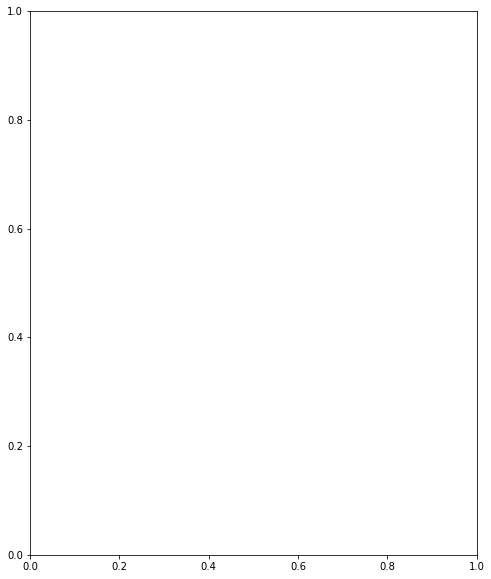

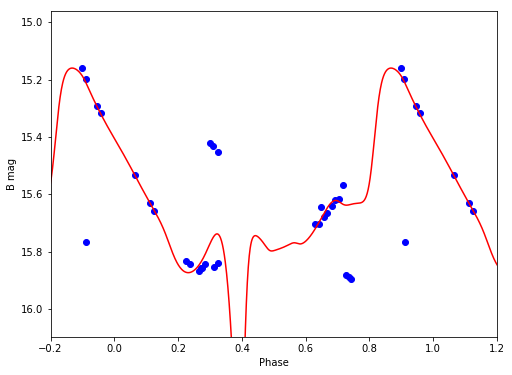

B 15.625225607 1.41480538649


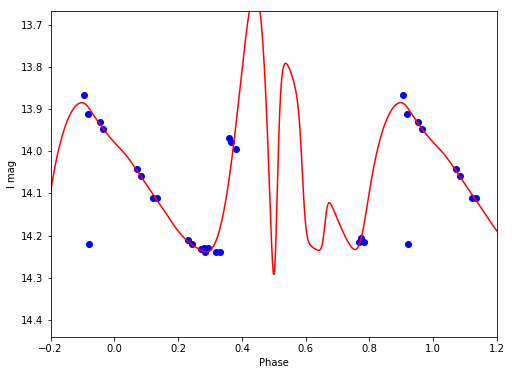

I 14.0330307797 0.669953387644


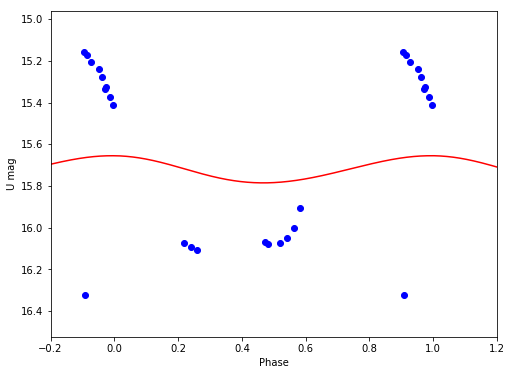

U 15.7198835072 0.130239073702


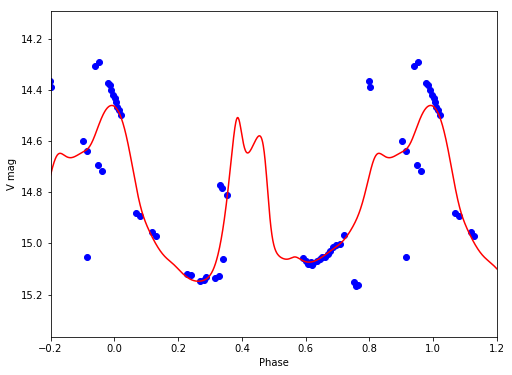

V 14.8337305264 0.687230080777
V90
/Volumes/Annie/CRRP/NGC3201/lcvs/V90.phased


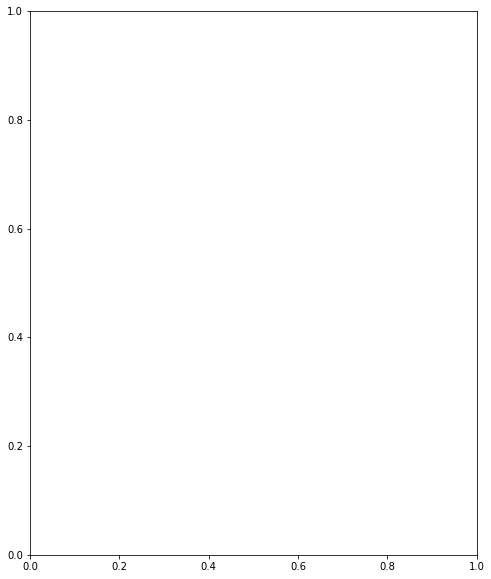

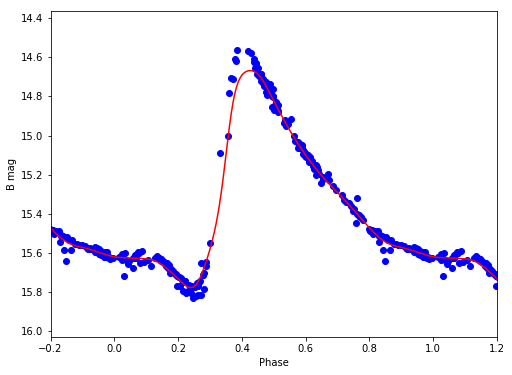

B 15.2954056492 1.10838400415


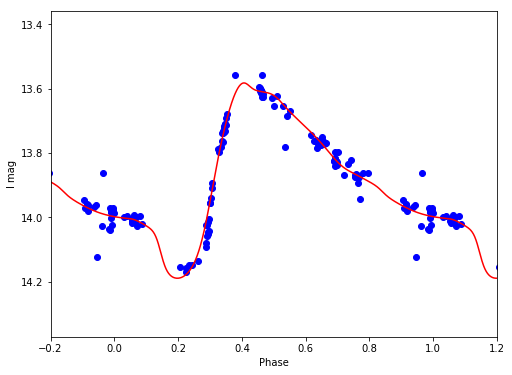

I 13.8631923686 0.607139974914


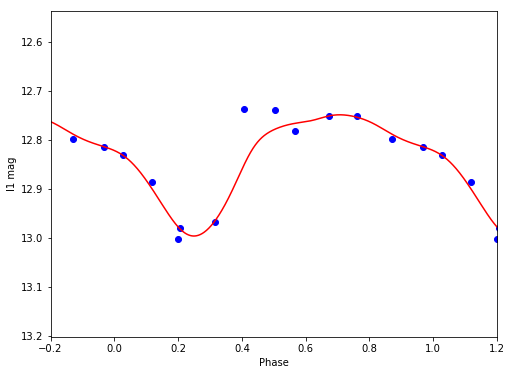

I1 12.8340515354 0.247536443519


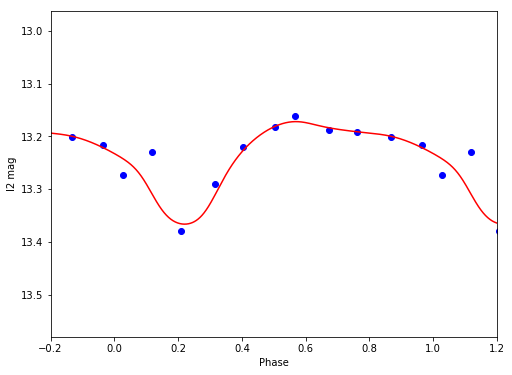

I2 13.2365913247 0.193947544279


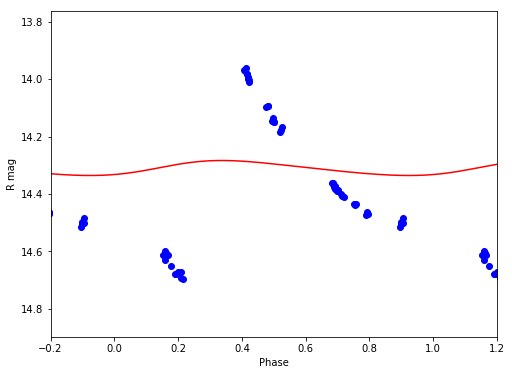

R 14.3103135693 0.0522125471219


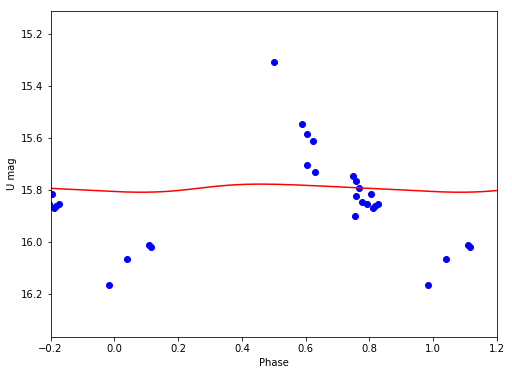

U 15.7931785429 0.0312562130505


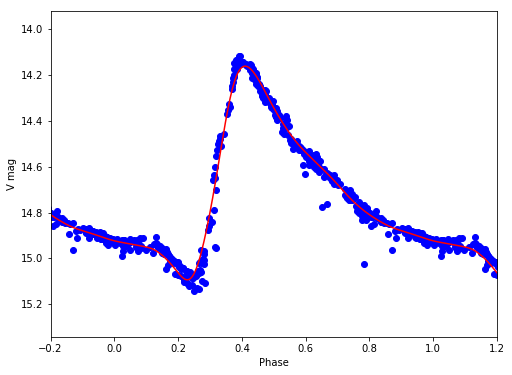

V 14.6801392781 0.933424551768
V92
/Volumes/Annie/CRRP/NGC3201/lcvs/V92.phased


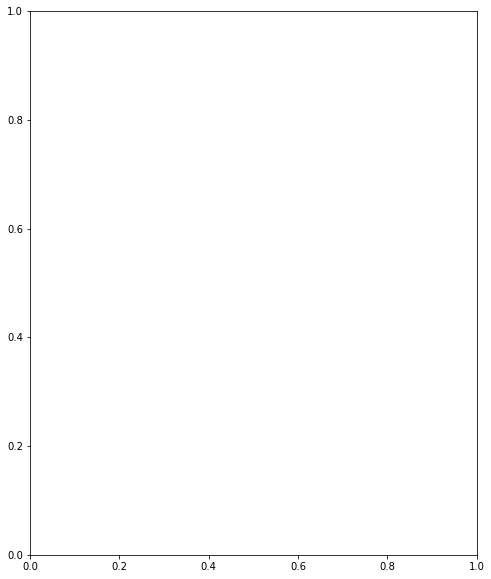

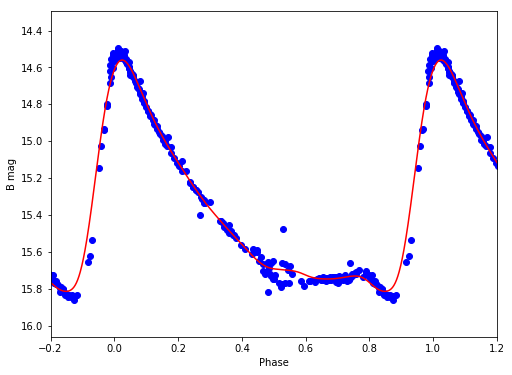

B 15.3229449301 1.25307777115


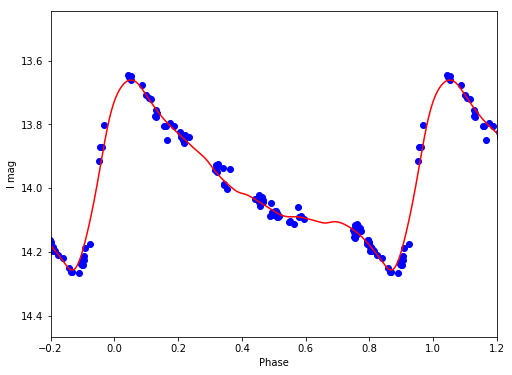

I 13.9722736999 0.594045202086


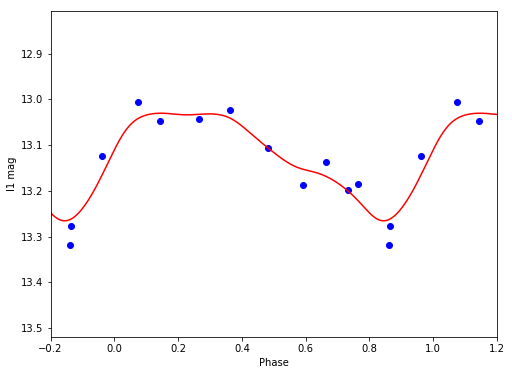

I1 13.1178172351 0.235165891535


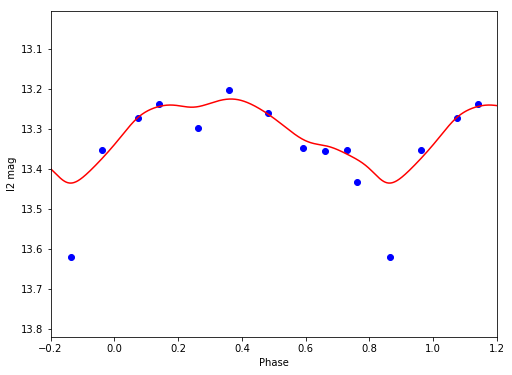

I2 13.3054026051 0.210592010194


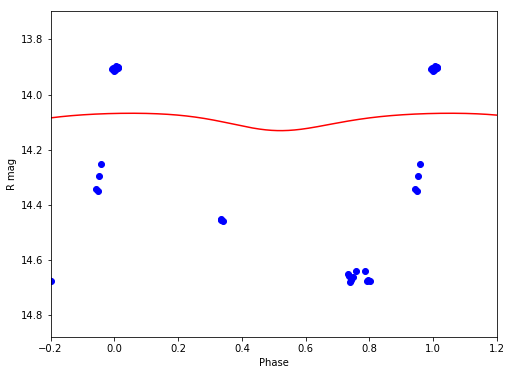

R 14.0928749175 0.0629851379217


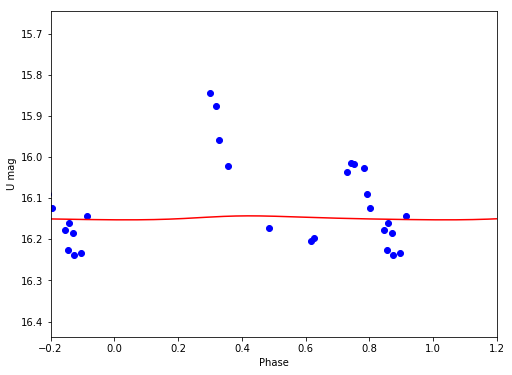

U 16.1484767757 0.00968569604434


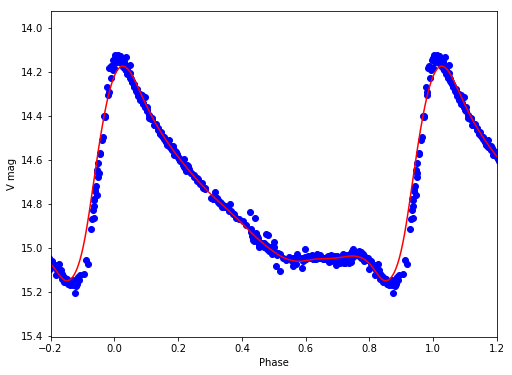

V 14.7543090273 0.975216240972
V98
/Volumes/Annie/CRRP/NGC3201/lcvs/V98.phased


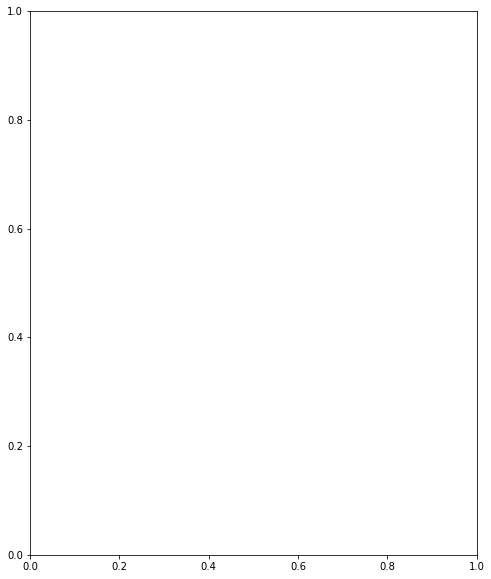

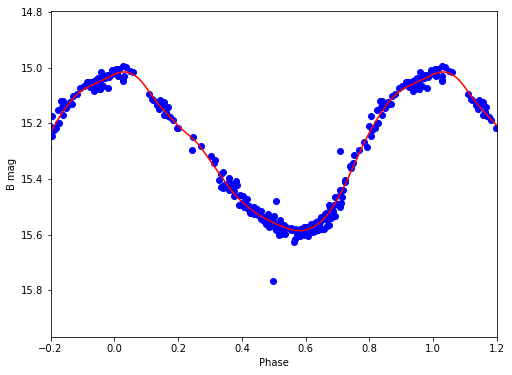

B 15.2860206709 0.570798561875


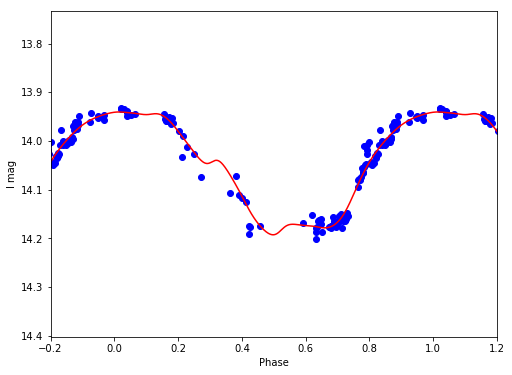

I 14.0514797993 0.25229326077


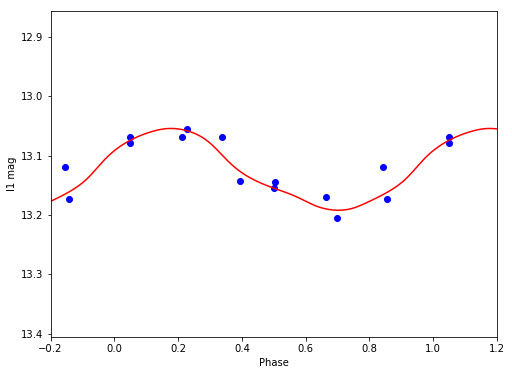

I1 13.1253252572 0.137649052459


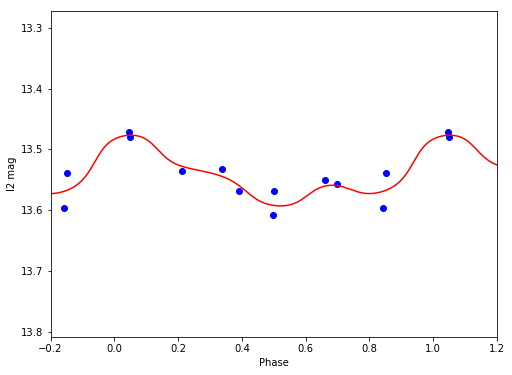

I2 13.5440667818 0.116160694079


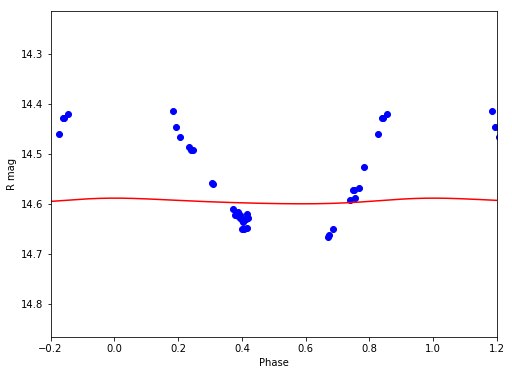

R 14.594138723 0.0113263793981


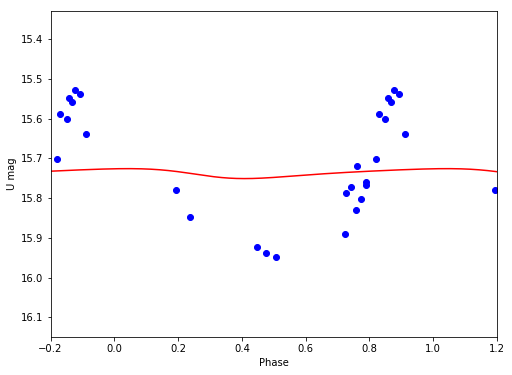

U 15.7368289504 0.0250166393692


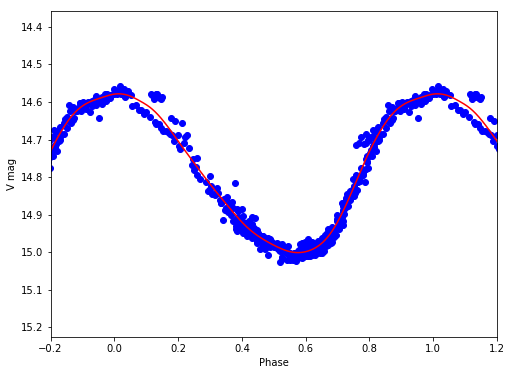

V 14.776266671 0.422573183036
V100
/Volumes/Annie/CRRP/NGC3201/lcvs/V100.phased


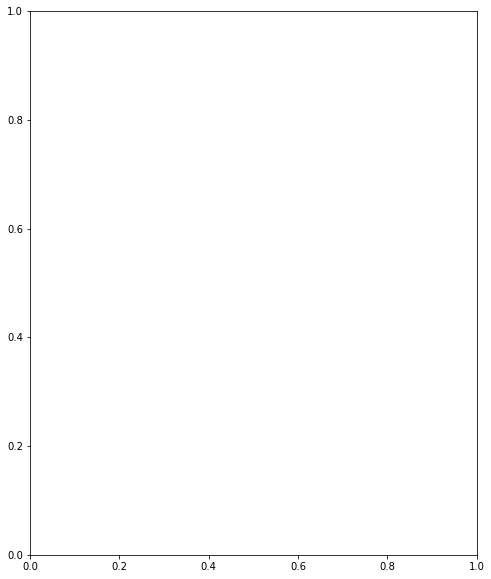

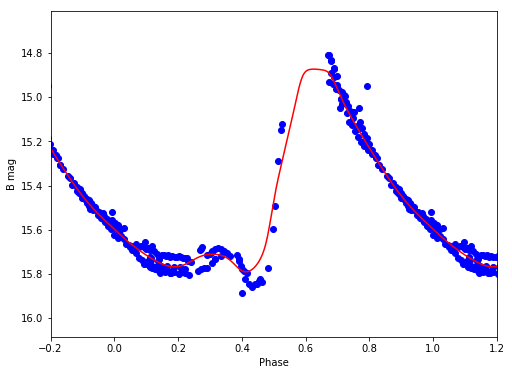

B 15.4130728612 0.917227164675


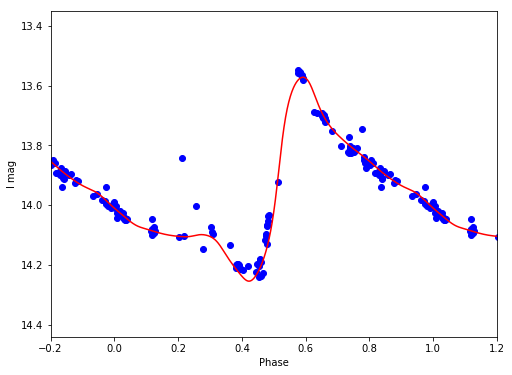

I 13.9495609587 0.682181800876


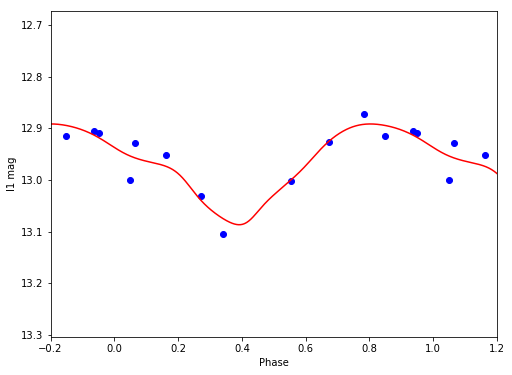

I1 12.9721077675 0.195227144776


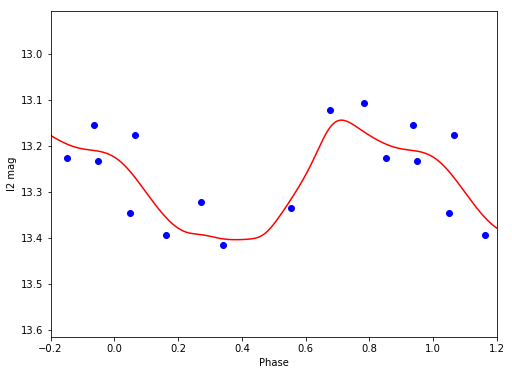

I2 13.2829479775 0.259868081614


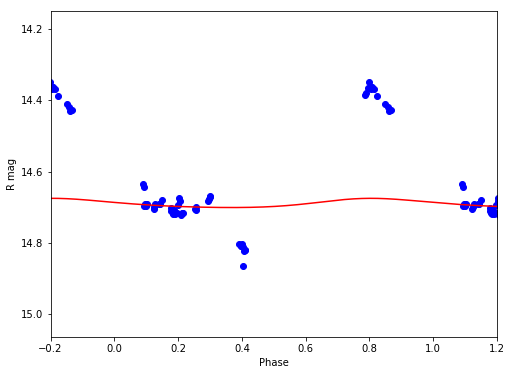

R 14.6901395198 0.0258365388678


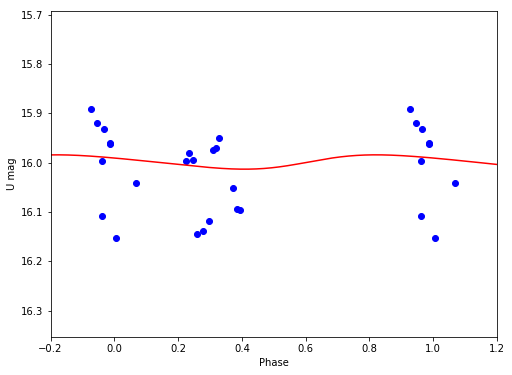

U 15.9983309513 0.029039855514


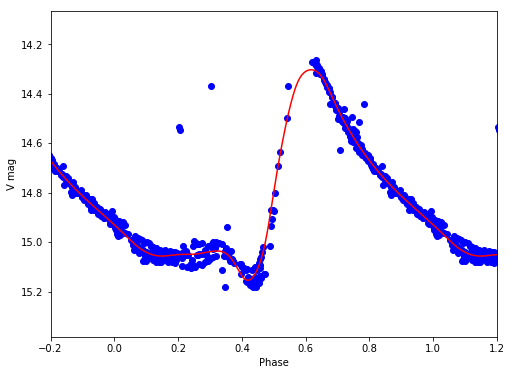

V 14.7902922833 0.851875960041
C1
/Volumes/Annie/CRRP/NGC3201/lcvs/C1.phased


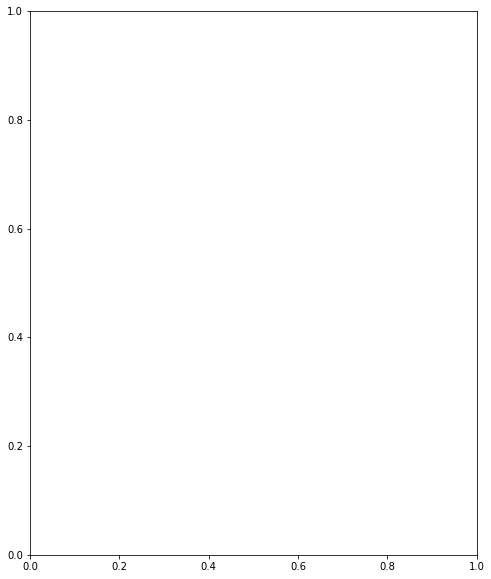

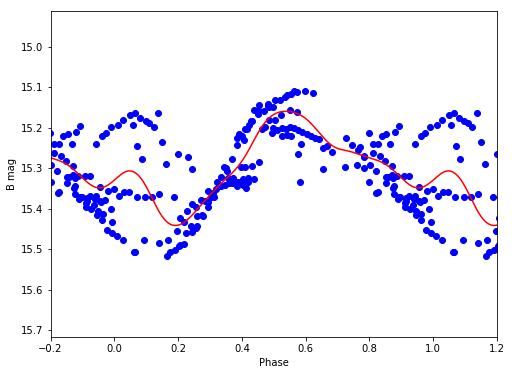

B 15.2925784199 0.282434765645


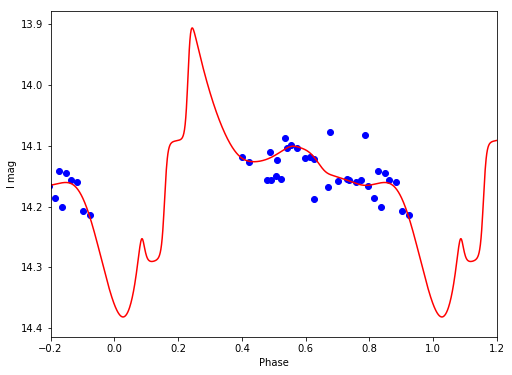

I 14.1516653092 0.474975833094


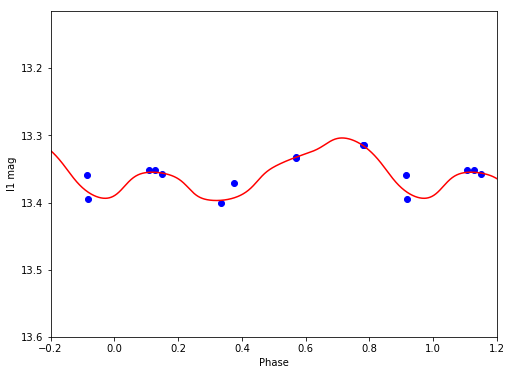

I1 13.3569433368 0.0931854188925


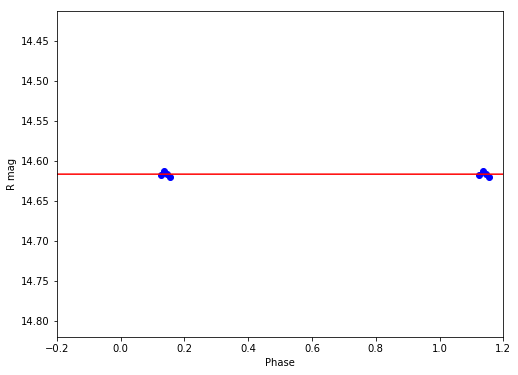

R 14.6165610073 5.69429277117e-05


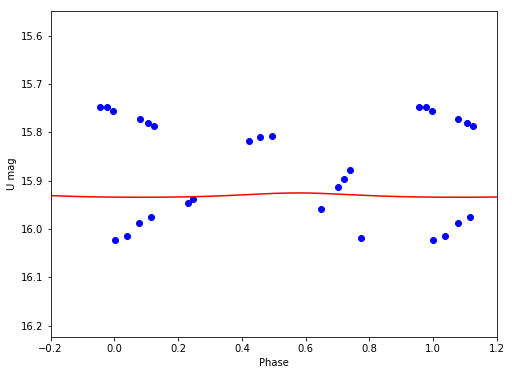

U 15.9306112766 0.00890599080374


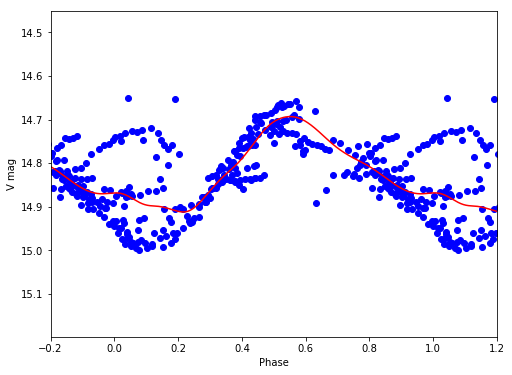

V 14.8141434186 0.218775219607


In [3]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables.txt', dtype=dtype1, usecols=(0,1,2))
sp = np.array([0.9, 0.1, 0.1, 0.9, 0.1, 0.9, 0.9, 0.9, 0.2, 0.2])
f = open(folder+'avg_mags_test.txt', 'w')
#star = 'V10'

for ind, star in enumerate(data['id']):
    print star
    try:
        r1, r2, r3, r4 = lightcurves.gloess(folder+'lcvs/'+star+'.phased', smoothing_params=sp, plot_save=1, clean=1)
        datasave = np.array(zip(np.repeat(star, len(r1)), r1, np.repeat(data['new_period'][ind], len(r1)), r2, r3, r4), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %4.2f %4.2f')
    except:
        continue
f.close()

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in divide


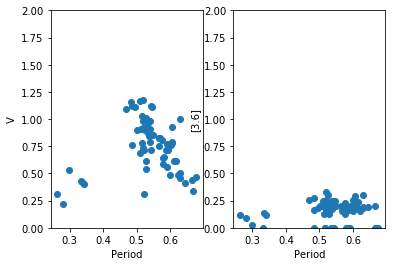

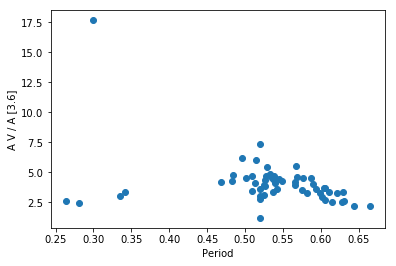

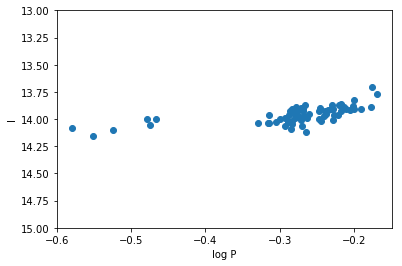

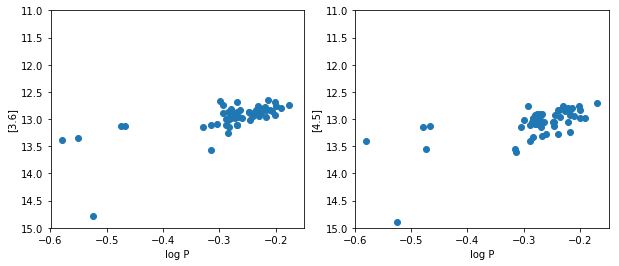

In [5]:
dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags_test.txt', dtype=dtype, usecols=(0,1,2,3,4))

per = data['period'][data['filt'] == 'V']
Vamp = data['amp'][data['filt'] == 'V']
I1amp = data['amp'][data['filt'] == 'I1']

# Bailey diagram
x = data['period'][data['filt'] == 'V']
y = data['amp'][data['filt'] == 'V']
fig = mp.figure()
ax = fig.add_subplot(121)
ax.plot(per, Vamp, 'o')
ax.set_ylim((0,2))
ax.set_xlabel('Period')
ax.set_ylabel('V')
ax2 = fig.add_subplot(122)
ax2.plot(per, I1amp, 'o')
ax2.set_ylim((0,2))
ax2.set_xlabel('Period')
ax2.set_ylabel('[3.6]')


# amplitude ratio 

R_amp = Vamp/I1amp

fig3 = mp.figure()
ax4 = fig3.add_subplot(111)
ax4.plot(per, R_amp, 'o')
ax4.set_xlabel('Period')
ax4.set_ylabel('A V / A [3.6]')

# I band PL relation
fig5 = mp.figure()
ax5 = fig5.add_subplot(111)
Iper = data['period'][data['filt'] == 'I']
Imag = data['avg'][data['filt'] == 'I']
ax5.plot(np.log10(Iper), Imag, 'o')
ax5.set_ylim((15,13))
ax5.set_xlabel('log P')
ax5.set_ylabel('I')

# IRAC PL relation
fig2 = mp.figure(figsize=(10,4))
ax1 = fig2.add_subplot(121)
ax2 = fig2.add_subplot(122)
x2 = data['period'][data['filt'] == 'I1']
y2 = data['avg'][data['filt'] == 'I1']
x3 = data['period'][data['filt'] == 'I2']
y3 = data['avg'][data['filt'] == 'I2']
ax1.plot(np.log10(x2), y2, 'o')
ax1.set_ylim((15,11))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
ax2.plot(np.log10(x3), y3, 'o')
ax2.set_ylim((15,11))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

[]


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in less
  # Remove the CWD from sys.path while we load stuff.
/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in less
  # This is added back by InteractiveShellApp.init_path()


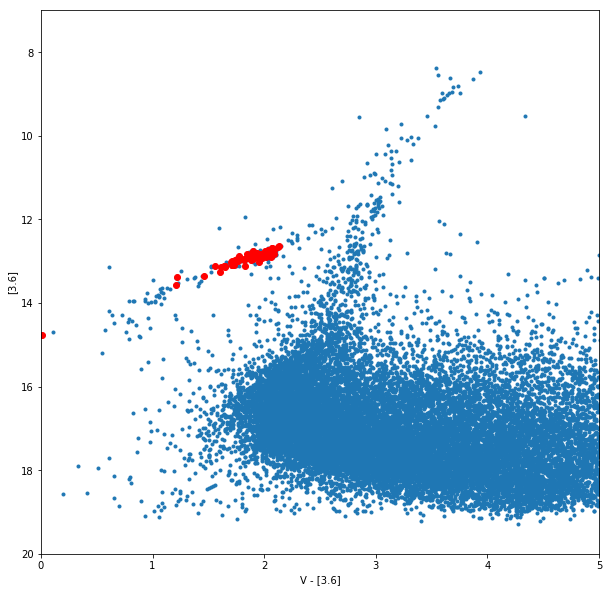

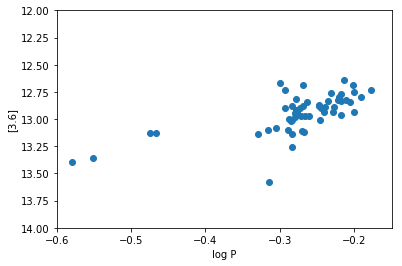

In [6]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data, dist = analysis_routines.read_merged_catalog(folder, center_ra, center_dec)

thres = 500
color = catalog_data['V'][dist < thres] - catalog_data['3.6'][dist < thres]
mag = catalog_data['3.6'][dist < thres]
err = catalog_data['3.6er'][dist < thres]

good_mag = mag[err < 0.02]
good_color = color[err < 0.02]

fig2 = mp.figure(figsize=(10,10))
ax2 = fig2.add_subplot(111)
ax2.plot(good_color, good_mag, '.')
ax2.set_ylim((20,7))
ax2.set_xlim((0,5))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags_test.txt', dtype=dtype, usecols=(0,1,2,3,4))

var_color = data['avg'][data['filt'] == 'V'] - data['avg'][data['filt'] == 'I1']
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']

bad_id = np.array([])
bad_color = np.array([])
bad_mag = np.array([])
bad_per = np.array([])
for ind, star in enumerate(var_id):
    if var_color[ind] >= 3.0 and var_mag[ind] > 1 : 
        bad_id = np.append(bad_id, star)
        bad_color = np.append(bad_color, var_color[ind])
        bad_mag = np.append(bad_mag, var_mag[ind])
        bad_per = np.append(bad_per, var_period[ind])
        
print bad_id
ax2.plot(var_color, var_mag, 'o', color='r')
ax2.plot(bad_color, bad_mag, 'x', color='k')

fig3 = mp.figure()
ax3 = fig3.add_subplot(111)
ax3.plot(np.log10(var_period), var_mag, 'o')
ax3.plot(np.log10(bad_per), bad_mag, 'x', color='k')
ax3.set_ylim((14,12))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')